In [1]:
import sys, os
import json, pickle
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import time as pytime
import statsmodels.tsa.stattools as tsa
import ruptures as rpt
sys.path.append('../../..')
import InsanallyLabEphysTools as ilep
from scipy.stats import gaussian_kde, sem, ttest_ind, ttest_rel, norm, mannwhitneyu, linregress, wilcoxon
from tqdm import tqdm
from types import SimpleNamespace
from sklearn import linear_model
from sklearn.model_selection import KFold
import seaborn as sns
import traceback
from itertools import product

plt.rcParams['legend.fontsize'] = 'small'
plt.rcParams['axes.labelsize'] = 'medium'
plt.rcParams['axes.formatter.limits'] = [-2,3]
plt.rcParams['axes.formatter.use_mathtext'] = True
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['figure.dpi'] = '150'

#Set global font parameters
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
#Set font type to TrueType for compatibility
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

TARGET_COLOR = '#ff3654'
NONTARGET_COLOR = '#5776ff'

CR_COLOR = '#808080'
NCR_COLOR = '#FF767C'
CNO_COLOR = '#00BFFF'
SWITCH_COLOR = '#B07A3B'
LASER_COLOR = '#3375E9'
GOOD_GREY = '#969696'
GOOD_GREEN = '#32A852'
NCR_COLOR_DESAT = '#D98C90'
CR_COLOR_DESAT = '#A0A0A0'
NCR_CR_cmap = mpl.colors.LinearSegmentedColormap.from_list('NCR-CR color map', [NCR_COLOR, CR_COLOR], N=1000)
PHASE_COLORS = ['#DEB9E0','#B78AB9','#906D92','#ABC5E8','#869BB7','#5E6C80']


BS_animal_M2 = ['BS_40','BS_41','BS_42','BS_49','BS_50','BS_51','BS_56','BS_59','BS_67','BS_70','BS_72','BS_87','BS_108']
animals = ['BS_40','BS_41','BS_42','BS_49','BS_50','BS_51','BS_56','BS_59','BS_67','BS_70','BS_72','BS_87','BS_108','DS_15','DS_19']

act_directory = 'D:\\Analysis_Cache_M2_300'
ops_directory = 'D:\\Opsin_Cache'
beh_directory = 'Z:\\Behavioor'

stdfont = 14
stdyfrac = 0.06

M2_FRmod_baseline_median = 2.3
AC_FRmod_baseline_median = 3.5

import scipy

C:\Users\insan\anaconda3\envs\Ephyanalysis\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.3, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [2]:
plt.rcParams['legend.fontsize'] = 'small'
plt.rcParams['axes.labelsize'] = 'medium'
plt.rcParams['axes.formatter.limits'] = [-2,3]
plt.rcParams['axes.formatter.use_mathtext'] = True
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['figure.dpi'] = '150'

#Set global font parameters
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
plt.rcParams['font.weight'] = 'light'
#Set font type to TrueType for compatibility
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42



In [3]:
animalBehaviors = ilep.getAllBehavior(beh_directory)

Fetching files for BS_51
Fetching files for BS_52
Fetching files for BS_56
Fetching files for BS_59
Fetching files for BS_61
Fetching files for BS_86
Fetching files for BS_92
Fetching files for BS_100
Fetching files for BS_103
Fetching files for BS_111
Fetching files for BS_119
Fetching files for BS_123
Fetching files for BS_128
Fetching files for BS_131
Fetching files for BS_139
Fetching files for BS_163
Fetching files for BS_165
Fetching files for BS_174
Fetching files for BS_179
Fetching files for BS_191
Fetching files for BS_192
Fetching files for BS_33
Fetching files for BS_67
Fetching files for BS_73
Fetching files for BS_78
Fetching files for BS_108
Fetching files for BS_40
Fetching files for BS_41
Fetching files for BS_42
Fetching files for BS_49
Fetching files for BS_50
Fetching files for BS_70
Fetching files for BS_72
Fetching files for BS_83
Fetching files for BS_85
Fetching files for BS_87
Fetching files for BS_95
Fetching files for BS_113
Fetching files for DS_15
Fetching 

C:\Users\insan\Desktop\EphysAnalysis\Notebooks\TH\Dual\../../..\InsanallyLabEphysTools\behavior.py:94: RuntimeWarning: invalid value encountered in long_scalars
  pc = (hit+creject)/(hit+miss+falarm+creject)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite v

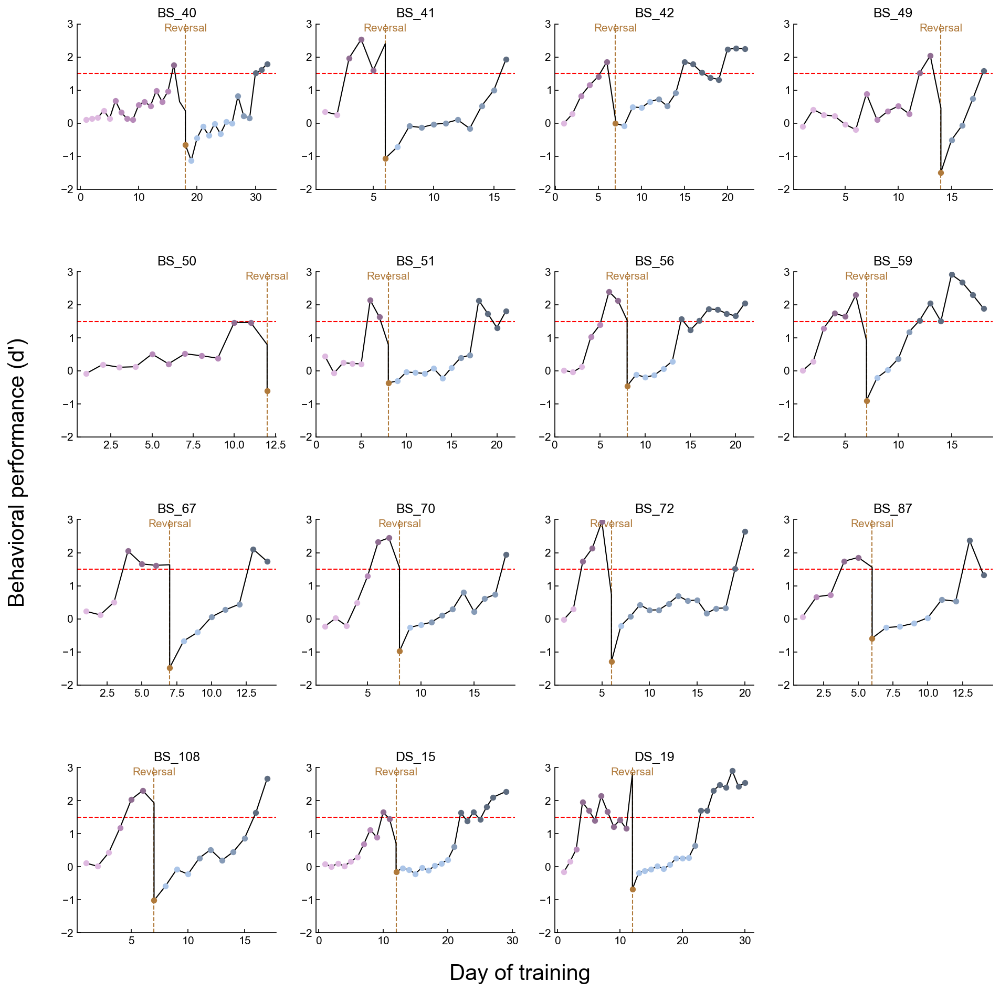

In [4]:
learning_phases,_,_ = ilep.calculateLearningPhasesV2(animals,animalBehaviors,plot=True)

In [5]:
EnumACSession = []
EnumACClust = []
EnumM2Session = []
EnumM2Clust = []

sessions = os.listdir(act_directory)

numAC = 0
numM2 = 0

for session in tqdm(sessions):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    if sessionfile.meta.task in ['passive no beahvior']:
        continue
    if sessionfile.meta.task in ['tuning nonreversal','tuning switch','tuning reversal']:
        continue
    if sessionfile.meta.task in ['opto nonreversal','opto switch','opto reversal']:
        continue
    if sessionfile.meta.task in ['opto control nonreversal','opto control switch','opto control reversal']:
        continue
    
    if sessionfile.meta.animal not in animals:
        continue
    
    #attribute neurons based on the region
    if sessionfile.meta.region == 'AC':
        numAC += len(sessionfile.clusters.good)
        
        for clust in sessionfile.clusters.good:
            EnumACSession.append(session)
            EnumACClust.append(clust)
            
    elif sessionfile.meta.region == 'M2':
        numM2 += len(sessionfile.clusters.good)
        
        for clust in sessionfile.clusters.good:
            EnumM2Session.append(session)
            EnumM2Clust.append(clust)    
    else:
        pass

        
print('AC       : ' + str(numAC))
print('M2       : ' + str(numM2))

100%|██████████| 554/554 [00:14<00:00, 38.24it/s]

AC       : 1831
M2       : 1624


In [6]:
EILM2phases = np.full_like(EnumM2Session,np.nan)
error_animals = []

for idx,session in enumerate(tqdm(EnumM2Session)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        if sessionfile.meta.task in ['switch']:
            EILM2phases[idx] = 'switch'

        elif sessionfile.meta.task in ['nonreversal'] and day in learning_phases[animal].pre_early_days:
            EILM2phases[idx] = 'pre early'
        elif sessionfile.meta.task in ['nonreversal']  and day in learning_phases[animal].pre_late_days:
            EILM2phases[idx] = 'pre late'
        elif sessionfile.meta.task in ['nonreversal'] and day in learning_phases[animal].pre_expert_days:
            EILM2phases[idx] = 'pre expert'

        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_early_days:
            EILM2phases[idx] = 'post early'
        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_late_days:
            EILM2phases[idx] = 'post late'
        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_expert_days:
            EILM2phases[idx] = 'post expert'
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))

100%|██████████| 1624/1624 [00:32<00:00, 49.74it/s] 

errors for: []


In [7]:
EILACphases = np.full_like(EnumACSession,np.nan)
error_animals = []

for idx,session in enumerate(tqdm(EnumACSession)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        if sessionfile.meta.task in ['switch']:
            EILACphases[idx] = 'switch'

        elif sessionfile.meta.task in ['nonreversal'] and day in learning_phases[animal].pre_early_days:
            EILACphases[idx] = 'pre early'
        elif sessionfile.meta.task in ['nonreversal']  and day in learning_phases[animal].pre_late_days:
            EILACphases[idx] = 'pre late'
        elif sessionfile.meta.task in ['nonreversal'] and day in learning_phases[animal].pre_expert_days:
            EILACphases[idx] = 'pre expert'

        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_early_days:
            EILACphases[idx] = 'post early'
        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_late_days:
            EILACphases[idx] = 'post late'
        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_expert_days:
            EILACphases[idx] = 'post expert'
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))

100%|██████████| 1831/1831 [00:35<00:00, 51.41it/s] 

errors for: []


In [8]:
preearly_animals_M2 = []
prelate_animals_M2  = []
preexpert_animals_M2  = []
postearly_animals_M2  = []
postlate_animals_M2  = []
postexpert_animals_M2  = []

FRmod_preearly_M2 = []
FRmod_prelate_M2 = []
FRmod_preexpert_M2 = []
FRmod_postearly_M2 = []
FRmod_postlate_M2 = []
FRmod_postexpert_M2 = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumM2Session,EnumM2Clust))):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    if EILM2phases[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
        continue
    
    try:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        
    except Exception as e:
        FRmod = np.nan
        
    if EILM2phases[idx] == 'pre early':
        FRmod_preearly_M2.append(FRmod)
        preearly_animals_M2.append(sessionfile.meta.animal)   
        
    elif EILM2phases[idx] == 'pre late':
        FRmod_prelate_M2.append(FRmod)
        prelate_animals_M2.append(sessionfile.meta.animal)  
        
    elif EILM2phases[idx] == 'pre expert':
        FRmod_preexpert_M2.append(FRmod)
        preexpert_animals_M2.append(sessionfile.meta.animal)     
        
    elif EILM2phases[idx] == 'post early':
        FRmod_postearly_M2.append(FRmod)
        postearly_animals_M2.append(sessionfile.meta.animal)   
        
    elif EILM2phases[idx] == 'post late':
        FRmod_postlate_M2.append(FRmod)
        postlate_animals_M2.append(sessionfile.meta.animal)    
        
    elif EILM2phases[idx] == 'post expert':
        FRmod_postexpert_M2.append(FRmod)
        postexpert_animals_M2.append(sessionfile.meta.animal)

FRmod_preearly_M2 = np.array(FRmod_preearly_M2)
FRmod_prelate_M2 = np.array(FRmod_prelate_M2)
FRmod_preexpert_M2 = np.array(FRmod_preexpert_M2)
FRmod_postearly_M2 = np.array(FRmod_postearly_M2)
FRmod_postlate_M2 = np.array(FRmod_postlate_M2)
FRmod_postexpert_M2 = np.array(FRmod_postexpert_M2)

1624it [00:32, 50.57it/s] 


In [9]:
preearly_animals_AC = []
prelate_animals_AC  = []
preexpert_animals_AC  = []
postearly_animals_AC  = []
postlate_animals_AC  = []
postexpert_animals_AC  = []

FRmod_preearly_AC = []
FRmod_prelate_AC = []
FRmod_preexpert_AC = []
FRmod_postearly_AC = []
FRmod_postlate_AC = []
FRmod_postexpert_AC = []

for idx,(session,clust) in tqdm(enumerate(zip(EnumACSession,EnumACClust))):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    if EILACphases[idx] not in ['pre expert','post expert'] and sessionfile.meta.animal in ['DS_15','DS_19']:
        continue
    
    try:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        
    except Exception as e:
        FRmod = np.nan
        
    if EILACphases[idx] == 'pre early':
        FRmod_preearly_AC.append(FRmod)
        preearly_animals_AC.append(sessionfile.meta.animal)   
        
    elif EILACphases[idx] == 'pre late':
        FRmod_prelate_AC.append(FRmod)
        prelate_animals_AC.append(sessionfile.meta.animal)  
        
    elif EILACphases[idx] == 'pre expert':
        FRmod_preexpert_AC.append(FRmod)
        preexpert_animals_AC.append(sessionfile.meta.animal)     
        
    elif EILACphases[idx] == 'post early':
        FRmod_postearly_AC.append(FRmod)
        postearly_animals_AC.append(sessionfile.meta.animal)   
        
    elif EILACphases[idx] == 'post late':
        FRmod_postlate_AC.append(FRmod)
        postlate_animals_AC.append(sessionfile.meta.animal)    
        
    elif EILACphases[idx] == 'post expert':
        FRmod_postexpert_AC.append(FRmod)
        postexpert_animals_AC.append(sessionfile.meta.animal)

FRmod_preearly_AC = np.array(FRmod_preearly_AC)
FRmod_prelate_AC = np.array(FRmod_prelate_AC)
FRmod_preexpert_AC = np.array(FRmod_preexpert_AC)
FRmod_postearly_AC = np.array(FRmod_postearly_AC)
FRmod_postlate_AC = np.array(FRmod_postlate_AC)
FRmod_postexpert_AC = np.array(FRmod_postexpert_AC)

1831it [00:36, 49.65it/s] 


In [10]:
preearly_animals_M2 = np.unique(preearly_animals_M2)
prelate_animals_M2 = np.unique(prelate_animals_M2)
preexpert_animals_M2 = np.unique(preexpert_animals_M2)
postearly_animals_M2 = np.unique(postearly_animals_M2)
postlate_animals_M2 = np.unique(postlate_animals_M2)
postexpert_animals_M2 = np.unique(postexpert_animals_M2)

preearly_animals_AC = np.unique(preearly_animals_AC)
prelate_animals_AC = np.unique(prelate_animals_AC)
preexpert_animals_AC = np.unique(preexpert_animals_AC)
postearly_animals_AC = np.unique(postearly_animals_AC)
postlate_animals_AC = np.unique(postlate_animals_AC)
postexpert_animals_AC = np.unique(postexpert_animals_AC)

print('M2 Animals')
print(preearly_animals_M2)
print(prelate_animals_M2)
print(preexpert_animals_M2)
print(postearly_animals_M2)
print(postlate_animals_M2)
print(postexpert_animals_M2)
print('AC Animals')
print(preearly_animals_AC)
print(prelate_animals_AC)
print(preexpert_animals_AC)
print(postearly_animals_AC)
print(postlate_animals_AC)
print(postexpert_animals_AC)

M2 Animals
['BS_49' 'BS_50']
['BS_40' 'BS_49' 'BS_50' 'BS_70']
['BS_108' 'BS_50' 'BS_70' 'BS_72' 'BS_87']
['BS_108' 'BS_40' 'BS_41' 'BS_42' 'BS_70' 'BS_72' 'BS_87']
['BS_108' 'BS_41' 'BS_42' 'BS_49' 'BS_67' 'BS_70' 'BS_72' 'BS_87']
['BS_42' 'BS_51' 'BS_56' 'BS_59' 'BS_67']
AC Animals
['BS_49' 'BS_50']
['BS_40' 'BS_49' 'BS_50' 'BS_70']
['BS_108' 'BS_40' 'BS_49' 'BS_72' 'BS_87' 'DS_15' 'DS_19']
['BS_108' 'BS_40' 'BS_41' 'BS_42' 'BS_70' 'BS_72' 'BS_87']
['BS_40' 'BS_41' 'BS_42' 'BS_49' 'BS_67' 'BS_70' 'BS_72' 'BS_87']
['BS_40' 'BS_42' 'BS_49' 'BS_51' 'BS_56' 'BS_67' 'BS_70' 'BS_87' 'DS_15'
 'DS_19']


In [11]:
AC_sessions = np.unique(EnumACSession)
M2_sessions = np.unique(EnumM2Session)

AC_sessions = list(AC_sessions)
M2_sessions = list(M2_sessions)

In [12]:
ACphases = np.full_like(AC_sessions,np.nan)
error_animals = []

AC_switch = []
AC_preearly = []
AC_prelate = []
AC_preexpert = []
AC_postearly = []
AC_postlate = []
AC_postexpert = []

for idx,session in enumerate(tqdm(AC_sessions)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        if sessionfile.meta.task in ['switch']:
            ACphases[idx] = 'switch'
            AC_switch.append(session)

        elif sessionfile.meta.task in ['nonreversal'] and day in learning_phases[animal].pre_early_days:
            ACphases[idx] = 'pre early'
            AC_preearly.append(session)
            
        elif sessionfile.meta.task in ['nonreversal']  and day in learning_phases[animal].pre_late_days:
            ACphases[idx] = 'pre late'
            AC_prelate.append(session)
            
        elif sessionfile.meta.task in ['nonreversal'] and day in learning_phases[animal].pre_expert_days:
            ACphases[idx] = 'pre expert'
            AC_preexpert.append(session)

        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_early_days:
            ACphases[idx] = 'post early'
            AC_postearly.append(session)
            
        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_late_days:
            ACphases[idx] = 'post late'
            AC_postlate.append(session)
            
        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_expert_days:
            ACphases[idx] = 'post expert'
            AC_postexpert.append(session)
            
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))

100%|██████████| 131/131 [00:01<00:00, 86.83it/s] 

errors for: []


In [13]:
M2phases = np.full_like(M2_sessions,np.nan)
error_animals = []

M2_switch = []
M2_preearly = []
M2_prelate = []
M2_preexpert = []
M2_postearly = []
M2_postlate = []
M2_postexpert = []

for idx,session in enumerate(tqdm(M2_sessions)):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    try:
        animal = sessionfile.meta.animal
        day = sessionfile.meta.day_of_training
        
        if sessionfile.meta.task in ['switch']:
            M2phases[idx] = 'switch'
            M2_switch.append(session)

        elif sessionfile.meta.task in ['nonreversal'] and day in learning_phases[animal].pre_early_days:
            M2phases[idx] = 'pre early'
            M2_preearly.append(session)
            
        elif sessionfile.meta.task in ['nonreversal']  and day in learning_phases[animal].pre_late_days:
            M2phases[idx] = 'pre late'
            M2_prelate.append(session)
            
        elif sessionfile.meta.task in ['nonreversal'] and day in learning_phases[animal].pre_expert_days:
            M2phases[idx] = 'pre expert'
            M2_preexpert.append(session)

        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_early_days:
            M2phases[idx] = 'post early'
            M2_postearly.append(session)
            
        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_late_days:
            M2phases[idx] = 'post late'
            M2_postlate.append(session)
            
        elif sessionfile.meta.task in ['reversal']  and day in learning_phases[animal].post_expert_days:
            M2phases[idx] = 'post expert'
            M2_postexpert.append(session)
            
    except Exception as e:
        #print(ilep.generateDateString(sessionfile))
        error_animals.append(sessionfile.meta.animal)
        pass
                             
error_animals = np.unique(error_animals)
print('errors for: '+str(error_animals))


100%|██████████| 102/102 [00:01<00:00, 79.89it/s]

errors for: []


# Peak latency analysis

## M2

In [14]:
import scipy
def visualizeClusterInternal_M2(sessionfile,clust):
    def consecutive(data, stepsize=1):
        return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)
    
    bw_scott_factor = 4
    #bw_scott_factor = 6

    
#     fig = plt.figure(figsize=(4,6))
#     gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
#     ax1 = plt.subplot(gs[0,0])#Raster
#     ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
#     ax1.spines['bottom'].set_visible(False)
#     ax1.spines['left'].set_visible(False)
#     ax1.get_xaxis().set_visible(False)
#     ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    #mn = AC_FRmod_baseline_median 
    mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    # for idx,trial in enumerate(trialsToPlot):
    #     ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    # ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
#     ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
#     ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
#     max_FR_value = np.max(avg_FR+sem_FR) * 1.1
#     sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
#     idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
#     valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
#     limit = np.min(valid_limits)
#     ax2.set_ylim([0,limit])
#     ax2.set_yticks([0,limit/2,limit])
#     ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
#     ax2.set_ylabel('Firing rate (spikes/s)',size=12)

#     ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
#     ax2.plot([100,300],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
#     ax2.set_xlim([-150,700])
#     ax2.set_xticks([-150,0,100,150,200,300,700])
#     ax2.set_xticklabels(['-150','0','100','150','200','300','700'],size=8)
#     ax2.set_xlabel('Time (ms)',size=12)
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms #print(spon_FR.shape) #(10, 150)
    avg_spon_FR = np.mean(spon_FR,axis=0)
    mean_spon_FR = np.mean(avg_spon_FR)
    std_spon_FR = np.std(avg_spon_FR)
    
    ########calculate tone response activity
    def calculate_tone_response(tone_res_FR,response_type):
        avg_tone_res_FR = np.mean(tone_res_FR,axis=0)
        #max_tone_res_FR = np.max(tone_res_FR)
        #print(max_tone_res_FR)
        #print(max_tone_res_FR/4)
        
        tone_res_diff = avg_tone_res_FR - mean_spon_FR
        
        tone_res_diff_abs = np.abs(tone_res_diff)
        tone_res_check = tone_res_diff_abs > 2*std_spon_FR
        


        tone_modulation = 'Evoked'
        peak = 1000
        
        if np.any(tone_res_check == True):
            tone_res_time = np.where(tone_res_check)[0]

            tone_res_time_periods = consecutive(tone_res_time, stepsize=1)

            tone_res_time_periods = tone_res_time_periods[0]

            peak_start = tone_res_time_periods[0]
            peak_end = tone_res_time_periods[-1]                
            
            tone_response_window_length = peak_end - peak_start
            #print(tone_response_window_length)
            
            if peak_end - peak_start >=25:

                if response_type == 'OFF':
                    #ax2.fill_betweenx(range(len(trialsToPlot)), peak_start+100,peak_end+100, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                else:
                    #ax2.fill_betweenx(range(len(trialsToPlot)), peak_start,peak_end, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                
                prominence = 0.4
                #width = tone_response_window_length/3
                width = tone_response_window_length/3.5
                #print(width)
                if diff<0:
                    tone_modulation = 'Suppressed'
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(-avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                else:
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                if peaks.size!=0:
                    #print('peak')

                    if response_type == 'OFF':
                        peak = peaks[0]+peak_start+100
                        #ax2.axvline(peak,0,color='blue',linewidth=1)
                        #print(peak)

                    else:
                        peak = peaks[0]+peak_start
                        #ax2.axvline(peak,0,color='green',linewidth=1)
                        #print(peak)
                else:
                    #print('no peak')
                    peak = 1000

            
        return peak
                    

                    
    #############
    tone_res_FR1 = FR[:,350:450]
    onset_peak = calculate_tone_response(tone_res_FR1,'ON')
    
    tone_res_FR2 = FR[:,450:550]
    offset_peak = calculate_tone_response(tone_res_FR2,'OFF')
    
    


    #########################

    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\M2\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
        
    #plt.close(fig)
    
    return onset_peak,offset_peak

In [15]:
M2_peaklatency_preearly = []
M2_peaklatency_prelate = []
M2_peaklatency_preexpert = []
M2_peaklatency_postearly = []
M2_peaklatency_postlate = []
M2_peaklatency_postexpert = []

In [16]:
for session in tqdm(M2_preearly):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_preearly.append(peak_time)

100%|██████████| 7/7 [01:36<00:00, 13.76s/it]


In [17]:
for session in tqdm(M2_prelate):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_prelate.append(peak_time)

100%|██████████| 13/13 [03:20<00:00, 15.45s/it]


In [18]:
for session in tqdm(M2_preexpert):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_preexpert.append(peak_time)

100%|██████████| 10/10 [00:53<00:00,  5.33s/it]


In [19]:
for session in tqdm(M2_postearly):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_postearly.append(peak_time)

100%|██████████| 16/16 [05:27<00:00, 20.49s/it]


In [20]:
for session in tqdm(M2_postlate):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_postlate.append(peak_time)

100%|██████████| 27/27 [04:11<00:00,  9.33s/it]


In [21]:
for session in tqdm(M2_postexpert):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_postexpert.append(peak_time)

100%|██████████| 15/15 [02:03<00:00,  8.20s/it]


In [22]:
M2_peaklatency = SimpleNamespace(prereversal_early=M2_peaklatency_preearly,
                      prereversal_late=M2_peaklatency_prelate,
                      prereversal_expert=M2_peaklatency_preexpert,
                      postreversal_early=M2_peaklatency_postearly,
                      postreversal_late=M2_peaklatency_postlate,
                      postreversal_expert=M2_peaklatency_postexpert
                     )

#Save to pickle
filename = 'C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2\\M2_peaklatency200.pickle'
with open(filename, 'wb') as f:
    pickle.dump(M2_peaklatency, f, protocol=pickle.HIGHEST_PROTOCOL)

## M2

In [1423]:
import scipy
def visualizeClusterInternal_M2(sessionfile,clust):
    def consecutive(data, stepsize=1):
        return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)
    
    bw_scott_factor = 4
    #bw_scott_factor = 6

    
#     fig = plt.figure(figsize=(4,6))
#     gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
#     ax1 = plt.subplot(gs[0,0])#Raster
#     ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
#     ax1.spines['bottom'].set_visible(False)
#     ax1.spines['left'].set_visible(False)
#     ax1.get_xaxis().set_visible(False)
#     ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    #mn = AC_FRmod_baseline_median 
    mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    # for idx,trial in enumerate(trialsToPlot):
    #     ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    # ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
#     ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
#     ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
#     max_FR_value = np.max(avg_FR+sem_FR) * 1.1
#     sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
#     idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
#     valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
#     limit = np.min(valid_limits)
#     ax2.set_ylim([0,limit])
#     ax2.set_yticks([0,limit/2,limit])
#     ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
#     ax2.set_ylabel('Firing rate (spikes/s)',size=12)

#     ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
#     ax2.plot([100,300],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
#     ax2.set_xlim([-150,700])
#     ax2.set_xticks([-150,0,100,150,200,300,700])
#     ax2.set_xticklabels(['-150','0','100','150','200','300','700'],size=8)
#     ax2.set_xlabel('Time (ms)',size=12)
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms #print(spon_FR.shape) #(10, 150)
    avg_spon_FR = np.mean(spon_FR,axis=0)
    mean_spon_FR = np.mean(avg_spon_FR)
    std_spon_FR = np.std(avg_spon_FR)
    
    ########calculate tone response activity
    def calculate_tone_response(tone_res_FR,response_type):
        avg_tone_res_FR = np.mean(tone_res_FR,axis=0)
        #max_tone_res_FR = np.max(tone_res_FR)
        #print(max_tone_res_FR)
        #print(max_tone_res_FR/4)
        
        tone_res_diff = avg_tone_res_FR - mean_spon_FR
        
        tone_res_diff_abs = np.abs(tone_res_diff)
        tone_res_check = tone_res_diff_abs > 2*std_spon_FR
        


        tone_modulation = 'Evoked'
        peak = 1000
        
        if np.any(tone_res_check == True):
            tone_res_time = np.where(tone_res_check)[0]

            tone_res_time_periods = consecutive(tone_res_time, stepsize=1)

            tone_res_time_periods = tone_res_time_periods[0]

            peak_start = tone_res_time_periods[0]
            peak_end = tone_res_time_periods[-1]                
            
            tone_response_window_length = peak_end - peak_start
            #print(tone_response_window_length)
            
            if peak_end - peak_start >=25:

                if response_type == 'OFF':
                    #ax2.fill_betweenx(range(len(trialsToPlot)), peak_start+100,peak_end+100, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                else:
                    #ax2.fill_betweenx(range(len(trialsToPlot)), peak_start,peak_end, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                
                prominence = 0.4
                #width = tone_response_window_length/3
                width = tone_response_window_length/3.5
                #print(width)
                if diff<0:
                    tone_modulation = 'Suppressed'
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(-avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                else:
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                if peaks.size!=0:
                    #print('peak')

                    if response_type == 'OFF':
                        peak = peaks[0]+peak_start+100
                        #ax2.axvline(peak,0,color='blue',linewidth=1)
                        #print(peak)

                    else:
                        peak = peaks[0]+peak_start
                        #ax2.axvline(peak,0,color='green',linewidth=1)
                        #print(peak)
                else:
                    #print('no peak')
                    peak = 1000

            
        return peak
                    

                    
    #############
    tone_res_FR1 = FR[:,350:450]
    onset_peak = calculate_tone_response(tone_res_FR1,'ON')
    
    tone_res_FR2 = FR[:,450:650]
    offset_peak = calculate_tone_response(tone_res_FR2,'OFF')
    
    


    #########################

    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\M2\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
        
    #plt.close(fig)
    
    return onset_peak,offset_peak

In [1424]:
M2_peaklatency_preearly = []
M2_peaklatency_prelate = []
M2_peaklatency_preexpert = []
M2_peaklatency_postearly = []
M2_peaklatency_postlate = []
M2_peaklatency_postexpert = []

In [1425]:
for session in tqdm(M2_preearly):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_preearly.append(peak_time)

100%|██████████| 7/7 [01:40<00:00, 14.31s/it]


In [1426]:
for session in tqdm(M2_prelate):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_prelate.append(peak_time)

100%|██████████| 13/13 [03:25<00:00, 15.79s/it]


In [1427]:
for session in tqdm(M2_preexpert):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_preexpert.append(peak_time)

100%|██████████| 10/10 [00:56<00:00,  5.66s/it]


In [1428]:
for session in tqdm(M2_postearly):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_postearly.append(peak_time)

100%|██████████| 16/16 [05:36<00:00, 21.04s/it]


In [1429]:
for session in tqdm(M2_postlate):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_postlate.append(peak_time)

100%|██████████| 27/27 [04:22<00:00,  9.71s/it]


In [1430]:
for session in tqdm(M2_postexpert):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=M2_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_M2(sessionfile,clust)
            M2_peaklatency_postexpert.append(peak_time)

100%|██████████| 15/15 [02:09<00:00,  8.64s/it]


In [1431]:
M2_peaklatency = SimpleNamespace(prereversal_early=M2_peaklatency_preearly,
                      prereversal_late=M2_peaklatency_prelate,
                      prereversal_expert=M2_peaklatency_preexpert,
                      postreversal_early=M2_peaklatency_postearly,
                      postreversal_late=M2_peaklatency_postlate,
                      postreversal_expert=M2_peaklatency_postexpert
                     )

#Save to pickle
filename = 'C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2\\M2_peaklatency.pickle'
with open(filename, 'wb') as f:
    pickle.dump(M2_peaklatency, f, protocol=pickle.HIGHEST_PROTOCOL)

## AC

In [1336]:
import scipy
def visualizeClusterInternal_AC(sessionfile,clust):
    def consecutive(data, stepsize=1):
        return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)
    
    bw_scott_factor = 4
    #bw_scott_factor = 6

    
#     fig = plt.figure(figsize=(4,6))
#     gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
#     ax1 = plt.subplot(gs[0,0])#Raster
#     ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
#     ax1.spines['bottom'].set_visible(False)
#     ax1.spines['left'].set_visible(False)
#     ax1.get_xaxis().set_visible(False)
#     ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    mn = AC_FRmod_baseline_median 
    #mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    # for idx,trial in enumerate(trialsToPlot):
    #     ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    # ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
#     ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
#     ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
#     max_FR_value = np.max(avg_FR+sem_FR) * 1.1
#     sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
#     idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
#     valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
#     limit = np.min(valid_limits)
#     ax2.set_ylim([0,limit])
#     ax2.set_yticks([0,limit/2,limit])
#     ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
#     ax2.set_ylabel('Firing rate (spikes/s)',size=12)

#     ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
#     ax2.plot([100,200],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
#     ax2.set_xlim([-150,700])
#     ax2.set_xticks([-150,0,100,150,200,300,700])
#     ax2.set_xticklabels(['-150','0','100','150','200','300','700'],size=8)
#     ax2.set_xlabel('Time (ms)',size=12)
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms #print(spon_FR.shape) #(10, 150)
    avg_spon_FR = np.mean(spon_FR,axis=0)
    mean_spon_FR = np.mean(avg_spon_FR)
    std_spon_FR = np.std(avg_spon_FR)
    
    ########calculate tone response activity
    def calculate_tone_response(tone_res_FR,response_type):
        avg_tone_res_FR = np.mean(tone_res_FR,axis=0)
        #max_tone_res_FR = np.max(tone_res_FR)
        #print(max_tone_res_FR)
        #print(max_tone_res_FR/4)
        
        tone_res_diff = avg_tone_res_FR - mean_spon_FR
        
        tone_res_diff_abs = np.abs(tone_res_diff)
        tone_res_check = tone_res_diff_abs > 2*std_spon_FR
        


        tone_modulation = 'Evoked'
        peak = 1000
        
        if np.any(tone_res_check == True):
            tone_res_time = np.where(tone_res_check)[0]

            tone_res_time_periods = consecutive(tone_res_time, stepsize=1)

            tone_res_time_periods = tone_res_time_periods[0]

            peak_start = tone_res_time_periods[0]
            peak_end = tone_res_time_periods[-1]                
            
            tone_response_window_length = peak_end - peak_start
            #print(tone_response_window_length)
            
            if peak_end - peak_start >=25:

                if response_type == 'OFF':
                    #ax2.fill_betweenx(range(len(trialsToPlot)), peak_start+100,peak_end+100, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                else:
                    #ax2.fill_betweenx(range(len(trialsToPlot)), peak_start,peak_end, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                
                prominence = 0.4
                #width = tone_response_window_length/3
                width = tone_response_window_length/3.5
                #print(width)
                if diff<0:
                    tone_modulation = 'Suppressed'
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(-avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                else:
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                if peaks.size!=0:
                    #print('peak')

                    if response_type == 'OFF':
                        peak = peaks[0]+peak_start+100
                        #ax2.axvline(peak,0,color='blue',linewidth=1)
                        #print(peak)

                    else:
                        peak = peaks[0]+peak_start
                        #ax2.axvline(peak,0,color='green',linewidth=1)
                        #print(peak)
                else:
                    #print('no peak')
                    peak = 1000

            
        return peak
                    

                    
    #############
    tone_res_FR1 = FR[:,350:450]
    onset_peak = calculate_tone_response(tone_res_FR1,'ON')
    
    tone_res_FR2 = FR[:,450:550]
    offset_peak = calculate_tone_response(tone_res_FR2,'OFF')
    
    
    


    #########################

    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\M2\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
        
    #plt.close(fig)
    
    return onset_peak,offset_peak

In [1337]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_AC.pickle')
visualizeClusterInternal_AC(sessionfile,62)

(57, 1000)

In [1351]:
AC_peaklatency_preearly = []
AC_peaklatency_prelate = []
AC_peaklatency_preexpert = []
AC_peaklatency_postearly = []
AC_peaklatency_postlate = []
AC_peaklatency_postexpert = []

In [1352]:
for session in tqdm(AC_preearly):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=AC_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_AC(sessionfile,clust)
            AC_peaklatency_preearly.append(peak_time)

100%|██████████| 6/6 [01:37<00:00, 16.21s/it]


In [1353]:
for session in tqdm(AC_prelate):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=AC_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_AC(sessionfile,clust)
            AC_peaklatency_prelate.append(peak_time)

100%|██████████| 14/14 [01:54<00:00,  8.21s/it]


In [1354]:
for session in tqdm(AC_preexpert):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=AC_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_AC(sessionfile,clust)
            AC_peaklatency_preexpert.append(peak_time)

100%|██████████| 10/10 [00:42<00:00,  4.23s/it]


In [1355]:
for session in tqdm(AC_postearly):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=AC_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_AC(sessionfile,clust)
            AC_peaklatency_postearly.append(peak_time)

100%|██████████| 33/33 [07:56<00:00, 14.44s/it]


In [1356]:
for session in tqdm(AC_postlate):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=AC_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_AC(sessionfile,clust)
            AC_peaklatency_postlate.append(peak_time)

100%|██████████| 29/29 [05:15<00:00, 10.87s/it]


In [1357]:
for session in tqdm(AC_postexpert):
    sessionfile = ilep.loadSessionCached(act_directory,session)
    
    for clust in sessionfile.clusters.good:
        FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
        if FRmod>=AC_FRmod_baseline_median:
            peak_time = visualizeClusterInternal_AC(sessionfile,clust)
            AC_peaklatency_postexpert.append(peak_time)

100%|██████████| 28/28 [01:39<00:00,  3.54s/it]


In [1358]:
AC_peaklatency = SimpleNamespace(prereversal_early=AC_peaklatency_preearly,
                      prereversal_late=AC_peaklatency_prelate,
                      prereversal_expert=AC_peaklatency_preexpert,
                      postreversal_early=AC_peaklatency_postearly,
                      postreversal_late=AC_peaklatency_postlate,
                      postreversal_expert=AC_peaklatency_postexpert
                     )

#Save to pickle
filename = 'C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\AC\\AC_peaklatency.pickle'
with open(filename, 'wb') as f:
    pickle.dump(AC_peaklatency, f, protocol=pickle.HIGHEST_PROTOCOL)

## Analysis prep

In [59]:
import pandas as pd
M2_peaklatency_pickle = pd.read_pickle(r'C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2\\M2_peaklatency.pickle')
#M2_peaklatency_pickle = pd.read_pickle(r'C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2\\M2_peaklatency200.pickle')

In [60]:
M2_peaklatency_pre_early =M2_peaklatency_pickle.prereversal_early
M2_peaklatency_pre_late = M2_peaklatency_pickle.prereversal_late
M2_peaklatency_pre_expert = M2_peaklatency_pickle.prereversal_expert

M2_peaklatency_post_early = M2_peaklatency_pickle.postreversal_early
M2_peaklatency_post_late = M2_peaklatency_pickle.postreversal_late
M2_peaklatency_post_expert = M2_peaklatency_pickle.postreversal_expert

In [61]:
print(len(M2_peaklatency_pickle.prereversal_early))
print(len(M2_peaklatency_pickle.prereversal_late))
print(len(M2_peaklatency_pickle.prereversal_expert))
print(len(M2_peaklatency_pickle.postreversal_early))
print(len(M2_peaklatency_pickle.postreversal_late))
print(len(M2_peaklatency_pickle.postreversal_expert))

80
81
100
132
106
113


In [62]:
M2_peaklatency_pre_early = np.array(M2_peaklatency_pickle.prereversal_early)
M2_peaklatency_pre_late = np.array(M2_peaklatency_pickle.prereversal_late)
M2_peaklatency_pre_expert = np.array(M2_peaklatency_pickle.prereversal_expert)

M2_peaklatency_post_early = np.array(M2_peaklatency_pickle.postreversal_early)
M2_peaklatency_post_late = np.array(M2_peaklatency_pickle.postreversal_late)
M2_peaklatency_post_expert = np.array(M2_peaklatency_pickle.postreversal_expert)

In [63]:
M2_preearly_per_onset = len(M2_peaklatency_pre_early[:,0][M2_peaklatency_pre_early[:,0] !=1000])/len(M2_peaklatency_pickle.prereversal_early)*100
M2_prelate_per_onset = len(M2_peaklatency_pre_late[:,0][M2_peaklatency_pre_late[:,0] !=1000])/len(M2_peaklatency_pickle.prereversal_late)*100
M2_preexpert_per_onset = len(M2_peaklatency_pre_expert[:,0][M2_peaklatency_pre_expert[:,0] !=1000])/len(M2_peaklatency_pickle.prereversal_expert)*100
M2_postearly_per_onset = len(M2_peaklatency_post_early[:,0][M2_peaklatency_post_early[:,0] !=1000])/len(M2_peaklatency_pickle.postreversal_early)*100
M2_postlate_per_onset = len(M2_peaklatency_post_late[:,0][M2_peaklatency_post_late[:,0] !=1000])/len(M2_peaklatency_pickle.postreversal_late)*100
M2_postexpert_per_onset = len(M2_peaklatency_post_expert[:,0][M2_peaklatency_post_expert[:,0] !=1000])/len(M2_peaklatency_pickle.postreversal_expert)*100

In [64]:
M2_preearly_per_offset = len(M2_peaklatency_pre_early[:,1][M2_peaklatency_pre_early[:,1] !=1000])/len(M2_peaklatency_pickle.prereversal_early)*100
M2_prelate_per_offset = len(M2_peaklatency_pre_late[:,1][M2_peaklatency_pre_late[:,1] !=1000])/len(M2_peaklatency_pickle.prereversal_late)*100
M2_preexpert_per_offset = len(M2_peaklatency_pre_expert[:,1][M2_peaklatency_pre_expert[:,1] !=1000])/len(M2_peaklatency_pickle.prereversal_expert)*100
M2_postearly_per_offset = len(M2_peaklatency_post_early[:,1][M2_peaklatency_post_early[:,1] !=1000])/len(M2_peaklatency_pickle.postreversal_early)*100
M2_postlate_per_offset = len(M2_peaklatency_post_late[:,1][M2_peaklatency_post_late[:,1] !=1000])/len(M2_peaklatency_pickle.postreversal_late)*100
M2_postexpert_per_offset = len(M2_peaklatency_post_expert[:,1][M2_peaklatency_post_expert[:,1] !=1000])/len(M2_peaklatency_pickle.postreversal_expert)*100

In [65]:
M2_preearly_onset = M2_peaklatency_pre_early[:,0][M2_peaklatency_pre_early[:,0] !=1000]
M2_prelate_onset = M2_peaklatency_pre_late[:,0][M2_peaklatency_pre_late[:,0] !=1000]
M2_preexpert_onset = M2_peaklatency_pre_expert[:,0][M2_peaklatency_pre_expert[:,0] !=1000]
M2_postearly_onset = M2_peaklatency_post_early[:,0][M2_peaklatency_post_early[:,0] !=1000]
M2_postlate_onset = M2_peaklatency_post_late[:,0][M2_peaklatency_post_late[:,0] !=1000]
M2_postexpert_onset = M2_peaklatency_post_expert[:,0][M2_peaklatency_post_expert[:,0] !=1000]

In [66]:
M2_preearly_offset = M2_peaklatency_pre_early[:,1][M2_peaklatency_pre_early[:,1] !=1000]
M2_prelate_offset = M2_peaklatency_pre_late[:,1][M2_peaklatency_pre_late[:,1] !=1000]
M2_preexpert_offset = M2_peaklatency_pre_expert[:,1][M2_peaklatency_pre_expert[:,1] !=1000]
M2_postearly_offset = M2_peaklatency_post_early[:,1][M2_peaklatency_post_early[:,1] !=1000]
M2_postlate_offset = M2_peaklatency_post_late[:,1][M2_peaklatency_post_late[:,1] !=1000]
M2_postexpert_offset = M2_peaklatency_post_expert[:,1][M2_peaklatency_post_expert[:,1] !=1000]

In [67]:
M2_preearly = np.concatenate((M2_preearly_onset,M2_preearly_offset))
M2_prelate = np.concatenate((M2_prelate_onset,M2_prelate_offset))
M2_preexpert = np.concatenate((M2_preexpert_onset,M2_preexpert_offset))
M2_postearly = np.concatenate((M2_postearly_onset,M2_postearly_offset))
M2_postlate = np.concatenate((M2_postlate_onset,M2_postlate_offset))
M2_postexpert = np.concatenate((M2_postexpert_onset,M2_postexpert_offset))

In [68]:
M2_preearly_latency = np.concatenate((M2_preearly_onset,M2_preearly_offset-100))
M2_prelate_latency = np.concatenate((M2_prelate_onset,M2_prelate_offset-100))
M2_preexpert_latency = np.concatenate((M2_preexpert_onset,M2_preexpert_offset-100))
M2_postearly_latency = np.concatenate((M2_postearly_onset,M2_postearly_offset-100))
M2_postlate_latency = np.concatenate((M2_postlate_onset,M2_postlate_offset-100))
M2_postexpert_latency = np.concatenate((M2_postexpert_onset,M2_postexpert_offset-100))

In [69]:
print(len(M2_preearly_latency))
print(len(M2_prelate_latency))
print(len(M2_preexpert_latency))
print(len(M2_postearly_latency))
print(len(M2_postlate_latency))
print(len(M2_postexpert_latency))

30
38
60
80
61
62


In [70]:
import pandas as pd
AC_peaklatency_pickle = pd.read_pickle(r'C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\AC\\AC_peaklatency.pickle')

In [71]:
AC_peaklatency_pre_early =AC_peaklatency_pickle.prereversal_early
AC_peaklatency_pre_late = AC_peaklatency_pickle.prereversal_late
AC_peaklatency_pre_expert = AC_peaklatency_pickle.prereversal_expert

AC_peaklatency_post_early = AC_peaklatency_pickle.postreversal_early
AC_peaklatency_post_late = AC_peaklatency_pickle.postreversal_late
AC_peaklatency_post_expert = AC_peaklatency_pickle.postreversal_expert

In [72]:
print(len(AC_peaklatency_pickle.prereversal_early))
print(len(AC_peaklatency_pickle.prereversal_late))
print(len(AC_peaklatency_pickle.prereversal_expert))
print(len(AC_peaklatency_pickle.postreversal_early))
print(len(AC_peaklatency_pickle.postreversal_late))
print(len(AC_peaklatency_pickle.postreversal_expert))

75
73
47
227
127
88


In [73]:
AC_peaklatency_pre_early = np.array(AC_peaklatency_pickle.prereversal_early)
AC_peaklatency_pre_late = np.array(AC_peaklatency_pickle.prereversal_late)
AC_peaklatency_pre_expert = np.array(AC_peaklatency_pickle.prereversal_expert)

AC_peaklatency_post_early = np.array(AC_peaklatency_pickle.postreversal_early)
AC_peaklatency_post_late = np.array(AC_peaklatency_pickle.postreversal_late)
AC_peaklatency_post_expert = np.array(AC_peaklatency_pickle.postreversal_expert)

In [74]:
AC_preearly_per_onset = len(AC_peaklatency_pre_early[:,0][AC_peaklatency_pre_early[:,0] !=1000])/len(AC_peaklatency_pickle.prereversal_early)*100
AC_prelate_per_onset = len(AC_peaklatency_pre_late[:,0][AC_peaklatency_pre_late[:,0] !=1000])/len(AC_peaklatency_pickle.prereversal_late)*100
AC_preexpert_per_onset = len(AC_peaklatency_pre_expert[:,0][AC_peaklatency_pre_expert[:,0] !=1000])/len(AC_peaklatency_pickle.prereversal_expert)*100
AC_postearly_per_onset = len(AC_peaklatency_post_early[:,0][AC_peaklatency_post_early[:,0] !=1000])/len(AC_peaklatency_pickle.postreversal_early)*100
AC_postlate_per_onset = len(AC_peaklatency_post_late[:,0][AC_peaklatency_post_late[:,0] !=1000])/len(AC_peaklatency_pickle.postreversal_late)*100
AC_postexpert_per_onset = len(AC_peaklatency_post_expert[:,0][AC_peaklatency_post_expert[:,0] !=1000])/len(AC_peaklatency_pickle.postreversal_expert)*100

In [75]:
AC_preearly_per_offset = len(AC_peaklatency_pre_early[:,1][AC_peaklatency_pre_early[:,1] !=1000])/len(AC_peaklatency_pickle.prereversal_early)*100
AC_prelate_per_offset = len(AC_peaklatency_pre_late[:,1][AC_peaklatency_pre_late[:,1] !=1000])/len(AC_peaklatency_pickle.prereversal_late)*100
AC_preexpert_per_offset = len(AC_peaklatency_pre_expert[:,1][AC_peaklatency_pre_expert[:,1] !=1000])/len(AC_peaklatency_pickle.prereversal_expert)*100
AC_postearly_per_offset = len(AC_peaklatency_post_early[:,1][AC_peaklatency_post_early[:,1] !=1000])/len(AC_peaklatency_pickle.postreversal_early)*100
AC_postlate_per_offset = len(AC_peaklatency_post_late[:,1][AC_peaklatency_post_late[:,1] !=1000])/len(AC_peaklatency_pickle.postreversal_late)*100
AC_postexpert_per_offset = len(AC_peaklatency_post_expert[:,1][AC_peaklatency_post_expert[:,1] !=1000])/len(AC_peaklatency_pickle.postreversal_expert)*100

In [76]:
AC_preearly_onset = AC_peaklatency_pre_early[:,0][AC_peaklatency_pre_early[:,0] !=1000]
AC_prelate_onset = AC_peaklatency_pre_late[:,0][AC_peaklatency_pre_late[:,0] !=1000]
AC_preexpert_onset = AC_peaklatency_pre_expert[:,0][AC_peaklatency_pre_expert[:,0] !=1000]
AC_postearly_onset = AC_peaklatency_post_early[:,0][AC_peaklatency_post_early[:,0] !=1000]
AC_postlate_onset = AC_peaklatency_post_late[:,0][AC_peaklatency_post_late[:,0] !=1000]
AC_postexpert_onset = AC_peaklatency_post_expert[:,0][AC_peaklatency_post_expert[:,0] !=1000]

In [77]:
AC_preearly_offset = AC_peaklatency_pre_early[:,1][AC_peaklatency_pre_early[:,1] !=1000]
AC_prelate_offset = AC_peaklatency_pre_late[:,1][AC_peaklatency_pre_late[:,1] !=1000]
AC_preexpert_offset = AC_peaklatency_pre_expert[:,1][AC_peaklatency_pre_expert[:,1] !=1000]
AC_postearly_offset = AC_peaklatency_post_early[:,1][AC_peaklatency_post_early[:,1] !=1000]
AC_postlate_offset = AC_peaklatency_post_late[:,1][AC_peaklatency_post_late[:,1] !=1000]
AC_postexpert_offset = AC_peaklatency_post_expert[:,1][AC_peaklatency_post_expert[:,1] !=1000]

In [78]:
AC_preearly = np.concatenate((AC_preearly_onset,AC_preearly_offset))
AC_prelate = np.concatenate((AC_prelate_onset,AC_prelate_offset))
AC_preexpert = np.concatenate((AC_preexpert_onset,AC_preexpert_offset))
AC_postearly = np.concatenate((AC_postearly_onset,AC_postearly_offset))
AC_postlate = np.concatenate((AC_postlate_onset,AC_postlate_offset))
AC_postexpert = np.concatenate((AC_postexpert_onset,AC_postexpert_offset))

In [79]:
AC_preearly_latency = np.concatenate((AC_preearly_onset,AC_preearly_offset-100))
AC_prelate_latency = np.concatenate((AC_prelate_onset,AC_prelate_offset-100))
AC_preexpert_latency = np.concatenate((AC_preexpert_onset,AC_preexpert_offset-100))
AC_postearly_latency = np.concatenate((AC_postearly_onset,AC_postearly_offset-100))
AC_postlate_latency = np.concatenate((AC_postlate_onset,AC_postlate_offset-100))
AC_postexpert_latency = np.concatenate((AC_postexpert_onset,AC_postexpert_offset-100))

In [80]:
len(AC_peaklatency_pre_early[:,0][AC_peaklatency_pre_early[:,0] !=1000])/len(AC_peaklatency_pickle.prereversal_early)*100

58.666666666666664

In [1384]:
len(AC_peaklatency_pre_early[:,1][AC_peaklatency_pre_early[:,1] !=1000])/len(AC_peaklatency_pickle.prereversal_early)*100

16.0

In [1370]:
AC_peaklatency_pre_early[:,0]

array([  46,   18,   38, 1000, 1000, 1000, 1000,   43, 1000,   32,   42,
         45,   65,   33, 1000,   24,   21, 1000,   14,   15, 1000, 1000,
         20,   19,   20, 1000,   20,   30,   40,   38, 1000, 1000,   22,
         68,   71,   40,   71, 1000,   19,   31,   70,   54,   43, 1000,
       1000,   21,    9,   21,   24, 1000,   60,   67, 1000, 1000, 1000,
       1000, 1000, 1000, 1000,   44, 1000,   41,   40,   50, 1000,   35,
         35, 1000, 1000, 1000,   52, 1000, 1000,   72, 1000], dtype=int64)

In [1368]:
AC_peaklatency_pre_early 

array([[  46, 1000],
       [  18, 1000],
       [  38, 1000],
       [1000,  121],
       [1000, 1000],
       [1000, 1000],
       [1000,  156],
       [  43, 1000],
       [1000, 1000],
       [  32, 1000],
       [  42, 1000],
       [  45, 1000],
       [  65, 1000],
       [  33, 1000],
       [1000, 1000],
       [  24, 1000],
       [  21, 1000],
       [1000, 1000],
       [  14, 1000],
       [  15, 1000],
       [1000, 1000],
       [1000,  155],
       [  20, 1000],
       [  19, 1000],
       [  20, 1000],
       [1000, 1000],
       [  20, 1000],
       [  30, 1000],
       [  40, 1000],
       [  38, 1000],
       [1000, 1000],
       [1000, 1000],
       [  22, 1000],
       [  68, 1000],
       [  71, 1000],
       [  40, 1000],
       [  71, 1000],
       [1000, 1000],
       [  19, 1000],
       [  31, 1000],
       [  70, 1000],
       [  54, 1000],
       [  43, 1000],
       [1000,  144],
       [1000, 1000],
       [  21, 1000],
       [   9, 1000],
       [  21,

## Distribution fig

meta NOT subset; don't know how to subset; dropped


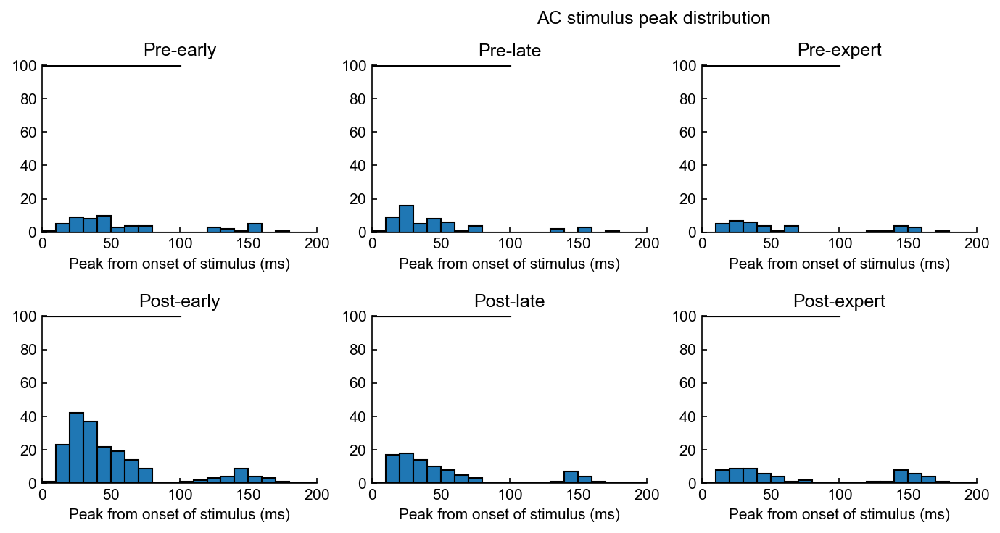

In [1477]:
fig = plt.figure(figsize=(15,5))
gs = fig.add_gridspec(2,4,height_ratios=[0.4,0.4],hspace=0.5)
ax1 = plt.subplot(gs[0,0])
ax2 = plt.subplot(gs[0,1],sharex = ax1,sharey = ax1)
ax3 = plt.subplot(gs[0,2],sharex = ax1,sharey = ax1)
ax4 = plt.subplot(gs[1,0],sharex = ax1,sharey = ax1)
ax5 = plt.subplot(gs[1,1],sharex = ax1,sharey = ax1)
ax6 = plt.subplot(gs[1,2],sharex = ax1,sharey = ax1)

num_bins = 20

ax1.set_ylim(0,100)
ax1.set_xlim(0,200)
ax1.set_xticks([0,50,100,150,200])

ax1.set_xlabel('Peak from onset of stimulus (ms)')
ax2.set_xlabel('Peak from onset of stimulus (ms)')
ax3.set_xlabel('Peak from onset of stimulus (ms)')
ax4.set_xlabel('Peak from onset of stimulus (ms)')
ax5.set_xlabel('Peak from onset of stimulus (ms)')
ax6.set_xlabel('Peak from onset of stimulus (ms)')

ax1.hist(AC_preearly,bins=num_bins,range=(0,200),edgecolor='k')
ax2.hist(AC_prelate,bins=num_bins,range=(0,200),edgecolor='k')
ax3.hist(AC_preexpert,bins=num_bins,range=(0,200),edgecolor='k')
ax4.hist(AC_postearly,bins=num_bins,range=(0,200),edgecolor='k')
ax5.hist(AC_postlate,bins=num_bins,range=(0,200),edgecolor='k')
ax6.hist(AC_postexpert,bins=num_bins,range=(0,200),edgecolor='k')

ax1.set_title('Pre-early')
ax2.set_title('Pre-late')
ax3.set_title('Pre-expert')
ax4.set_title('Post-early')
ax5.set_title('Post-late')
ax6.set_title('Post-expert')
plt.suptitle('AC stimulus peak distribution')

ax1.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax2.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax3.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax4.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax5.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax6.plot([0,100],[100,100],color='k',lw=2,linestyle='-')

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\AC stimulus latency distribution.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


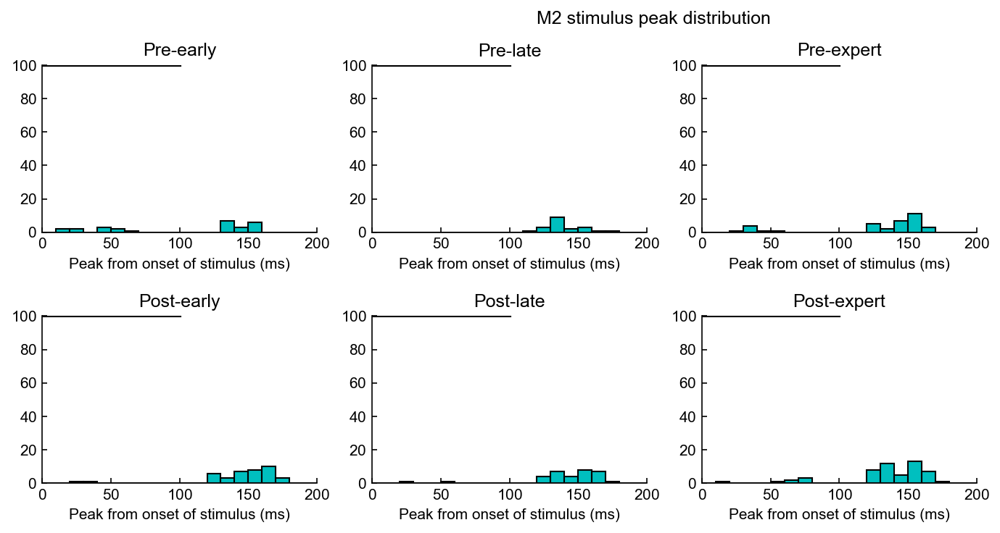

In [46]:
fig = plt.figure(figsize=(15,5))
gs = fig.add_gridspec(2,4,height_ratios=[0.4,0.4],hspace=0.5)
ax1 = plt.subplot(gs[0,0])
ax2 = plt.subplot(gs[0,1],sharex = ax1,sharey = ax1)
ax3 = plt.subplot(gs[0,2],sharex = ax1,sharey = ax1)
ax4 = plt.subplot(gs[1,0],sharex = ax1,sharey = ax1)
ax5 = plt.subplot(gs[1,1],sharex = ax1,sharey = ax1)
ax6 = plt.subplot(gs[1,2],sharex = ax1,sharey = ax1)

num_bins = 20

ax1.set_ylim(0,100)
ax1.set_xlim(0,200)
ax1.set_xticks([0,50,100,150,200])

ax1.set_xlabel('Peak from onset of stimulus (ms)')
ax2.set_xlabel('Peak from onset of stimulus (ms)')
ax3.set_xlabel('Peak from onset of stimulus (ms)')
ax4.set_xlabel('Peak from onset of stimulus (ms)')
ax5.set_xlabel('Peak from onset of stimulus (ms)')
ax6.set_xlabel('Peak from onset of stimulus (ms)')

ax1.hist(M2_preearly,bins=num_bins,range=(0,200),edgecolor='k',color='c')
ax2.hist(M2_prelate,bins=num_bins,range=(0,200),edgecolor='k',color='c')
ax3.hist(M2_preexpert,bins=num_bins,range=(0,200),edgecolor='k',color='c')
ax4.hist(M2_postearly,bins=num_bins,range=(0,200),edgecolor='k',color='c')
ax5.hist(M2_postlate,bins=num_bins,range=(0,200),edgecolor='k',color='c')
ax6.hist(M2_postexpert,bins=num_bins,range=(0,200),edgecolor='k',color='c')

ax1.set_title('Pre-early')
ax2.set_title('Pre-late')
ax3.set_title('Pre-expert')
ax4.set_title('Post-early')
ax5.set_title('Post-late')
ax6.set_title('Post-expert')
plt.suptitle('M2 stimulus peak distribution')

ax1.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax2.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax3.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax4.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax5.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax6.plot([0,100],[100,100],color='k',lw=2,linestyle='-')

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2 stimulus latency distribution200.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [ ]:
fig = plt.figure(figsize=(15,5))
gs = fig.add_gridspec(2,4,height_ratios=[0.4,0.4],hspace=0.5)
ax1 = plt.subplot(gs[0,0])
ax2 = plt.subplot(gs[0,1],sharex = ax1,sharey = ax1)
ax3 = plt.subplot(gs[0,2],sharex = ax1,sharey = ax1)
ax4 = plt.subplot(gs[1,0],sharex = ax1,sharey = ax1)
ax5 = plt.subplot(gs[1,1],sharex = ax1,sharey = ax1)
ax6 = plt.subplot(gs[1,2],sharex = ax1,sharey = ax1)

num_bins = 20

ax1.set_ylim(0,100)
ax1.set_xlim(0,300)
ax1.set_xticks([0,100,200,300])

ax1.set_xlabel('Peak from onset of stimulus (ms)')
ax2.set_xlabel('Peak from onset of stimulus (ms)')
ax3.set_xlabel('Peak from onset of stimulus (ms)')
ax4.set_xlabel('Peak from onset of stimulus (ms)')
ax5.set_xlabel('Peak from onset of stimulus (ms)')
ax6.set_xlabel('Peak from onset of stimulus (ms)')

ax1.hist(M2_preearly,bins=num_bins,range=(0,300),edgecolor='k',color='c')
ax2.hist(M2_prelate,bins=num_bins,range=(0,300),edgecolor='k',color='c')
ax3.hist(M2_preexpert,bins=num_bins,range=(0,300),edgecolor='k',color='c')
ax4.hist(M2_postearly,bins=num_bins,range=(0,300),edgecolor='k',color='c')
ax5.hist(M2_postlate,bins=num_bins,range=(0,300),edgecolor='k',color='c')
ax6.hist(M2_postexpert,bins=num_bins,range=(0,300),edgecolor='k',color='c')

ax1.set_title('Pre-early')
ax2.set_title('Pre-late')
ax3.set_title('Pre-expert')
ax4.set_title('Post-early')
ax5.set_title('Post-late')
ax6.set_title('Post-expert')
plt.suptitle('M2 stimulus peak distribution')

ax1.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax2.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax3.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax4.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax5.plot([0,100],[100,100],color='k',lw=2,linestyle='-')
ax6.plot([0,100],[100,100],color='k',lw=2,linestyle='-')

#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2 stimulus latency distribution.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


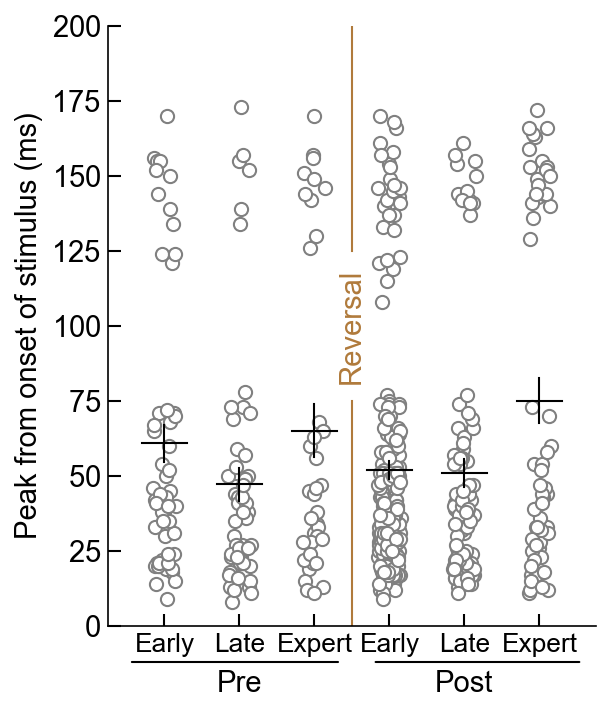

In [1475]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure 
data = [AC_preearly,AC_prelate,AC_preexpert,AC_postearly,AC_postlate,AC_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,200])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Peak from onset of stimulus (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\AC stimulus latency (not - 100).pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


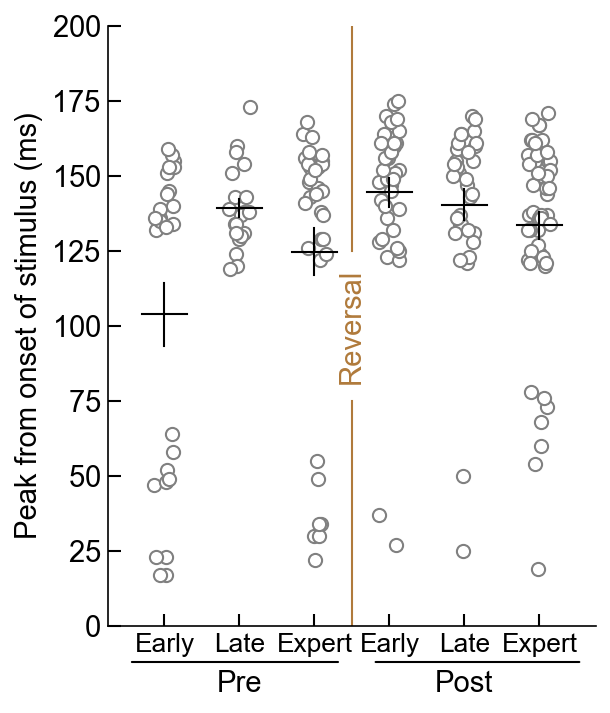

In [39]:
#M2
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure 
data = [M2_preearly,M2_prelate,M2_preexpert,M2_postearly,M2_postlate,M2_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,200])
#ax.set_ylim([0,300])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Peak from onset of stimulus (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2 stimulus latency200 (not - 100).pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2 stimulus latency (not - 100).pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [1472]:
ACData = SimpleNamespace()
ACData.preearly = AC_preearly
ACData.prelate = AC_prelate
ACData.preexpert = AC_preexpert
ACData.postearly = AC_postearly
ACData.postlate = AC_postlate
ACData.postexpert = AC_postexpert
ilep.nonparametricIndependentStatsCompareToPrevious(ACData)

            Source            SS     DF           MS         F     p-unc  \
0            phase  7.431021e+03    3.0  2477.006959  1.254121  0.289270   
1          context  4.585522e+03    1.0  4585.521915  2.321672  0.128087   
2  phase * context  2.842654e+04    3.0  9475.512896  4.797499  0.002595   
3         Residual  1.238384e+06  627.0  1975.094412       NaN       NaN   

        np2  
0  0.005965  
1  0.003689  
2  0.022439  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.022416  0.089664 -0.479690
8     post-late  baseline  experimental  0.306686  0.306686  0.021788
9    pre-expert  baseline  experimental  0.148551  0.198068 -0.387421
10     pre-late  baseline  experimental  0.116706  0.198068  0.308617
key preearly has 56 non-nan elements
key prelate has 56 non-nan elements
key preexpert has 37 non-nan elements
key postearly has 194 non-nan elements
key postlate has 88 non-nan elements
key postexp

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,21793.0,two-sided,0.450117,0.867952,fdr_bh,0.203663
1,phase,-,post-expert,pre-expert,False,False,7249.0,two-sided,0.486592,0.867952,fdr_bh,0.131771
2,phase,-,post-expert,pre-late,False,False,8568.0,two-sided,0.641526,0.867952,fdr_bh,0.141314
3,phase,-,post-late,pre-expert,False,False,13319.5,two-sided,0.820208,0.867952,fdr_bh,-0.060981
4,phase,-,post-late,pre-late,False,False,15622.0,two-sided,0.867952,0.867952,fdr_bh,-0.054220
5,phase,-,pre-expert,pre-late,False,False,5124.5,two-sided,0.844343,0.867952,fdr_bh,0.006893
6,context,-,baseline,experimental,False,False,46562.0,two-sided,0.683489,NaN,NaN,-0.132450
7,phase * context,post-expert,baseline,experimental,False,False,2055.0,two-sided,0.022416,0.089664,fdr_bh,-0.479690
8,phase * context,post-late,baseline,experimental,False,False,9185.0,two-sided,0.306686,0.306686,fdr_bh,0.021788
9,phase * context,pre-expert,baseline,experimental,False,False,851.5,two-sided,0.148551,0.198068,fdr_bh,-0.387421


In [1473]:
M2Data = SimpleNamespace()
M2Data.preearly = M2_preearly
M2Data.prelate = M2_prelate
M2Data.preexpert = M2_preexpert
M2Data.postearly = M2_postearly
M2Data.postlate = M2_postlate
M2Data.postexpert = M2_postexpert
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data)

            Source             SS     DF            MS          F  \
0            phase   15371.564323    3.0   5123.854774   2.645777   
1          context    2662.449805    1.0   2662.449805   1.374795   
2  phase * context   79002.551499    3.0  26334.183833  13.598042   
3         Residual  817251.914229  422.0   1936.615910        NaN   

          p-unc       np2  
0  4.871276e-02  0.018462  
1  2.416512e-01  0.003247  
2  1.747025e-08  0.088147  
3           NaN       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.055828  0.069258  0.341153
8     post-late  baseline  experimental  0.069258  0.069258  0.294791
9    pre-expert  baseline  experimental  0.015478  0.030956  0.583803
10     pre-late  baseline  experimental  0.001932  0.007728 -1.018057
key preearly has 30 non-nan elements
key prelate has 38 non-nan elements
key preexpert has 60 non-nan elements
key postearly has 80 non-nan elements
key postlate h

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,6998.0,two-sided,0.006857,0.041144,fdr_bh,-0.337639
1,phase,-,post-expert,pre-expert,False,False,5497.0,two-sided,0.262122,0.393183,fdr_bh,-0.124807
2,phase,-,post-expert,pre-late,False,False,3969.5,two-sided,0.562205,0.674646,fdr_bh,0.041820
3,phase,-,post-late,pre-expert,False,False,7502.5,two-sided,0.259269,0.393183,fdr_bh,0.179754
4,phase,-,post-late,pre-late,False,False,5288.0,two-sided,0.228249,0.393183,fdr_bh,0.326389
5,phase,-,pre-expert,pre-late,False,False,3439.5,two-sided,0.725292,0.725292,fdr_bh,0.139626
6,context,-,baseline,experimental,False,False,25466.5,two-sided,0.065568,NaN,NaN,0.128118
7,phase * context,post-expert,baseline,experimental,False,False,2269.5,two-sided,0.055828,0.069258,fdr_bh,0.341153
8,phase * context,post-late,baseline,experimental,False,False,2877.0,two-sided,0.069258,0.069258,fdr_bh,0.294791
9,phase * context,pre-expert,baseline,experimental,False,False,1472.5,two-sided,0.015478,0.030956,fdr_bh,0.583803


In [40]:
#200
M2Data = SimpleNamespace()
M2Data.preearly = M2_preearly
M2Data.prelate = M2_prelate
M2Data.preexpert = M2_preexpert
M2Data.postearly = M2_postearly
M2Data.postlate = M2_postlate
M2Data.postexpert = M2_postexpert
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data)

            Source             SS     DF           MS         F     p-unc  \
0            phase   16690.787839    3.0  5563.595946  4.652144  0.003489   
1          context       0.183394    1.0     0.183394  0.000153  0.990130   
2  phase * context   18145.406681    3.0  6048.468894  5.057583  0.002033   
3         Residual  300176.138453  251.0  1195.920870       NaN       NaN   

            np2  
0  5.267444e-02  
1  6.109529e-07  
2  5.700339e-02  
3           NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.276449  0.471809  0.215721
8     post-late  baseline  experimental  0.353857  0.471809  0.132973
9    pre-expert  baseline  experimental  0.655303  0.655303  0.374562
10     pre-late  baseline  experimental  0.218589  0.471809 -0.846389
key preearly has 26 non-nan elements
key prelate has 20 non-nan elements
key preexpert has 35 non-nan elements
key postearly has 39 non-nan elements
key postlate has 33 non-

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,2611.0,two-sided,0.090632,0.135948,fdr_bh,-0.207239
1,phase,-,post-expert,pre-expert,False,False,2587.5,two-sided,0.347917,0.347917,fdr_bh,0.178281
2,phase,-,post-expert,pre-late,False,False,2472.0,two-sided,0.018397,0.036794,fdr_bh,0.461935
3,phase,-,post-late,pre-expert,False,False,2486.0,two-sided,0.013884,0.036794,fdr_bh,0.368836
4,phase,-,post-late,pre-late,False,False,2305.5,two-sided,0.000341,0.002046,fdr_bh,0.639902
5,phase,-,pre-expert,pre-late,False,False,1470.5,two-sided,0.161957,0.194348,fdr_bh,0.259965
6,context,-,baseline,experimental,False,False,8610.5,two-sided,0.627828,NaN,NaN,-0.007665
7,phase * context,post-expert,baseline,experimental,False,False,997.5,two-sided,0.276449,0.471809,fdr_bh,0.215721
8,phase * context,post-late,baseline,experimental,False,False,726.0,two-sided,0.353857,0.471809,fdr_bh,0.132973
9,phase * context,pre-expert,baseline,experimental,False,False,324.0,two-sided,0.655303,0.655303,fdr_bh,0.374562


## Latency

meta NOT subset; don't know how to subset; dropped


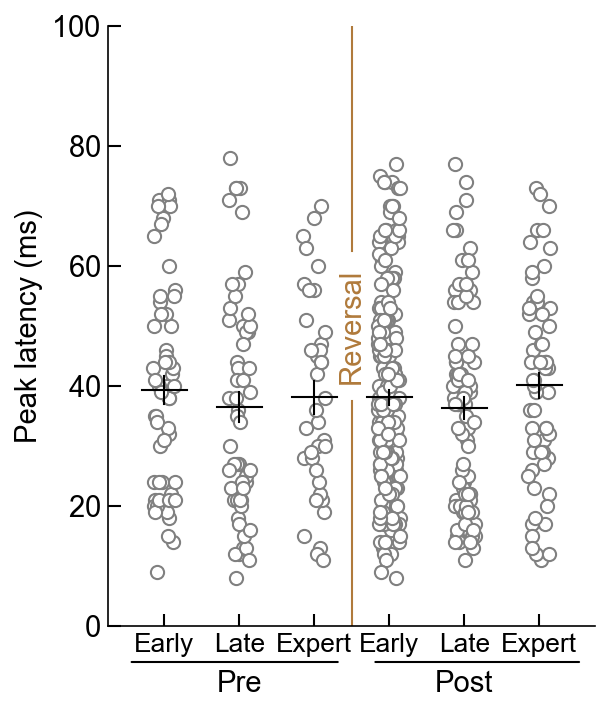

In [1499]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure 
data = [AC_preearly_latency,AC_prelate_latency,AC_preexpert_latency,AC_postearly_latency,AC_postlate_latency,AC_postexpert_latency]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Peak latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\AC stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


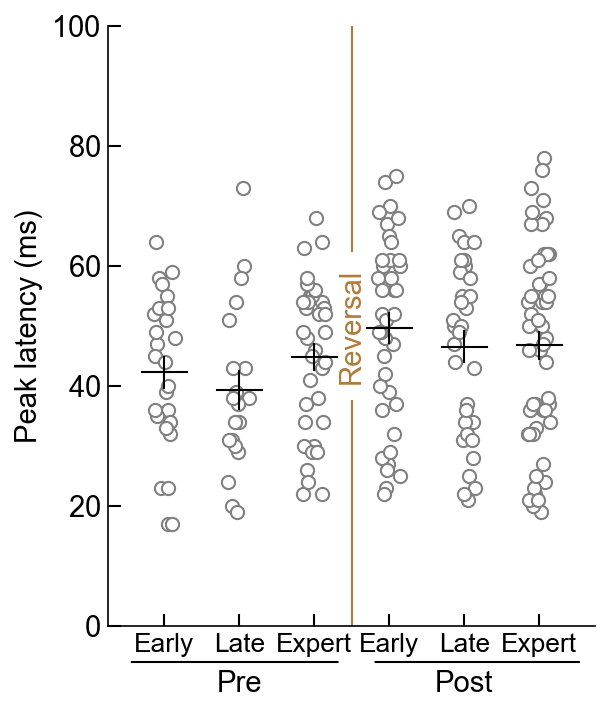

In [42]:
#M2
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure 
data = [M2_preearly_latency,M2_prelate_latency,M2_preexpert_latency,M2_postearly_latency,M2_postlate_latency,M2_postexpert_latency]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Peak latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2 stimulus latency_200.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2 stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [1524]:
ACData = SimpleNamespace()
ACData.preearly = AC_preearly_latency
ACData.prelate = AC_prelate_latency
ACData.preexpert = AC_preexpert_latency
ACData.postearly = AC_postearly_latency
ACData.postlate = AC_postlate_latency
ACData.postexpert = AC_postexpert_latency
ilep.nonparametricIndependentStatsCompareToPrevious(ACData)


            Source             SS     DF          MS         F     p-unc  \
0            phase      46.719514    3.0   15.573171  0.052230  0.984243   
1          context       2.026605    1.0    2.026605  0.006797  0.934320   
2  phase * context     995.659373    3.0  331.886458  1.113099  0.343064   
3         Residual  186949.036967  627.0  298.164333       NaN       NaN   

        np2  
0  0.000250  
1  0.000011  
2  0.005298  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.164869  0.512049 -0.223361
8     post-late  baseline  experimental  0.394642  0.512049  0.103441
9    pre-expert  baseline  experimental  0.512049  0.512049 -0.090545
10     pre-late  baseline  experimental  0.406759  0.512049  0.161142
key preearly has 56 non-nan elements
key prelate has 56 non-nan elements
key preexpert has 37 non-nan elements
key postearly has 194 non-nan elements
key postlate has 88 non-nan elements
key postexp

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,21179.0,two-sided,0.799755,0.942232,fdr_bh,0.019257
1,phase,-,post-expert,pre-expert,False,False,7070.5,two-sided,0.721154,0.942232,fdr_bh,0.043461
2,phase,-,post-expert,pre-late,False,False,8332.0,two-sided,0.942232,0.942232,fdr_bh,-0.003770
3,phase,-,post-late,pre-expert,False,False,13346.0,two-sided,0.797543,0.942232,fdr_bh,0.024905
4,phase,-,post-late,pre-late,False,False,15665.0,two-sided,0.901244,0.942232,fdr_bh,-0.022652
5,phase,-,pre-expert,pre-late,False,False,5123.0,two-sided,0.841552,0.942232,fdr_bh,-0.045239
6,context,-,baseline,experimental,False,False,47440.0,two-sided,0.987016,NaN,NaN,0.004431
7,phase * context,post-expert,baseline,experimental,False,False,2284.0,two-sided,0.164869,0.512049,fdr_bh,-0.223361
8,phase * context,post-late,baseline,experimental,False,False,9076.5,two-sided,0.394642,0.512049,fdr_bh,0.103441
9,phase * context,pre-expert,baseline,experimental,False,False,952.0,two-sided,0.512049,0.512049,fdr_bh,-0.090545


In [1525]:
ilep.nonparametricIndependentStatsCompareToOwnEarly(ACData)


            Source             SS     DF          MS         F     p-unc  \
0            phase     197.264673    3.0   65.754891  0.225648  0.878578   
1          context      99.476823    1.0   99.476823  0.341371  0.559219   
2  phase * context     554.916390    3.0  184.972130  0.634762  0.592758   
3         Residual  213599.219136  733.0  291.404119       NaN       NaN   

        np2  
0  0.000923  
1  0.000466  
2  0.002591  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.319475  0.542346 -0.120506
8     post-late  baseline  experimental  0.394642  0.542346  0.103441
9    pre-expert  baseline  experimental  0.841291  0.841291  0.075301
10     pre-late  baseline  experimental  0.406759  0.542346  0.161142
key preearly has 56 non-nan elements
key prelate has 56 non-nan elements
key preexpert has 37 non-nan elements
key postearly has 194 non-nan elements
key postlate has 88 non-nan elements
key postexp

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,37206.0,two-sided,0.436926,0.901244,fdr_bh,0.060872
1,phase,-,post-expert,pre-expert,False,False,11665.5,two-sided,0.860902,0.901244,fdr_bh,-0.019073
2,phase,-,post-expert,pre-late,False,False,14670.0,two-sided,0.632856,0.901244,fdr_bh,0.036803
3,phase,-,post-late,pre-expert,False,False,12437.0,two-sided,0.456074,0.901244,fdr_bh,-0.079374
4,phase,-,post-late,pre-late,False,False,15665.0,two-sided,0.901244,0.901244,fdr_bh,-0.022652
5,phase,-,pre-expert,pre-late,False,False,5409.0,two-sided,0.635245,0.901244,fdr_bh,0.053863
6,context,-,baseline,experimental,False,False,61807.0,two-sided,0.568453,NaN,NaN,0.047341
7,phase * context,post-expert,baseline,experimental,False,False,5324.5,two-sided,0.319475,0.542346,fdr_bh,-0.120506
8,phase * context,post-late,baseline,experimental,False,False,9076.5,two-sided,0.394642,0.542346,fdr_bh,0.103441
9,phase * context,pre-expert,baseline,experimental,False,False,1062.0,two-sided,0.841291,0.841291,fdr_bh,0.075301


In [43]:
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

In [44]:
M2Data = SimpleNamespace()
M2Data.preearly = M2_preearly_latency
M2Data.prelate = M2_prelate_latency
M2Data.preexpert = M2_preexpert_latency
M2Data.postearly = M2_postearly_latency
M2Data.postlate = M2_postlate_latency
M2Data.postexpert = M2_postexpert_latency
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data)

            Source            SS     DF          MS         F     p-unc  \
0            phase   1991.526228    3.0  663.842076  3.077184  0.028197   
1          context      3.539553    1.0    3.539553  0.016407  0.898180   
2  phase * context    662.170007    3.0  220.723336  1.023144  0.382939   
3         Residual  54148.322998  251.0  215.730371       NaN       NaN   

        np2  
0  0.035474  
1  0.000065  
2  0.012081  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.946870  0.946870 -0.016725
8     post-late  baseline  experimental  0.383960  0.511947  0.205839
9    pre-expert  baseline  experimental  0.138968  0.511947 -0.410097
10     pre-late  baseline  experimental  0.318492  0.511947  0.218881
key preearly has 26 non-nan elements
key prelate has 20 non-nan elements
key preexpert has 35 non-nan elements
key postearly has 39 non-nan elements
key postlate has 33 non-nan elements
key postexpert ha

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,2907.5,two-sided,0.511429,0.561930,fdr_bh,-0.099509
1,phase,-,post-expert,pre-expert,False,False,2728.5,two-sided,0.124787,0.187181,fdr_bh,0.262490
2,phase,-,post-expert,pre-late,False,False,2403.5,two-sided,0.042313,0.084627,fdr_bh,0.380194
3,phase,-,post-late,pre-expert,False,False,2420.5,two-sided,0.032222,0.084627,fdr_bh,0.376806
4,phase,-,post-late,pre-late,False,False,2125.0,two-sided,0.009710,0.058261,fdr_bh,0.497510
5,phase,-,pre-expert,pre-late,False,False,1350.5,two-sided,0.561930,0.561930,fdr_bh,0.133307
6,context,-,baseline,experimental,False,False,8437.0,two-sided,0.844795,NaN,NaN,0.016051
7,phase * context,post-expert,baseline,experimental,False,False,866.5,two-sided,0.946870,0.946870,fdr_bh,-0.016725
8,phase * context,post-late,baseline,experimental,False,False,721.0,two-sided,0.383960,0.511947,fdr_bh,0.205839
9,phase * context,pre-expert,baseline,experimental,False,False,265.0,two-sided,0.138968,0.511947,fdr_bh,-0.410097


In [45]:
ilep.nonparametricIndependentStatsCompareToOwnEarly(M2Data)

            Source            SS     DF          MS         F     p-unc  \
0            phase   2250.571829    3.0  750.190610  3.478997  0.016522   
1          context    208.463916    1.0  208.463916  0.966748  0.326396   
2  phase * context    349.954203    3.0  116.651401  0.540969  0.654640   
3         Residual  56711.787333  263.0  215.634172       NaN       NaN   

        np2  
0  0.038170  
1  0.003662  
2  0.006133  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.348973  0.506731  0.179485
8     post-late  baseline  experimental  0.383960  0.506731  0.205839
9    pre-expert  baseline  experimental  0.506731  0.506731 -0.190204
10     pre-late  baseline  experimental  0.318492  0.506731  0.218881
key preearly has 26 non-nan elements
key prelate has 20 non-nan elements
key preexpert has 35 non-nan elements
key postearly has 39 non-nan elements
key postlate has 33 non-nan elements
key postexpert ha

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,3278.5,two-sided,0.912896,0.912896,fdr_bh,-0.013915
1,phase,-,post-expert,pre-expert,False,False,3288.5,two-sided,0.072400,0.108601,fdr_bh,0.289279
2,phase,-,post-expert,pre-late,False,False,2676.5,two-sided,0.011407,0.034222,fdr_bh,0.462361
3,phase,-,post-late,pre-expert,False,False,2618.5,two-sided,0.056622,0.108601,fdr_bh,0.317520
4,phase,-,post-late,pre-late,False,False,2125.0,two-sided,0.009710,0.034222,fdr_bh,0.497510
5,phase,-,pre-expert,pre-late,False,False,1579.5,two-sided,0.267834,0.321401,fdr_bh,0.207060
6,context,-,baseline,experimental,False,False,9766.0,two-sided,0.351395,NaN,NaN,0.104366
7,phase * context,post-expert,baseline,experimental,False,False,1152.5,two-sided,0.348973,0.506731,fdr_bh,0.179485
8,phase * context,post-late,baseline,experimental,False,False,721.0,two-sided,0.383960,0.506731,fdr_bh,0.205839
9,phase * context,pre-expert,baseline,experimental,False,False,409.0,two-sided,0.506731,0.506731,fdr_bh,-0.190204


## AC on_offset

In [81]:
AC_preearly_onset

array([46, 18, 38, 43, 32, 42, 45, 65, 33, 24, 21, 14, 15, 20, 19, 20, 20,
       30, 40, 38, 22, 68, 71, 40, 71, 19, 31, 70, 54, 43, 21,  9, 21, 24,
       60, 67, 44, 41, 40, 50, 35, 35, 52, 72], dtype=int64)

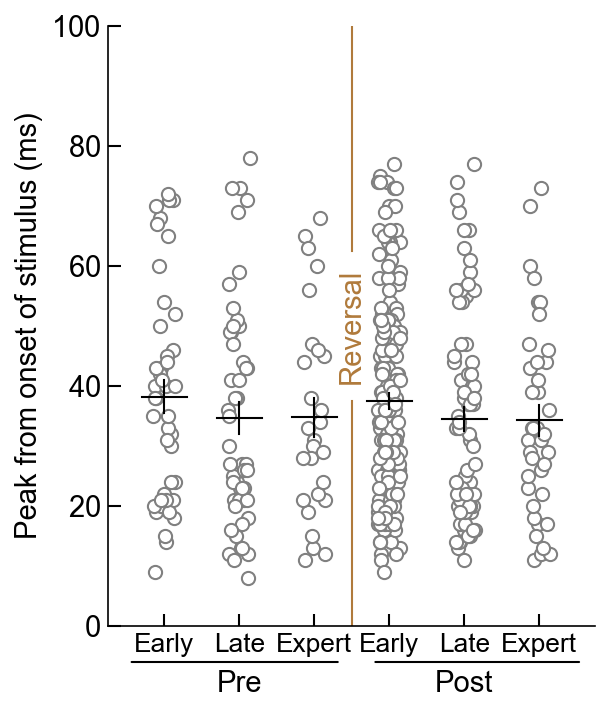

In [82]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure 
data = [AC_preearly_onset,AC_prelate_onset,AC_preexpert_onset,AC_postearly_onset,AC_postlate_onset,AC_postexpert_onset]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Peak from onset of stimulus (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\AC onset stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [83]:
AC_postexpert_offset

array([143, 153, 140, 155, 163, 164, 144, 166, 166, 159, 129, 136, 144,
       141, 153, 149, 172, 152, 147, 150, 144], dtype=int64)

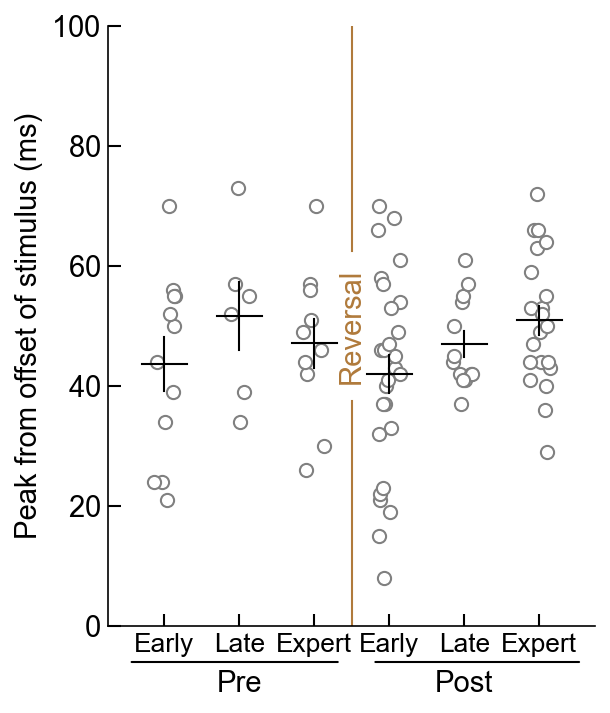

In [84]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure 
data = [AC_preearly_offset - 100,AC_prelate_offset - 100,AC_preexpert_offset - 100,AC_postearly_offset - 100,AC_postlate_offset - 100,AC_postexpert_offset - 100]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Peak from offset of stimulus (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\AC offset stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [85]:
AConset = SimpleNamespace()
AConset.preearly = AC_preearly_onset
AConset.prelate = AC_prelate_onset
AConset.preexpert = AC_preexpert_onset
AConset.postearly = AC_postearly_onset
AConset.postlate = AC_postlate_onset
AConset.postexpert = AC_postexpert_onset
ilep.nonparametricIndependentStatsCompareToPrevious(AConset)

            Source             SS     DF          MS         F     p-unc  \
0            phase     498.830918    3.0  166.276973  0.547009  0.650351   
1          context     492.399250    1.0  492.399250  1.619869  0.203680   
2  phase * context     271.770002    3.0   90.590001  0.298018  0.826841   
3         Residual  157762.916298  519.0  303.974791       NaN       NaN   

        np2  
0  0.003152  
1  0.003111  
2  0.001720  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.907244  0.907244  0.012295
8     post-late  baseline  experimental  0.136591  0.546364  0.173715
9    pre-expert  baseline  experimental  0.818383  0.907244 -0.007566
10     pre-late  baseline  experimental  0.391635  0.783271  0.195484
key preearly has 44 non-nan elements
key prelate has 50 non-nan elements
key preexpert has 27 non-nan elements
key postearly has 167 non-nan elements
key postlate has 75 non-nan elements
key postexp

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,12737.0,two-sided,0.243413,0.911864,fdr_bh,-0.124290
1,phase,-,post-expert,pre-expert,False,False,4358.5,two-sided,0.936180,0.936180,fdr_bh,-0.015327
2,phase,-,post-expert,pre-late,False,False,5035.5,two-sided,0.455932,0.911864,fdr_bh,-0.108062
3,phase,-,post-late,pre-expert,False,False,9983.5,two-sided,0.344659,0.911864,fdr_bh,0.107180
4,phase,-,post-late,pre-late,False,False,11538.5,two-sided,0.837391,0.936180,fdr_bh,0.012343
5,phase,-,pre-expert,pre-late,False,False,3463.0,two-sided,0.629088,0.936180,fdr_bh,-0.090140
6,context,-,baseline,experimental,False,False,34290.0,two-sided,0.190059,NaN,NaN,0.112419
7,phase * context,post-expert,baseline,experimental,False,False,1442.5,two-sided,0.907244,0.907244,fdr_bh,0.012295
8,phase * context,post-late,baseline,experimental,False,False,7012.5,two-sided,0.136591,0.546364,fdr_bh,0.173715
9,phase * context,pre-expert,baseline,experimental,False,False,653.0,two-sided,0.818383,0.907244,fdr_bh,-0.007566


In [86]:
ACoffset = SimpleNamespace()
ACoffset.preearly = AC_preearly_offset - 100
ACoffset.prelate = AC_prelate_offset - 100
ACoffset.preexpert = AC_preexpert_offset - 100
ACoffset.postearly = AC_postearly_offset - 100
ACoffset.postlate = AC_postlate_offset - 100
ACoffset.postexpert = AC_postexpert_offset - 100
ilep.nonparametricIndependentStatsCompareToPrevious(ACoffset)

            Source            SS     DF          MS         F     p-unc  \
0            phase    432.891323    3.0  144.297108  0.850500  0.469534   
1          context    335.846348    1.0  335.846348  1.979508  0.162543   
2  phase * context    346.424828    3.0  115.474943  0.680620  0.565928   
3         Residual  16966.148677  100.0  169.661487       NaN       NaN   

        np2  
0  0.024880  
1  0.019411  
2  0.020010  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.278944  0.514872 -0.390009
8     post-late  baseline  experimental  0.426635  0.514872 -0.344835
9    pre-expert  baseline  experimental  0.514872  0.514872  0.325566
10     pre-late  baseline  experimental  0.300891  0.514872 -0.509211
key preearly has 12 non-nan elements
key prelate has 6 non-nan elements
key preexpert has 10 non-nan elements
key postearly has 27 non-nan elements
key postlate has 13 non-nan elements
key postexpert has

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,828.0,two-sided,0.109214,0.655282,fdr_bh,0.461999
1,phase,-,post-expert,pre-expert,False,False,272.5,two-sided,1.000000,1.000000,fdr_bh,0.056299
2,phase,-,post-expert,pre-late,False,False,336.5,two-sided,0.563403,0.783591,fdr_bh,0.256938
3,phase,-,post-late,pre-expert,False,False,256.0,two-sided,0.249050,0.747151,fdr_bh,-0.367682
4,phase,-,post-late,pre-late,False,False,323.5,two-sided,0.544865,0.783591,fdr_bh,-0.185376
5,phase,-,pre-expert,pre-late,False,False,157.5,two-sided,0.652993,0.783591,fdr_bh,0.171452
6,context,-,baseline,experimental,False,False,1194.0,two-sided,0.115136,NaN,NaN,-0.367714
7,phase * context,post-expert,baseline,experimental,False,False,105.5,two-sided,0.278944,0.514872,fdr_bh,-0.390009
8,phase * context,post-late,baseline,experimental,False,False,147.5,two-sided,0.426635,0.514872,fdr_bh,-0.344835
9,phase * context,pre-expert,baseline,experimental,False,False,36.5,two-sided,0.514872,0.514872,fdr_bh,0.325566


## M2 on_offset

C:\Users\insan\AppData\Roaming\Python\Python39\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\insan\AppData\Roaming\Python\Python39\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\insan\AppData\Roaming\Python\Python39\site-packages\numpy\core\_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\insan\AppData\Roaming\Python\Python39\site-packages\numpy\core\_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
C:\Users\insan\AppData\Roaming\Python\Python39\site-packages\numpy\core\_methods.py:254: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


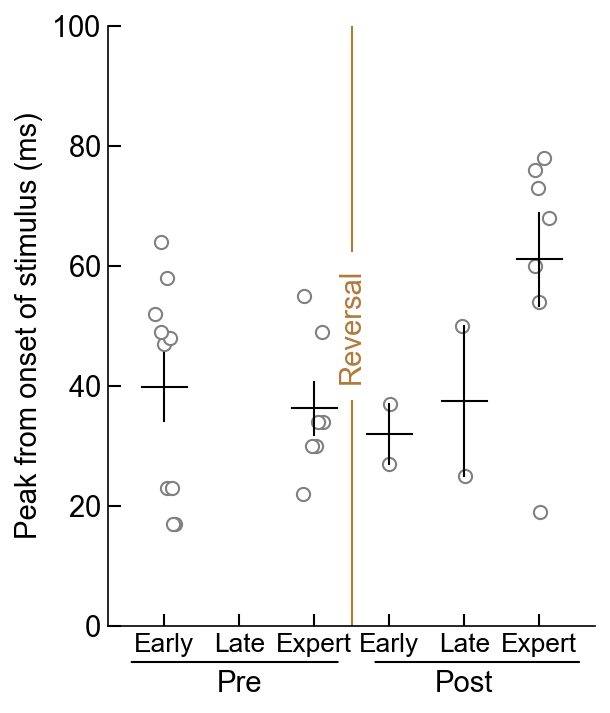

In [87]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure 
data = [M2_preearly_onset,M2_prelate_onset,M2_preexpert_onset,M2_postearly_onset,M2_postlate_onset,M2_postexpert_onset]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Peak from onset of stimulus (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2 onset stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

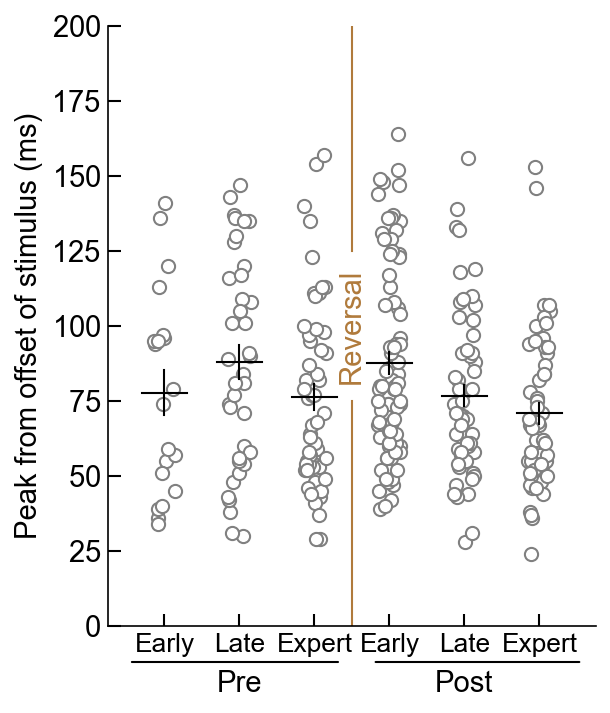

In [88]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure 
data = [M2_preearly_offset - 100,M2_prelate_offset - 100,M2_preexpert_offset - 100,M2_postearly_offset - 100,M2_postlate_offset - 100,M2_postexpert_offset - 100]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,200])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Peak from offset of stimulus (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2 offset stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [92]:
M2onset = SimpleNamespace()
M2onset.preearly = M2_preearly_onset
M2onset.prelate = M2_prelate_onset
M2onset.preexpert = M2_preexpert_onset
M2onset.postearly = M2_postearly_onset
M2onset.postlate = M2_postlate_onset
M2onset.postexpert = M2_postexpert_onset
ilep.nonparametricIndependentStatsCompareToPrevious(M2onset)

            Source            SS    DF            MS          F         p-unc  \
0            phase  49852.462907   3.0  16617.487636  58.011103  3.812073e-11   
1          context   7895.072546   1.0   7895.072546  27.561439  2.210008e-05   
2  phase * context   9046.651379   3.0   3015.550460  10.527188  1.312408e-04   
3         Residual   6874.885714  24.0    286.453571        NaN           NaN   

        np2  
0  0.878808  
1  0.534536  
2  0.568202  
3       NaN  



KeyError: ('pre-expert', 'baseline')

In [93]:
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

In [90]:
M2offset = SimpleNamespace()
M2offset.preearly = M2_preearly_offset - 100
M2offset.prelate = M2_prelate_offset - 100
M2offset.preexpert = M2_preexpert_offset - 100
M2offset.postearly = M2_postearly_offset - 100
M2offset.postlate = M2_postlate_offset - 100
M2offset.postexpert = M2_postexpert_offset - 100
ilep.nonparametricIndependentStatsCompareToPrevious(M2offset)

            Source             SS     DF           MS         F     p-unc  \
0            phase    7234.479665    3.0  2411.493222  2.588312  0.052664   
1          context    4431.136532    1.0  4431.136532  4.756043  0.029789   
2  phase * context    4890.526706    3.0  1630.175569  1.749706  0.156317   
3         Residual  365220.757230  392.0   931.685605       NaN       NaN   

        np2  
0  0.019424  
1  0.011987  
2  0.013214  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.189183  0.252244  0.221760
8     post-late  baseline  experimental  0.069502  0.218448  0.355281
9    pre-expert  baseline  experimental  0.109224  0.218448  0.353417
10     pre-late  baseline  experimental  0.318260  0.318260 -0.291854
key preearly has 20 non-nan elements
key prelate has 38 non-nan elements
key preexpert has 53 non-nan elements
key postearly has 78 non-nan elements
key postlate has 59 non-nan elements
key pos

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,6514.0,two-sided,0.023777,0.142664,fdr_bh,-0.311337
1,phase,-,post-expert,pre-expert,False,False,4651.0,two-sided,0.204405,0.408811,fdr_bh,-0.245144
2,phase,-,post-expert,pre-late,False,False,2759.5,two-sided,0.076951,0.230853,fdr_bh,-0.357300
3,phase,-,post-late,pre-expert,False,False,6530.5,two-sided,0.543227,0.697983,fdr_bh,0.053654
4,phase,-,post-late,pre-late,False,False,3899.0,two-sided,0.838319,0.838319,fdr_bh,-0.049675
5,phase,-,pre-expert,pre-late,False,False,2497.0,two-sided,0.581653,0.697983,fdr_bh,-0.097057
6,context,-,baseline,experimental,False,False,22268.0,two-sided,0.048509,NaN,NaN,0.202216
7,phase * context,post-expert,baseline,experimental,False,False,1854.5,two-sided,0.189183,0.252244,fdr_bh,0.221760
8,phase * context,post-late,baseline,experimental,False,False,2719.0,two-sided,0.069502,0.218448,fdr_bh,0.355281
9,phase * context,pre-expert,baseline,experimental,False,False,1206.5,two-sided,0.109224,0.218448,fdr_bh,0.353417


In [91]:
ilep.nonparametricIndependentStatsCompareToOwnEarly(M2offset)

            Source             SS     DF           MS         F     p-unc  \
0            phase    2096.090700    3.0   698.696900  0.723259  0.538565   
1          context    6674.841374    1.0  6674.841374  6.909492  0.008910   
2  phase * context    7672.033989    3.0  2557.344663  2.647247  0.048721   
3         Residual  379653.485067  393.0   966.039402       NaN       NaN   

        np2  
0  0.005491  
1  0.017278  
2  0.019808  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.003229  0.012918  0.556700
8     post-late  baseline  experimental  0.069502  0.139005  0.355281
9    pre-expert  baseline  experimental  0.965464  0.965464  0.045827
10     pre-late  baseline  experimental  0.318260  0.424347 -0.291854
key preearly has 20 non-nan elements
key prelate has 38 non-nan elements
key preexpert has 53 non-nan elements
key postearly has 78 non-nan elements
key postlate has 59 non-nan elements
key pos

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,8651.5,two-sided,0.474696,0.615160,fdr_bh,-0.073499
1,phase,-,post-expert,pre-expert,False,False,5251.0,two-sided,0.333173,0.615160,fdr_bh,0.125255
2,phase,-,post-expert,pre-late,False,False,3626.5,two-sided,0.512633,0.615160,fdr_bh,-0.119723
3,phase,-,post-late,pre-expert,False,False,5649.5,two-sided,0.121950,0.615160,fdr_bh,0.198902
4,phase,-,post-late,pre-late,False,False,3899.0,two-sided,0.838319,0.838319,fdr_bh,-0.049675
5,phase,-,pre-expert,pre-late,False,False,1852.0,two-sided,0.220273,0.615160,fdr_bh,-0.233991
6,context,-,baseline,experimental,False,False,23032.0,two-sided,0.011225,NaN,NaN,0.269174
7,phase * context,post-expert,baseline,experimental,False,False,2790.0,two-sided,0.003229,0.012918,fdr_bh,0.556700
8,phase * context,post-late,baseline,experimental,False,False,2719.0,two-sided,0.069502,0.139005,fdr_bh,0.355281
9,phase * context,pre-expert,baseline,experimental,False,False,534.0,two-sided,0.965464,0.965464,fdr_bh,0.045827


## Percentage fig

meta NOT subset; don't know how to subset; dropped


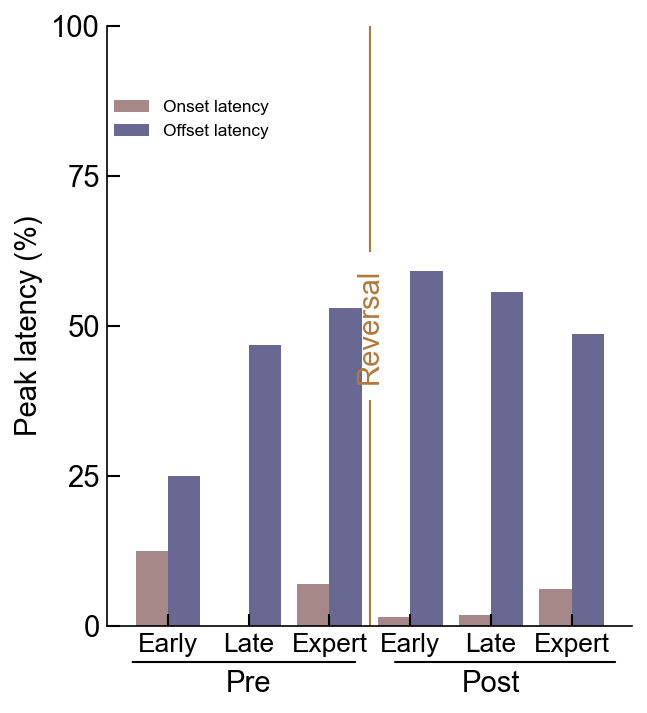

In [1439]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.5, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0
################################################################################################################

#Plot figure
labels = ['Early','Late','Expert','Early','Late','Expert']

onset = [M2_preearly_per_onset,M2_prelate_per_onset,M2_preexpert_per_onset,M2_postearly_per_onset,M2_postlate_per_onset,M2_postexpert_per_onset]
offset = [M2_preearly_per_offset,M2_prelate_per_offset,M2_preexpert_per_offset,M2_postearly_per_offset,M2_postlate_per_offset,M2_postexpert_per_offset]

ax.bar(np.arange(len(labels))-0.2,onset,label = 'Onset latency',width = 0.4, color='#A78889')
ax.bar(np.arange(len(labels))+0.2,offset,label = 'Offset latency',width = 0.4,  color='#686893')
    
################################################################################################################


ax.set_ylim([0,100])
ax.set_yticks([0,25,50,75,100])
ax.set_yticklabels(['0','25','50','75','100'])
ylab = ax.set_ylabel('Peak latency (%)')
ax.legend(frameon=False,loc=(0,0.8))

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\M2 stimulus latency percentage.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


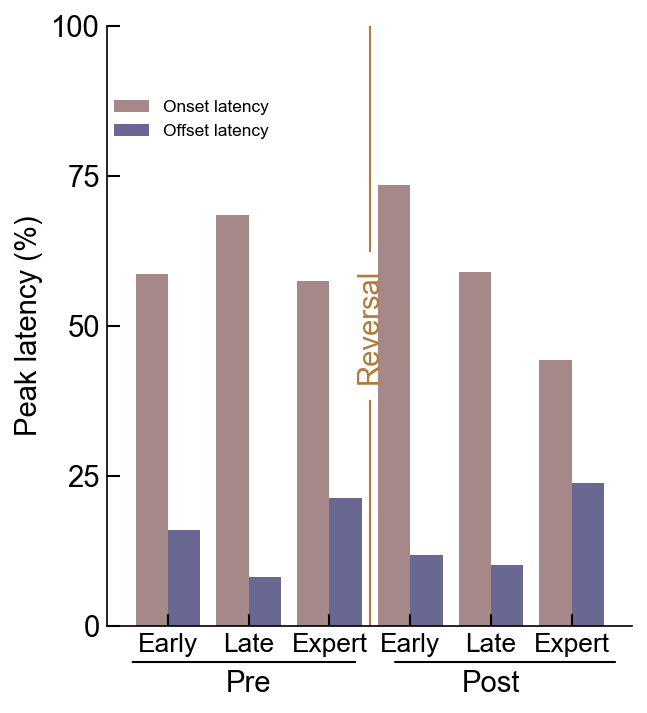

In [1440]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.5, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0
################################################################################################################

#Plot figure
labels = ['Early','Late','Expert','Early','Late','Expert']

onset = [AC_preearly_per_onset,AC_prelate_per_onset,AC_preexpert_per_onset,AC_postearly_per_onset,AC_postlate_per_onset,AC_postexpert_per_onset]
offset = [AC_preearly_per_offset,AC_prelate_per_offset,AC_preexpert_per_offset,AC_postearly_per_offset,AC_postlate_per_offset,AC_postexpert_per_offset]

ax.bar(np.arange(len(labels))-0.2,onset,label = 'Onset latency',width = 0.4, color='#A78889')
ax.bar(np.arange(len(labels))+0.2,offset,label = 'Offset latency',width = 0.4,  color='#686893')
    
################################################################################################################


ax.set_ylim([0,100])
ax.set_yticks([0,25,50,75,100])
ax.set_yticklabels(['0','25','50','75','100'])
ylab = ax.set_ylabel('Peak latency (%)')
ax.legend(frameon=False,loc=(0,0.8))

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak latency\\AC stimulus latency percentage.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

# Latency test

In [1290]:
import scipy
def visualizeClusterInternal(sessionfile,clust):
    def consecutive(data, stepsize=1):
        return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)
    
    bw_scott_factor = 4
    #bw_scott_factor = 6

    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    #mn = AC_FRmod_baseline_median 
    mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
    ax2.plot([100,200],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
    ax2.set_xlim([-150,700])
    ax2.set_xticks([-150,0,100,150,200,300,700])
    ax2.set_xticklabels(['-150','0','100','150','200','300','700'],size=8)
    ax2.set_xlabel('Time (ms)',size=12)
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms #print(spon_FR.shape) #(10, 150)
    avg_spon_FR = np.mean(spon_FR,axis=0)
    mean_spon_FR = np.mean(avg_spon_FR)
    std_spon_FR = np.std(avg_spon_FR)
    
    ########calculate tone response activity
    def calculate_tone_response(tone_res_FR,response_type):
        avg_tone_res_FR = np.mean(tone_res_FR,axis=0)
        #max_tone_res_FR = np.max(tone_res_FR)
        #print(max_tone_res_FR)
        #print(max_tone_res_FR/4)
        
        tone_res_diff = avg_tone_res_FR - mean_spon_FR
        
        tone_res_diff_abs = np.abs(tone_res_diff)
        tone_res_check = tone_res_diff_abs > 2*std_spon_FR
        


        tone_modulation = 'Evoked'
        
        if np.any(tone_res_check == True):
            
            
            tone_res_time = np.where(tone_res_check)[0]

            tone_res_time_periods = consecutive(tone_res_time, stepsize=1)
            #print(tone_res_time_periods)

            #print(len(tone_res_time_periods))
            tone_res_time_periods = tone_res_time_periods[0]

            peak_start = tone_res_time_periods[0]
            peak_end = tone_res_time_periods[-1]                
                
            if peak_end - peak_start >=25:
                if response_type == 'OFF':
                    ax2.fill_betweenx(range(len(trialsToPlot)), peak_start+100,peak_end+100, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                else:
                    ax2.fill_betweenx(range(len(trialsToPlot)), peak_start,peak_end, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                
                prominence = 0.55
                width = 25
                if diff<0:
                    tone_modulation = 'Suppressed'
                    peaks,properties = scipy.signal.find_peaks(-avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                else:
                    peaks,properties = scipy.signal.find_peaks(avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    

                if peaks.size!=0:
                    if response_type == 'OFF':
                        peak = peaks[0]+peak_start+100
                    else:
                        peak = peaks[0]+peak_start
                    
                    print(peak)
                    ax2.axvline(peak,0,color='blue',linewidth=1)
                    
    #############
    tone_res_FR1 = FR[:,350:450]
    calculate_tone_response(tone_res_FR1,'ON')
    
    tone_res_FR2 = FR[:,450:650]
    calculate_tone_response(tone_res_FR2,'OFF')
    


    #########################

    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\M2\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
        
    #plt.close(fig)
    
    return fig

## M2

In [1529]:
def visualizeClusterInternal(sessionfile,clust):
    def consecutive(data, stepsize=1):
        return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)
    
    bw_scott_factor = 4
    #bw_scott_factor = 6

    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    #mn = AC_FRmod_baseline_median 
    mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
    ax2.plot([100,300],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
    ax2.set_xlim([-150,700])
    ax2.set_xticks([-150,0,100,150,200,300,700])
    ax2.set_xticklabels(['-150','0','100','150','200','300','700'],size=8)
    ax2.set_xlabel('Time (ms)',size=12)
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms #print(spon_FR.shape) #(10, 150)
    avg_spon_FR = np.mean(spon_FR,axis=0)
    mean_spon_FR = np.mean(avg_spon_FR)
    std_spon_FR = np.std(avg_spon_FR)
    
    ########calculate tone response activity
    def calculate_tone_response(tone_res_FR,response_type):
        avg_tone_res_FR = np.mean(tone_res_FR,axis=0)
        #max_tone_res_FR = np.max(tone_res_FR)
        #print(max_tone_res_FR)
        #print(max_tone_res_FR/4)
        
        tone_res_diff = avg_tone_res_FR - mean_spon_FR
        
        tone_res_diff_abs = np.abs(tone_res_diff)
        tone_res_check = tone_res_diff_abs > 2*std_spon_FR
        


        tone_modulation = 'Evoked'
        peak = 1000
        
        if np.any(tone_res_check == True):
            tone_res_time = np.where(tone_res_check)[0]

            tone_res_time_periods = consecutive(tone_res_time, stepsize=1)

            #print(tone_res_time_periods)
            #print(len(tone_res_time_periods))
            
            tone_res_time_periods = tone_res_time_periods[0]

            peak_start = tone_res_time_periods[0]
            peak_end = tone_res_time_periods[-1]                
            
            tone_response_window_length = peak_end - peak_start
            #print(tone_response_window_length)
            
            if peak_end - peak_start >=25:
                # ax2.fill_betweenx(range(len(trialsToPlot)), peak_start,peak_end, alpha=0.2, color='purple', lw=0)
                # mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                # diff = mean_tone_window_FR - mean_spon_FR
                    
                if response_type == 'OFF':
                    ax2.fill_betweenx(range(len(trialsToPlot)), peak_start+100,peak_end+100, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                else:
                    ax2.fill_betweenx(range(len(trialsToPlot)), peak_start,peak_end, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                
                prominence = 0.4
                #width = tone_response_window_length/3
                width = tone_response_window_length/3.5
                #print(width)
                if diff<0:
                    tone_modulation = 'Suppressed'
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(-avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                else:
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                if peaks.size!=0:
                    print('peak')
                    # onset_num = 0
                    # offset_num = 0
                    # for peak in peaks:
                    #     peak = peak+peak_start
                    #     if peak <=200 and peak>100 and offset_num==0:
                    #         ax2.axvline(peak,0,color='blue',linewidth=1)
                    #         print(peak)
                    #         offset_num = 1
                    #     if peak<=100 and onset_num==0:
                    #         ax2.axvline(peak,0,color='green',linewidth=1)
                    #         print(peak)
                    #         onset_num = 1
                    # print(offset_num)

                    if response_type == 'OFF':
                        peak = peaks[0]+peak_start+100
                        ax2.axvline(peak,0,color='blue',linewidth=1)
                        print(peak)

                    else:
                        peak = peaks[0]+peak_start
                        ax2.axvline(peak,0,color='green',linewidth=1)
                        print(peak)
                else:
                    print('no peak')
                    peak = 1000

            
        return peak
                    

                    
    #############
    tone_res_FR1 = FR[:,350:450]
    onset_peak = calculate_tone_response(tone_res_FR1,'ON')
    
    tone_res_FR2 = FR[:,450:650]
    offset_peak = calculate_tone_response(tone_res_FR2,'OFF')
    
    
    


    #########################

    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\M2\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
        
    #plt.close(fig)
    
    return fig,onset_peak,offset_peak

4
54
15.428571428571429
Evoked
194
55.42857142857143
Evoked
5
38
10.857142857142858
Evoked
199
56.857142857142854
Evoked
peak
29
4
199
56.857142857142854
Evoked
39
61
17.428571428571427
Evoked
178
50.857142857142854
Evoked
peak
60


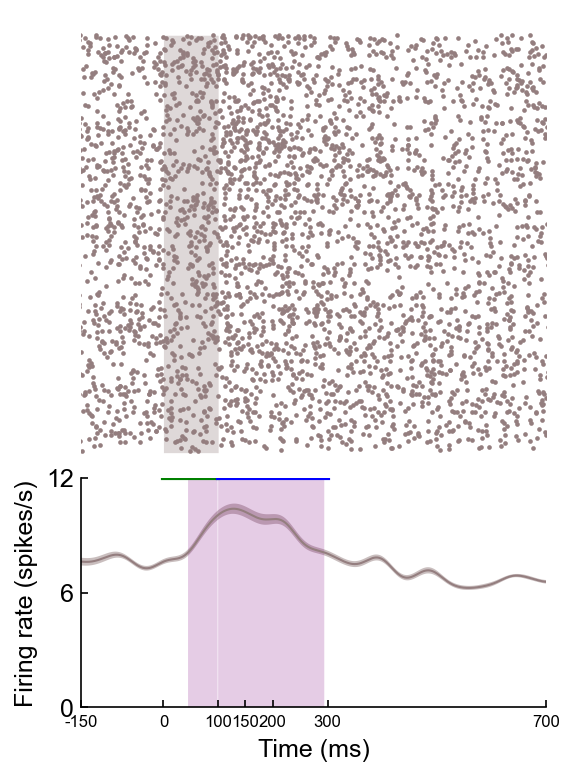

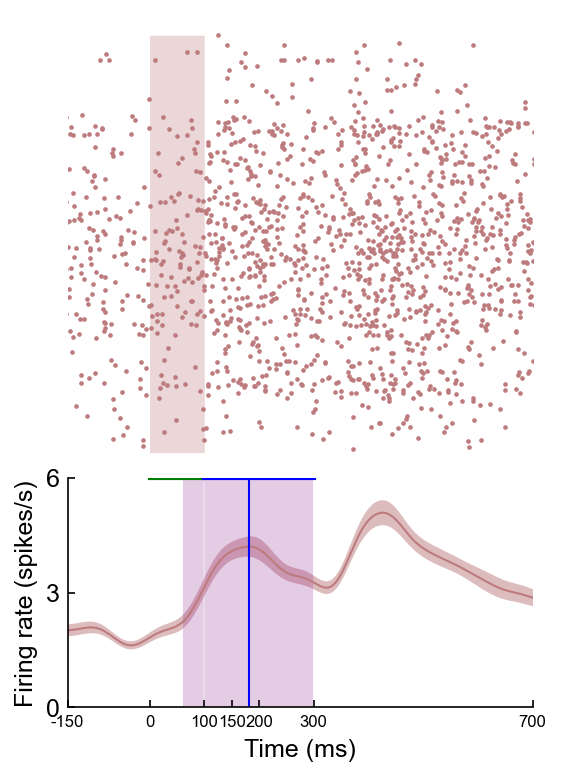

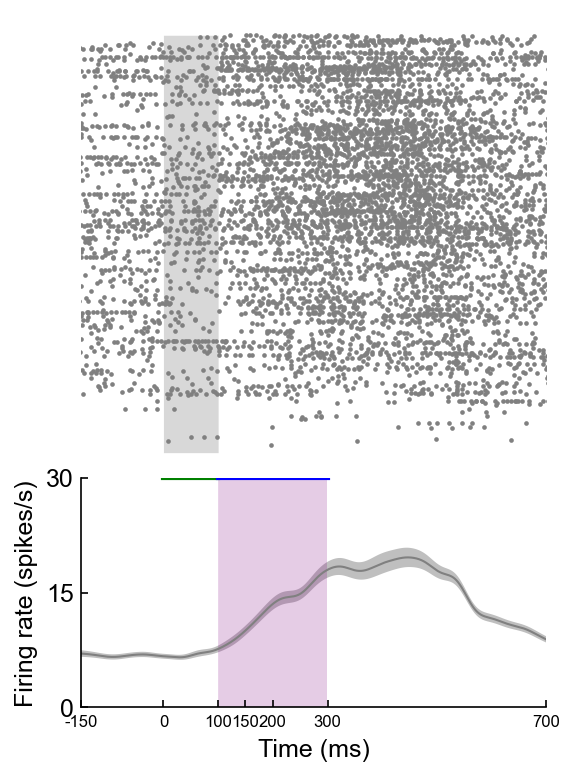

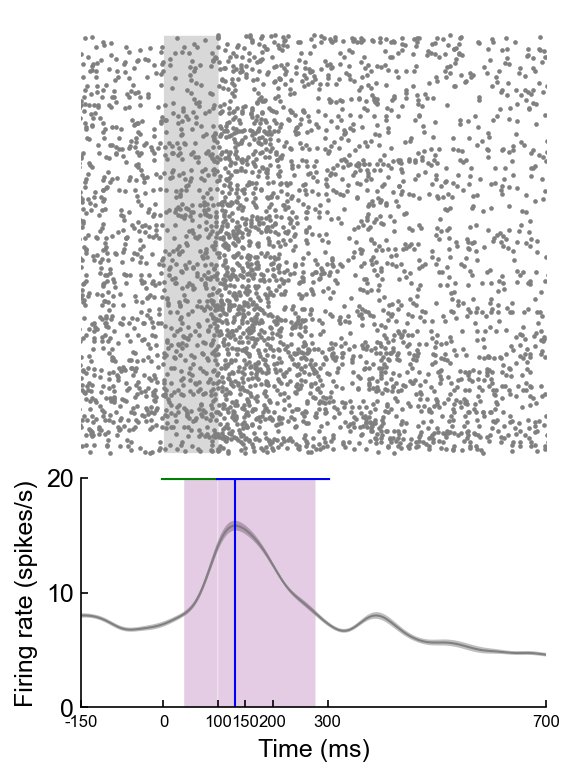

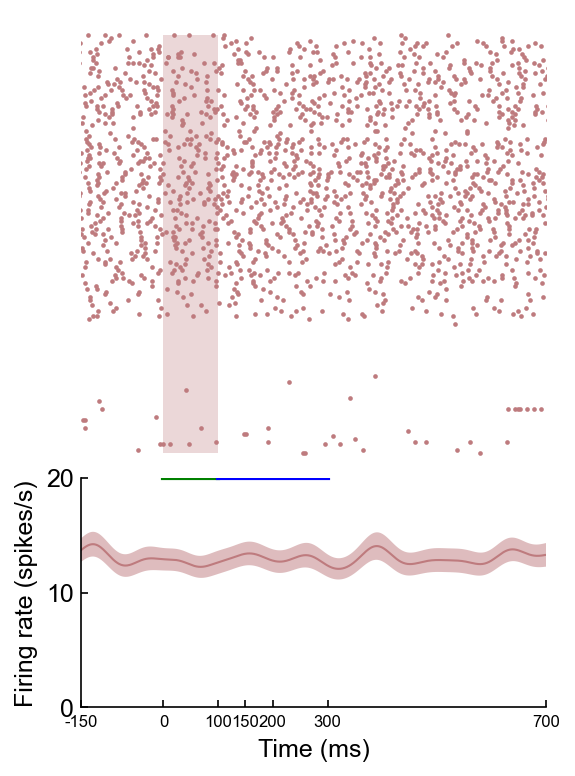

In [1285]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_50_7_M2.pickle')
for clust in sessionfile.clusters.good:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= M2_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

0
19
174
49.714285714285715
Evoked
peak
16
92
26.285714285714285
Evoked
199
56.857142857142854
Evoked
32
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
38
87
24.857142857142858
Evoked
199
56.857142857142854
Evoked
43
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
48
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
65
80
22.857142857142858
Evoked
199
56.857142857142854
Evoked
peak
71
29
8.285714285714286
Evoked
199
56.857142857142854
Evoked
74
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak


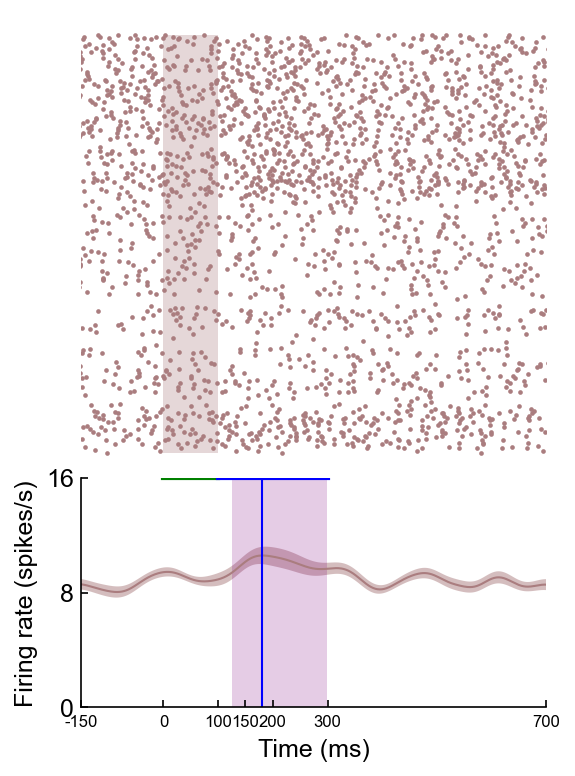

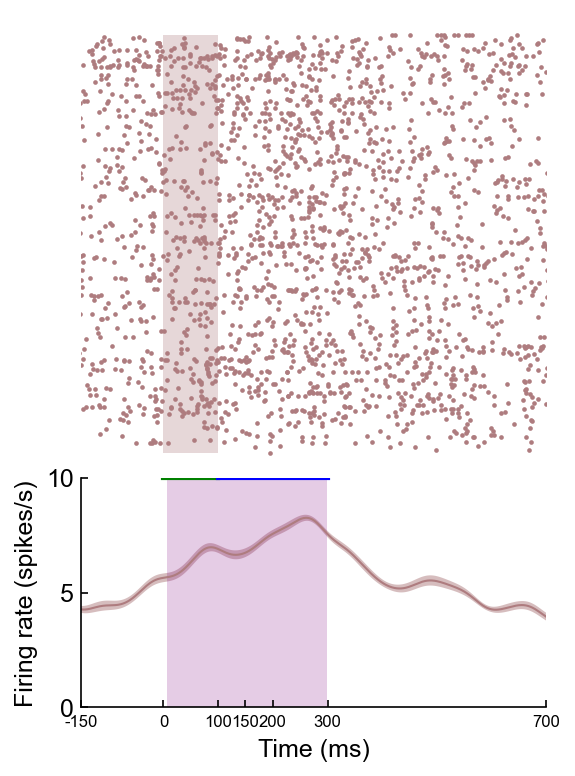

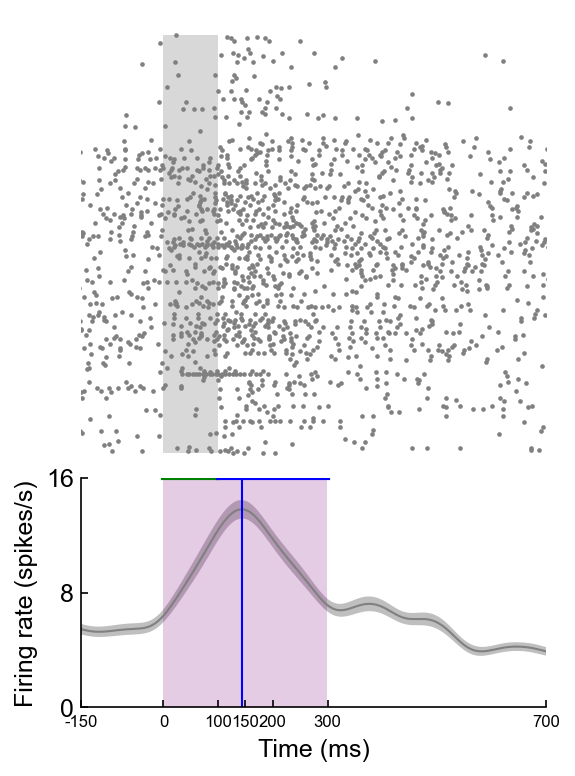

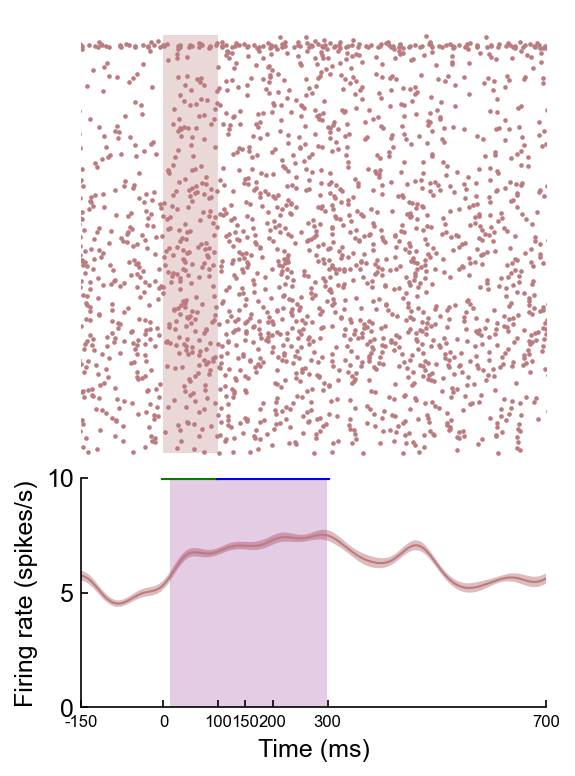

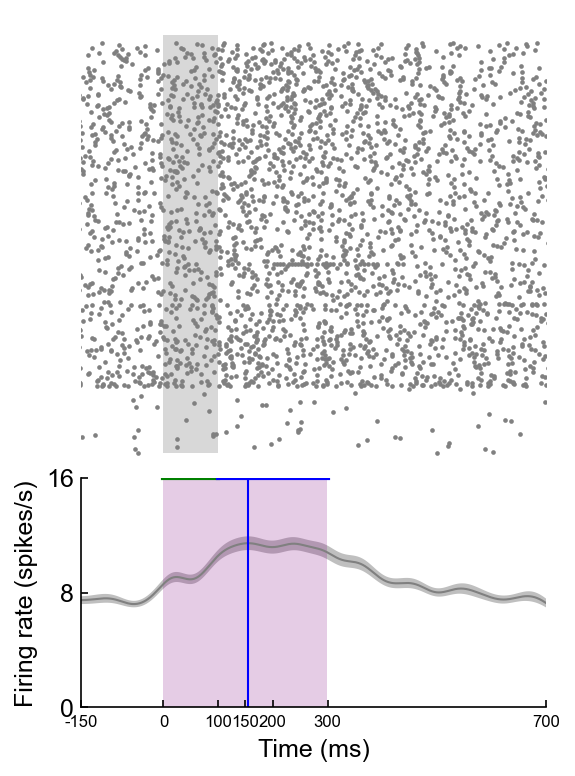

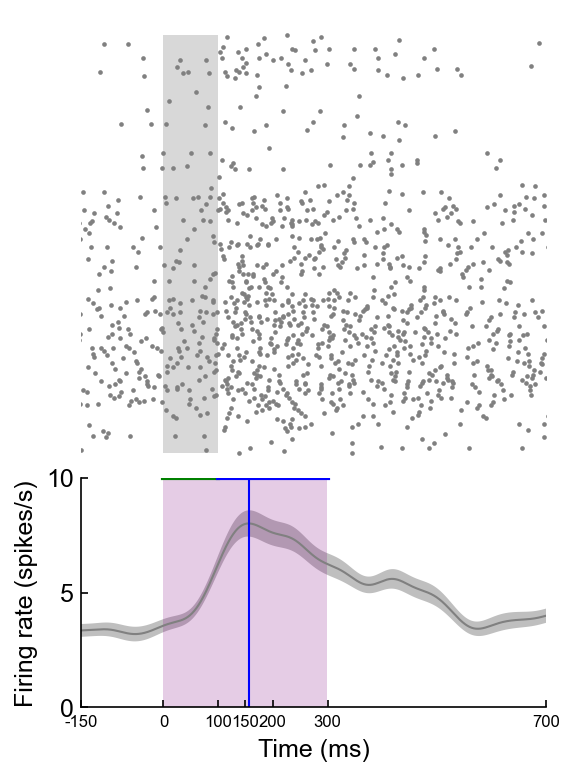

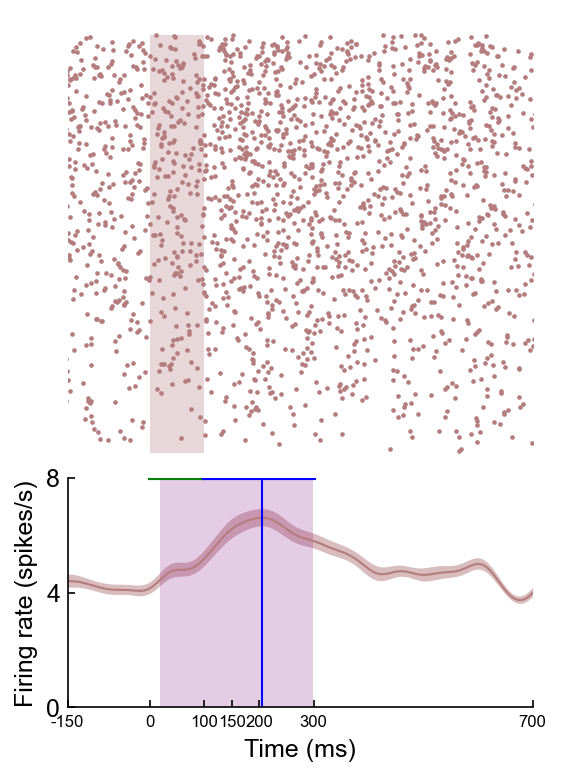

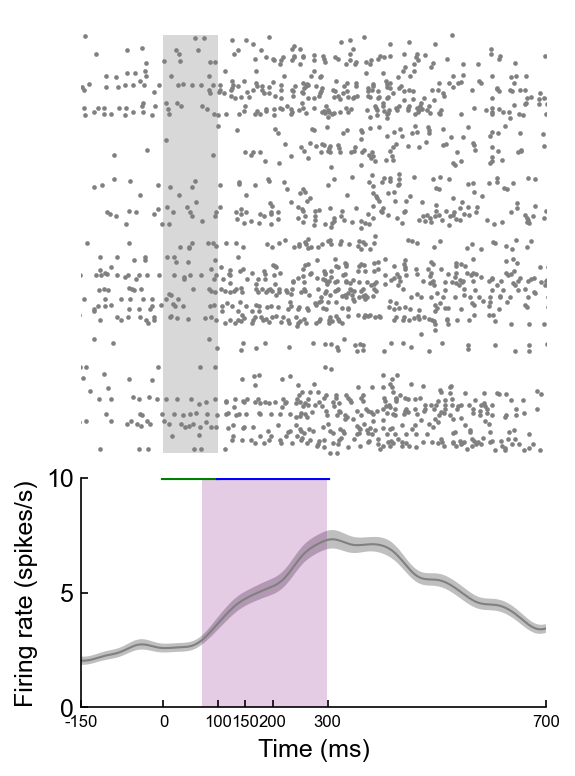

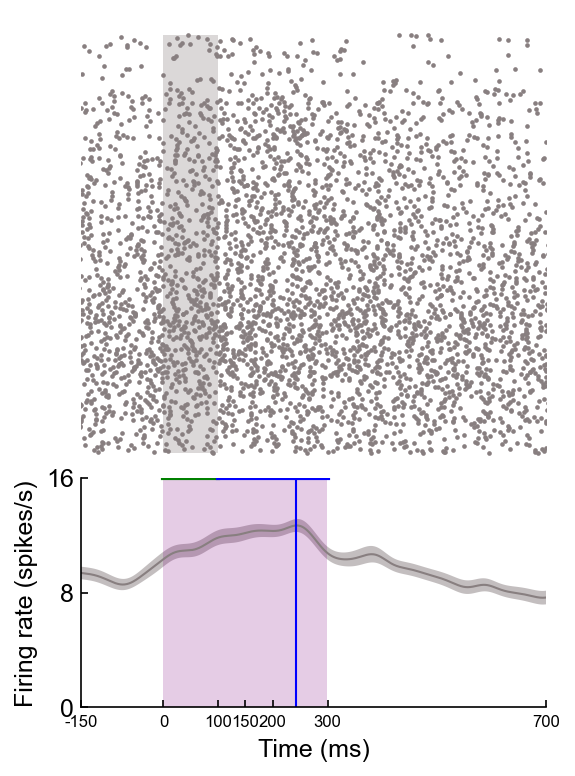

In [1286]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_50_6_M2.pickle')
for clust in sessionfile.clusters.good:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= M2_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

1
80
22.857142857142858
Evoked
199
56.857142857142854
Evoked
peak
3
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
9
35
10.0
Evoked
199
56.857142857142854
Evoked
13
31
8.857142857142858
Evoked
199
56.857142857142854
Evoked
16
92
26.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
28
98
28.0
Evoked
199
56.857142857142854
Evoked
33
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
47
58
16.571428571428573
Evoked
199
56.857142857142854
Evoked
peak
49
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
77
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
90
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
99
74
21.142857142857142
Evoked
199
56.857142857142854
Evoked
peak
104
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
105
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
106
56
16.0
Evoked
199
56.857142857142854
Evoked
peak


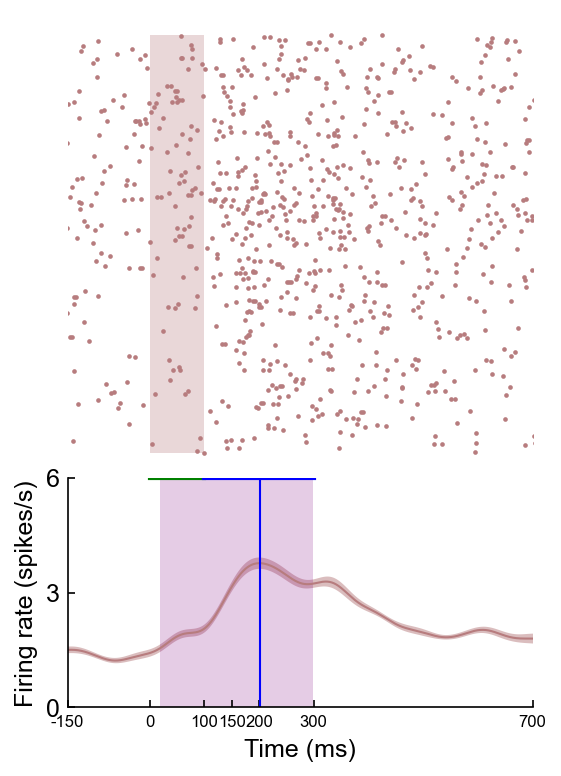

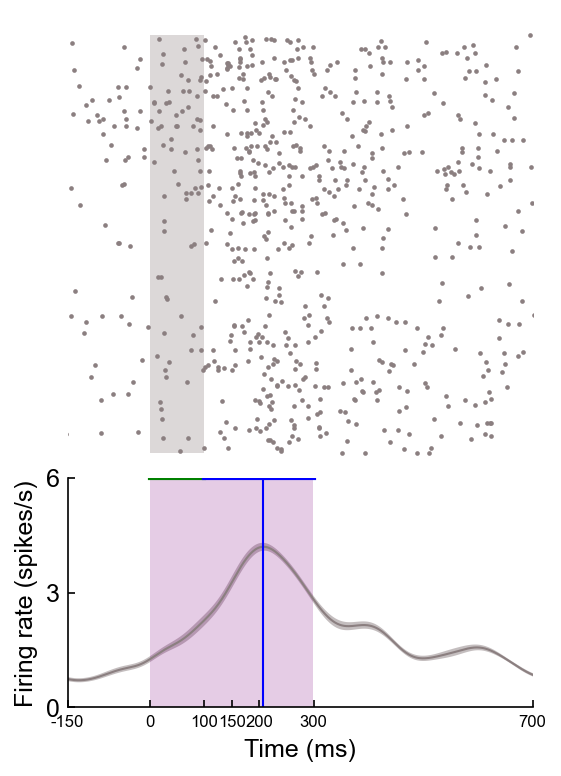

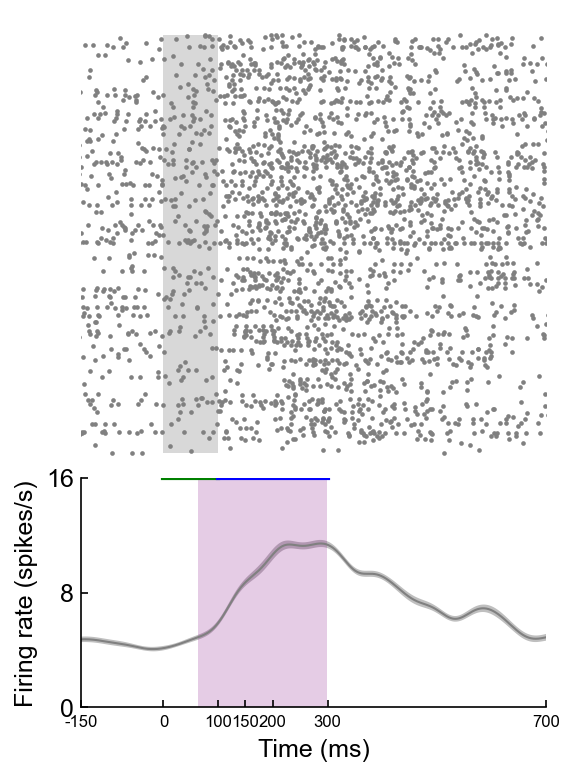

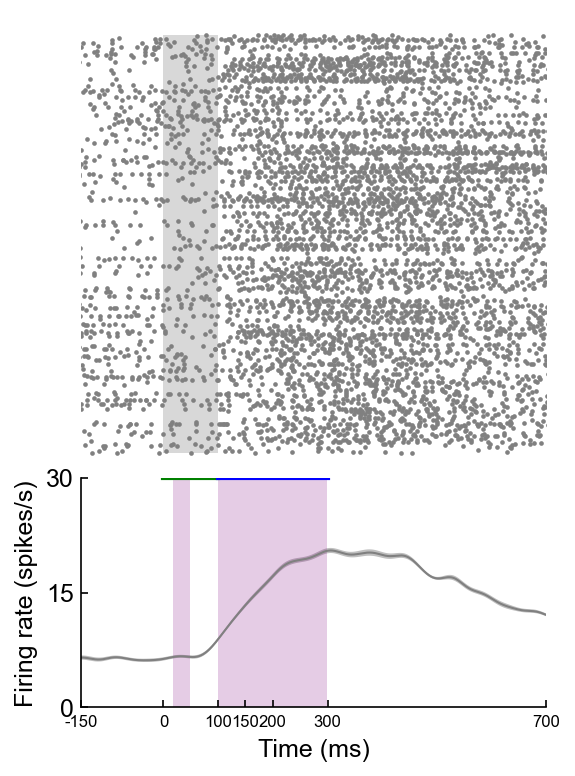

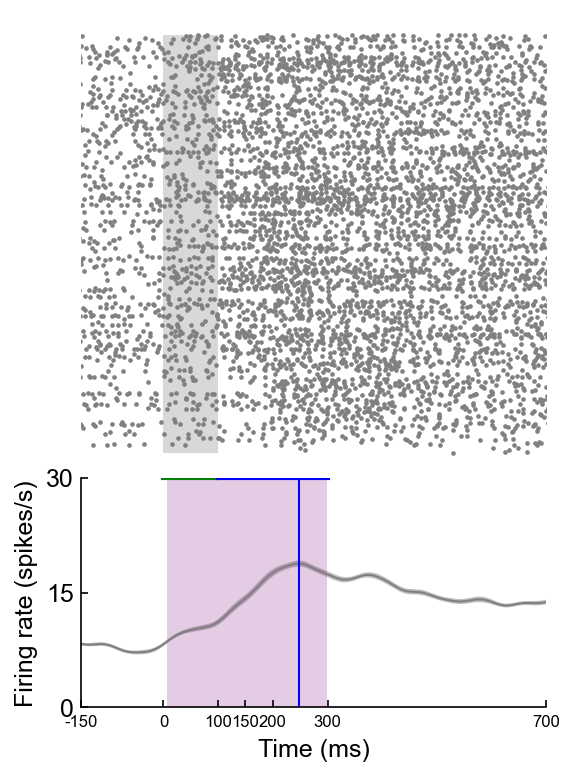

...

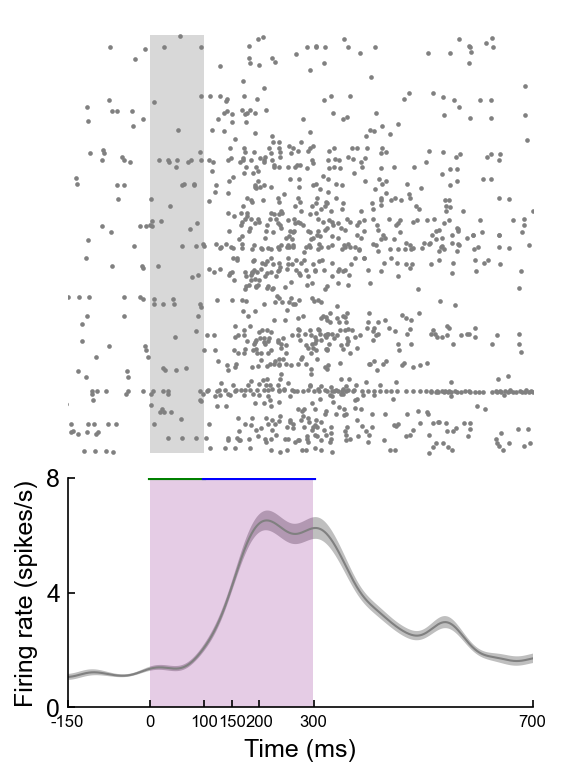

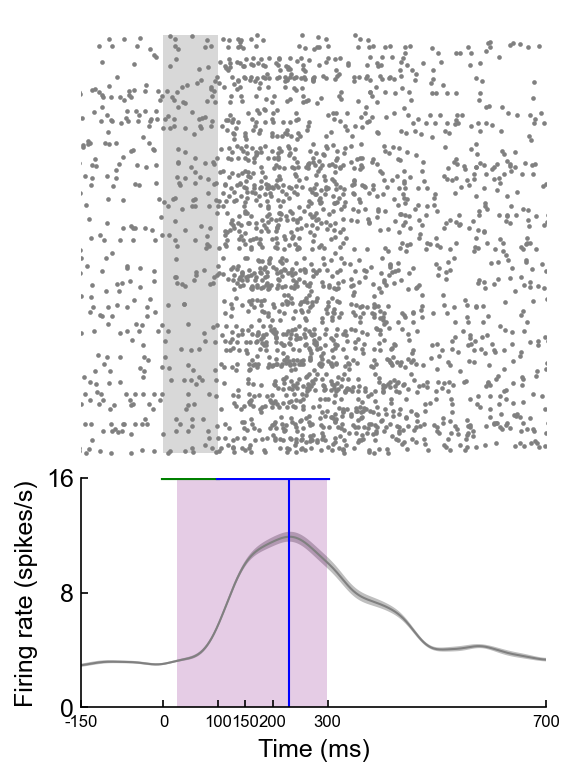

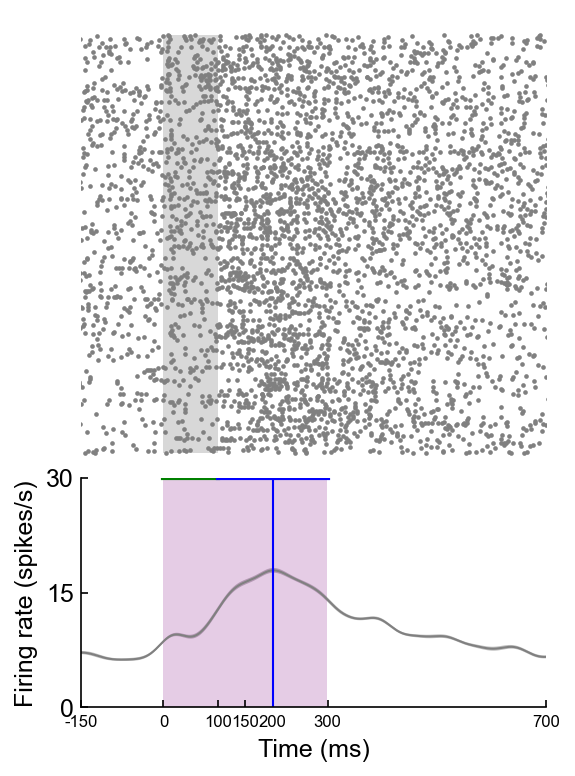

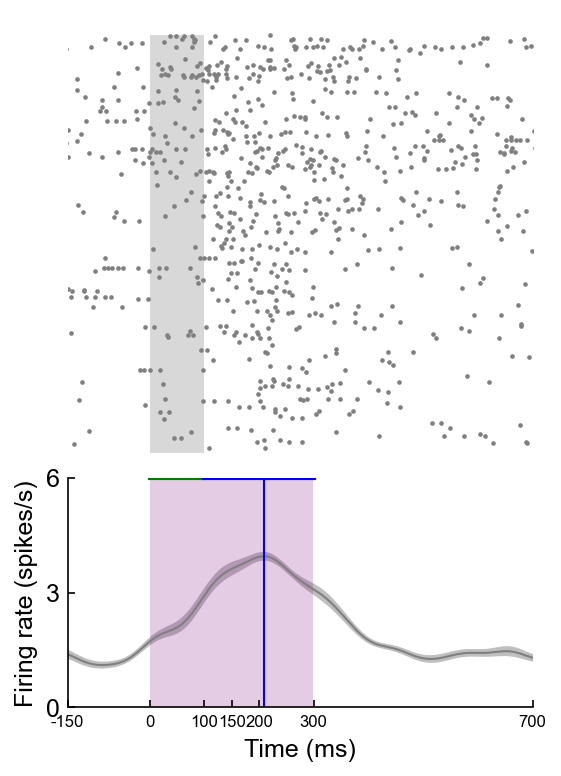

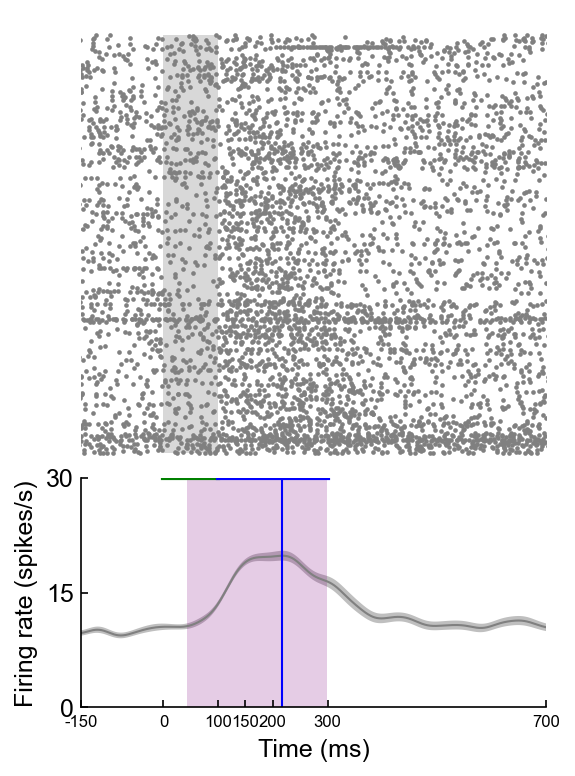

In [1287]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_11_M2.pickle')
for clust in sessionfile.clusters.good:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= M2_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

0
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
2
99
28.285714285714285
Suppressed
199
56.857142857142854
Suppressed
peak
22
49
14.0
Evoked
199
56.857142857142854
Evoked
peak
25
78
22.285714285714285
Evoked
199
56.857142857142854
Evoked
26
83
23.714285714285715
Evoked
133
38.0
Evoked
35
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
37
73
20.857142857142858
Suppressed
199
56.857142857142854
Suppressed
38
81
23.142857142857142
Evoked
199
56.857142857142854
Evoked
42
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
46
69
19.714285714285715
Evoked
183
52.285714285714285
Evoked
47
2
199
56.857142857142854
Evoked
48
50
14.285714285714286
Suppressed
199
56.857142857142854
Evoked
peak
51
99
28.285714285714285
Evoked
84
24.0
Evoked
61
51
14.571428571428571
Evoked
199
56.857142857142854
Evoked
69
89
25.428571428571427
Evoked
199
56.857142857142854
Evoked
70
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
71
9
199
56.857142857142854
Evoked
81
99

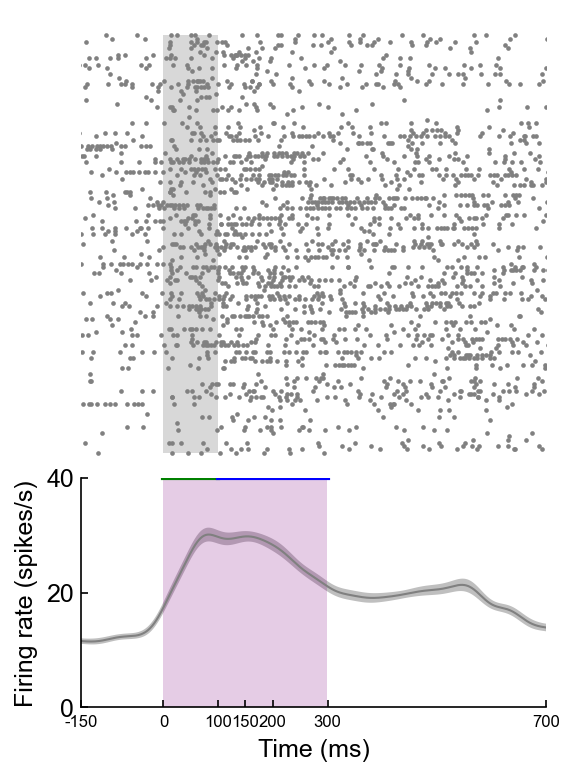

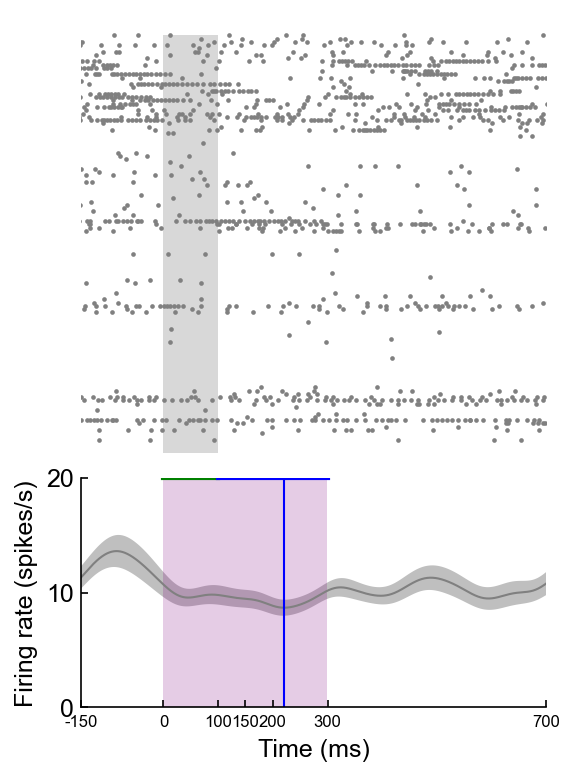

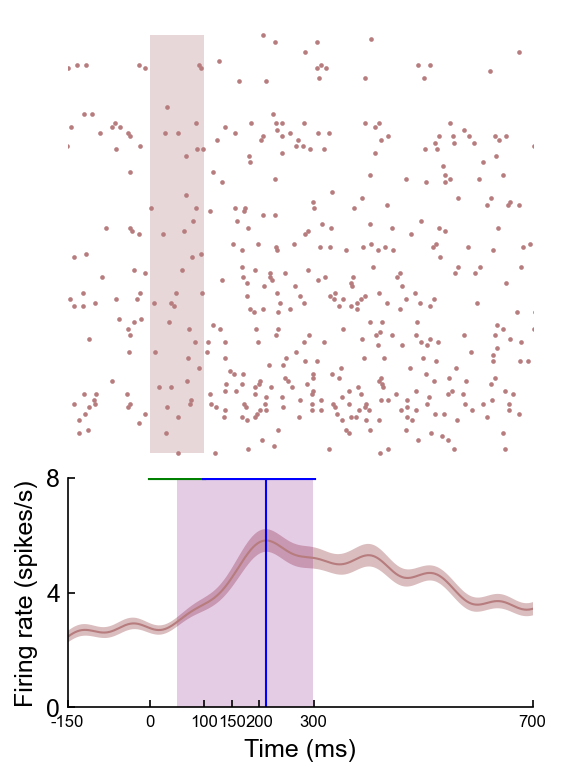

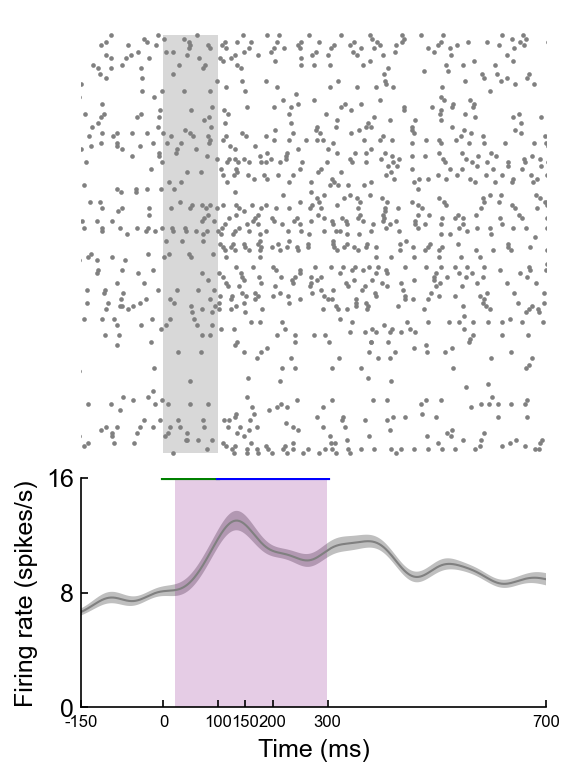

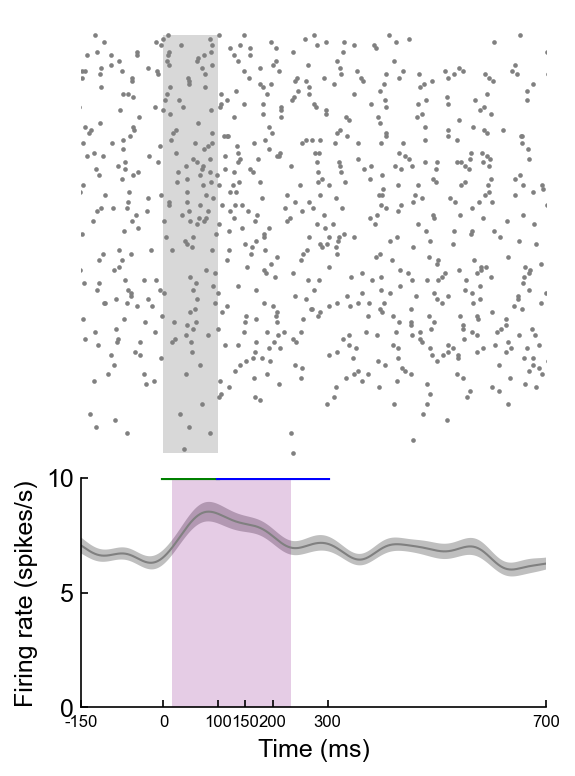

...

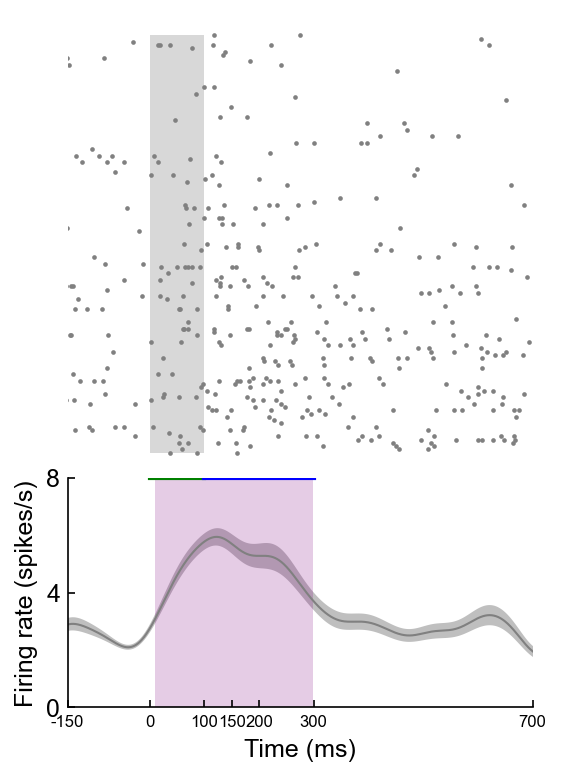

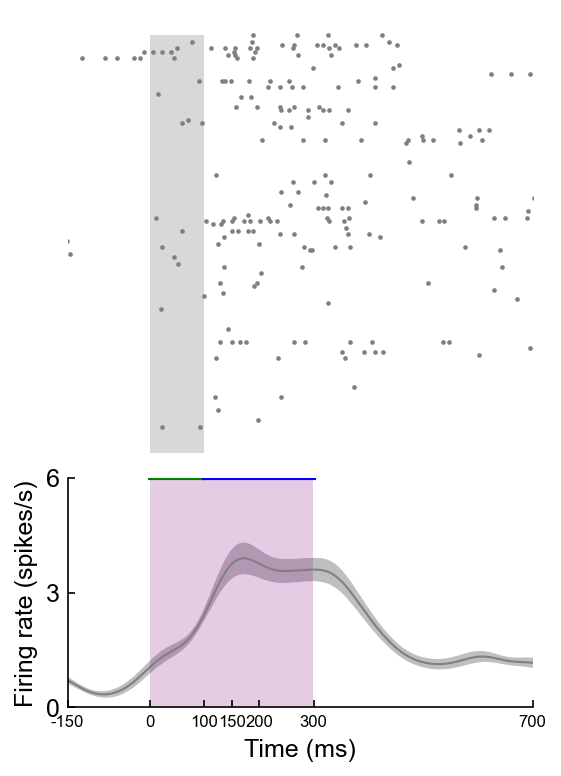

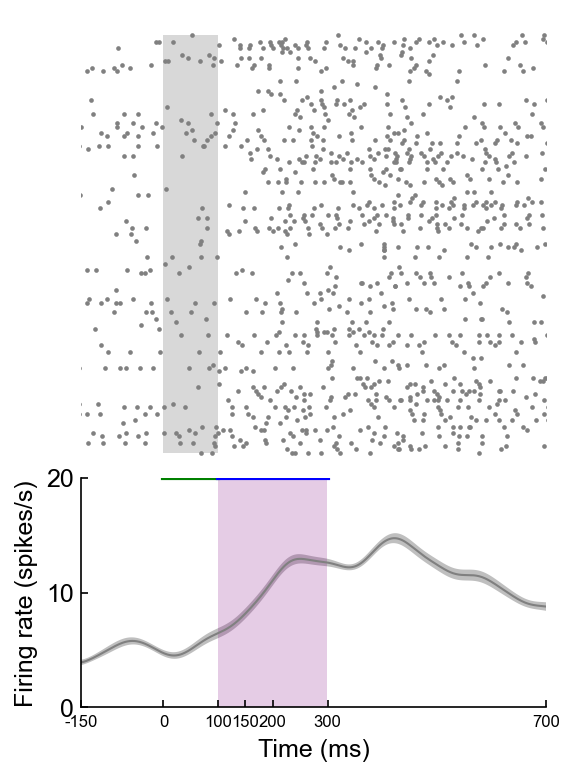

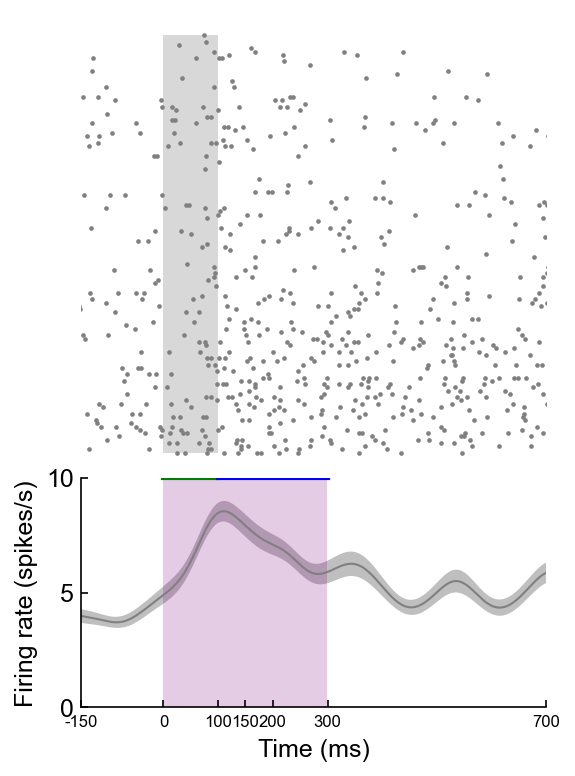

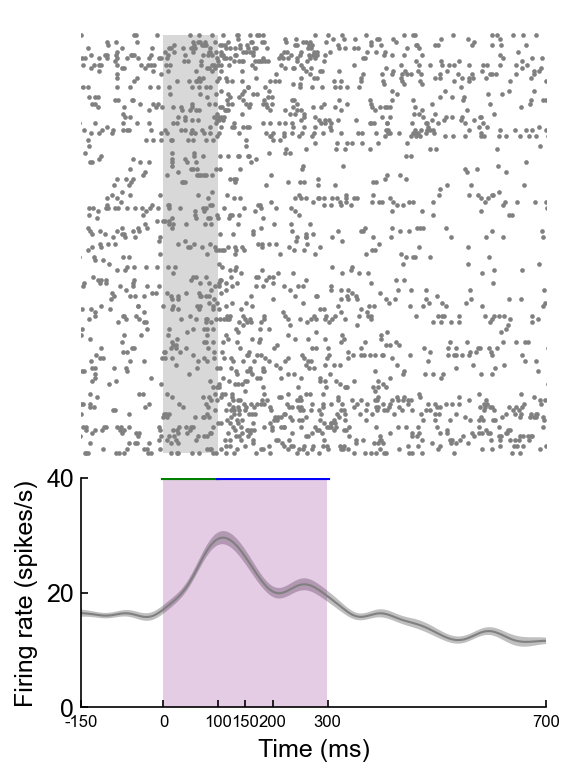

In [1288]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_50_2_M2.pickle')
for clust in sessionfile.clusters.good:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= M2_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

7
97
27.714285714285715
Evoked
199
56.857142857142854
Evoked
peak
11
69
19.714285714285715
Evoked
199
56.857142857142854
Evoked
17
86
24.571428571428573
Evoked
199
56.857142857142854
Evoked
21
42
12.0
Suppressed
199
56.857142857142854
Evoked
peak
25
99
28.285714285714285
Evoked
199
56.857142857142854
Evoked
peak
32
3
199
56.857142857142854
Evoked
peak


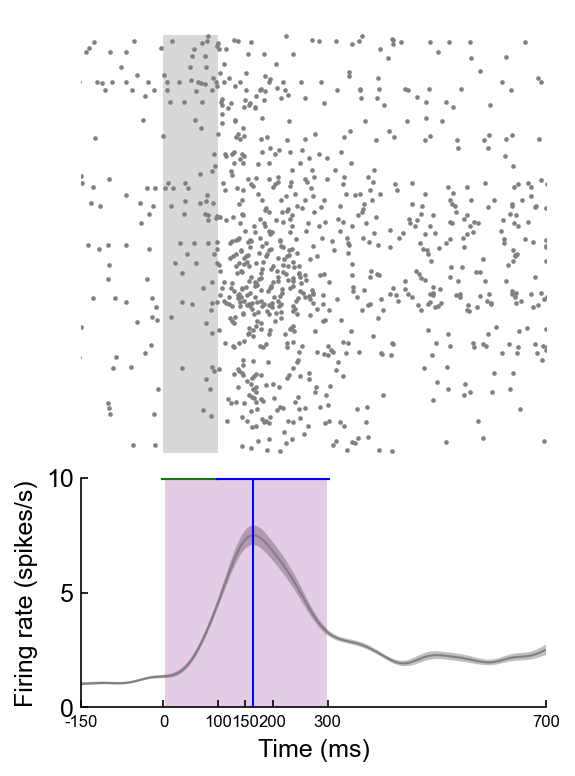

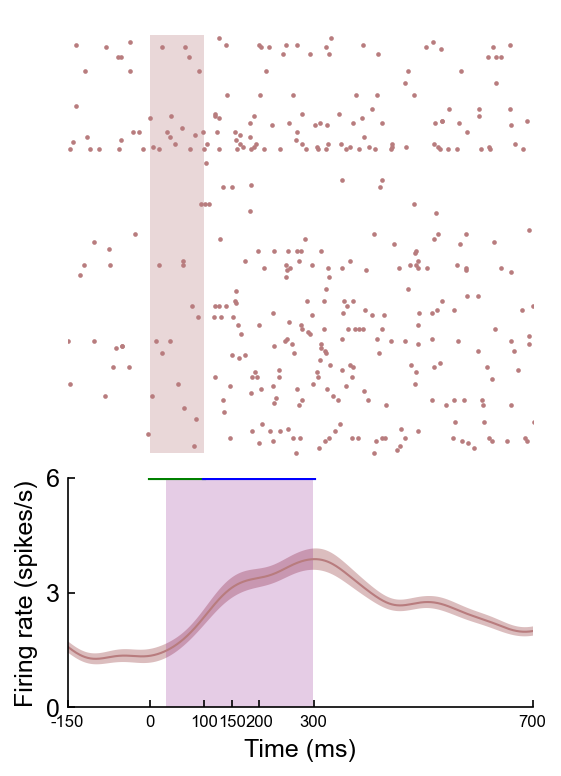

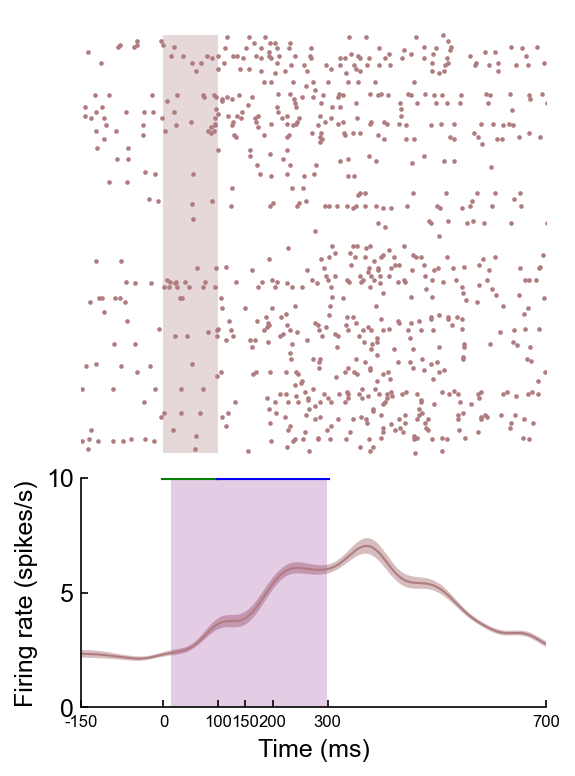

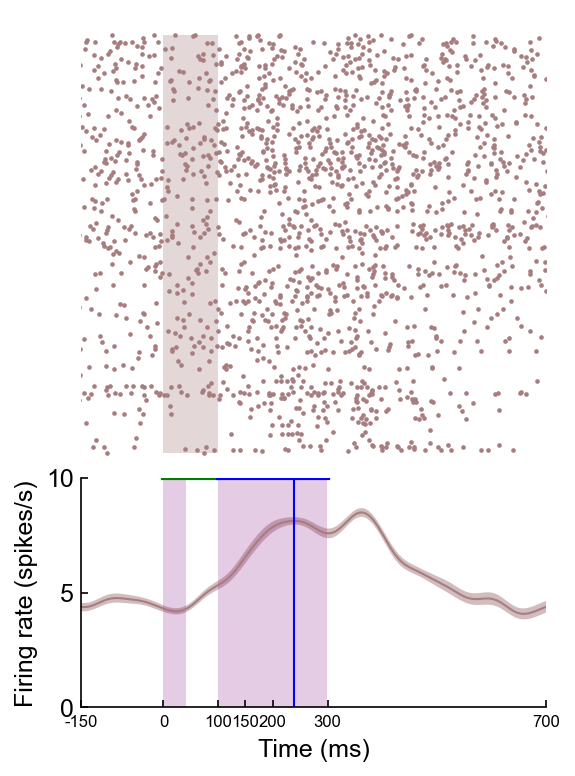

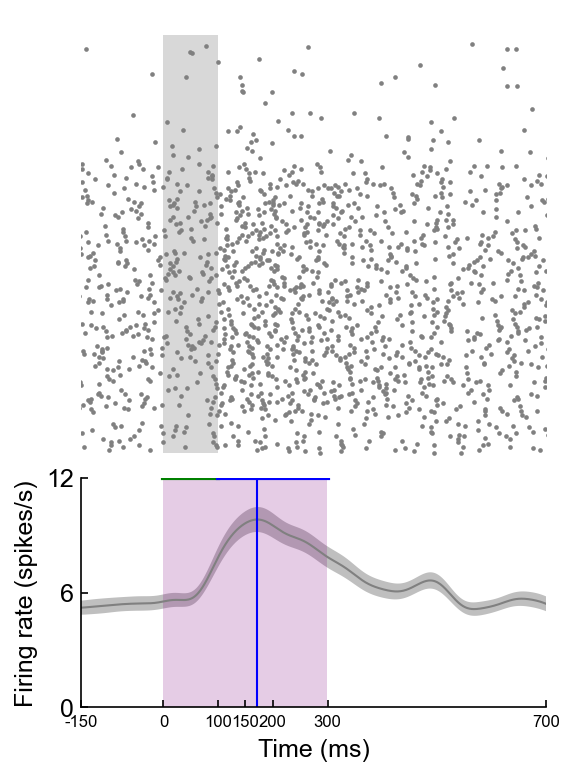

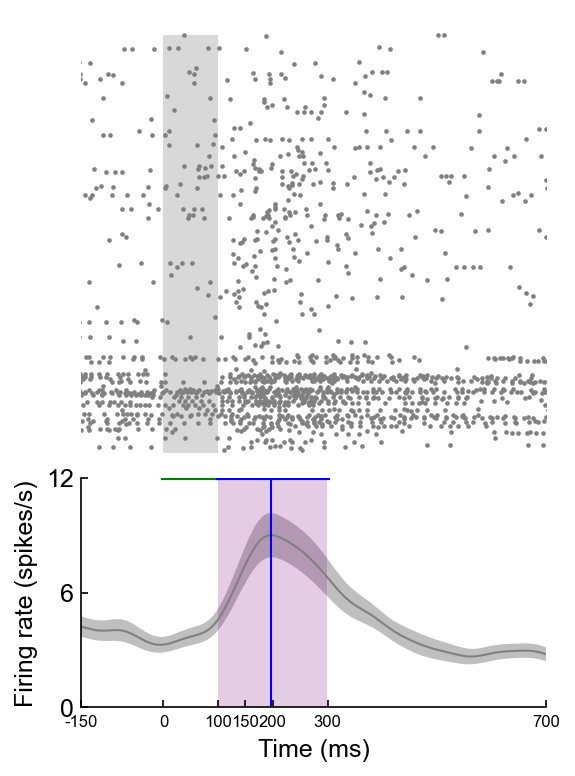

In [1289]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_72_7_M2.pickle')
for clust in sessionfile.clusters.good:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= M2_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

## AC

In [1145]:
import scipy
def visualizeClusterInternal(sessionfile,clust):
    def consecutive(data, stepsize=1):
        return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)
    
    bw_scott_factor = 4
    #bw_scott_factor = 6

    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    mn = AC_FRmod_baseline_median 
    #mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
    ax2.plot([100,200],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
    ax2.set_xlim([-150,700])
    ax2.set_xticks([-150,0,100,150,200,700])
    ax2.set_xticklabels(['-150','0','100','150','200','700'],size=8)
    ax2.set_xlabel('Time (ms)',size=12)
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms #print(spon_FR.shape) #(10, 150)
    avg_spon_FR = np.mean(spon_FR,axis=0)
    mean_spon_FR = np.mean(avg_spon_FR)
    std_spon_FR = np.std(avg_spon_FR)
    
    ########calculate tone response activity
    def calculate_tone_response(tone_res_FR,response_type):
        avg_tone_res_FR = np.mean(tone_res_FR,axis=0)
        #max_tone_res_FR = np.max(tone_res_FR)
        #print(max_tone_res_FR)
        #print(max_tone_res_FR/4)
        
        tone_res_diff = avg_tone_res_FR - mean_spon_FR
        
        tone_res_diff_abs = np.abs(tone_res_diff)
        tone_res_check = tone_res_diff_abs > 2*std_spon_FR
        


        tone_modulation = 'Evoked'
        
        if np.any(tone_res_check == True):
            
            
            tone_res_time = np.where(tone_res_check)[0]

            tone_res_time_periods = consecutive(tone_res_time, stepsize=1)
            #print(tone_res_time_periods)

            #print(len(tone_res_time_periods))
            tone_res_time_periods = tone_res_time_periods[0]

            peak_start = tone_res_time_periods[0]
            peak_end = tone_res_time_periods[-1]                
                
            if peak_end - peak_start >=25:
                if response_type == 'OFF':
                    ax2.fill_betweenx(range(len(trialsToPlot)), peak_start+100,peak_end+100, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                else:
                    ax2.fill_betweenx(range(len(trialsToPlot)), peak_start,peak_end, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                
                prominence = 0.2
                width = width
                if diff<0:
                    tone_modulation = 'Suppressed'
                    peaks,properties = scipy.signal.find_peaks(-avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                else:
                    peaks,properties = scipy.signal.find_peaks(avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    

                if peaks.size!=0:
                    if response_type == 'OFF':
                        peak = peaks[0]+peak_start+100
                    else:
                        peak = peaks[0]+peak_start
                    
                    print(peak)
                    ax2.axvline(peak,0,color='blue',linewidth=1)
                    
    #############
    tone_res_FR1 = FR[:,350:450]
    calculate_tone_response(tone_res_FR1,'ON')
    
    tone_res_FR2 = FR[:,450:550]
    calculate_tone_response(tone_res_FR2,'OFF')
    


    #########################

    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\AC\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
        
    #plt.close(fig)
    
    return fig

In [1321]:
import scipy
def visualizeClusterInternal(sessionfile,clust):
    def consecutive(data, stepsize=1):
        return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)
    
    bw_scott_factor = 4
    #bw_scott_factor = 6

    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    mn = AC_FRmod_baseline_median 
    #mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
    ax2.plot([100,200],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
    ax2.set_xlim([-150,700])
    ax2.set_xticks([-150,0,100,150,200,300,700])
    ax2.set_xticklabels(['-150','0','100','150','200','300','700'],size=8)
    ax2.set_xlabel('Time (ms)',size=12)
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms #print(spon_FR.shape) #(10, 150)
    avg_spon_FR = np.mean(spon_FR,axis=0)
    mean_spon_FR = np.mean(avg_spon_FR)
    std_spon_FR = np.std(avg_spon_FR)
    
    ########calculate tone response activity
    def calculate_tone_response(tone_res_FR,response_type):
        avg_tone_res_FR = np.mean(tone_res_FR,axis=0)
        #max_tone_res_FR = np.max(tone_res_FR)
        #print(max_tone_res_FR)
        #print(max_tone_res_FR/4)
        
        tone_res_diff = avg_tone_res_FR - mean_spon_FR
        
        tone_res_diff_abs = np.abs(tone_res_diff)
        tone_res_check = tone_res_diff_abs > 2*std_spon_FR
        


        tone_modulation = 'Evoked'
        peak = 1000
        
        if np.any(tone_res_check == True):
            tone_res_time = np.where(tone_res_check)[0]

            tone_res_time_periods = consecutive(tone_res_time, stepsize=1)

            #print(tone_res_time_periods)
            #print(len(tone_res_time_periods))
            
            tone_res_time_periods = tone_res_time_periods[0]

            peak_start = tone_res_time_periods[0]
            peak_end = tone_res_time_periods[-1]                
            
            tone_response_window_length = peak_end - peak_start
            #print(tone_response_window_length)
            
            if peak_end - peak_start >=25:
                # ax2.fill_betweenx(range(len(trialsToPlot)), peak_start,peak_end, alpha=0.2, color='purple', lw=0)
                # mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                # diff = mean_tone_window_FR - mean_spon_FR
                    
                if response_type == 'OFF':
                    ax2.fill_betweenx(range(len(trialsToPlot)), peak_start+100,peak_end+100, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                else:
                    ax2.fill_betweenx(range(len(trialsToPlot)), peak_start,peak_end, alpha=0.2, color='purple', lw=0)
                    mean_tone_window_FR = np.mean(avg_tone_res_FR[peak_start:peak_end])
                    diff = mean_tone_window_FR - mean_spon_FR
                
                prominence = 0.4
                #width = tone_response_window_length/3
                width = tone_response_window_length/3.5
                #print(width)
                if diff<0:
                    tone_modulation = 'Suppressed'
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(-avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                else:
                    #print(tone_modulation)
                    peaks,properties = scipy.signal.find_peaks(avg_tone_res_FR[peak_start:peak_end], prominence=prominence,width=width)
                    
                if peaks.size!=0:
                    print('peak')
                    # onset_num = 0
                    # offset_num = 0
                    # for peak in peaks:
                    #     peak = peak+peak_start
                    #     if peak <=200 and peak>100 and offset_num==0:
                    #         ax2.axvline(peak,0,color='blue',linewidth=1)
                    #         print(peak)
                    #         offset_num = 1
                    #     if peak<=100 and onset_num==0:
                    #         ax2.axvline(peak,0,color='green',linewidth=1)
                    #         print(peak)
                    #         onset_num = 1
                    # print(offset_num)

                    if response_type == 'OFF':
                        peak = peaks[0]+peak_start+100
                        ax2.axvline(peak,0,color='blue',linewidth=1)
                        print(peak)

                    else:
                        peak = peaks[0]+peak_start
                        ax2.axvline(peak,0,color='green',linewidth=1)
                        print(peak)
                else:
                    print('no peak')
                    peak = 1000

            
        return peak
                    

                    
    #############
    tone_res_FR1 = FR[:,350:450]
    onset_peak = calculate_tone_response(tone_res_FR1,'ON')
    
    tone_res_FR2 = FR[:,450:550]
    offset_peak = calculate_tone_response(tone_res_FR2,'OFF')
    
    
    


    #########################

    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\M2\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
        
    #plt.close(fig)
    
    return fig,onset_peak,offset_peak

peak
57


1000

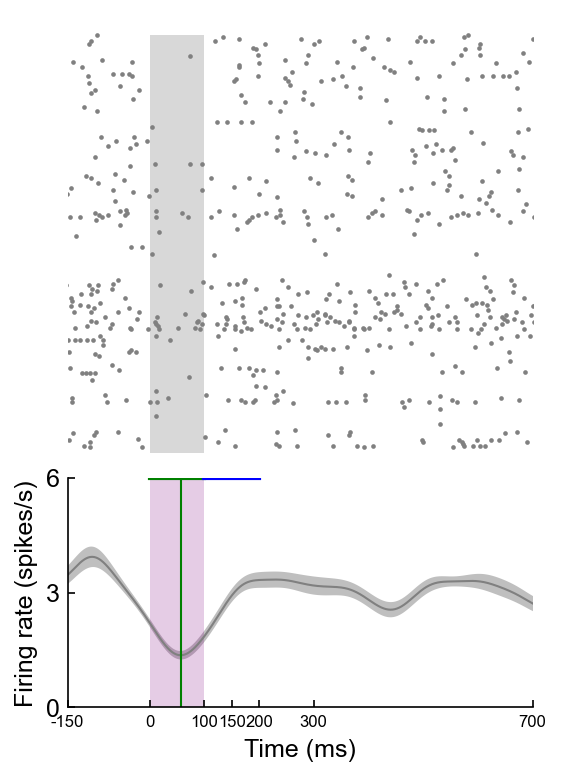

In [1324]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_AC.pickle')
visualizeClusterInternal(sessionfile,62)[2]

peak
46
peak
161


46

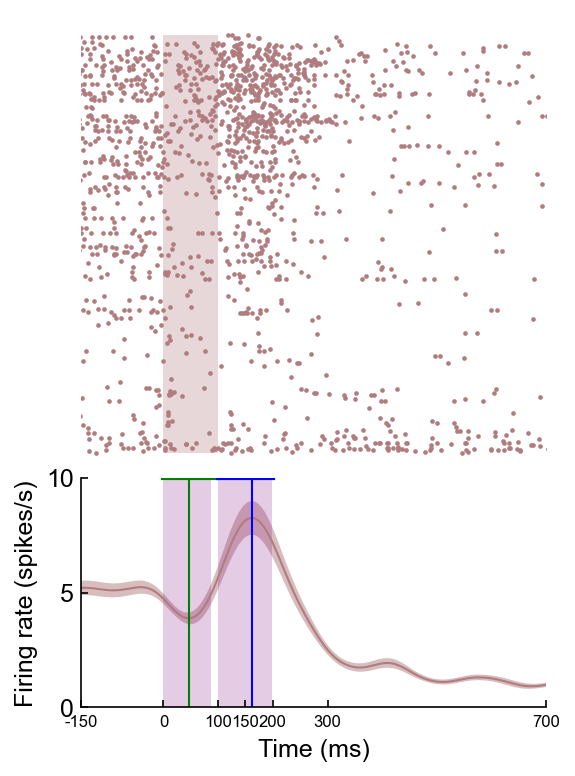

In [1328]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_42_2_AC.pickle')
visualizeClusterInternal(sessionfile,3)[1]

peak
46
peak
161


161

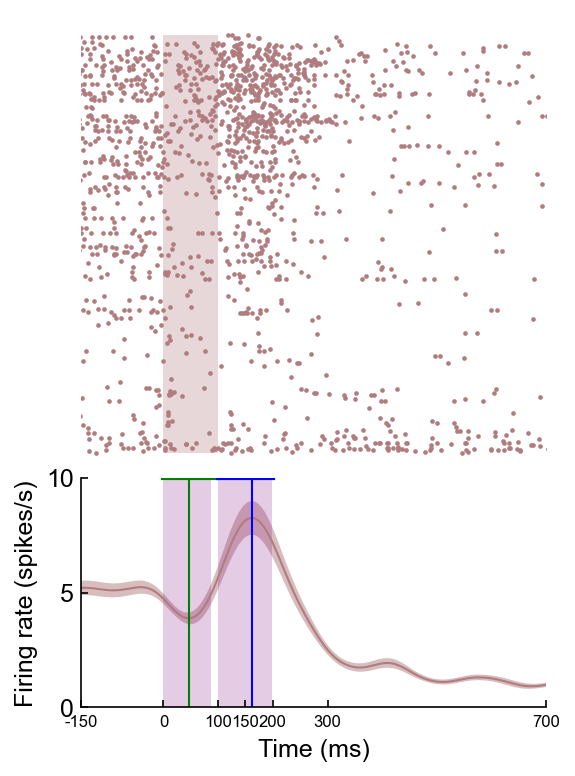

In [1329]:
visualizeClusterInternal(sessionfile,3)[2]

28.285714285714285
peak
57


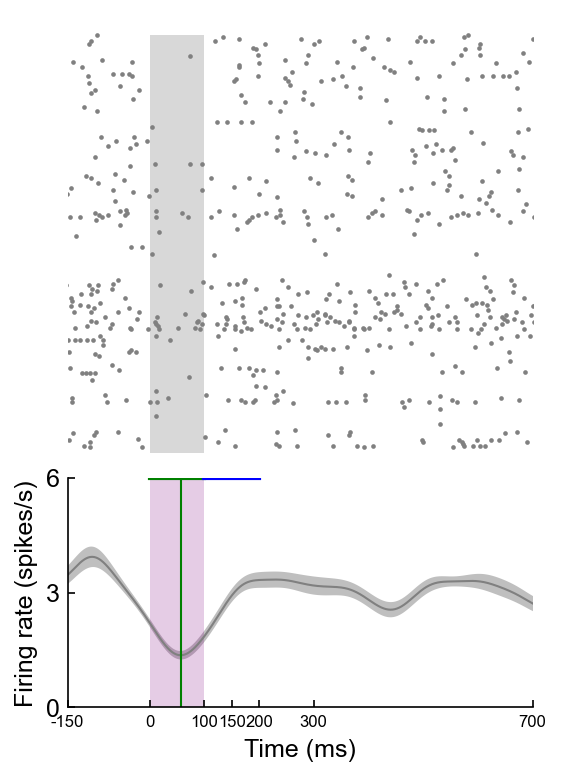

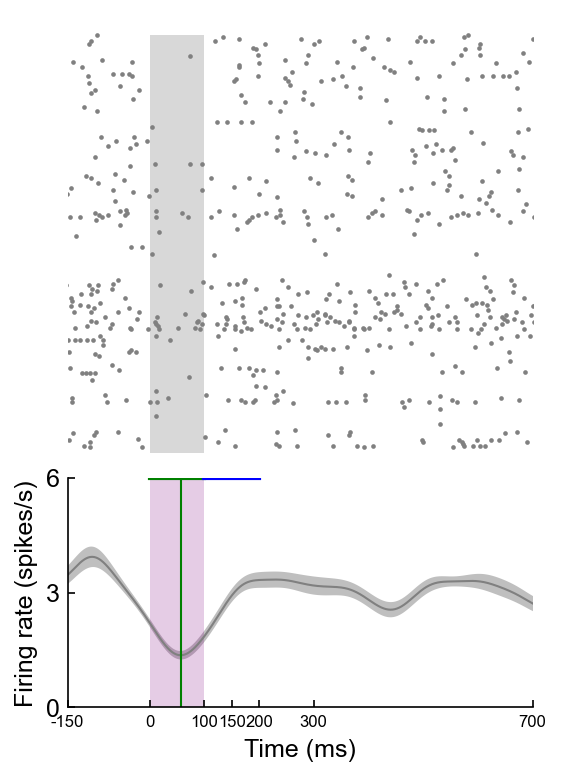

In [1295]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_AC.pickle')
visualizeClusterInternal(sessionfile,62)

73
99
28.285714285714285
Evoked
peak
99
28.285714285714285
Evoked
126
99
28.285714285714285
Evoked
peak
74
21.142857142857142
Evoked
133
99
28.285714285714285
Evoked
peak
65
18.571428571428573
Evoked


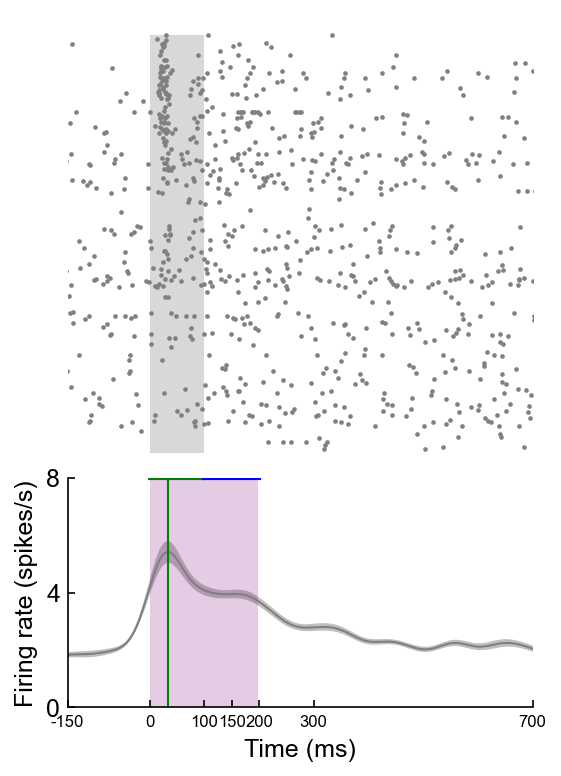

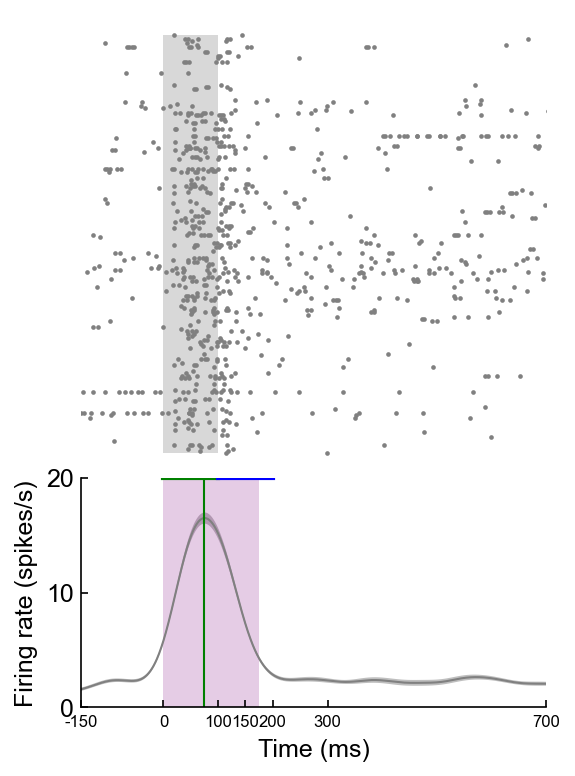

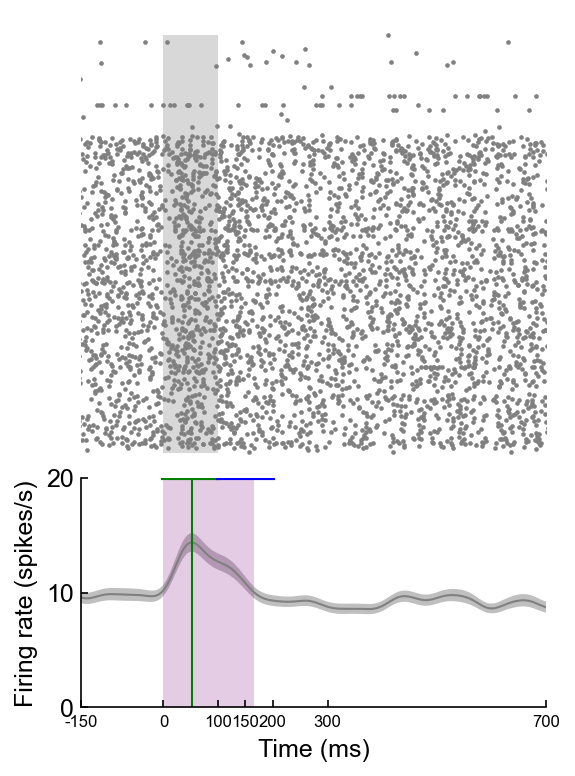

In [1268]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_108_6_AC.pickle')
#visualizeClusterInternal(sessionfile,126)
for clust in sessionfile.clusters.good[-10:]:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= AC_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

36
10.285714285714286
Evoked
peak


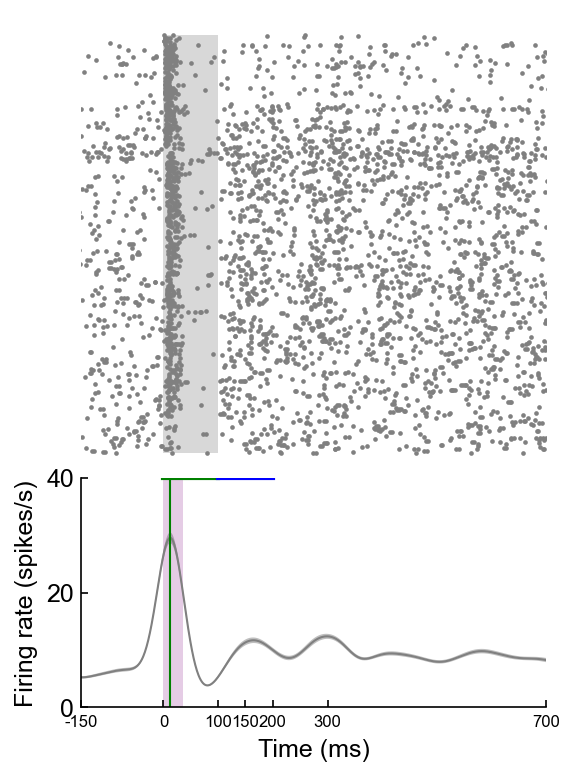

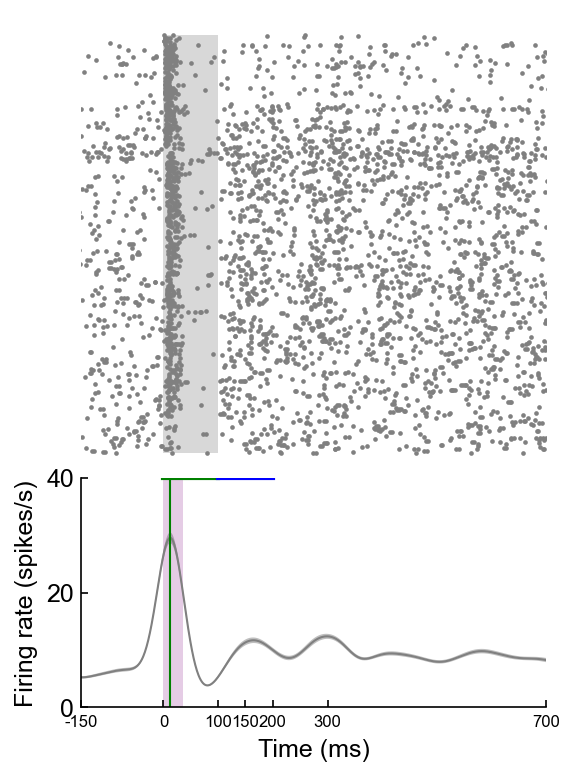

In [1270]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_72_4_AC.pickle')
visualizeClusterInternal(sessionfile,115)

87
24.857142857142858
Suppressed
peak
99
28.285714285714285
Evoked
peak


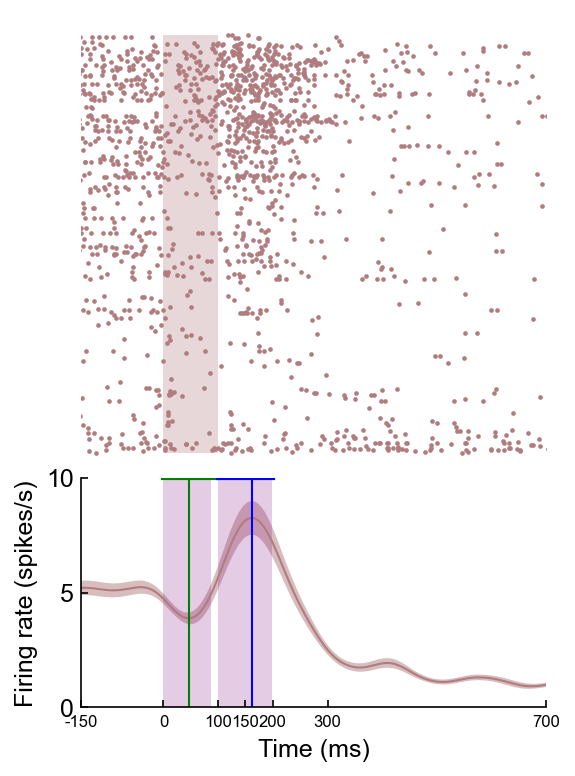

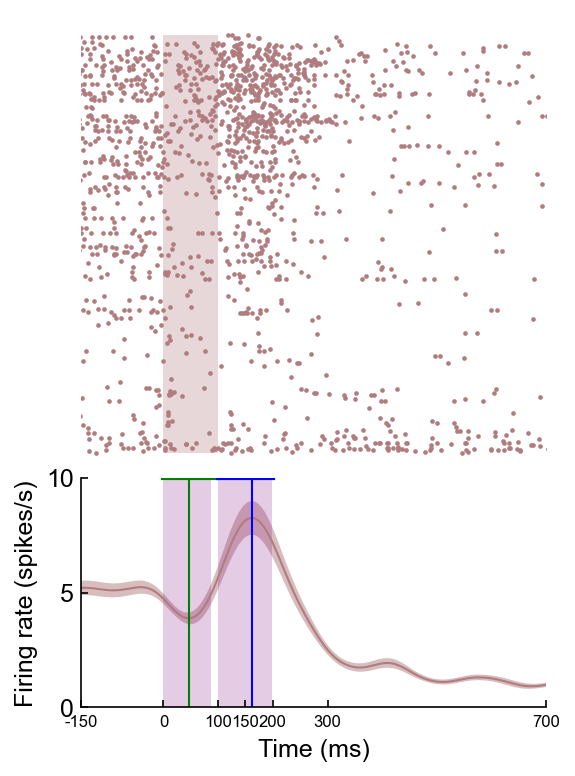

In [1271]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_42_2_AC.pickle')
visualizeClusterInternal(sessionfile,3)

7
99
28.285714285714285
Evoked
peak
99
28.285714285714285
Evoked
14
99
28.285714285714285
Evoked
peak
99
28.285714285714285
Evoked


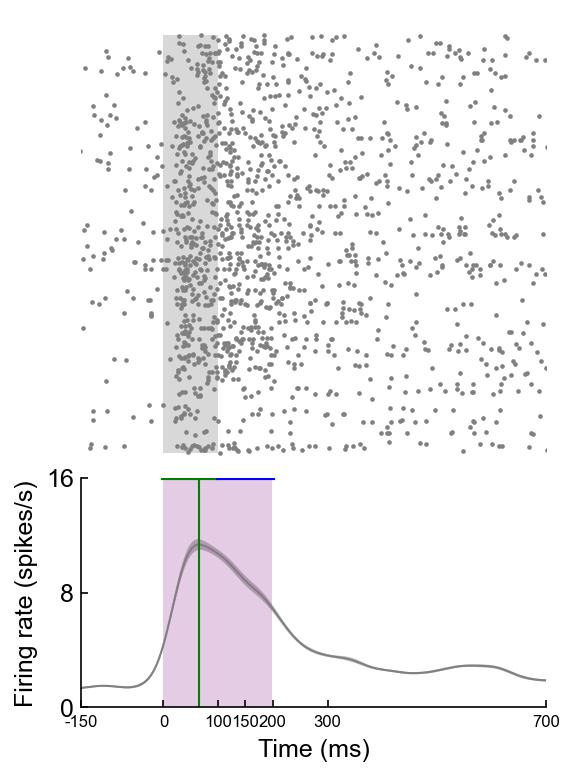

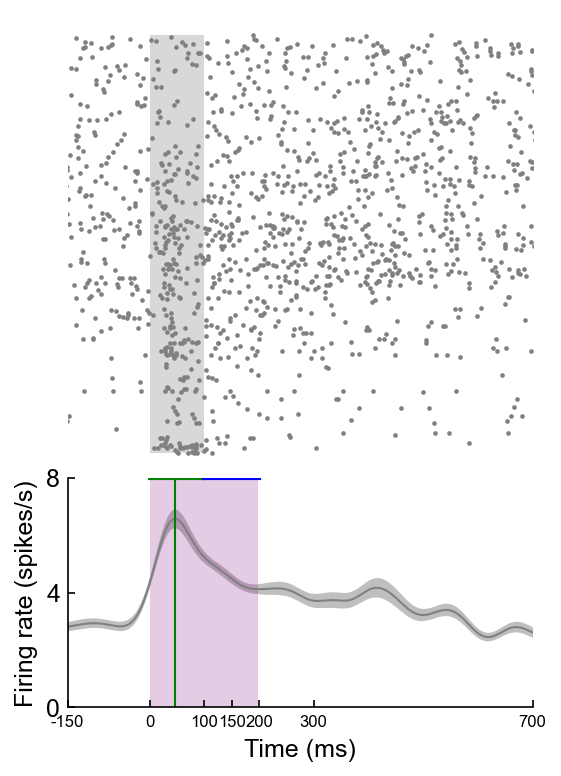

In [1272]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_87_5_AC.pickle')
for clust in sessionfile.clusters.good[:5]:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= AC_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

34
9.714285714285714
Evoked
peak
99
28.285714285714285
Suppressed


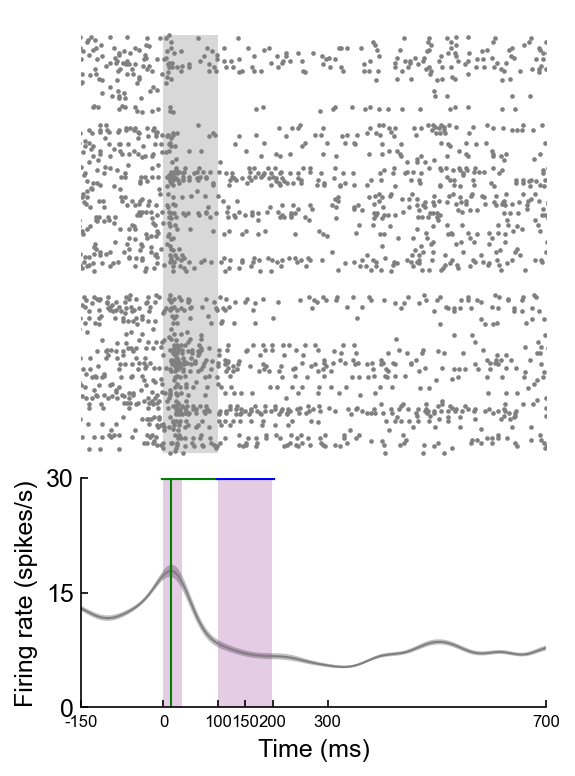

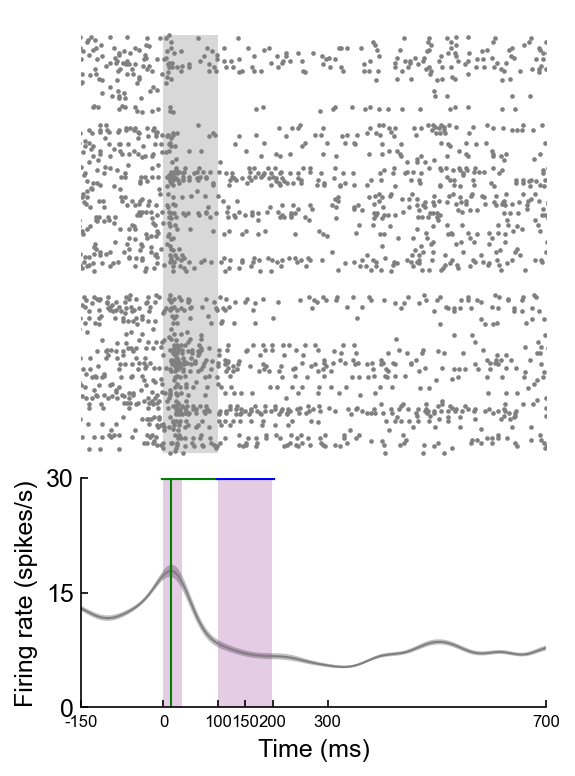

In [1273]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_AC.pickle')
visualizeClusterInternal(sessionfile,40)

99
28.285714285714285
Evoked
peak
19


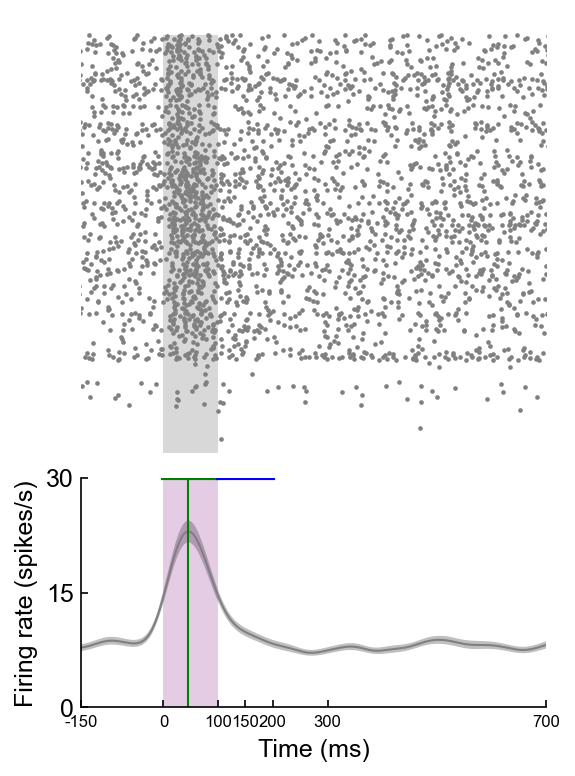

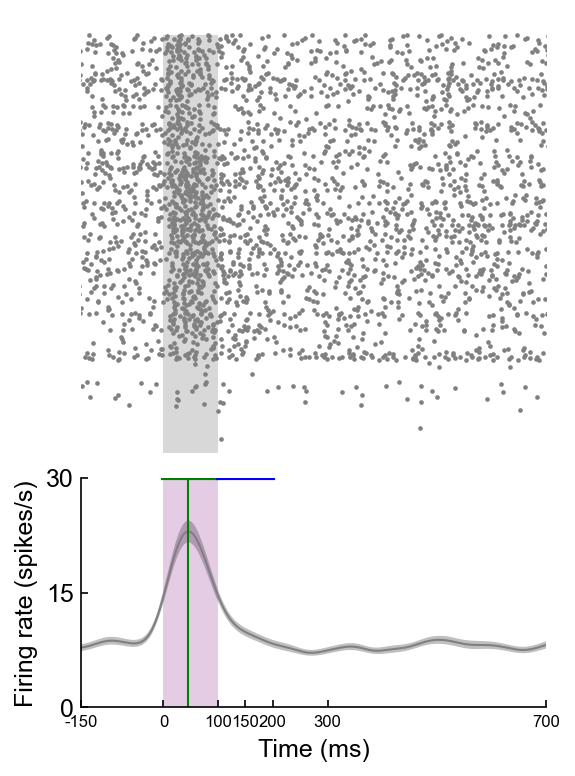

In [1274]:
visualizeClusterInternal(sessionfile,47)

99
28.285714285714285
Suppressed
peak
23


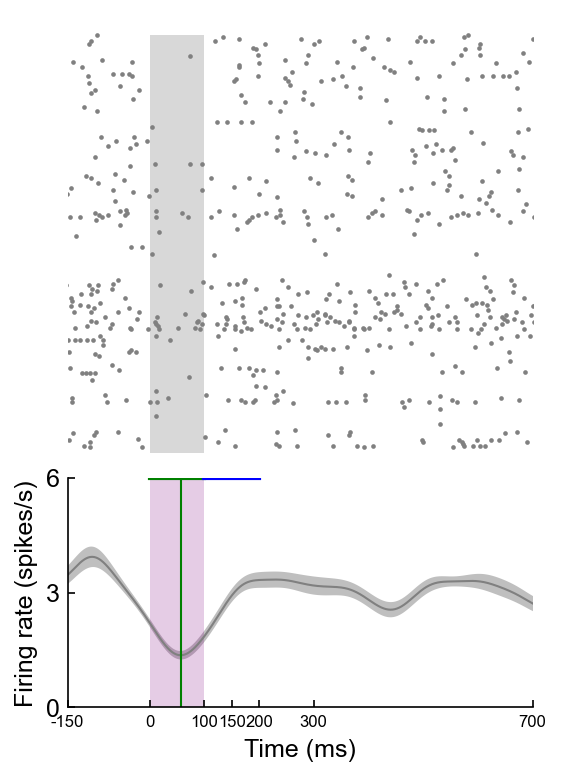

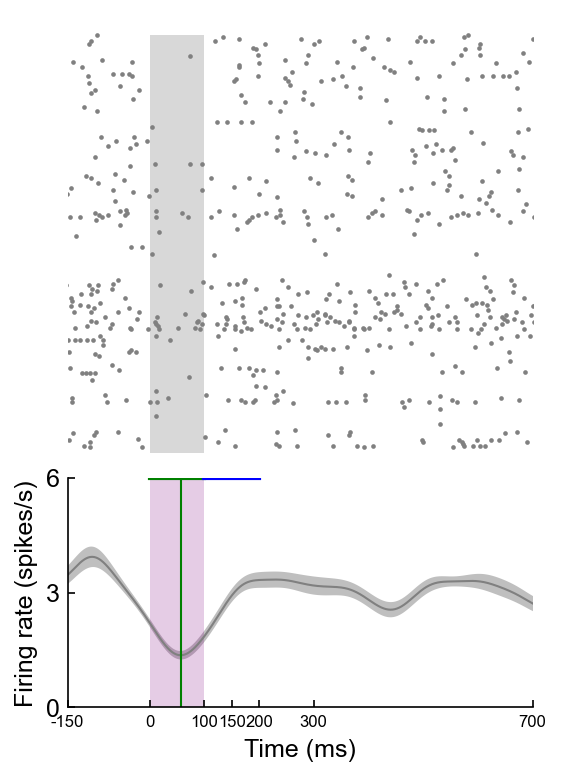

In [1275]:
visualizeClusterInternal(sessionfile,62)

In [1276]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_42_2_AC.pickle')
for clust in sessionfile.clusters.good[:-10]:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= AC_FRmod_baseline_median:
        print(clust)

3
5
8
9
12
14
16
17
27
54
57
61
62
64
68
69
82
84
85
86
108


99
28.285714285714285
Evoked
peak
18


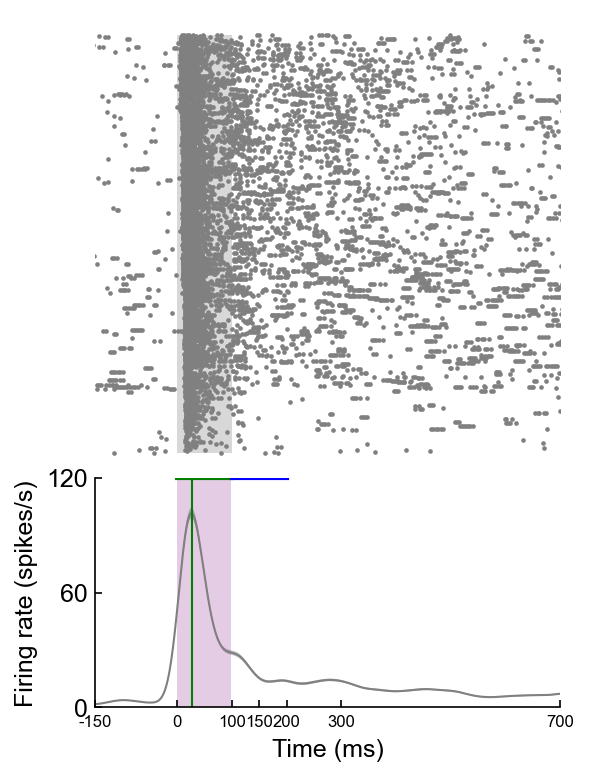

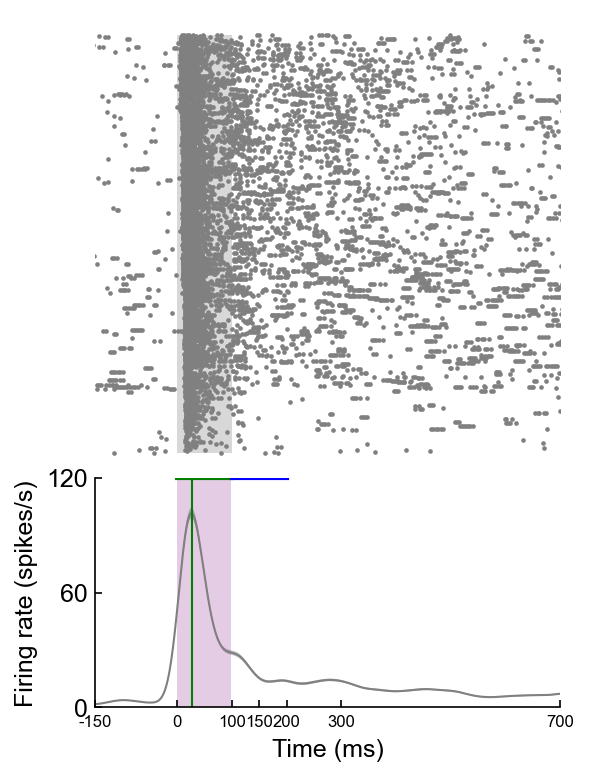

In [1277]:
visualizeClusterInternal(sessionfile,68)

87
24.857142857142858
Evoked
peak


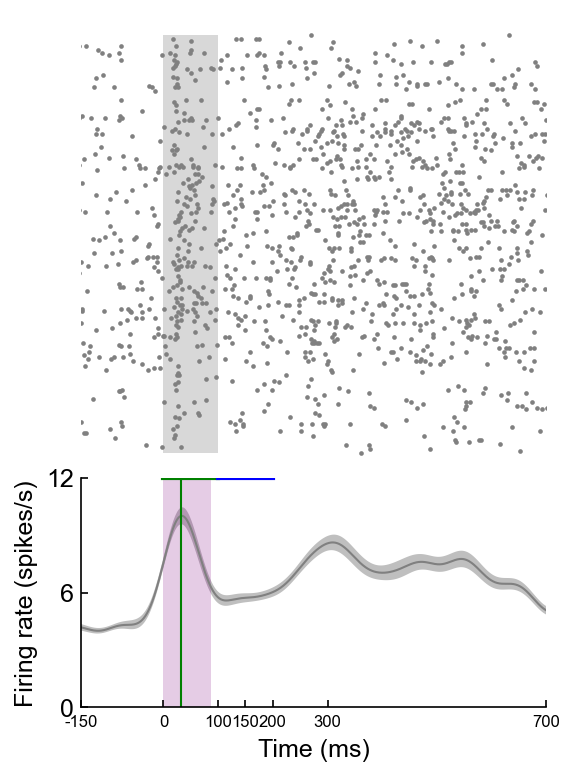

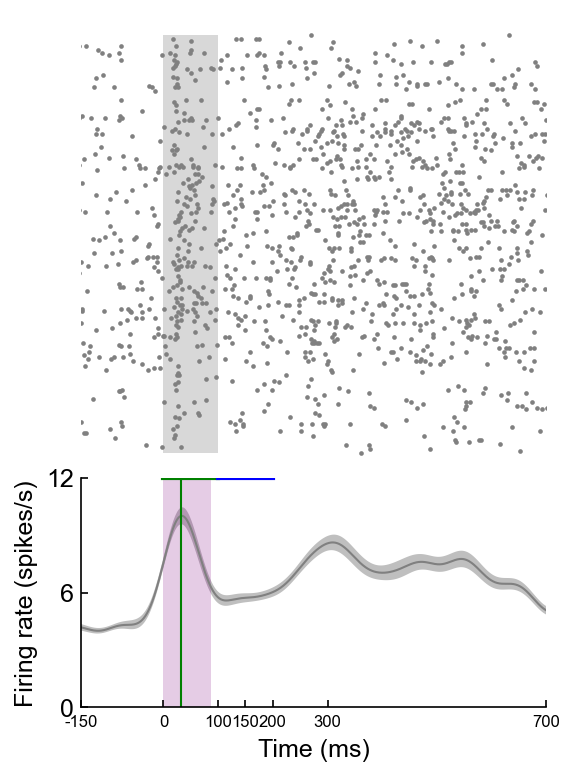

In [1278]:
visualizeClusterInternal(sessionfile,108)

3
46
161
5
57
8
23
9
12
20
14
18
16
64
17
29
27
59
54
74
57
33
61
16
62
64
85
68
26
69
26
82
43
84
19
85
32
86
25
143
108


C:\Users\insan\AppData\Local\Temp\ipykernel_26640\4064958394.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,6))


33
112
29
118
25


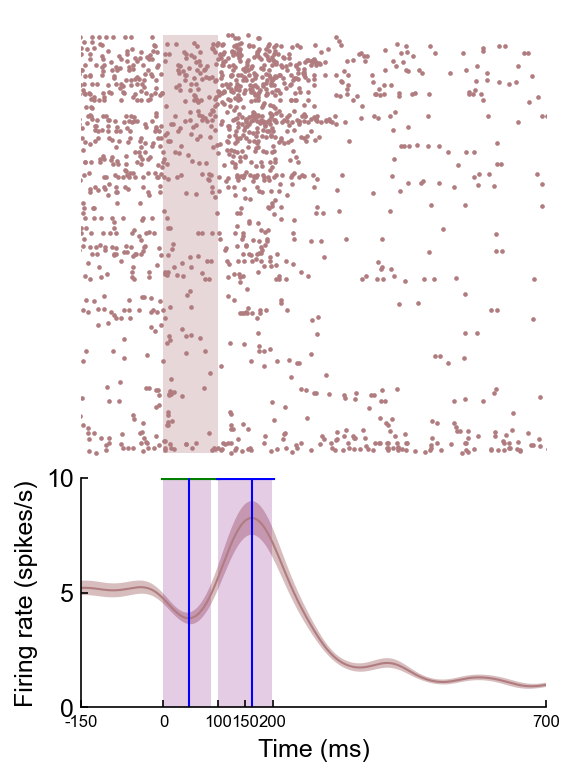

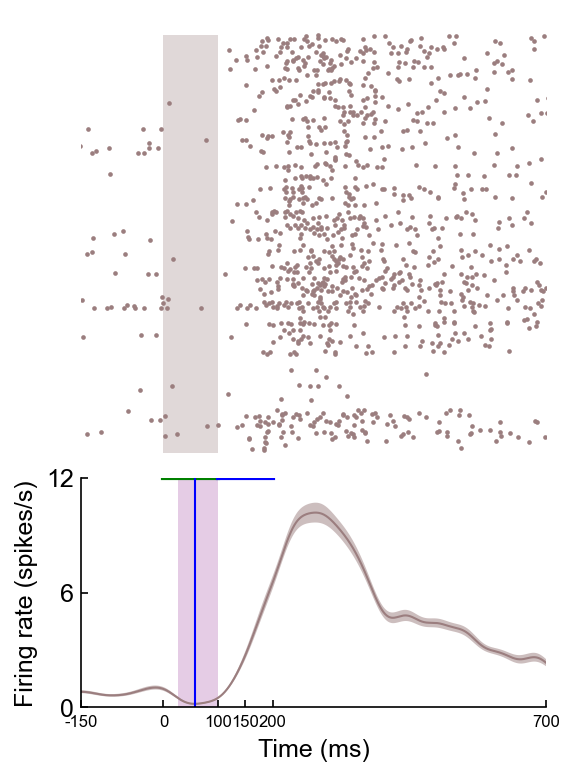

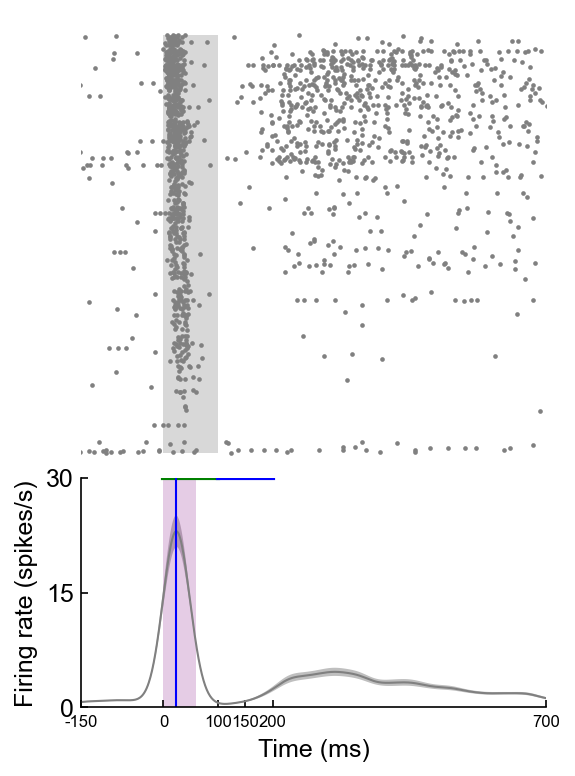

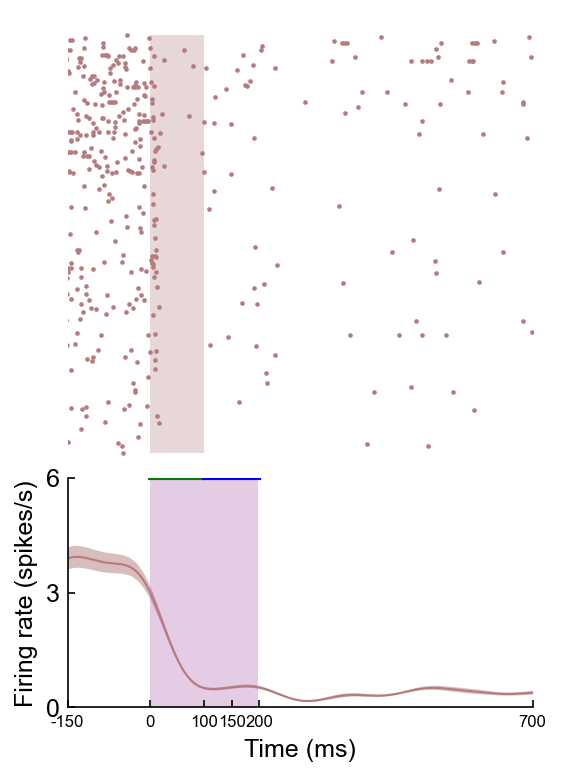

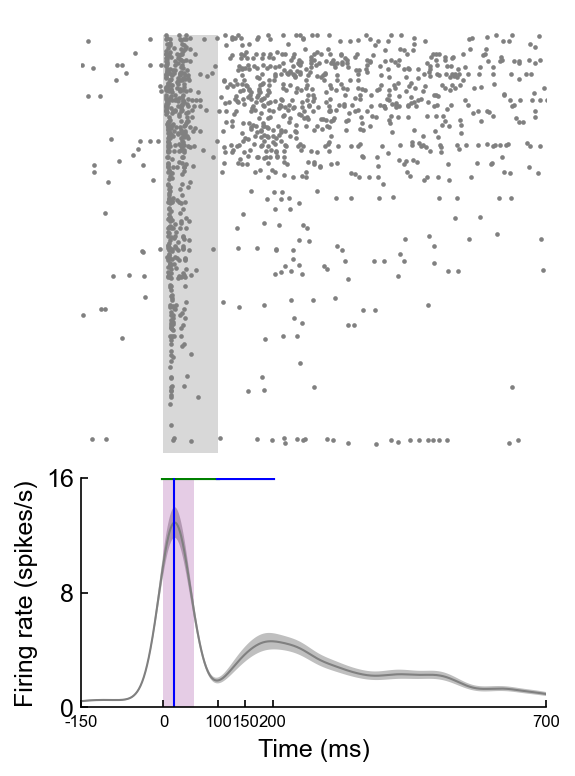

...

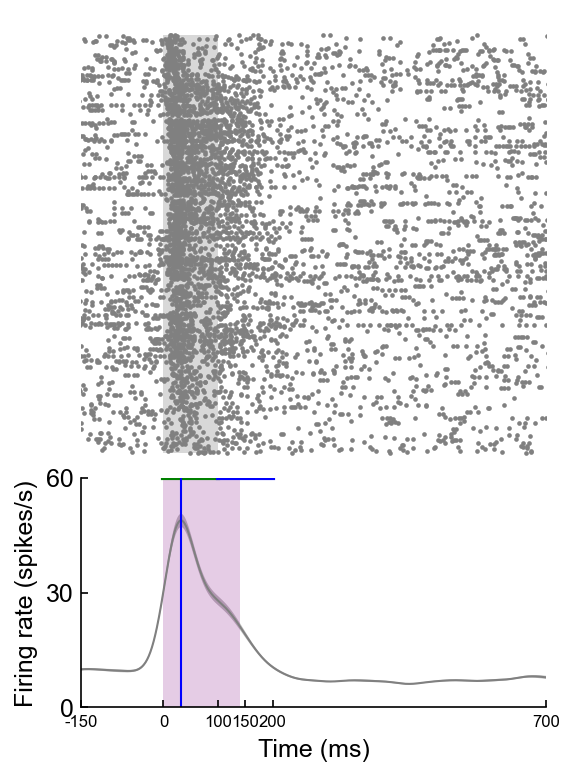

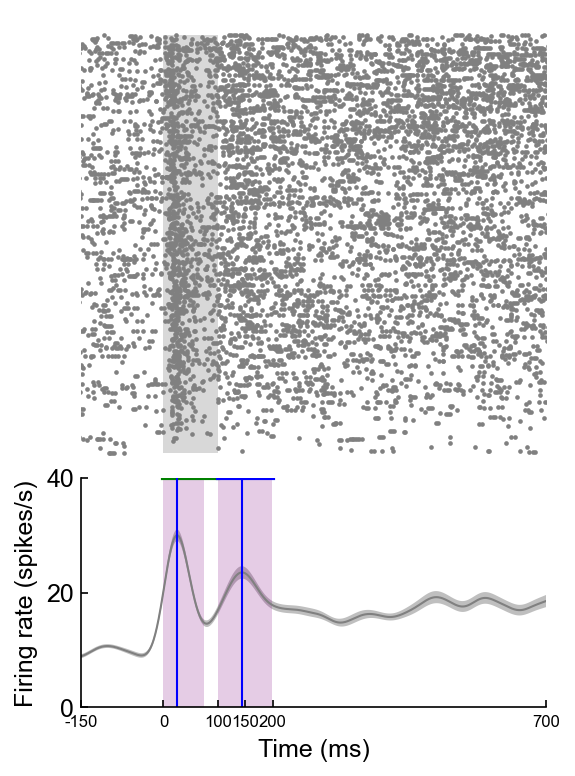

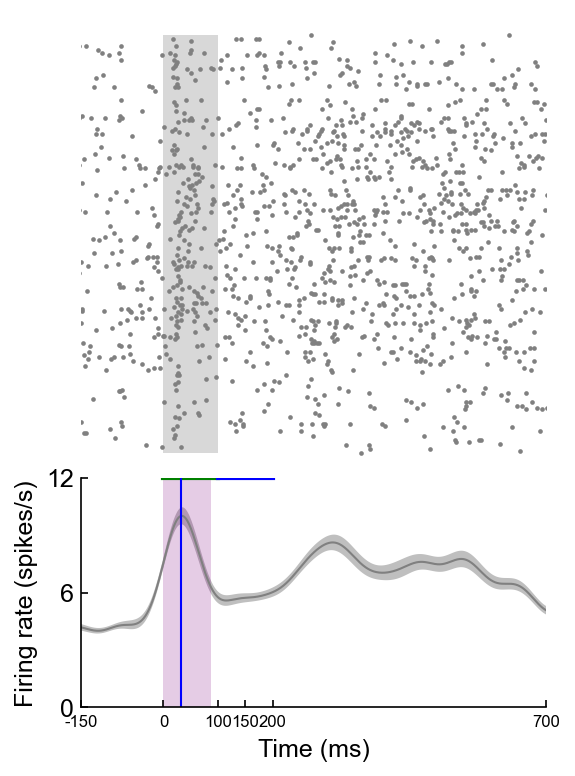

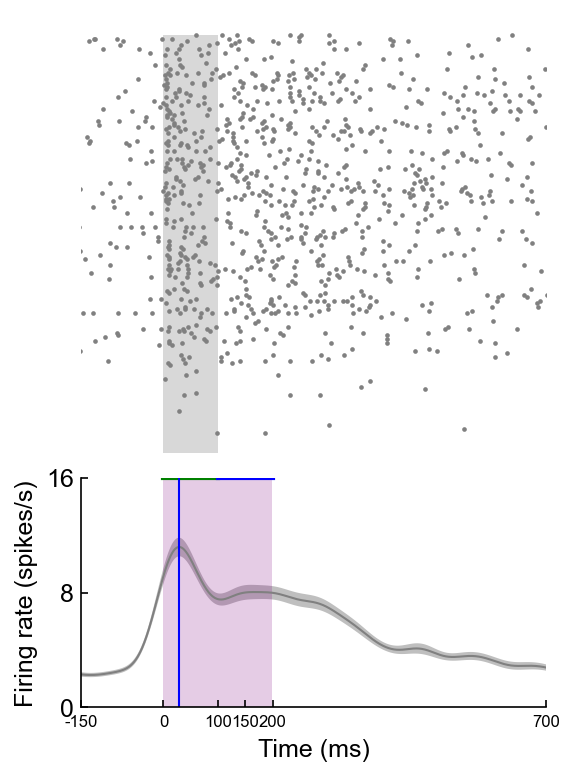

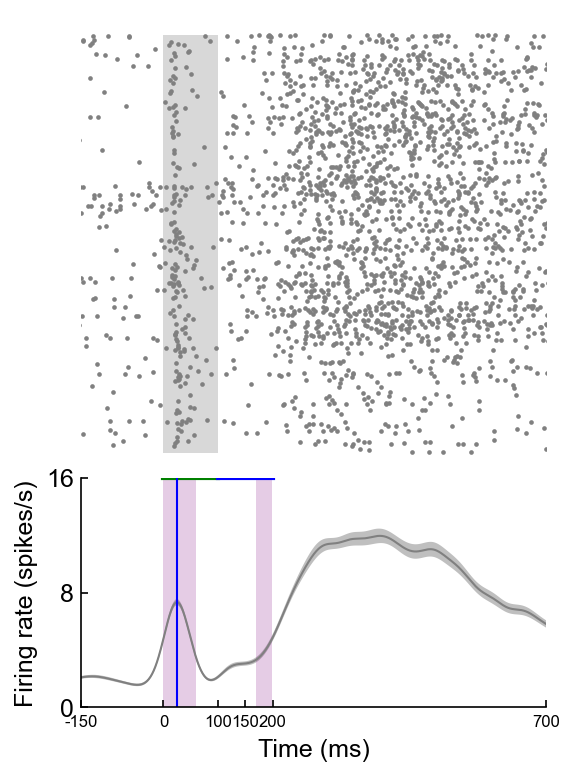

In [1054]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_42_2_AC.pickle')
for clust in sessionfile.clusters.good[:-5]:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= AC_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

0
29
9
21
166
10
11
44
18
46
32
54
121
55
23
141
64
68
70
12
79
24
88
70
101
115
12


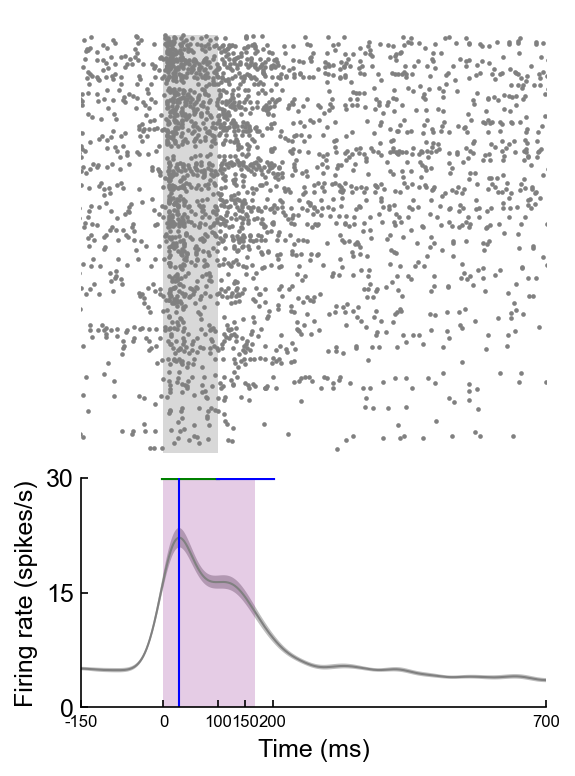

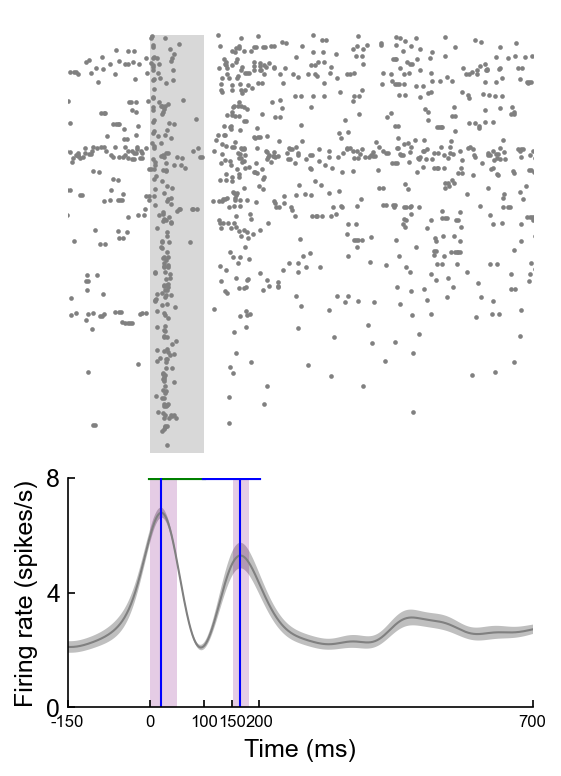

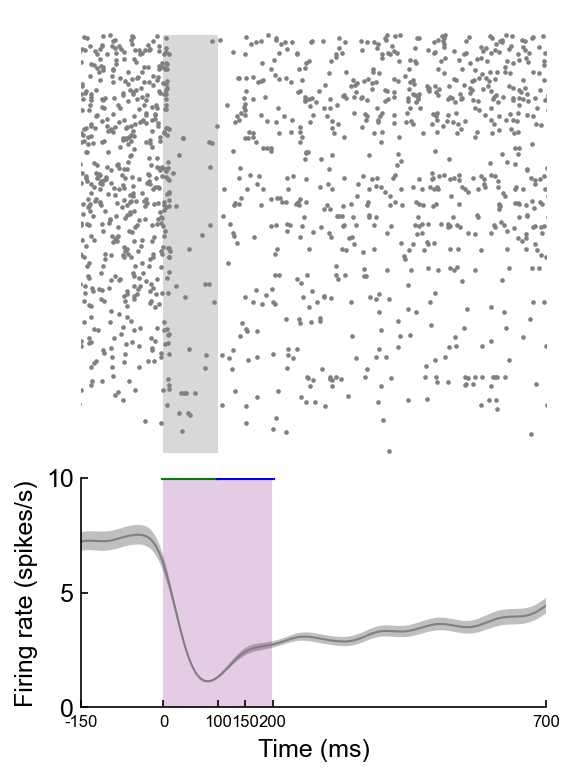

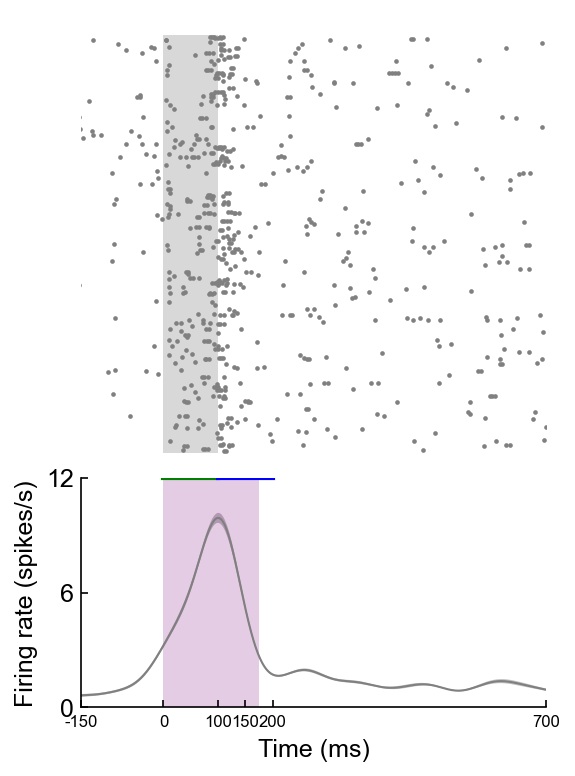

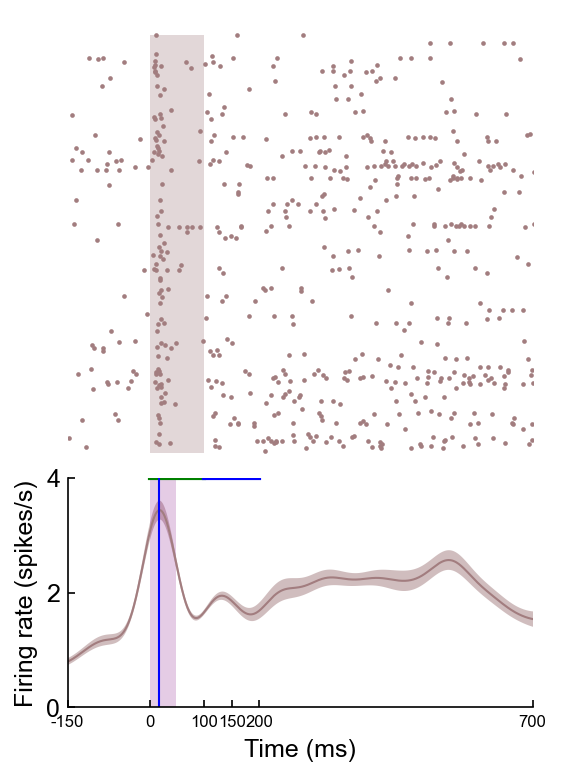

...

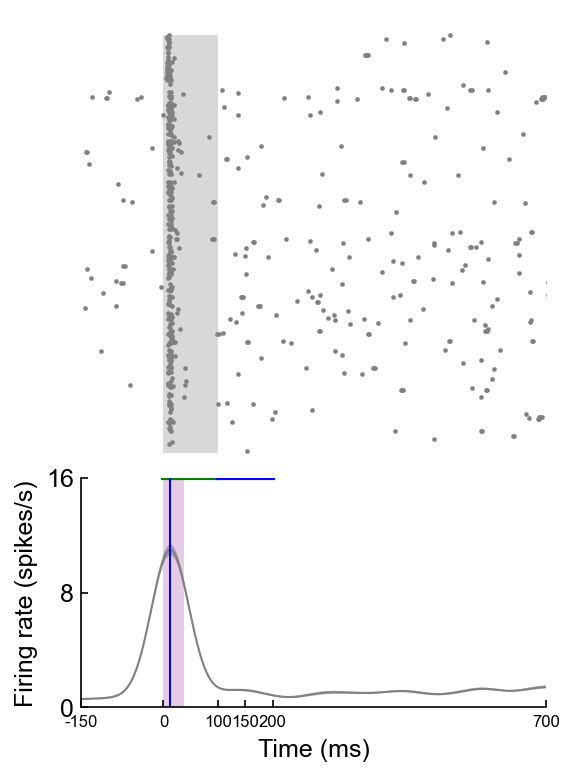

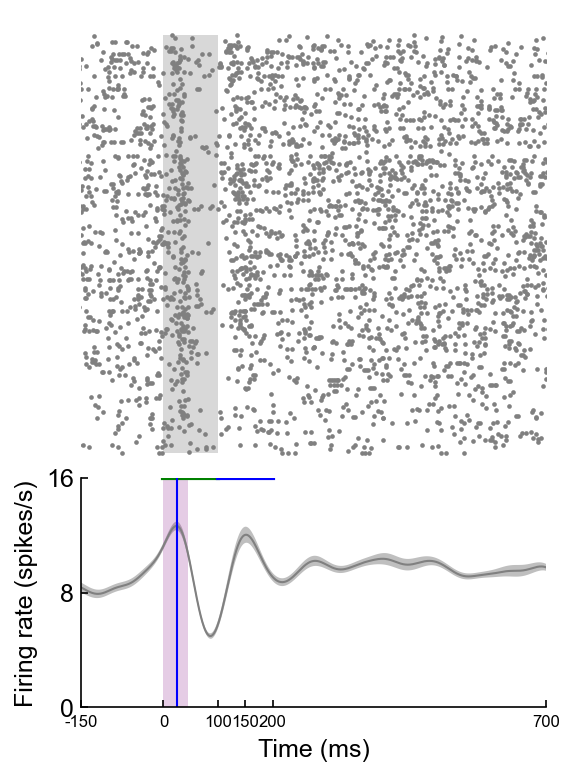

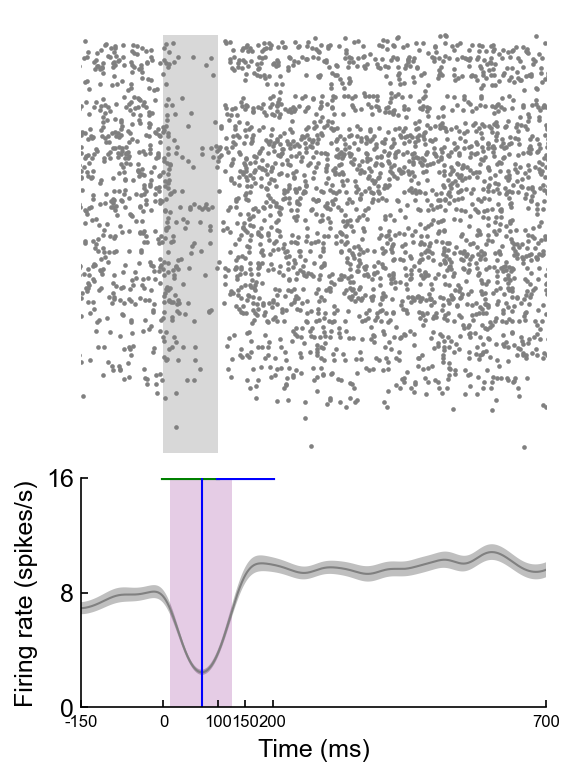

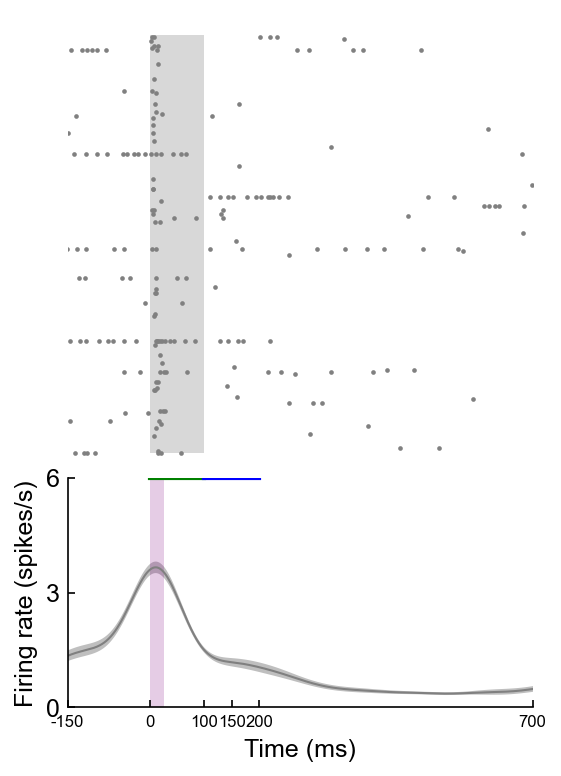

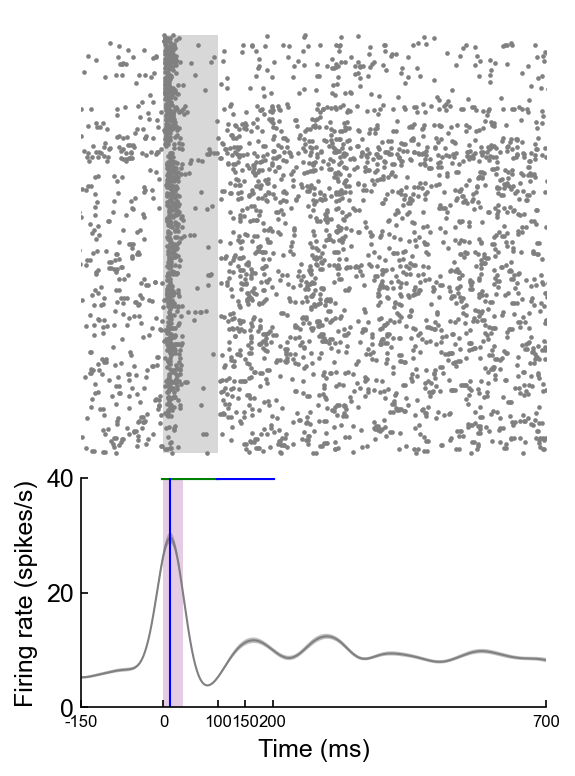

In [1055]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_72_4_AC.pickle')
for clust in sessionfile.clusters.good:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= AC_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

In [1056]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_AC.pickle')

40
13
47
45
62
57
68
14


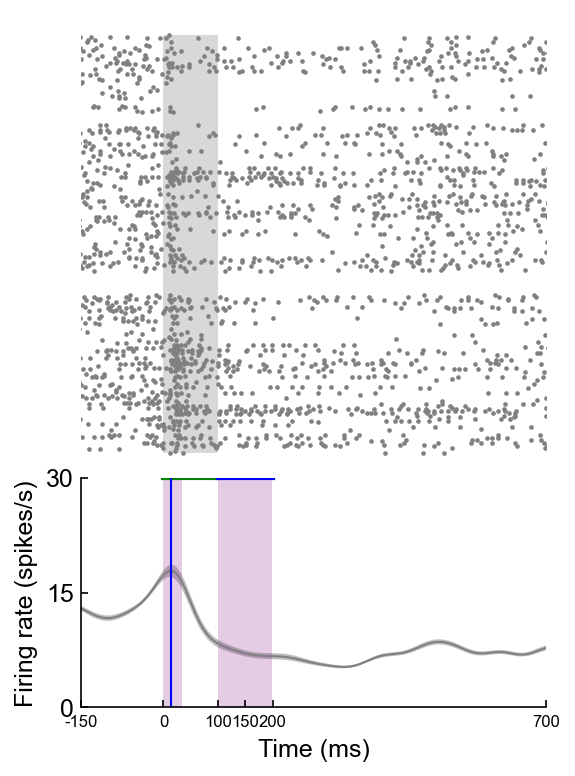

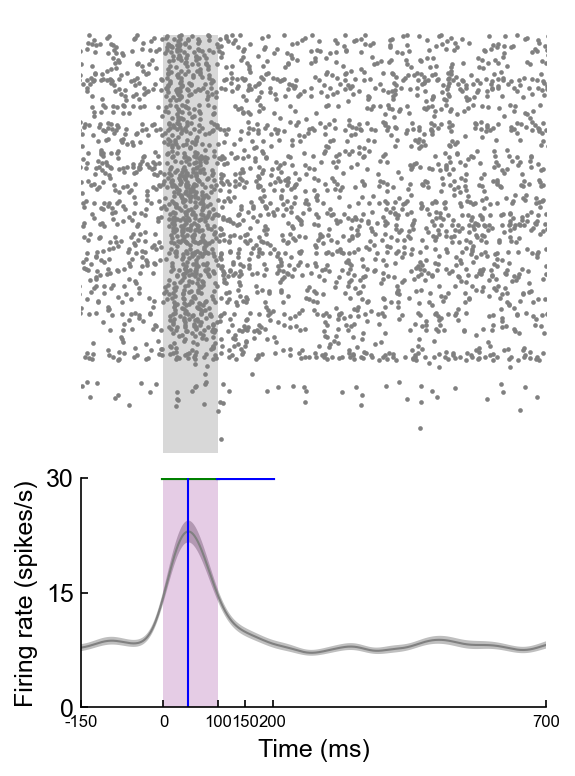

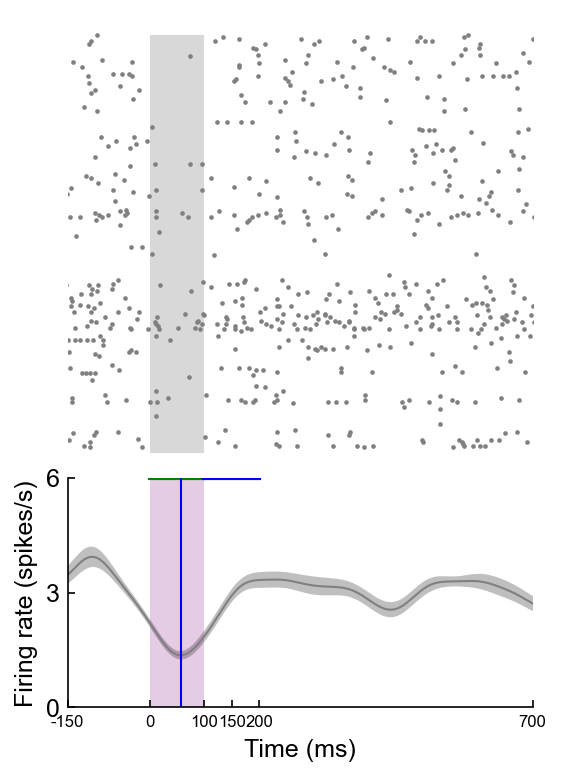

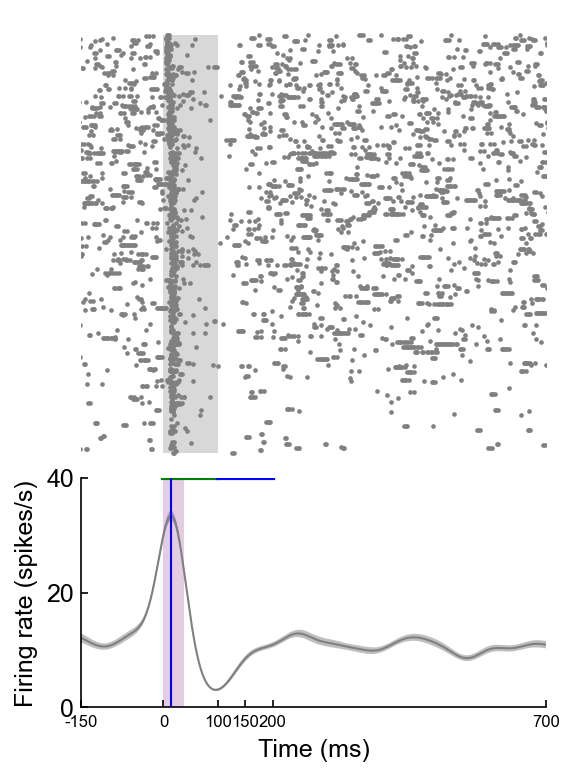

In [1057]:
for clust in sessionfile.clusters.good:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod >= AC_FRmod_baseline_median:
        print(clust)
        visualizeClusterInternal(sessionfile,clust)

# Test

In [622]:
def visualizeClusterInternal(sessionfile,clust):
    def consecutive(data, stepsize=1):
        return np.split(data, np.where(np.diff(data) != stepsize)[0]+1)
    
    #bw_scott_factor = 3
    bw_scott_factor = 6

    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    #mn = AC_FRmod_baseline_median 
    mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
    ax2.plot([100,400],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
    ax2.set_xlim([-150,700])
    ax2.set_xticks([-150,0,100,150,400,500,700])
    ax2.set_xticklabels(['-150','0','100','150','400','500','700'],size=8)
    ax2.set_xlabel('Time (ms)',size=12)
    

    #ax2.fill_betweenx(range(len(trialsToPlot)), 100, 150, alpha=0.1, color='blue', lw=0)
    #ax2.fill_betweenx(range(len(trialsToPlot)), 150, 300, alpha=0.3, color='blue', lw=0)
    
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms
    #print(spon_FR.shape) #(10, 150)
    
    avg_spon_FR = np.mean(spon_FR,axis=0)
    
    mean_spon_FR = np.mean(avg_spon_FR)
     
    std_spon_FR = np.std(avg_spon_FR)
    
    ########calculate tone response activity
    tone_res_FR = FR[:,350:750]
    avg_tone_res_FR = np.mean(tone_res_FR,axis=0)
    tone_res_diff = np.abs(avg_tone_res_FR - mean_spon_FR)
    tone_res_check = tone_res_diff > 3*std_spon_FR
    print(tone_res_check)

    if np.any(tone_res_check == True):
        tone_res_time = np.where(tone_res_check)[0]
        
        tone_res_time_periods = consecutive(tone_res_time, stepsize=1)
        
        for i in range(len(tone_res_time_periods)):
            ax2.fill_betweenx(range(len(trialsToPlot)), tone_res_time_periods[i][0], tone_res_time_periods[i][-1], alpha=0.2, color='purple', lw=0)
                       
        
        # for idx,periods in enumerate(tone_res_time_periods):
        #     ax2.fill_betweenx(range(len(trialsToPlot)), tone_res_time_periods[0], tone_res_time_periods[-1], alpha=0.2, color='green', lw=0)
        
        
        
        
#     ########calculate ONSET response activity
#     onset_FR = FR[:,350:450] #0 to 100ms
#     avg_onset_FR = np.mean(onset_FR,axis=0)
    
#     #print(avg_onset_FR)
#     onset_diff = np.abs(avg_onset_FR - mean_spon_FR)
#     #print(onset_diff)
#     onset_check = onset_diff > 3*std_spon_FR
#     #print(onset_check)
#     if np.any(onset_check == True):
#         onset_latency = np.where(onset_check)[0][0]
#         onset_latency_end = np.where(onset_check)[0][-1]
#         ax2.axvline(onset_latency,0,color='green',linewidth=1)
#         ax2.fill_betweenx(range(len(trialsToPlot)), onset_latency, onset_latency_end, alpha=0.2, color='green', lw=0)
#         ax2.text(700,limit,'onset_latency = '+str(onset_latency) )
#     else:
#         onset_latency = 1000
    
#     print('onset latency = '+str(onset_latency))    
#     #print(onset_check)
    
    
#     ########calculate OFFSET response activity
#     offset_FR = FR[:,450:750] #100 to 400ms
#     avg_offset_FR = np.mean(offset_FR,axis=0)
#     offset_diff = np.abs(avg_offset_FR - mean_spon_FR)
#     offset_check = offset_diff > 3*std_spon_FR

#     if np.any(offset_check == True):
#         offset_latency = np.where(offset_check)[0][0]
#         offset_latency_end = np.where(offset_check)[0][-1]
#         ax2.axvline(100+offset_latency,0,color='blue',linewidth=1)
#         ax2.fill_betweenx(range(len(trialsToPlot)), 100+offset_latency, 100+offset_latency_end, alpha=0.2, color='blue', lw=0)
#         ax2.text(720,limit-3,'offset_latency = '+str(offset_latency) )
#     else:
#         offset_latency = 1000
#     print('offset latency = '+str(offset_latency))
#     #print(offset_check)
#     #########################

    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\AC\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\M2\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')

        
    plt.close(fig)
    
    return fig,[ax1,ax2],tone_res_check

In [623]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_M2.pickle')

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  T

meta NOT subset; don't know how to subset; dropped


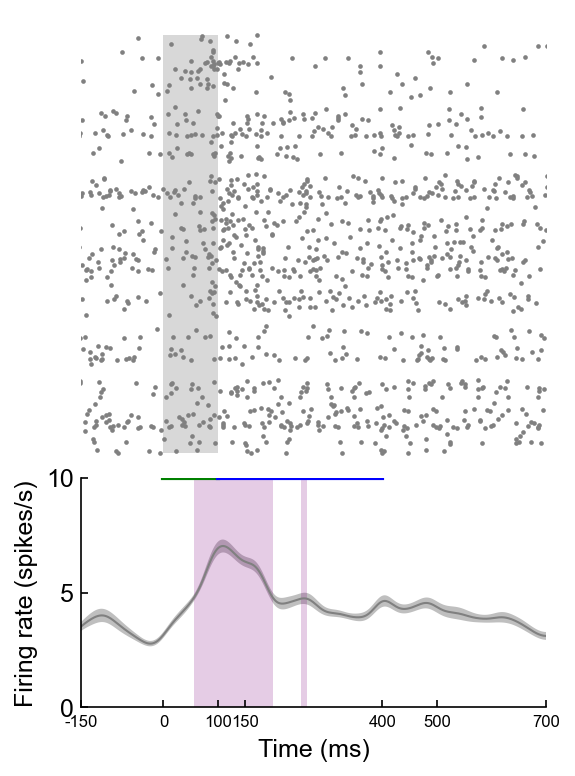

In [624]:
visualizeClusterInternal(sessionfile,18)[0]

In [554]:
def visualizeClusterInternal(sessionfile,clust):
    #bw_scott_factor = 3
    bw_scott_factor = 6

    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    mn = AC_FRmod_baseline_median 
    #mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
    ax2.plot([100,400],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
    ax2.set_xlim([-150,700])
    ax2.set_xticks([-150,0,100,150,300,500,700])
    ax2.set_xticklabels(['-150','0','100','150','300','500','700'],size=8)
    ax2.set_xlabel('Time (ms)',size=12)
    

    #ax2.fill_betweenx(range(len(trialsToPlot)), 100, 150, alpha=0.1, color='blue', lw=0)
    #ax2.fill_betweenx(range(len(trialsToPlot)), 150, 300, alpha=0.3, color='blue', lw=0)
    
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms
    #print(spon_FR.shape) #(10, 150)
    
    avg_spon_FR = np.mean(spon_FR,axis=0)
    
    mean_spon_FR = np.mean(avg_spon_FR)
     
    std_spon_FR = np.std(avg_spon_FR)

    ########calculate onset response activity
    onset_FR = FR[:,350:450] #0 to 100ms
    avg_onset_FR = np.mean(onset_FR,axis=0)
    
    #print(avg_onset_FR)
    onset_diff = np.abs(avg_onset_FR - mean_spon_FR)
    #print(onset_diff)
    onset_check = onset_diff > 3*std_spon_FR
    print(onset_check)
    if np.any(onset_check == True):
        onset_latency = np.where(onset_check)[0][0]
        onset_latency_end = np.where(onset_check)[0][-1]
        ax2.axvline(onset_latency,0,color='green',linewidth=1)
        ax2.fill_betweenx(range(len(trialsToPlot)), onset_latency, onset_latency_end, alpha=0.2, color='green', lw=0)
        ax2.text(700,limit,'onset_latency = '+str(onset_latency) )
    else:
        onset_latency = 1000
    
    print('onset latency = '+str(onset_latency))    
    #print(onset_check)
    
    
    ########calculate offset response activity
    offset_FR = FR[:,450:750] #100 to 400ms
    avg_offset_FR = np.mean(offset_FR,axis=0)
    offset_diff = np.abs(avg_offset_FR - mean_spon_FR)
    offset_check = offset_diff > 3*std_spon_FR

    if np.any(offset_check == True):
        offset_latency = np.where(offset_check)[0][0]
        offset_latency_end = np.where(offset_check)[0][-1]
        ax2.axvline(100+offset_latency,0,color='blue',linewidth=1)
        ax2.fill_betweenx(range(len(trialsToPlot)), 100+offset_latency, 100+offset_latency_end, alpha=0.2, color='blue', lw=0)
        ax2.text(720,limit-3,'offset_latency = '+str(offset_latency) )
    else:
        offset_latency = 1000
    print('offset latency = '+str(offset_latency))
    print(offset_check)
    #########################

    fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\AC\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\M2\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')

        
    plt.close(fig)
    
    return fig,[ax1,ax2],onset_latency,offset_latency

In [555]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_AC.pickle')

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False]
onset latency = 0
offset latency = 1000
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False Fal

meta NOT subset; don't know how to subset; dropped


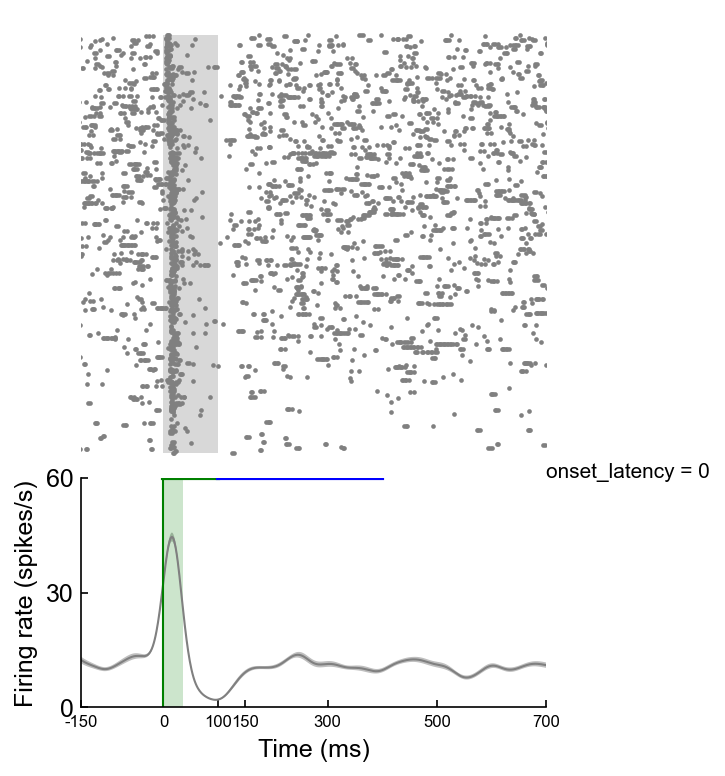

In [556]:
visualizeClusterInternal(sessionfile,68)[0]

In [557]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_AC.pickle')
for clust in sessionfile.clusters.good:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod>=AC_FRmod_baseline_median:
        visualizeClusterInternal(sessionfile,clust)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
  True  True  True  True]
onset latency = 0
offset latency = 0
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True 

meta NOT subset; don't know how to subset; dropped


[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]
onset latency = 0
offset latency = 0
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False 

meta NOT subset; don't know how to subset; dropped


[False False False False False False False False False False False False
 False False False False False False False False False False False  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True False False False False
 False False False False]
onset latency = 23
offset latency = 1000
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False Fa

meta NOT subset; don't know how to subset; dropped


[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False]
onset latency = 0
offset latency = 1000
[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False Fal

meta NOT subset; don't know how to subset; dropped


In [564]:
def visualizeClusterInternal(sessionfile,clust):
    #bw_scott_factor = 3
    bw_scott_factor = 6

    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    #mn = AC_FRmod_baseline_median 
    mn = M2_FRmod_baseline_median 
    
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='green',lw=2,linestyle='-')
    ax2.plot([100,400],[limit,limit],color='blue',lw=2,linestyle='-')#zorder = 10 line of tone

    
    ax2.set_xlim([-150,700])
    ax2.set_xticks([-150,0,100,150,300,500,700])
    ax2.set_xticklabels(['-150','0','100','150','300','500','700'],size=8)
    ax2.set_xlabel('Time (ms)',size=12)
    

    #ax2.fill_betweenx(range(len(trialsToPlot)), 100, 150, alpha=0.1, color='blue', lw=0)
    #ax2.fill_betweenx(range(len(trialsToPlot)), 150, 300, alpha=0.3, color='blue', lw=0)
    
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms
    #print(spon_FR.shape) #(10, 150)
    
    avg_spon_FR = np.mean(spon_FR,axis=0)
    
    mean_spon_FR = np.mean(avg_spon_FR)
     
    std_spon_FR = np.std(avg_spon_FR)

    ########calculate ONSET response activity
    onset_FR = FR[:,350:450] #0 to 100ms
    avg_onset_FR = np.mean(onset_FR,axis=0)
    
    #print(avg_onset_FR)
    onset_diff = np.abs(avg_onset_FR - mean_spon_FR)
    #print(onset_diff)
    onset_check = onset_diff > 3*std_spon_FR
    print(onset_check)
    if np.any(onset_check == True):
        onset_latency = np.where(onset_check)[0][0]
        onset_latency_end = np.where(onset_check)[0][-1]
        ax2.axvline(onset_latency,0,color='green',linewidth=1)
        ax2.fill_betweenx(range(len(trialsToPlot)), onset_latency, onset_latency_end, alpha=0.2, color='green', lw=0)
        ax2.text(700,limit,'onset_latency = '+str(onset_latency) )
    else:
        onset_latency = 1000
    
    print('onset latency = '+str(onset_latency))    
    #print(onset_check)
    
    
    ########calculate OFFSET response activity
    offset_FR = FR[:,450:750] #100 to 400ms
    avg_offset_FR = np.mean(offset_FR,axis=0)
    offset_diff = np.abs(avg_offset_FR - mean_spon_FR)
    offset_check = offset_diff > 3*std_spon_FR

    if np.any(offset_check == True):
        offset_latency = np.where(offset_check)[0][0]
        offset_latency_end = np.where(offset_check)[0][-1]
        ax2.axvline(100+offset_latency,0,color='blue',linewidth=1)
        ax2.fill_betweenx(range(len(trialsToPlot)), 100+offset_latency, 100+offset_latency_end, alpha=0.2, color='blue', lw=0)
        ax2.text(720,limit-3,'offset_latency = '+str(offset_latency) )
    else:
        offset_latency = 1000
    print('offset latency = '+str(offset_latency))
    print(offset_check)
    #########################

    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\AC\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\BS_40_15\\M2\\'+'clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')

        
    plt.close(fig)
    
    return fig,[ax1,ax2],onset_latency,offset_latency,offset_check

In [566]:
a = visualizeClusterInternal(sessionfile,18)[-1]

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]
onset latency = 55
offset latency = 0
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True

meta NOT subset; don't know how to subset; dropped


In [567]:
a

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [568]:
len(a)

300

In [569]:
np.where(a)[0]

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 151, 152,
       153, 154, 155, 156, 157, 158, 159, 160, 161, 162], dtype=int64)

In [559]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_M2.pickle')
for clust in sessionfile.clusters.good:
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    if FRmod>=M2_FRmod_baseline_median:
        visualizeClusterInternal(sessionfile,clust)

[False False False False False  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]
onset latency = 5
offset latency = 0
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True 

meta NOT subset; don't know how to subset; dropped


[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False  True  True  True]
onset latency = 97
offset latency = 0
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True

meta NOT subset; don't know how to subset; dropped


[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]
onset latency = 68
offset latency = 0
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True

meta NOT subset; don't know how to subset; dropped


[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]
onset latency = 55
offset latency = 0
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True

meta NOT subset; don't know how to subset; dropped


[False False  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]
onset latency = 2
offset latency = 0
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True 

meta NOT subset; don't know how to subset; dropped


This calculation is CR only

calculate the mean and standard deviation from the baseline window (spontaneous)
onset response window is 0-100ms
offset response after 100ms
latency is determined as the point where evoked response is 2 standard deviation above baseline

first calculate onset

In [405]:
def visualizeClusterInternal(sessionfile,clust):
    #bw_scott_factor = 3
    bw_scott_factor = 6
    #bw_scott_factor =10
    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    mn = AC_FRmod_baseline_median 
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0,) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms
    #print(spon_FR.shape) #(10, 150)
    
    avg_spon_FR = np.mean(spon_FR,axis=0)
    
    mean_spon_FR = np.mean(avg_spon_FR)
     
    std_spon_FR = np.std(avg_spon_FR)

    ########calculate onset response activity
    onset_FR = FR[:,350:450] #0 to 100ms
    avg_onset_FR = np.mean(onset_FR,axis=0)
    
    #print(avg_onset_FR)
    onset_diff = np.abs(avg_onset_FR - mean_spon_FR)
    #print(onset_diff)
    onset_check = onset_diff > 3*std_spon_FR
    #print(onset_check)
    if np.any(onset_check == True):
        onset_latency = np.where(onset_check)[0][0]
    else:
        onset_latency = 1000
    print('onset latency = '+str(onset_latency))    
    
    ax2.axvline(onset_latency,0,color='green')
    
    ########calculate offset response activity
    offset_FR = FR[:,450:550] #0 to 100ms
    avg_offset_FR = np.mean(offset_FR,axis=0)
    

    offset_diff = np.abs(avg_offset_FR - mean_spon_FR)

    offset_check = offset_diff > 3*std_spon_FR

    if np.any(offset_check == True):
        offset_latency = np.where(offset_check)[0][0]
        offset_latency = 100+offset_latency
    else:
        offset_latency = 1000
    print('offset latency = '+str(offset_latency))    
    
    ax2.axvline(offset_latency,0,color='blue')
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='k',lw=2,linestyle='-') #zorder = 10 line of tone

    
    ax2.set_xlim([-250,1500])
    ax2.set_xticks([0,500,1000,1500])
    ax2.set_xticklabels(['0','500','1000','1500'],size=12)
    ax2.set_xlabel('Time (ms)',size=12)
    

    #########################
    
    
    
    
    
    
    
#     ############
    baseline_FR = sessionfile.responsiveness[clust]['all_trials'].FRbaseline
    #print(mean_spon_FR)
    #print(baseline_FR)
    #diff_from_baseline = np.abs(avg_FR[350:550] - baseline_FR) #200ms window check for AC
    diff_from_baseline = np.abs(avg_FR[350:650] - baseline_FR) #300ms window check for AC
    #print(len(diff_from_baseline))#len=200
    peak = np.max(diff_from_baseline) 

    peak_time = np.argmax(diff_from_baseline) #ms
    
    #print(peak_time)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    
    #if FRmod>=AC_FRmod_baseline_median:
        #ax2.axvline(x=peak_time,color='green')
        #ig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\AC(V2)\\'+Phase+str(sessionname)+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
        #print(peak_time)
        #print(FRmod)
        #print(FRbaseline)
        
    plt.close(fig)
    return fig,[ax1,ax2],onset_latency,offset_latency#FRmod,peak_time,avg_spon_FR

In [483]:
def visualizeClusterInternal(sessionfile,clust):
    #bw_scott_factor = 3
    bw_scott_factor = 6

    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    mn = AC_FRmod_baseline_median 
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    
    
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    
    
    ########calculate mean and STD for spontaneous activity window
    # print(FR[0][200:350])
    # print(FR[1][200:350])
    # print(FR.shape) #(10, 1950)
    
    spon_FR = FR[:,200:350] #-150 to 0ms
    #print(spon_FR.shape) #(10, 150)
    
    avg_spon_FR = np.mean(spon_FR,axis=0)
    
    mean_spon_FR = np.mean(avg_spon_FR)
     
    std_spon_FR = np.std(avg_spon_FR)

    ########calculate onset response activity
    onset_FR = FR[:,350:450] #0 to 100ms
    avg_onset_FR = np.mean(onset_FR,axis=0)
    
    #print(avg_onset_FR)
    onset_diff = np.abs(avg_onset_FR - mean_spon_FR)
    #print(onset_diff)
    onset_check = onset_diff > 3*std_spon_FR
    #print(onset_check)
    if np.any(onset_check == True):
        onset_latency = np.where(onset_check)[0][0]
        ax2.axvline(onset_latency,0,color='green',linewidth=1)
    else:
        onset_latency = 1000
    print('onset latency = '+str(onset_latency))    
    
    
    
    ########calculate offset response activity
    offset_FR = FR[:,450:750] #0 to 300ms
    avg_offset_FR = np.mean(offset_FR,axis=0)
    

    offset_diff = np.abs(avg_offset_FR - mean_spon_FR)

    offset_check = offset_diff > 3*std_spon_FR

    if np.any(offset_check == True):
        offset_latency = np.where(offset_check)[0][0]
        offset_latency = 100+offset_latency
        ax2.axvline(offset_latency,0,color='blue',linewidth=1)
    else:
        offset_latency = 1000
    print('offset latency = '+str(offset_latency))    
    
    
    
    
    ######################
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    #ax2.plot([0,100],[limit,limit],color='k',lw=2,linestyle='-') #zorder = 10 line of tone

    
    ax2.set_xlim([-150,700])
    ax2.set_xticks([-150,0,100,150,300,500,700])
    ax2.set_xticklabels(['-150','0','100','150','300','500','700'],size=8)
    ax2.set_xlabel('Time (ms)',size=12)
    
    ax2.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.2, color='green', lw=0)
    ax2.fill_betweenx(range(len(trialsToPlot)), 100, 300, alpha=0.2, color='blue', lw=0)
    #ax2.fill_betweenx(range(len(trialsToPlot)), 100, 150, alpha=0.1, color='blue', lw=0)
    #ax2.fill_betweenx(range(len(trialsToPlot)), 150, 300, alpha=0.3, color='blue', lw=0)
    #########################
    
    
    
    
    
    
    
#     ############
    baseline_FR = sessionfile.responsiveness[clust]['all_trials'].FRbaseline
    #print(mean_spon_FR)
    #print(baseline_FR)
    #diff_from_baseline = np.abs(avg_FR[350:550] - baseline_FR) #200ms window check for AC
    diff_from_baseline = np.abs(avg_FR[350:650] - baseline_FR) #300ms window check for AC
    #print(len(diff_from_baseline))#len=200
    peak = np.max(diff_from_baseline) 

    peak_time = np.argmax(diff_from_baseline) #ms
    
    #print(peak_time)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    
    #if FRmod>=AC_FRmod_baseline_median:
        #ax2.axvline(x=peak_time,color='green')
        #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\AC(V2)\\'+Phase+str(sessionname)+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
        #print(peak_time)
        #print(FRmod)
        #print(FRbaseline)
        
    plt.close(fig)
    return fig,[ax1,ax2],onset_latency,offset_latency#FRmod,peak_time,avg_spon_FR

onset latency = 1000
offset latency = 126


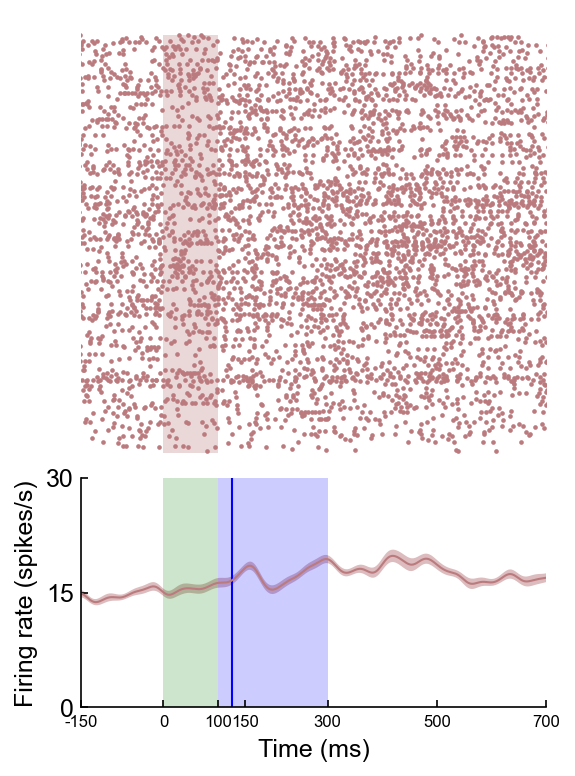

In [482]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_16_AC.pickle')
visualizeClusterInternal(sessionfile,14)[0]

In [467]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_M2.pickle')

onset latency = 68
offset latency = 100


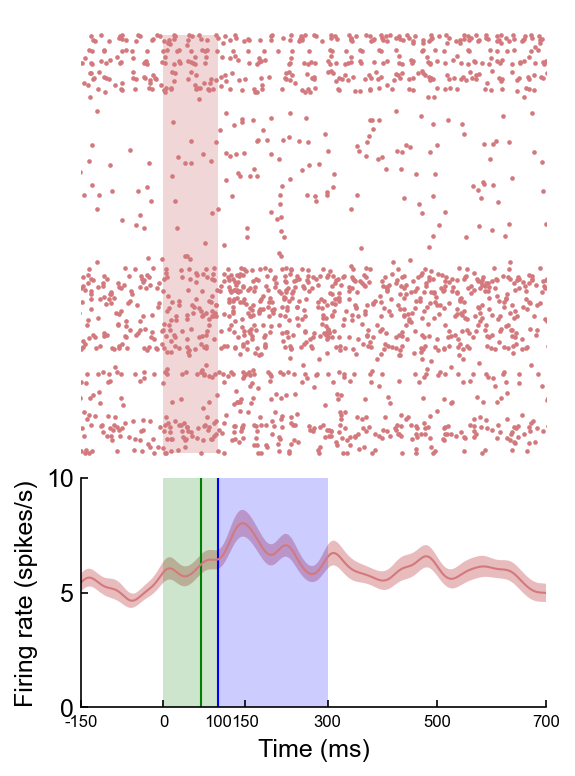

In [468]:
visualizeClusterInternal(sessionfile,14)[0]

onset latency = 2
offset latency = 100


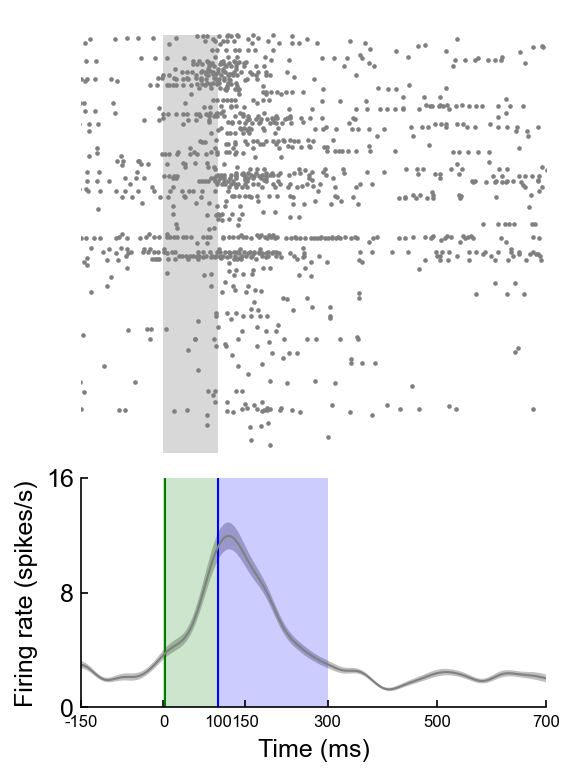

In [469]:
visualizeClusterInternal(sessionfile,21)[0]

In [470]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_16_M2.pickle')

onset latency = 91
offset latency = 100


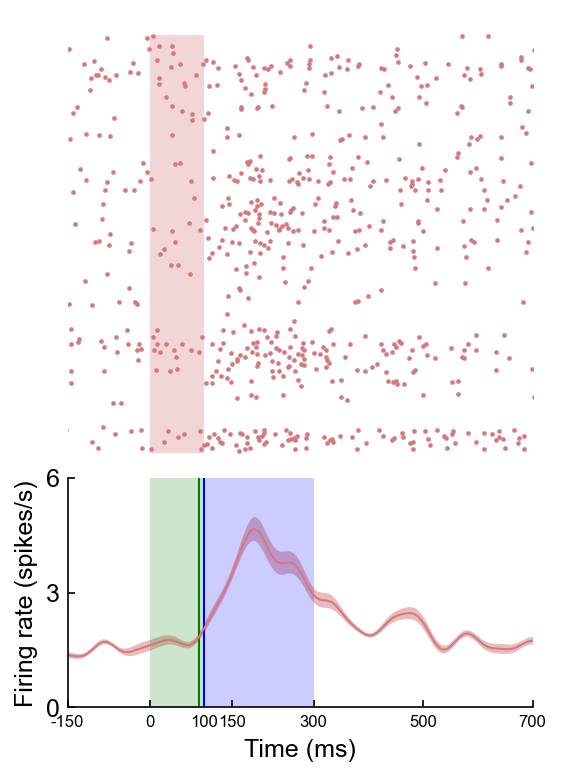

In [471]:
visualizeClusterInternal(sessionfile,12)[0]

In [472]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_41_2_M2.pickle')

onset latency = 58
offset latency = 100


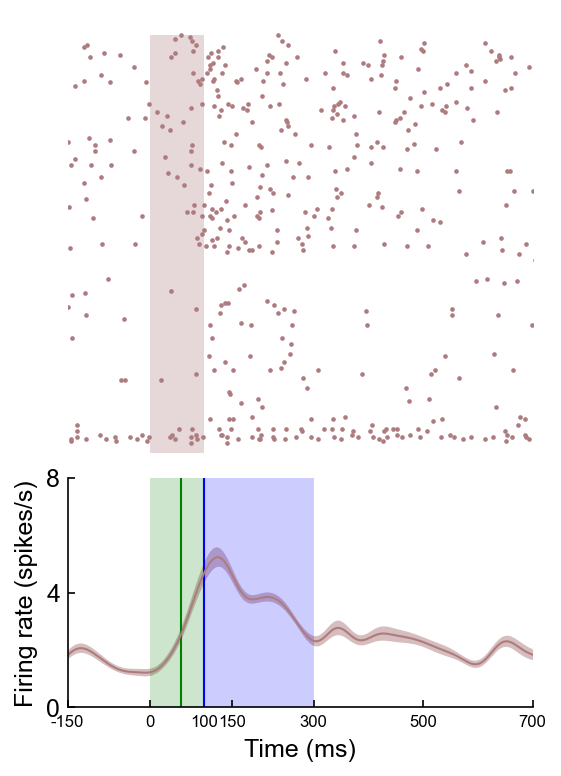

In [473]:
visualizeClusterInternal(sessionfile,17)[0]

onset latency = 90
offset latency = 100


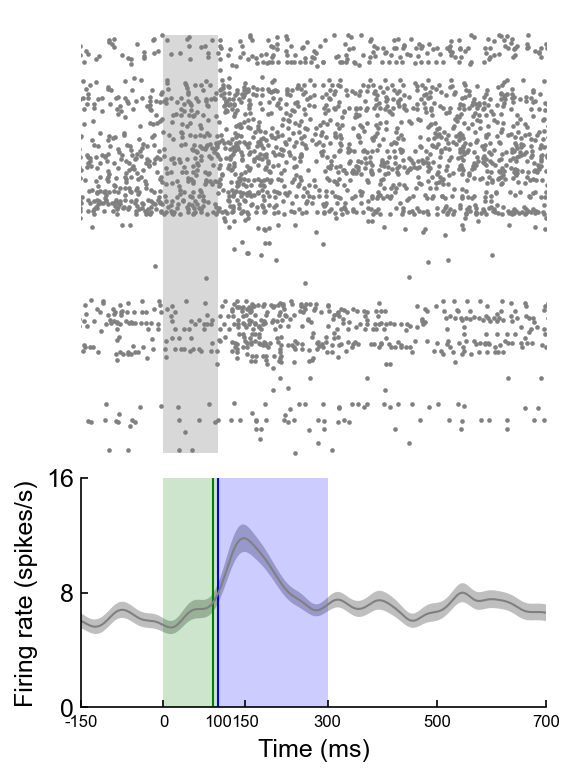

In [474]:
visualizeClusterInternal(sessionfile,23)[0]

In [397]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_15_AC.pickle')

onset latency = 0
offset latency = 100


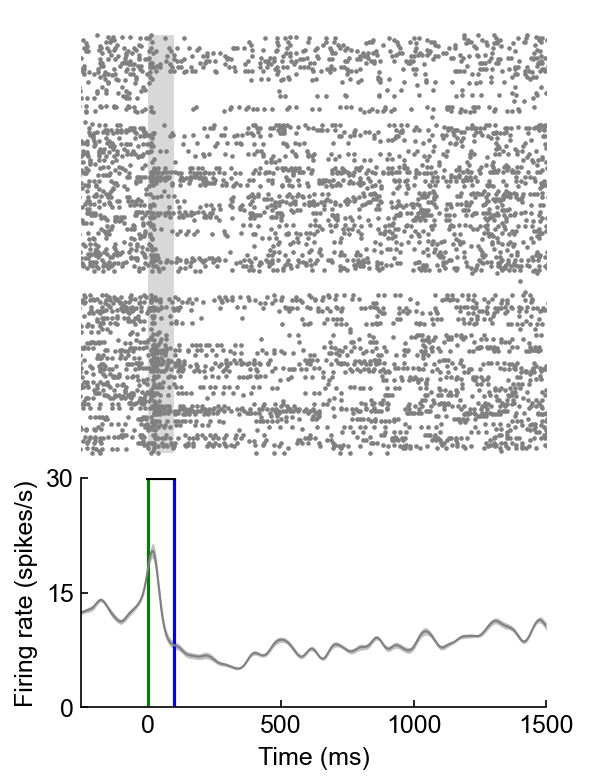

In [398]:
visualizeClusterInternal(sessionfile,40)[0]

In [399]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_16_AC.pickle')

In [400]:
sessionfile.clusters.good

array([ 0,  4,  5, 10, 14, 15, 16, 21, 24, 26, 35], dtype=int64)

onset latency = 1000
offset latency = 126


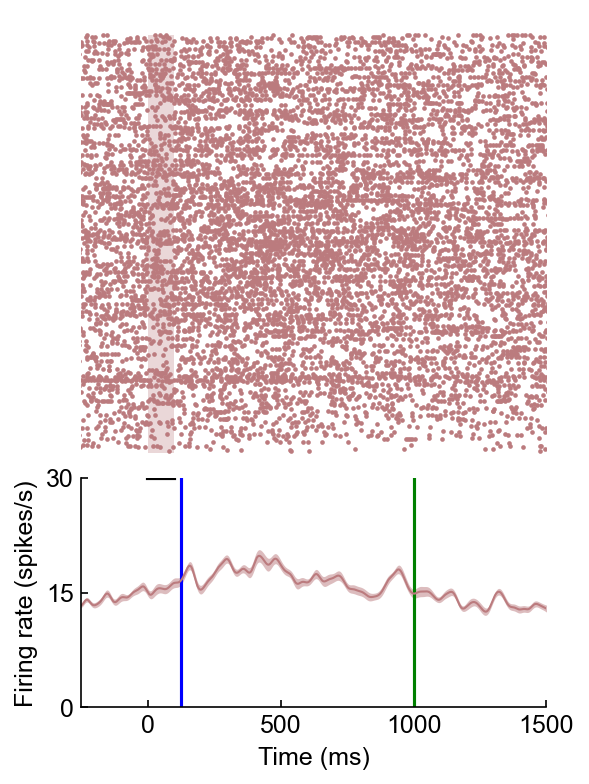

In [401]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_40_16_AC.pickle')
visualizeClusterInternal(sessionfile,14)[0]

In [402]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_42_2_AC.pickle')

onset latency = 4
offset latency = 100


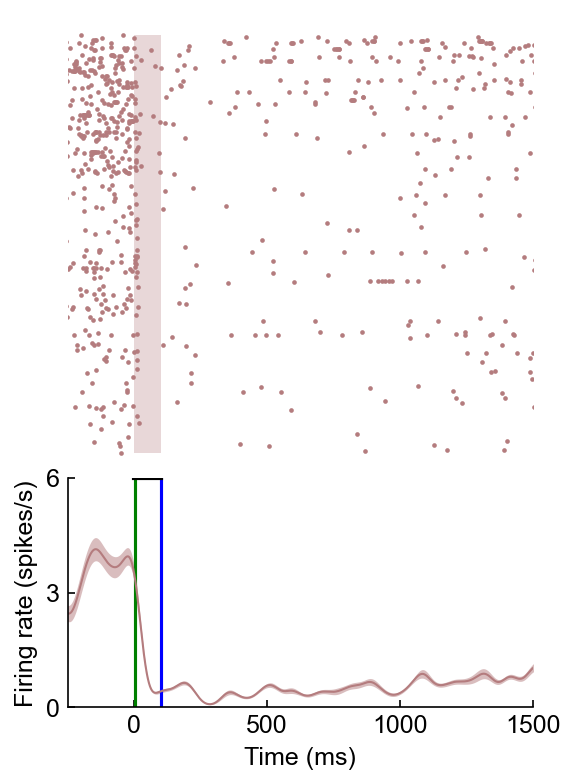

In [403]:
visualizeClusterInternal(sessionfile,9)[0]

onset latency = 3
offset latency = 102


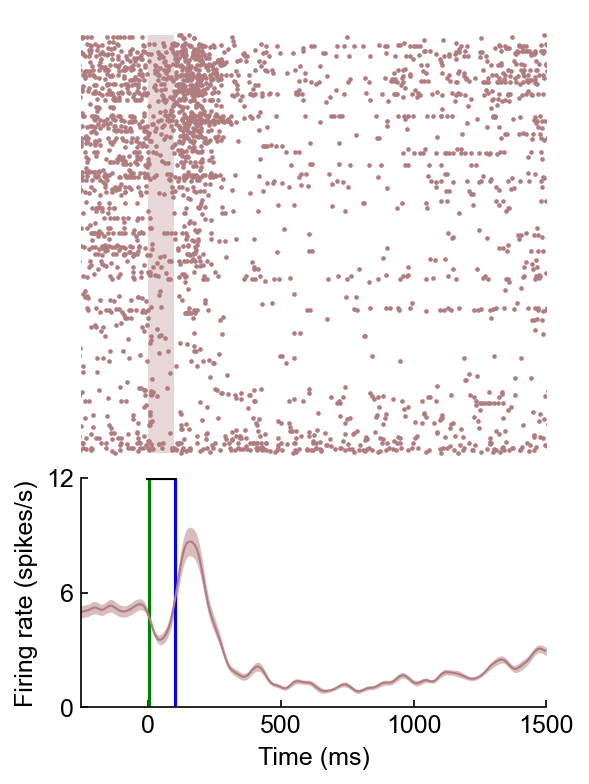

In [404]:
visualizeClusterInternal(sessionfile,3)[0]

In [219]:
avg_spon_FR = visualizeClusterInternal(sessionfile,3)[0]

0
5.090172848183889
5.266666666666666


In [155]:
avg_spon_FR = visualizeClusterInternal(sessionfile,9)[-1]

0


In [ ]:
avg_spon_FR

array([3.72239583, 3.72816608, 3.73376001, 3.73917732, 3.74441784,
       3.74948155, 3.75436858, 3.75907918, 3.76361375, 3.76797282,
       3.77215702, 3.77616713, 3.78000405, 3.78366876, 3.78716238,
       3.79048613, 3.79364131, 3.79662934, 3.7994517 , 3.80210997,
       3.8046058 , 3.80694092, 3.8091171 , 3.8111362 , 3.81300011,
       3.81471077, 3.81627016, 3.8176803 , 3.81894322, 3.82006099,
       3.82103568, 3.82186936, 3.82256411, 3.82312199, 3.82354507,
       3.82383538, 3.82399492, 3.82402566, 3.82392954, 3.82370843,
       3.82336416, 3.8228985 , 3.82231315, 3.82160975, 3.82078983,
       3.81985487, 3.81880623, 3.81764519, 3.81637294, 3.81499054,
       3.81349895, 3.811899  , 3.81019142, 3.80837681, 3.80645563,
       3.80442821, 3.80229475, 3.80005529, 3.79770976, 3.79525792,
       3.79269938, 3.7900336 , 3.78725991, 3.78437746, 3.78138525,
       3.77828213, 3.77506679, 3.77173776, 3.76829342, 3.76473199,
       3.76105153, 3.75724995, 3.75332501, 3.74927431, 3.74509

In [113]:
np.mean(avg_spon_FR)

3.5922024901178293

In [114]:
np.std(avg_spon_FR)

0.2808020458131572

()
[[2.97967747 2.95453908 2.92914762 2.90351077 2.87763651 2.85153308
  2.82520902 2.79867314 2.7719345  2.74500241 2.71788642 2.69059631
  2.66314207 2.63553392 2.60778224 2.57989762 2.55189081 2.5237727
  2.49555435 2.46724694 2.43886176 2.41041022 2.3819038  2.35335406
  2.32477263 2.29617119 2.26756144 2.2389551  2.21036391 2.18179959
  2.15327383 2.1247983  2.0963846  2.06804427 2.03978878 2.0116295
  1.9835777  1.95564452 1.92784098 1.90017796 1.87266616 1.84531615
  1.81813828 1.79114274 1.76433951 1.73773835 1.71134881 1.6851802
  1.6592416  1.63354184 1.60808948 1.58289282 1.5579599  1.53329848
  1.50891601 1.48481968 1.46101638 1.43751267 1.41431484 1.39142886
  1.36886038 1.34661474 1.32469696 1.30311176 1.2818635  1.26095627
  1.24039379 1.2201795  1.20031649 1.18080755 1.16165514 1.14286141
  1.1244282  1.10635703 1.08864911 1.07130538 1.05432643 1.03771259
  1.02146389 1.00558007 0.99006058 0.97490463 0.96011111 0.94567869
  0.93160577 0.91789048 0.90453074 0.89152419 0.

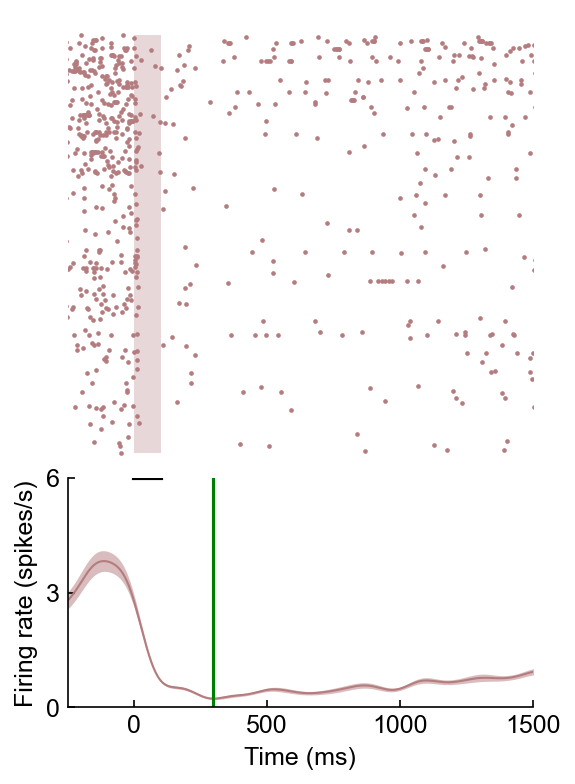

In [96]:
visualizeClusterInternal(sessionfile,9)[0]

In [30]:
AC_FRmod_baseline_median

3.5

In [31]:
sessionfile = ilep.loadSessionCached(act_directory,'BS_42_2_AC.pickle')

In [21]:
sessionclust = sessionfile.clusters.good

In [22]:
sessionclust

array([  3,   5,   7,   8,   9,  12,  14,  15,  16,  17,  18,  27,  41,
        48,  54,  57,  61,  62,  64,  68,  69,  78,  82,  84,  85,  86,
        89, 100, 108, 112, 115, 116, 118, 119, 121, 128, 129, 131, 135],
      dtype=int64)

406
10
1950
299
3.727422003284073


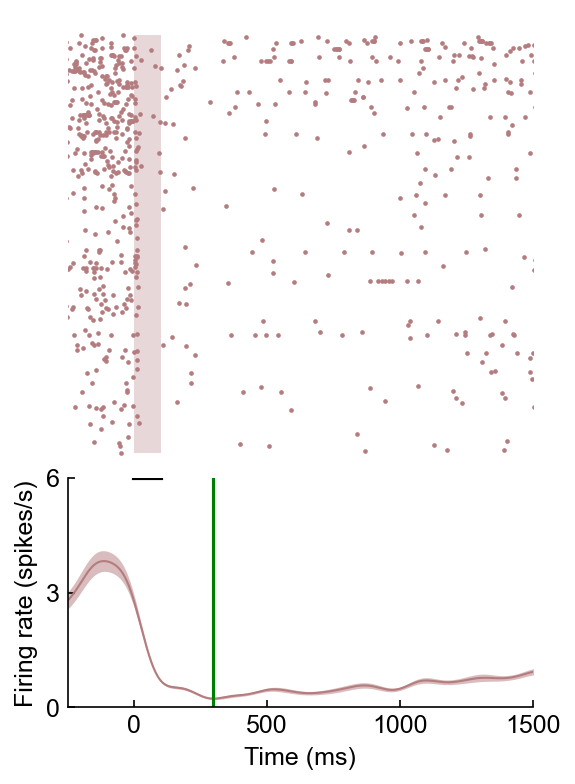

In [48]:
visualizeClusterInternal(sessionfile,9)[0]

In [38]:
sessionfile.responsiveness[3]['all_trials']

namespace(trials=array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
                         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
                         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
                         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
                         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
                         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
                         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
                         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
                        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
                        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
                        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
                     

### M2

In [14]:
M2_peaklatency_preearly = []
M2_peaklatency_prelate = []
M2_peaklatency_preexpert = []
M2_peaklatency_postearly = []
M2_peaklatency_postlate = []
M2_peaklatency_postexpert = []

In [19]:
# def visualizeClusterInternal(sessionfile,clust,sessionname, Phase):
#     bw_scott_factor = 3
    
#     fig = plt.figure(figsize=(4,6))
#     gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
#     ax1 = plt.subplot(gs[0,0])#Raster
#     ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
#     ax1.spines['bottom'].set_visible(False)
#     ax1.spines['left'].set_visible(False)
#     ax1.get_xaxis().set_visible(False)
#     ax1.get_yaxis().set_visible(False)
    
#     FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
#     mn = M2_FRmod_baseline_median 
#     spread = 2.5
#     FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
#     color_to_use = FRmod_color
    
#     ##################
#     allConditions = ilep.getAllConditions(sessionfile,clust)
#     trialsToPlot = allConditions['all_trials'].trials

#     tone_times = sessionfile.trials.starts
#     clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
#     trialSpikes = []
    
#     for trial in trialsToPlot:

#         #Need to get spike times for each trail...
#         starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
#         endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

#         this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
#         this_trial_spikes = this_trial_spikes - tone_times[trial]
#         this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

#         trialSpikes.append(this_trial_spikes)
#     trialSpikes = np.array(trialSpikes,dtype='object')
    
#     #Plot Raster
#     for idx,trial in enumerate(trialsToPlot):
#         ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
#     ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0,) #shading stim
    
#     #Plot PSTH
#     starttime = -250-100 #-350
#     endtime = 1500+100 #1600
#     PSTHstart = starttime - 100
#     PSTHend = endtime + 100
#     xrange = np.linspace(starttime,endtime,num=1950)
#     #numSplits=10
#     numSplits = min(10,len(trialSpikes))
#     if numSplits < 2:
#         return False,[] ### Return a failure
    
#     FR = np.full((numSplits,len(xrange)),np.nan)
#     kf = KFold(n_splits=numSplits)
#     for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
#         PSTHspikes = np.concatenate(trialSpikes[train_index])
#         if len(PSTHspikes) == 0:
#             FR[idx,:] = np.zeros(len(xrange))
#             continue
#         bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
#         KDE = gaussian_kde(PSTHspikes,bw_method=bw)
#         FR[idx,:] = KDE.evaluate(xrange)
#         FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
#     avg_FR = np.mean(FR,axis=0)
#     sem_FR = np.std(FR,axis=0)
    
#     ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
#     ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
#     max_FR_value = np.max(avg_FR+sem_FR) * 1.1
#     sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
#     idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
#     valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
#     limit = np.min(valid_limits)
#     ax2.set_ylim([0,limit])
#     ax2.set_yticks([0,limit/2,limit])
#     ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
#     ax2.set_ylabel('Firing rate (spikes/s)',size=12)

#     ax2.plot([0,100],[limit,limit],color='k',lw=2,linestyle='-') #zorder = 10 line of tone

    
#     ax2.set_xlim([-250,1500])
#     ax2.set_xticks([0,500,1000,1500])
#     ax2.set_xticklabels(['0','500','1000','1500'],size=12)
#     ax2.set_xlabel('Time (ms)',size=12)
    
#     ######
#     baseline_FR = sessionfile.responsiveness[clust]['all_trials'].FRbaseline

#     diff_from_baseline = np.abs(avg_FR[350:1350] - baseline_FR)
    
#     peak = np.max(diff_from_baseline) #len=1000
#     peak_time = np.argmax(diff_from_baseline) #ms
    
#     #print(peak_time)
    
#     FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    
#     if FRmod>=M2_FRmod_baseline_median:
#         ax2.axvline(x=peak_time,color='green')
    
#     fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Peak_latency\\Stimulus\\M2\\'+Phase+str(sessionname)+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    
#     plt.close(fig)
#     return fig,[ax1,ax2],FRmod,peak_time

In [15]:
def visualizeClusterInternal(sessionfile,clust,sessionname, Phase):
    bw_scott_factor = 3
    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    mn = M2_FRmod_baseline_median 
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0,) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='k',lw=2,linestyle='-') #zorder = 10 line of tone

    
    ax2.set_xlim([-250,1500])
    ax2.set_xticks([0,500,1000,1500])
    ax2.set_xticklabels(['0','500','1000','1500'],size=12)
    ax2.set_xlabel('Time (ms)',size=12)
    
    ######
    baseline_FR = sessionfile.responsiveness[clust]['all_trials'].FRbaseline

    #diff_from_baseline = np.abs(avg_FR[350:650] - baseline_FR) #0-300ms
    diff_from_baseline = np.abs(avg_FR[350:550] - baseline_FR) #0-200ms
    
    peak = np.max(diff_from_baseline) 
    peak_time = np.argmax(diff_from_baseline) #ms
    
    #print(peak_time)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    
    if FRmod>=M2_FRmod_baseline_median:
        ax2.axvline(x=peak_time,color='green')
        fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\M2(V2)\\'+Phase+str(sessionname)+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\M2\\'+Phase+str(sessionname)+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    
    plt.close(fig)
    return fig,[ax1,ax2],FRmod,peak_time

In [16]:
for session in M2_preearly:
    session_M2 = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_M2 = session_M2.clusters.good
    for clust in clust_M2:
        visualizeClusterInternal(session_M2,clust,sessionname,'Preearly')
        FRmod = visualizeClusterInternal(session_M2,clust,sessionname,'Preearly')[-2]
        peak_time = visualizeClusterInternal(session_M2,clust,sessionname,'Preearly')[-1]
        if FRmod>=M2_FRmod_baseline_median:
            M2_peaklatency_preearly.append(peak_time)

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

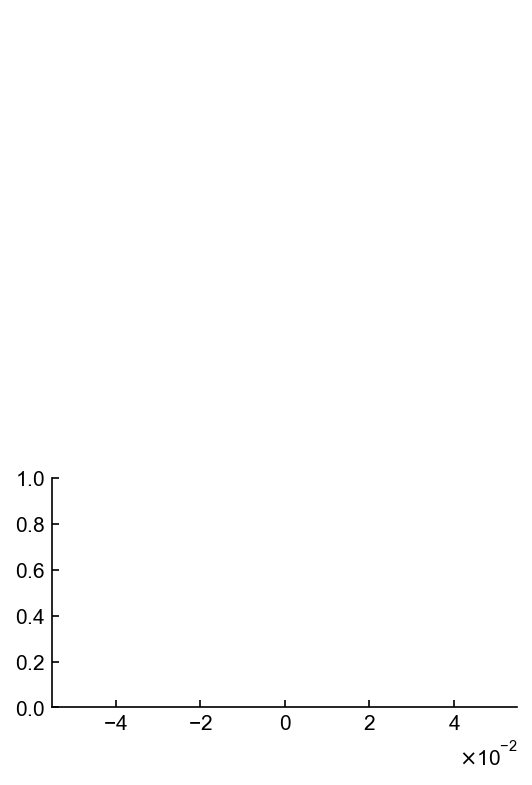

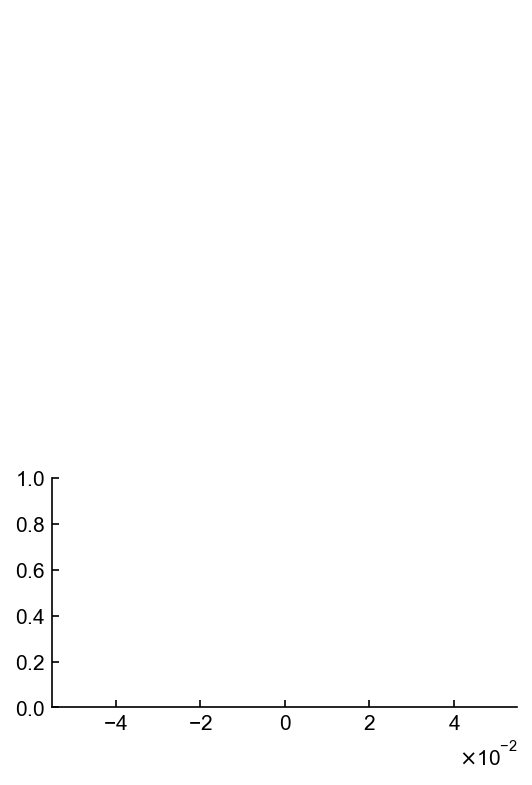

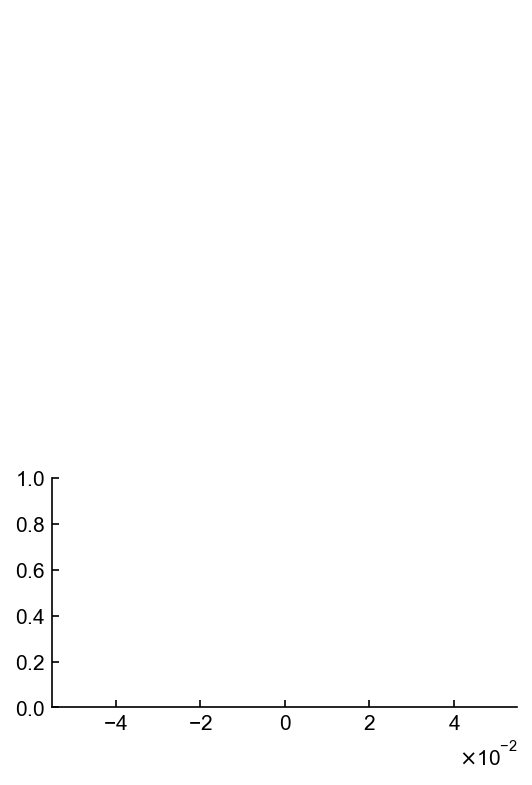

In [17]:
for session in M2_prelate[:-1]:
    session_M2 = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_M2 = session_M2.clusters.good
    for clust in clust_M2:
        visualizeClusterInternal(session_M2,clust,sessionname,'Prelate')
        FRmod = visualizeClusterInternal(session_M2,clust,sessionname,'Prelate')[-2]
        peak_time = visualizeClusterInternal(session_M2,clust,sessionname,'Prelate')[-1]
        if FRmod>=M2_FRmod_baseline_median:
            M2_peaklatency_prelate.append(peak_time)

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

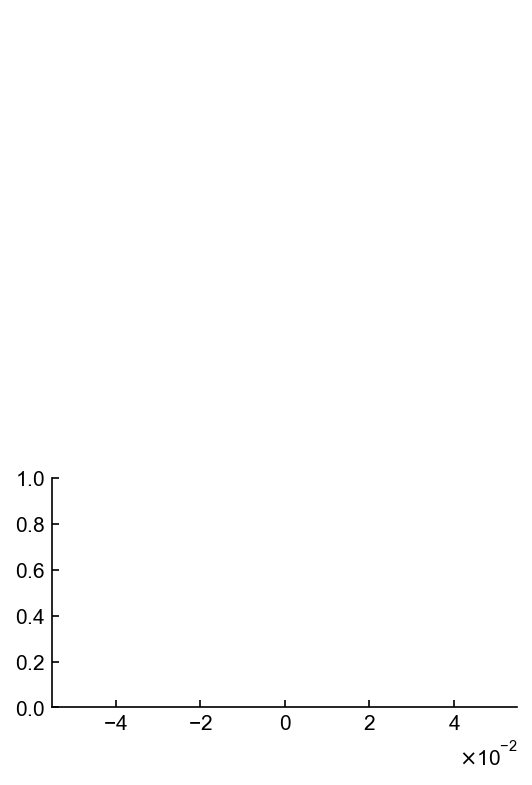

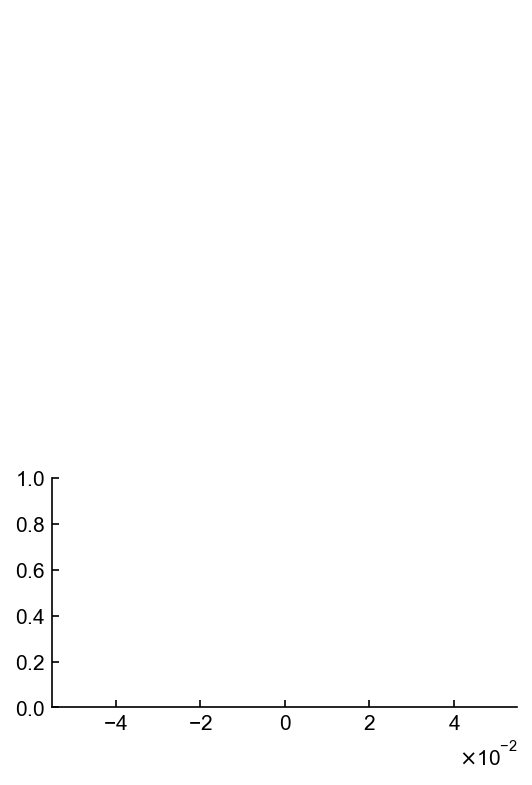

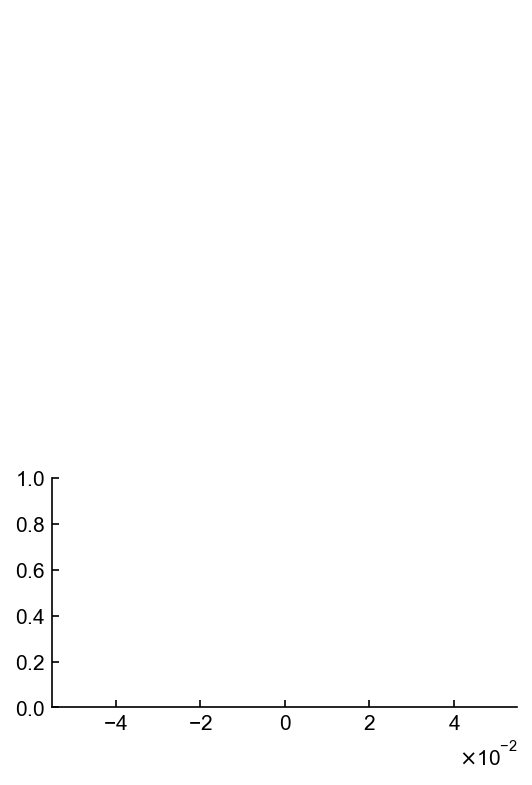

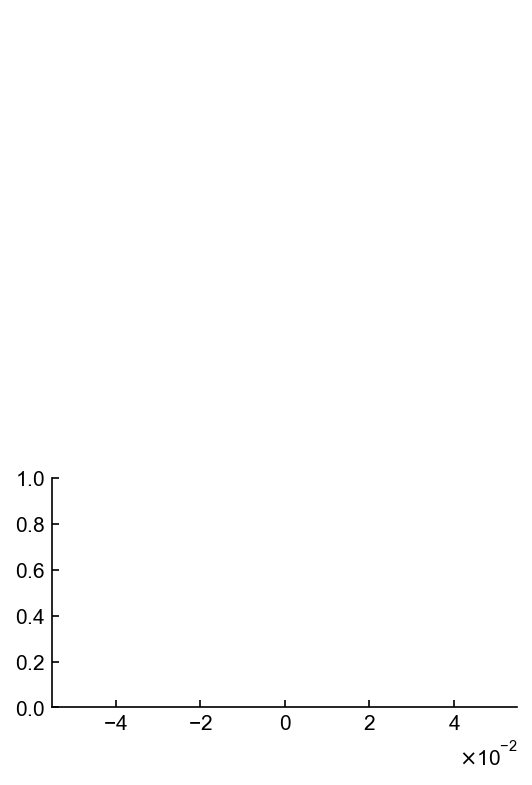

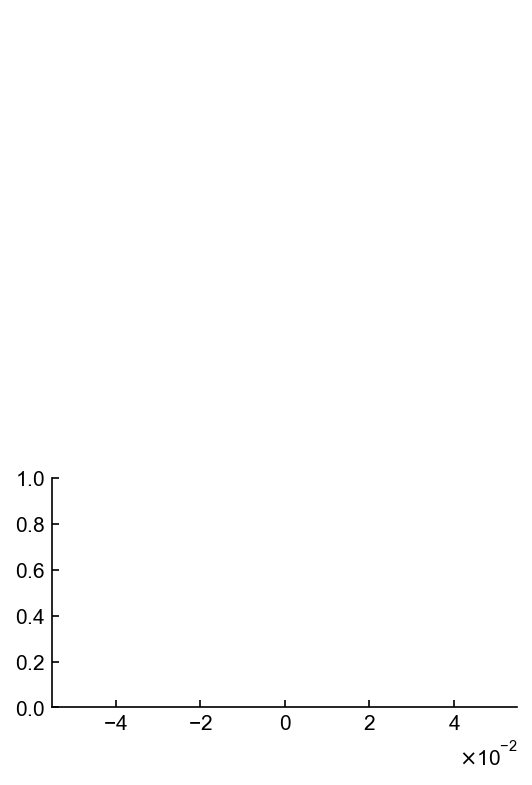

...

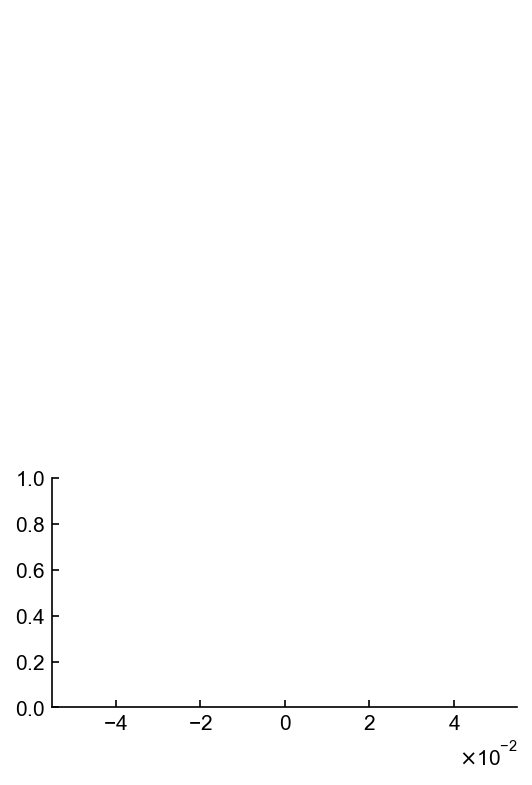

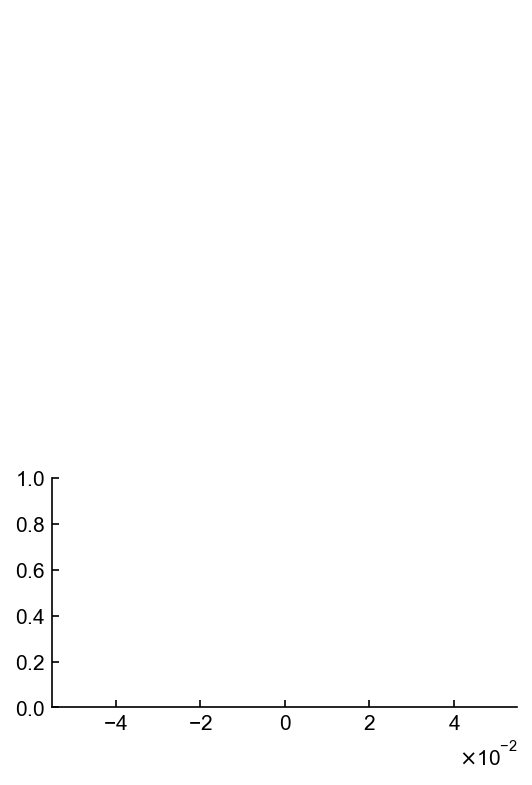

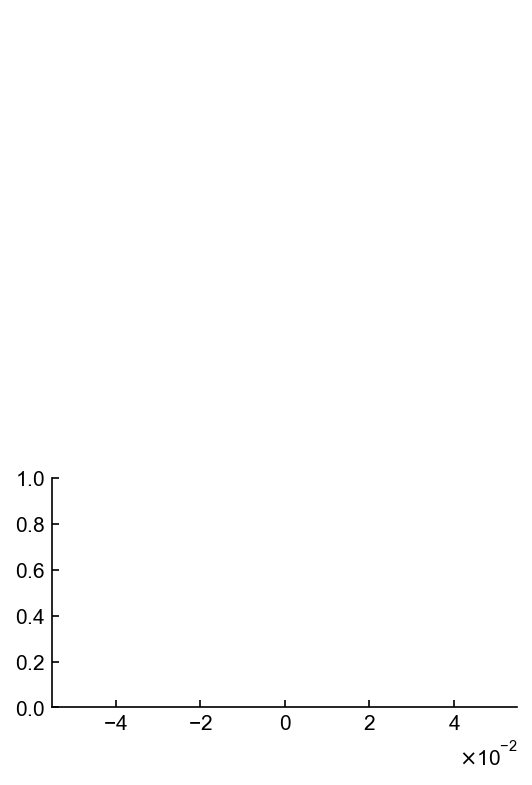

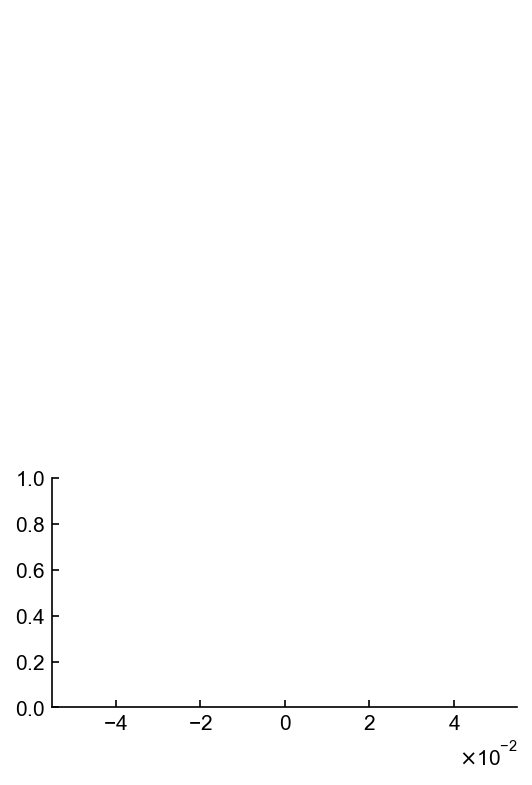

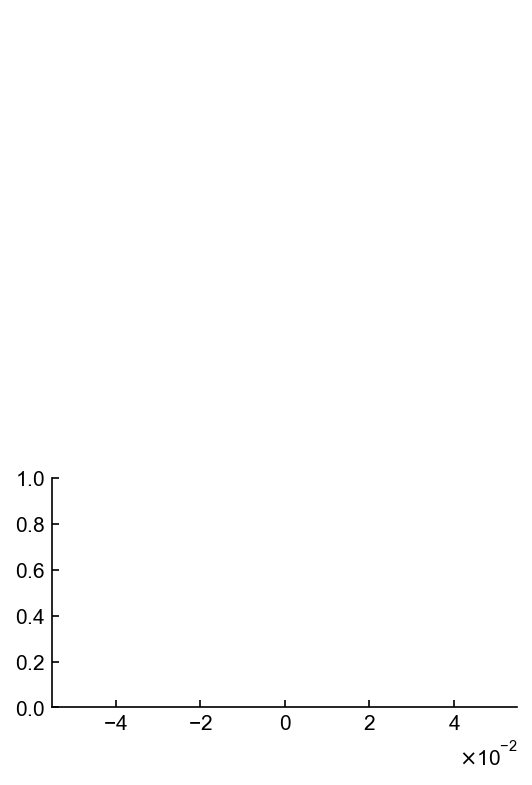

In [18]:
for session in M2_preexpert:
    session_M2 = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_M2 = session_M2.clusters.good
    for clust in clust_M2:
        visualizeClusterInternal(session_M2,clust,sessionname,'Preexpert')
        FRmod = visualizeClusterInternal(session_M2,clust,sessionname,'Preexpert')[-2]
        peak_time = visualizeClusterInternal(session_M2,clust,sessionname,'Preexpert')[-1]
        if FRmod>=M2_FRmod_baseline_median:
            M2_peaklatency_preexpert.append(peak_time)

In [19]:
for session in M2_postearly:
    session_M2 = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_M2 = session_M2.clusters.good
    for clust in clust_M2:
        visualizeClusterInternal(session_M2,clust,sessionname,'Postearly')
        FRmod = visualizeClusterInternal(session_M2,clust,sessionname,'Postearly')[-2]
        peak_time = visualizeClusterInternal(session_M2,clust,sessionname,'Postearly')[-1]
        if FRmod>=M2_FRmod_baseline_median:
            M2_peaklatency_postearly.append(peak_time)

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

In [20]:
for session in M2_postlate:
    session_M2 = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_M2 = session_M2.clusters.good
    for clust in clust_M2:
        visualizeClusterInternal(session_M2,clust,sessionname,'Postlate')
        FRmod = visualizeClusterInternal(session_M2,clust,sessionname,'Postlate')[-2]
        peak_time = visualizeClusterInternal(session_M2,clust,sessionname,'Postlate')[-1]
        if FRmod>=M2_FRmod_baseline_median:
            M2_peaklatency_postlate.append(peak_time)

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

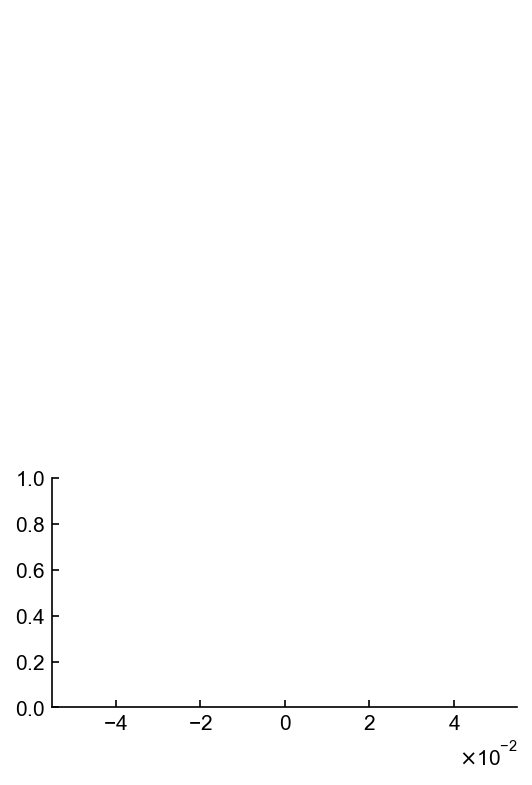

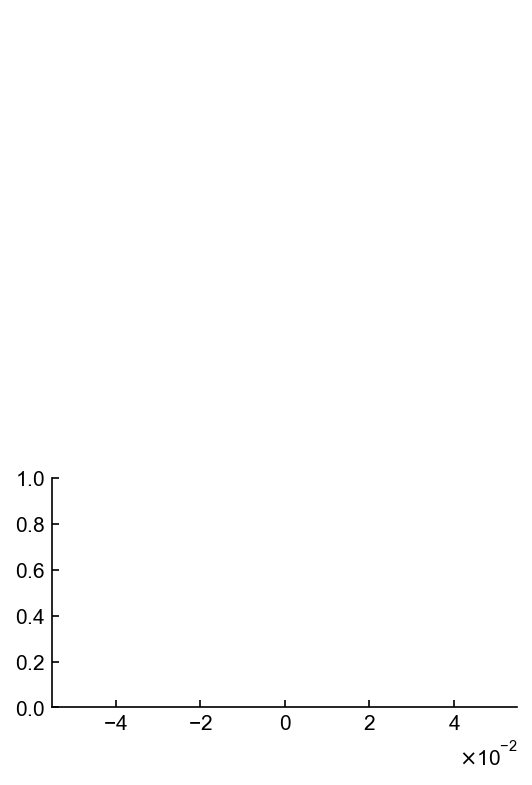

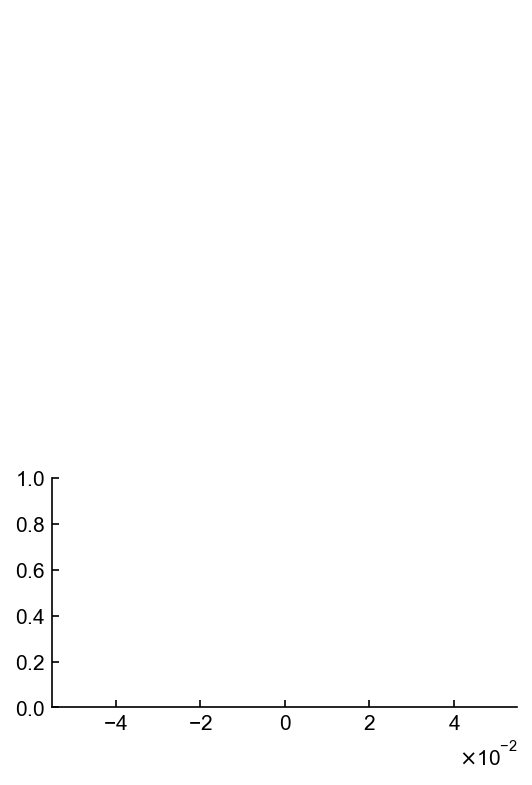

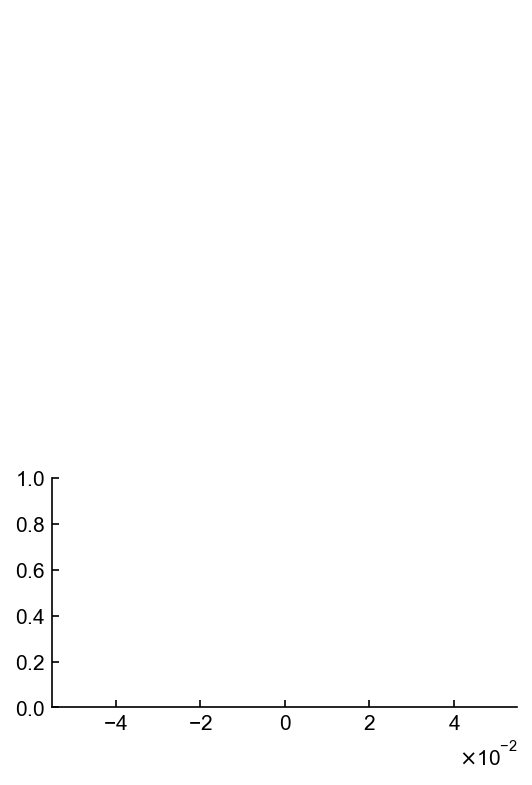

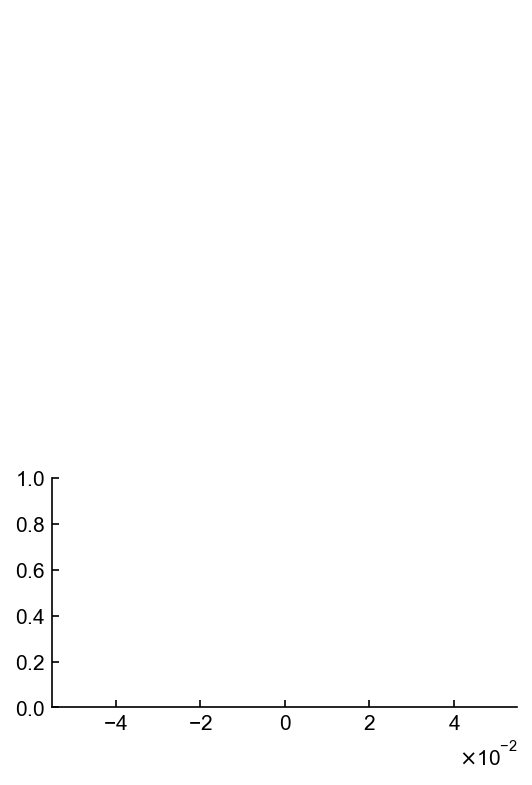

...

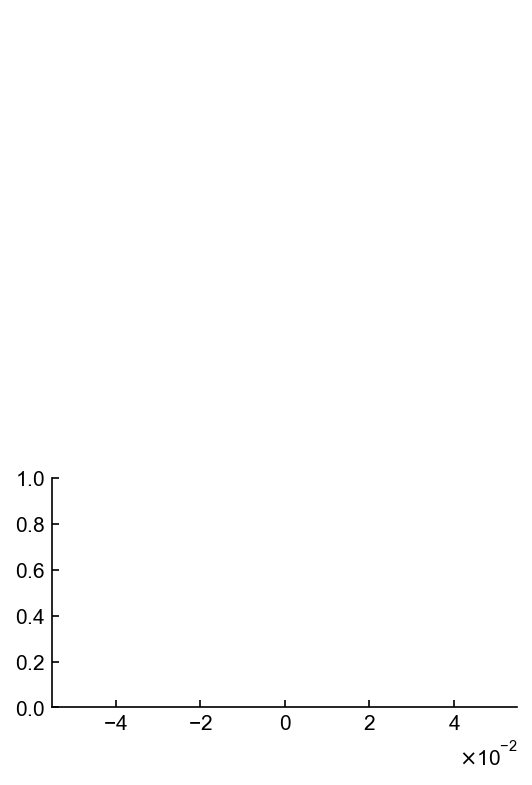

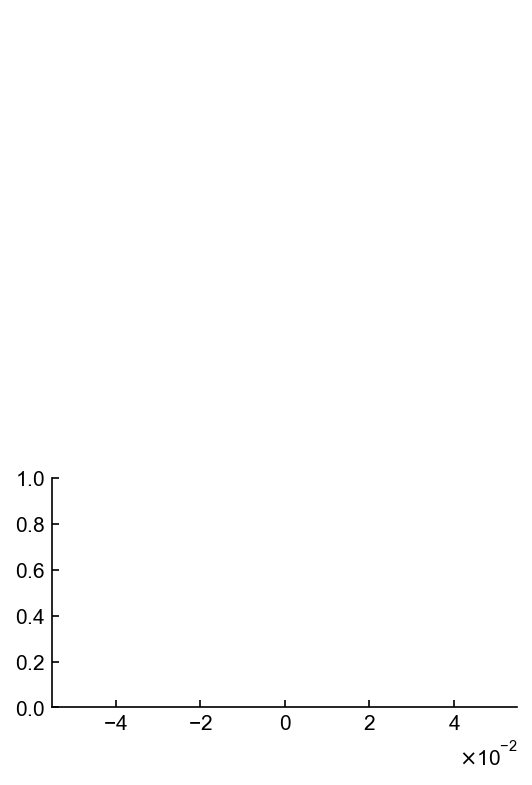

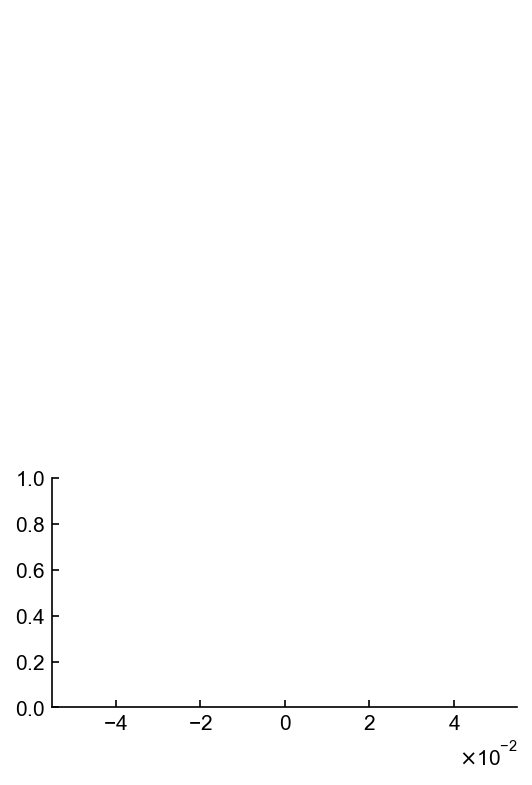

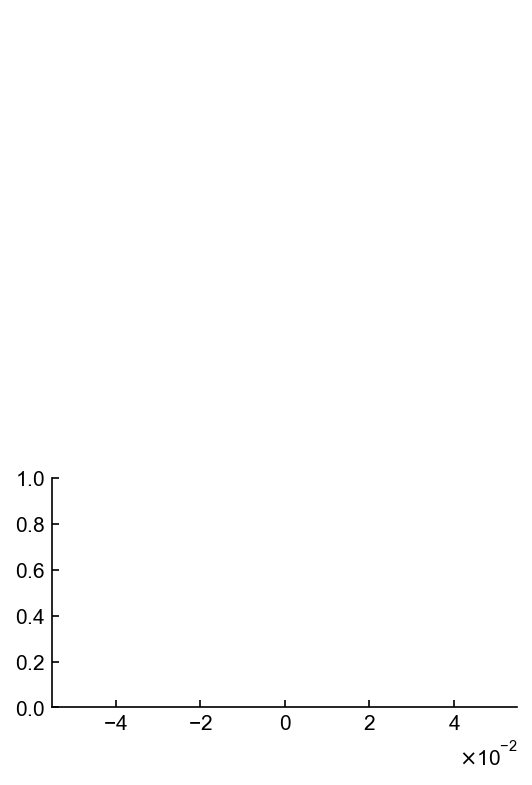

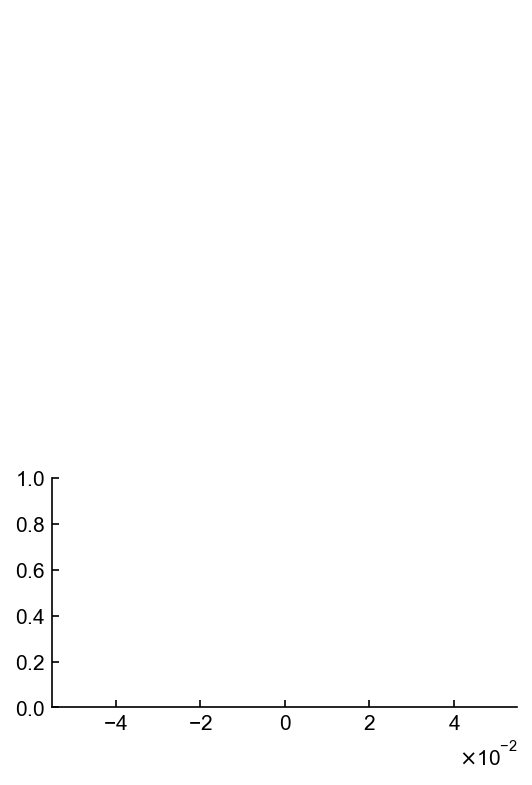

In [21]:
for session in M2_postexpert:
    session_M2 = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_M2 = session_M2.clusters.good
    for clust in clust_M2:
        visualizeClusterInternal(session_M2,clust,sessionname,'Postexpert')
        FRmod = visualizeClusterInternal(session_M2,clust,sessionname,'Postexpert')[-2]
        peak_time = visualizeClusterInternal(session_M2,clust,sessionname,'Postexpert')[-1]
        if FRmod>=M2_FRmod_baseline_median:
            M2_peaklatency_postexpert.append(peak_time)

In [22]:
M2_peaklatency = SimpleNamespace(prereversal_early=M2_peaklatency_preearly,
                      prereversal_late=M2_peaklatency_prelate,
                      prereversal_expert=M2_peaklatency_preexpert,
                      postreversal_early=M2_peaklatency_postearly,
                      postreversal_late=M2_peaklatency_postlate,
                      postreversal_expert=M2_peaklatency_postexpert
                     )

#Save to pickle
filename = 'C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\M2(V2)\\M2_peaklatency200.pickle'
with open(filename, 'wb') as f:
    pickle.dump(M2_peaklatency, f, protocol=pickle.HIGHEST_PROTOCOL)

### AC

In [23]:
AC_peaklatency_preearly = []
AC_peaklatency_prelate = []
AC_peaklatency_preexpert = []
AC_peaklatency_postearly = []
AC_peaklatency_postlate = []
AC_peaklatency_postexpert = []

In [29]:
# def visualizeClusterInternal(sessionfile,clust,sessionname, Phase):
#     bw_scott_factor = 3
    
#     fig = plt.figure(figsize=(4,6))
#     gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
#     ax1 = plt.subplot(gs[0,0])#Raster
#     ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
#     ax1.spines['bottom'].set_visible(False)
#     ax1.spines['left'].set_visible(False)
#     ax1.get_xaxis().set_visible(False)
#     ax1.get_yaxis().set_visible(False)
    
#     FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
#     mn = AC_FRmod_baseline_median 
#     spread = 2.5
#     FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
#     color_to_use = FRmod_color
    
#     ##################
#     allConditions = ilep.getAllConditions(sessionfile,clust)
#     trialsToPlot = allConditions['all_trials'].trials

#     tone_times = sessionfile.trials.starts
#     clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
#     trialSpikes = []
    
#     for trial in trialsToPlot:

#         #Need to get spike times for each trail...
#         starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
#         endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

#         this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
#         this_trial_spikes = this_trial_spikes - tone_times[trial]
#         this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

#         trialSpikes.append(this_trial_spikes)
#     trialSpikes = np.array(trialSpikes,dtype='object')
    
#     #Plot Raster
#     for idx,trial in enumerate(trialsToPlot):
#         ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
#     ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0,) #shading stim
    
#     #Plot PSTH
#     starttime = -250-100 #-350
#     endtime = 1500+100 #1600
#     PSTHstart = starttime - 100
#     PSTHend = endtime + 100
#     xrange = np.linspace(starttime,endtime,num=1950)
#     #numSplits=10
#     numSplits = min(10,len(trialSpikes))
#     if numSplits < 2:
#         return False,[] ### Return a failure
    
#     FR = np.full((numSplits,len(xrange)),np.nan)
#     kf = KFold(n_splits=numSplits)
#     for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
#         PSTHspikes = np.concatenate(trialSpikes[train_index])
#         if len(PSTHspikes) == 0:
#             FR[idx,:] = np.zeros(len(xrange))
#             continue
#         bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
#         KDE = gaussian_kde(PSTHspikes,bw_method=bw)
#         FR[idx,:] = KDE.evaluate(xrange)
#         FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
#     avg_FR = np.mean(FR,axis=0)
#     sem_FR = np.std(FR,axis=0)
    
#     ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
#     ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
#     max_FR_value = np.max(avg_FR+sem_FR) * 1.1
#     sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
#     idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
#     valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
#     limit = np.min(valid_limits)
#     ax2.set_ylim([0,limit])
#     ax2.set_yticks([0,limit/2,limit])
#     ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
#     ax2.set_ylabel('Firing rate (spikes/s)',size=12)

#     ax2.plot([0,100],[limit,limit],color='k',lw=2,linestyle='-') #zorder = 10 line of tone

    
#     ax2.set_xlim([-250,1500])
#     ax2.set_xticks([0,500,1000,1500])
#     ax2.set_xticklabels(['0','500','1000','1500'],size=12)
#     ax2.set_xlabel('Time (ms)',size=12)
    
#     ######
#     baseline_FR = sessionfile.responsiveness[clust]['all_trials'].FRbaseline

#     diff_from_baseline = np.abs(avg_FR[350:1350] - baseline_FR)
    
#     peak = np.max(diff_from_baseline) #len=1000
#     peak_time = np.argmax(diff_from_baseline) #ms
    
#     #print(peak_time)
    
#     FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    
#     if FRmod>=AC_FRmod_baseline_median:
#         ax2.axvline(x=peak_time,color='green')
    
#     fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Peak_latency\\Stimulus\\AC\\'+Phase+str(sessionname)+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    
#     plt.close(fig)
#     return fig,[ax1,ax2],FRmod,peak_time

In [24]:
def visualizeClusterInternal(sessionfile,clust,sessionname, Phase):
    bw_scott_factor = 3
    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    mn = AC_FRmod_baseline_median 
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.35*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.6*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0,) #shading stim
    
    #Plot PSTH
    starttime = -250-100 #-350
    endtime = 1500+100 #1600
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1950)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='k',lw=2,linestyle='-') #zorder = 10 line of tone

    
    ax2.set_xlim([-250,1500])
    ax2.set_xticks([0,500,1000,1500])
    ax2.set_xticklabels(['0','500','1000','1500'],size=12)
    ax2.set_xlabel('Time (ms)',size=12)
    
    ######
    baseline_FR = sessionfile.responsiveness[clust]['all_trials'].FRbaseline

    #diff_from_baseline = np.abs(avg_FR[350:550] - baseline_FR) #200ms window check for AC
    diff_from_baseline = np.abs(avg_FR[350:650] - baseline_FR) #300ms window check for AC
    #print(len(diff_from_baseline))#len=200
    peak = np.max(diff_from_baseline) 

    peak_time = np.argmax(diff_from_baseline) #ms
    
    #print(peak_time)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    
    if FRmod>=AC_FRmod_baseline_median:
        ax2.axvline(x=peak_time,color='green')
        fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\AC(V2)\\'+Phase+str(sessionname)+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\AC\\'+Phase+str(sessionname)+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    
    plt.close(fig)
    return fig,[ax1,ax2],FRmod,peak_time

In [25]:
for session in AC_preearly:
    session_AC = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_AC = session_AC.clusters.good
    for clust in clust_AC:
        visualizeClusterInternal(session_AC,clust,sessionname,'Preearly')
        FRmod = visualizeClusterInternal(session_AC,clust,sessionname,'Preearly')[-2]
        peak_time = visualizeClusterInternal(session_AC,clust,sessionname,'Preearly')[-1]
        if FRmod>=AC_FRmod_baseline_median:
            AC_peaklatency_preearly.append(peak_time)

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

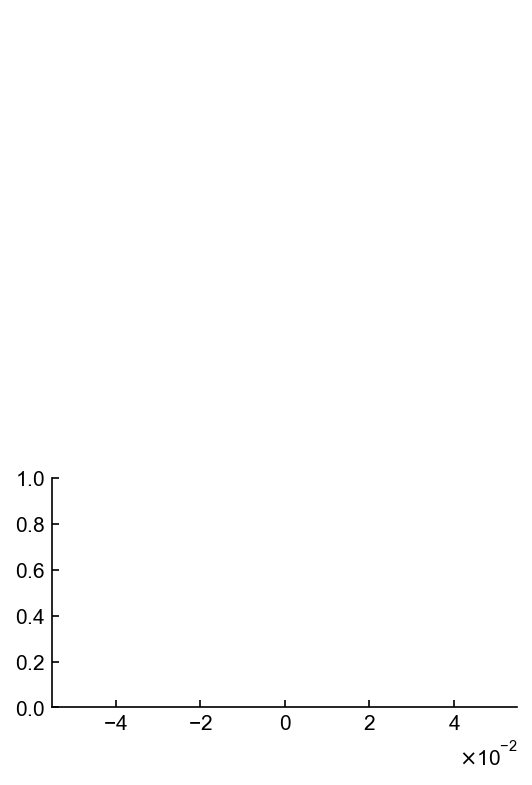

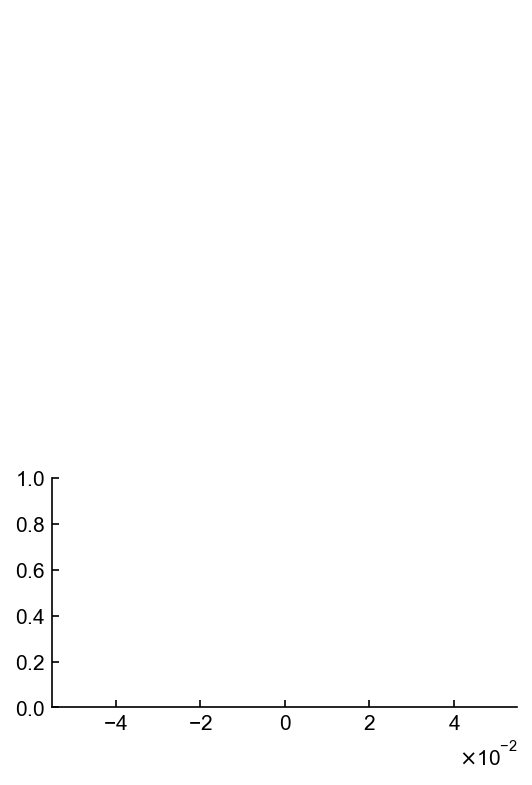

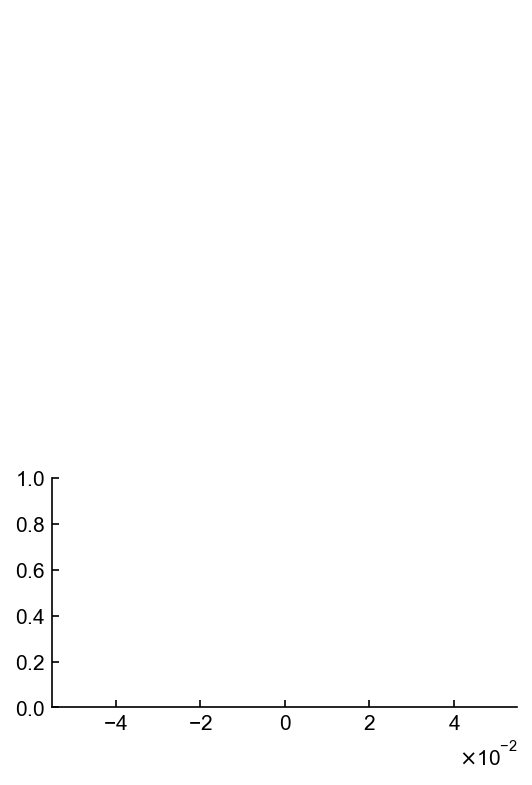

In [26]:
for session in AC_prelate:
    session_AC = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_AC = session_AC.clusters.good
    for clust in clust_AC:
        visualizeClusterInternal(session_AC,clust,sessionname,'Prelate')
        FRmod = visualizeClusterInternal(session_AC,clust,sessionname,'Prelate')[-2]
        peak_time = visualizeClusterInternal(session_AC,clust,sessionname,'Prelate')[-1]
        if FRmod>=AC_FRmod_baseline_median:
            AC_peaklatency_prelate.append(peak_time)

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

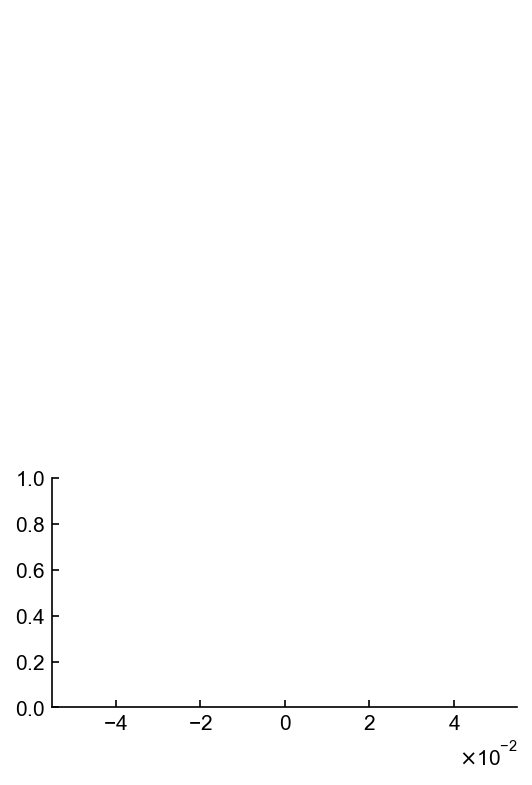

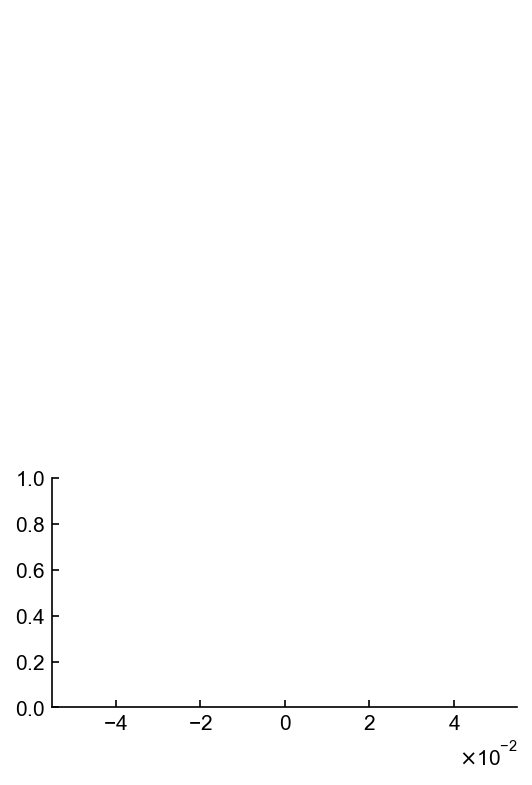

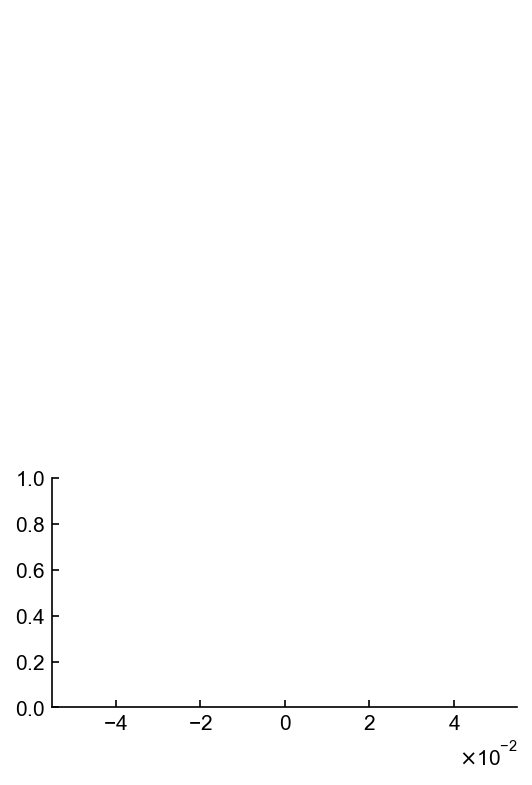

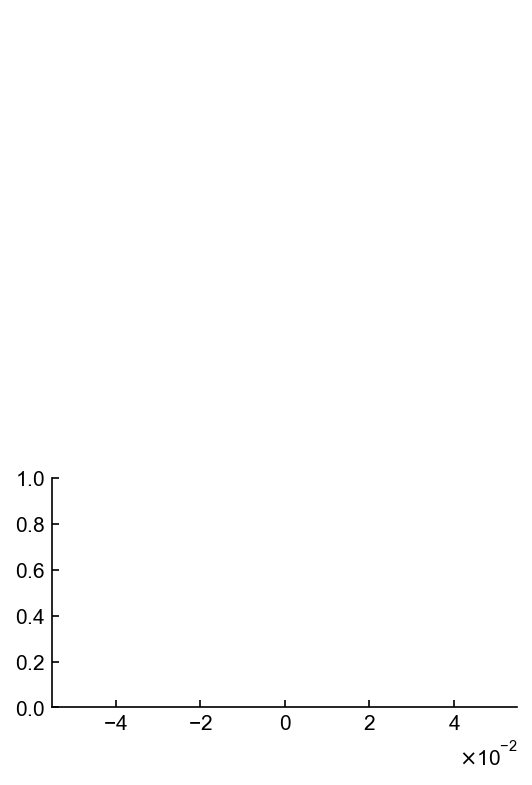

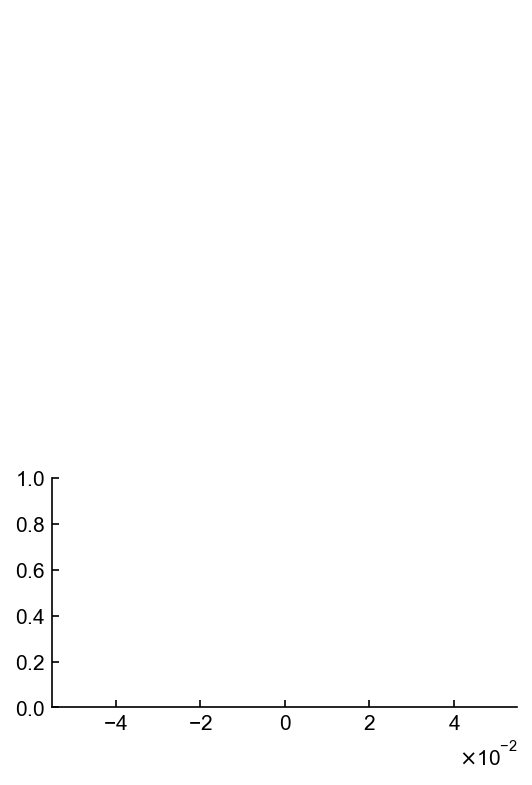

...

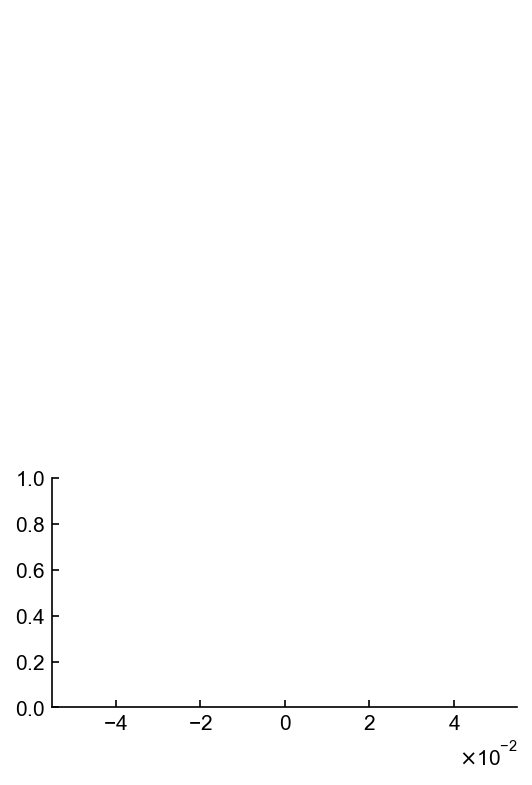

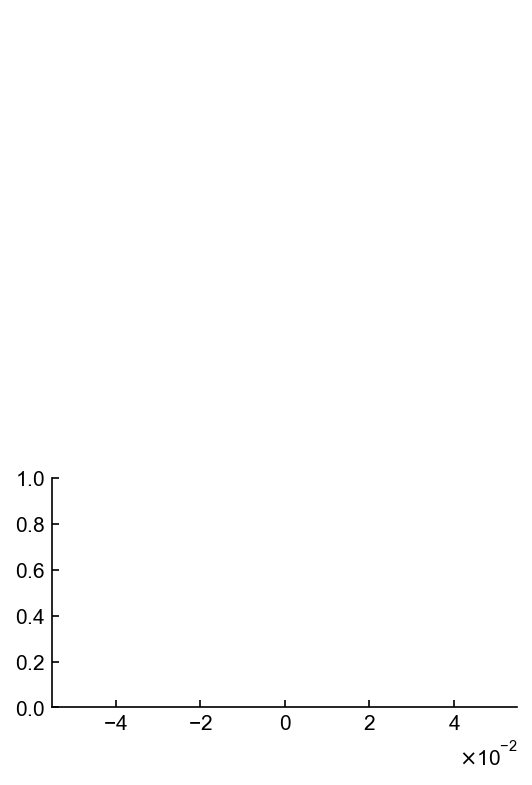

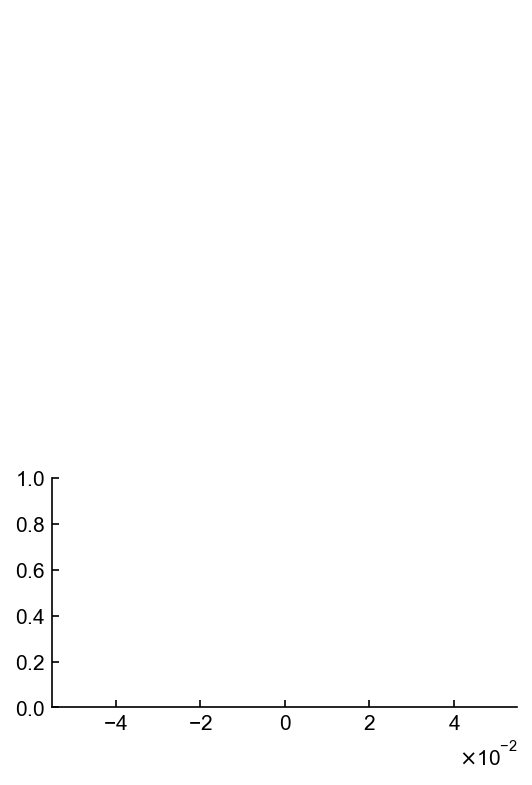

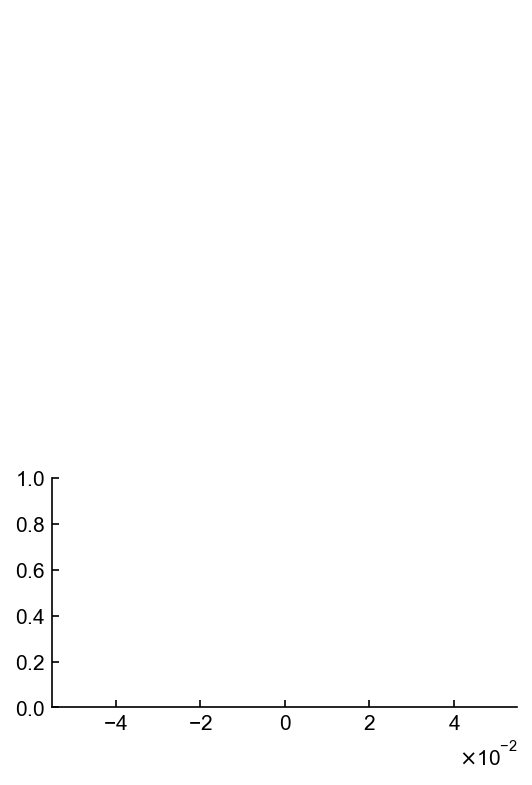

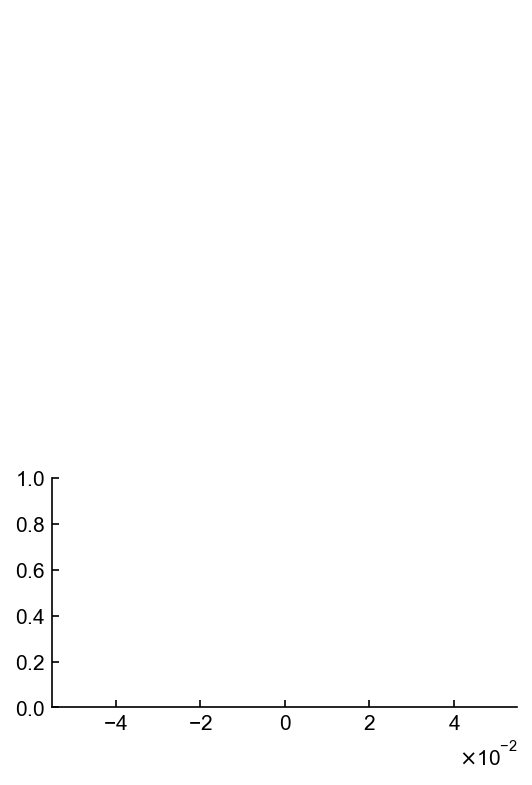

In [27]:
for session in AC_preexpert:
    session_AC = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_AC = session_AC.clusters.good
    for clust in clust_AC:
        visualizeClusterInternal(session_AC,clust,sessionname,'Preexpert')
        FRmod = visualizeClusterInternal(session_AC,clust,sessionname,'Preexpert')[-2]
        peak_time = visualizeClusterInternal(session_AC,clust,sessionname,'Preexpert')[-1]
        if FRmod>=AC_FRmod_baseline_median:
            AC_peaklatency_preexpert.append(peak_time)

In [28]:
for session in AC_postearly:
    session_AC = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_AC = session_AC.clusters.good
    for clust in clust_AC:
        visualizeClusterInternal(session_AC,clust,sessionname,'Postearly')
        FRmod = visualizeClusterInternal(session_AC,clust,sessionname,'Postearly')[-2]
        peak_time = visualizeClusterInternal(session_AC,clust,sessionname,'Postearly')[-1]
        if FRmod>=AC_FRmod_baseline_median:
            AC_peaklatency_postearly.append(peak_time)

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

In [29]:
for session in AC_postlate:
    session_AC = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_AC = session_AC.clusters.good
    for clust in clust_AC:
        visualizeClusterInternal(session_AC,clust,sessionname,'Postlate')
        FRmod = visualizeClusterInternal(session_AC,clust,sessionname,'Postlate')[-2]
        peak_time = visualizeClusterInternal(session_AC,clust,sessionname,'Postlate')[-1]
        if FRmod>=AC_FRmod_baseline_median:
            AC_peaklatency_postlate.append(peak_time)

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how

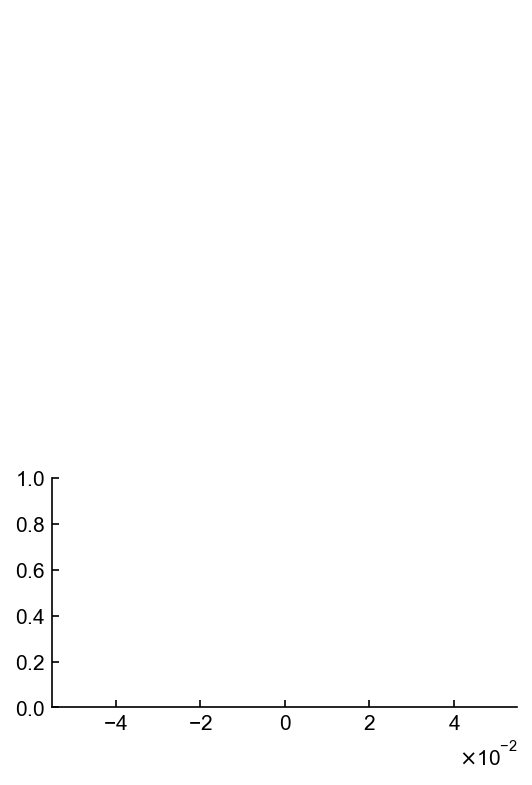

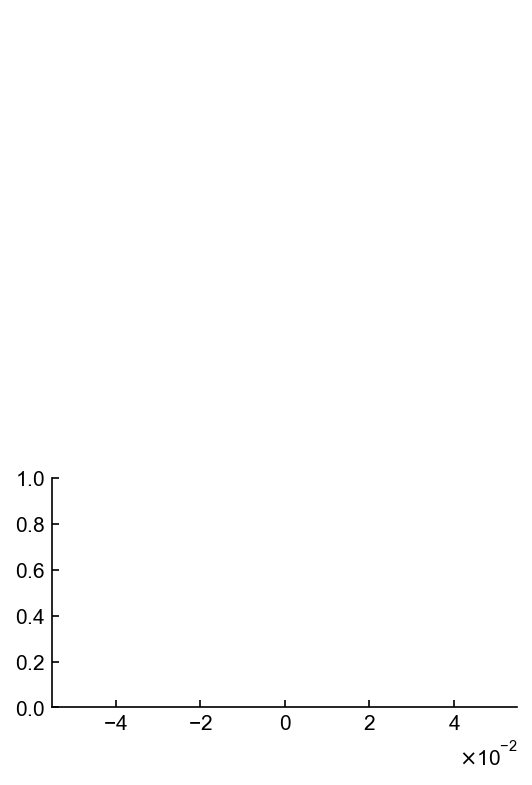

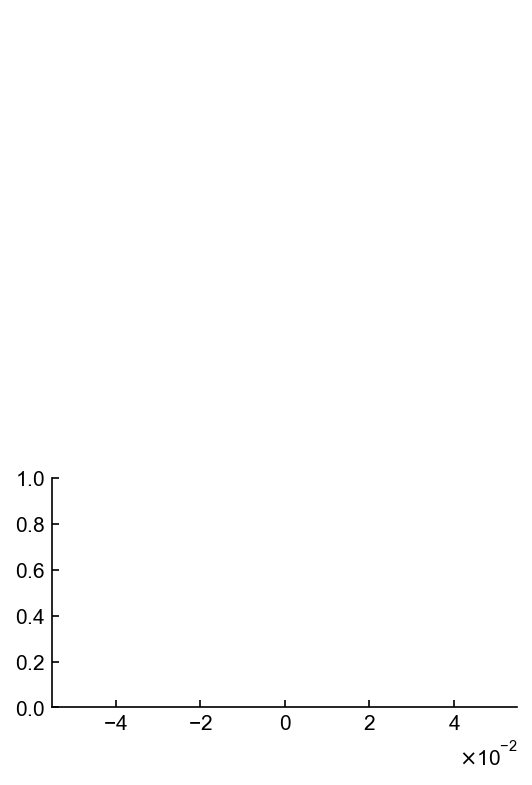

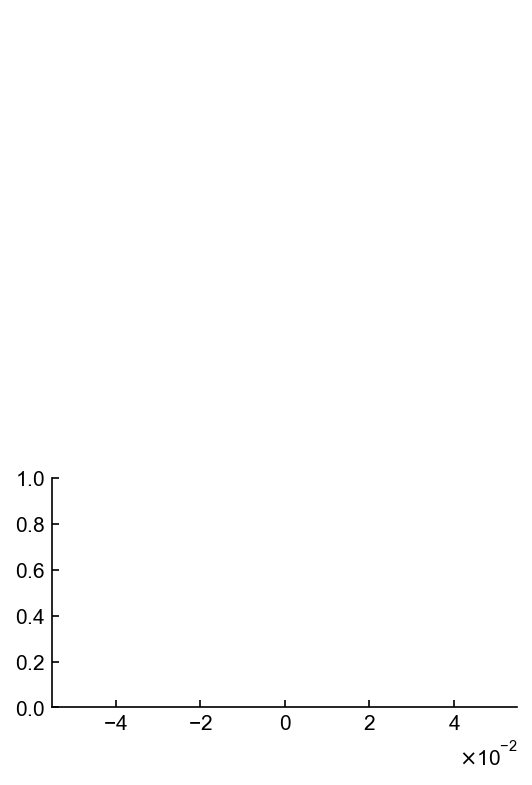

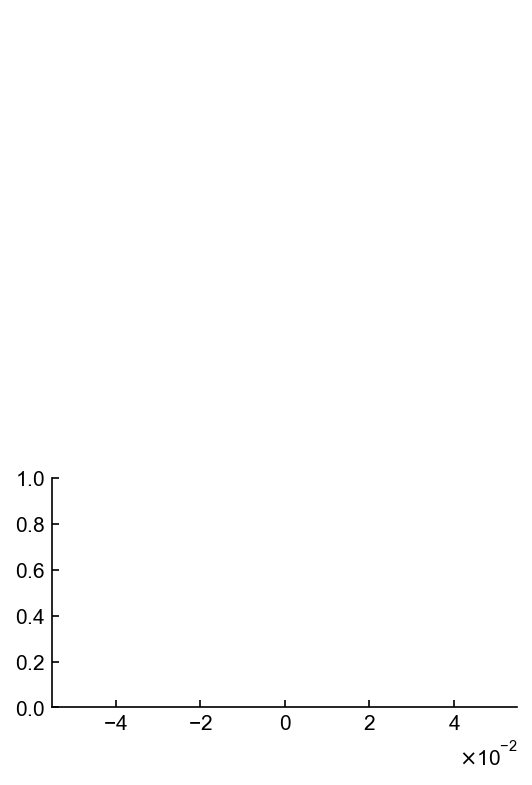

...

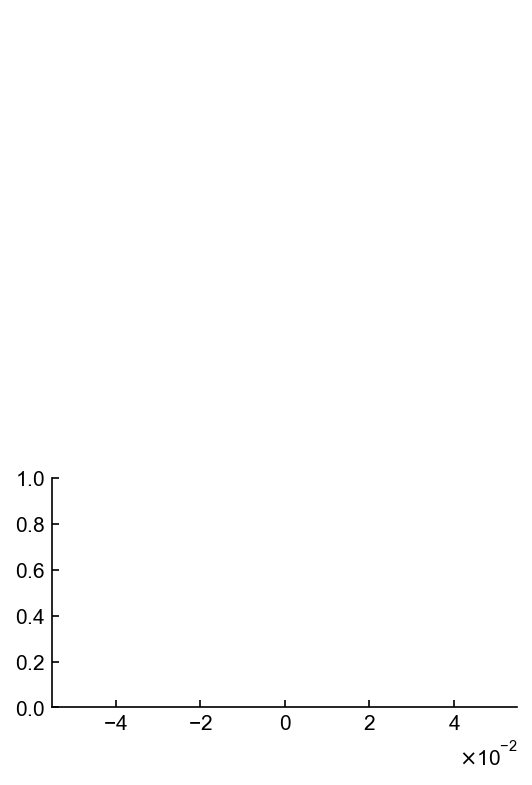

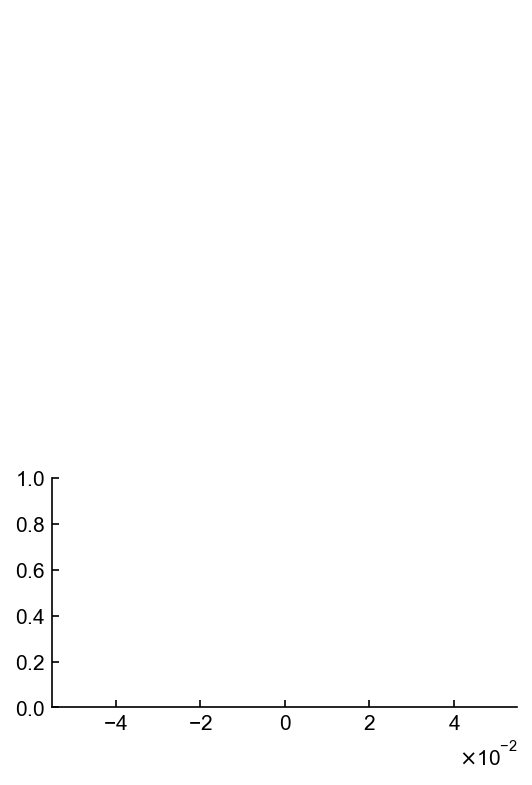

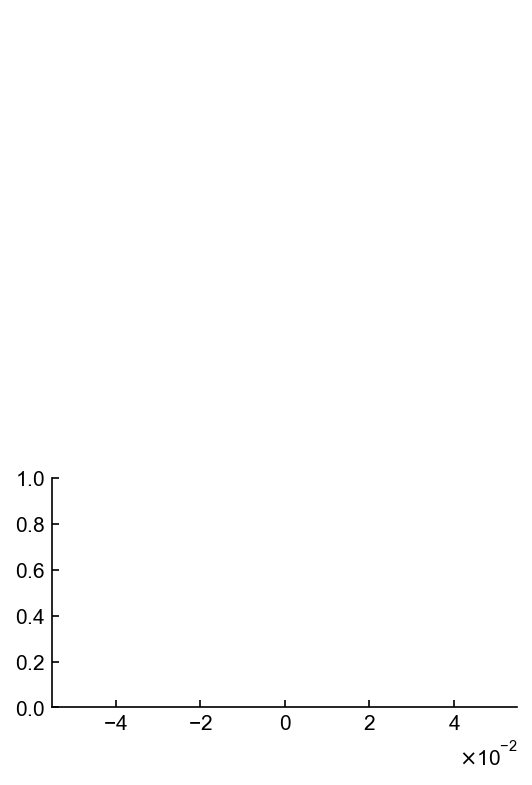

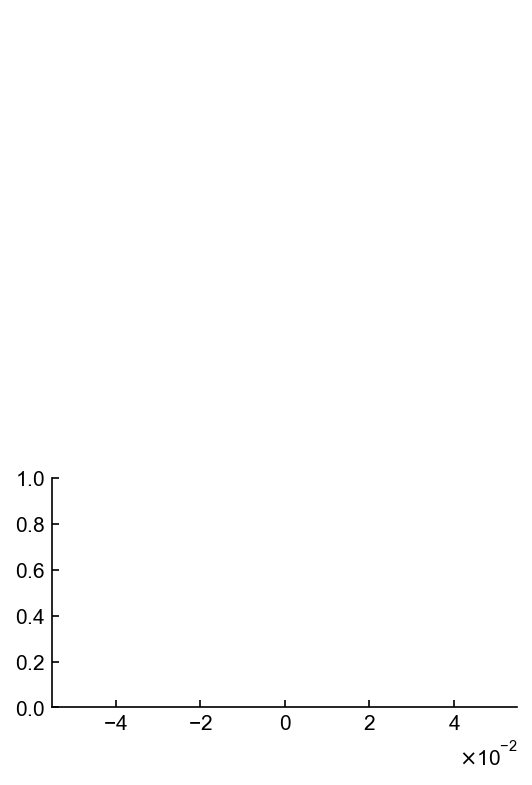

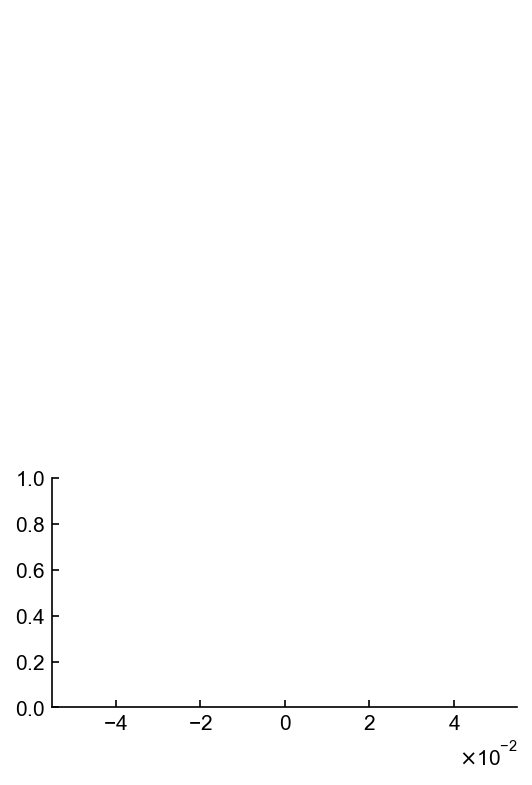

In [30]:
for session in AC_postexpert:
    session_AC = ilep.loadSessionCached(act_directory,session)
    sessionname = session
    
    clust_AC = session_AC.clusters.good
    for clust in clust_AC:
        visualizeClusterInternal(session_AC,clust,sessionname,'Postexpert')
        FRmod = visualizeClusterInternal(session_AC,clust,sessionname,'Postexpert')[-2]
        peak_time = visualizeClusterInternal(session_AC,clust,sessionname,'Postexpert')[-1]
        if FRmod>=AC_FRmod_baseline_median:
            AC_peaklatency_postexpert.append(peak_time)

In [31]:
AC_peaklatency = SimpleNamespace(prereversal_early=AC_peaklatency_preearly,
                      prereversal_late=AC_peaklatency_prelate,
                      prereversal_expert=AC_peaklatency_preexpert,
                      postreversal_early=AC_peaklatency_postearly,
                      postreversal_late=AC_peaklatency_postlate,
                      postreversal_expert=AC_peaklatency_postexpert
                     )

#Save to pickle
#filename = 'C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\AC\\AC_peaklatency200.pickle'
filename = 'C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\AC(V2)\\AC_peaklatency300.pickle'
with open(filename, 'wb') as f:
    pickle.dump(AC_peaklatency, f, protocol=pickle.HIGHEST_PROTOCOL)

### Analysis

In [ ]:
print(len(AC_peaklatency.prereversal_early))
print(len(AC_peaklatency.prereversal_late))
print(len(AC_peaklatency.prereversal_expert))
print(len(AC_peaklatency.postreversal_early))
print(len(AC_peaklatency.postreversal_late))
print(len(AC_peaklatency.postreversal_expert))

In [ ]:
print(len(M2_peaklatency.prereversal_early))
print(len(M2_peaklatency.prereversal_late))
print(len(M2_peaklatency.prereversal_expert))
print(len(M2_peaklatency.postreversal_early))
print(len(M2_peaklatency.postreversal_late))
print(len(M2_peaklatency.postreversal_expert))

In [ ]:
AC_peaklatency_pre_early = np.array(AC_peaklatency.prereversal_early)
AC_peaklatency_pre_late = np.array(AC_peaklatency.prereversal_late)
AC_peaklatency_pre_expert = np.array(AC_peaklatency.prereversal_expert)

AC_peaklatency_post_early = np.array(AC_peaklatency.postreversal_early)
AC_peaklatency_post_late = np.array(AC_peaklatency.postreversal_late)
AC_peaklatency_post_expert = np.array(AC_peaklatency.postreversal_expert)

In [ ]:
M2_peaklatency_pre_early = np.array(M2_peaklatency.prereversal_early)
M2_peaklatency_pre_late = np.array(M2_peaklatency.prereversal_late)
M2_peaklatency_pre_expert = np.array(M2_peaklatency.prereversal_expert)

M2_peaklatency_post_early = np.array(M2_peaklatency.postreversal_early)
M2_peaklatency_post_late = np.array(M2_peaklatency.postreversal_late)
M2_peaklatency_post_expert = np.array(M2_peaklatency.postreversal_expert)

In [ ]:
AC_peaklatency_onset_preearly = AC_peaklatency_pre_early[AC_peaklatency_pre_early<=100]
AC_peaklatency_onset_prelate = AC_peaklatency_pre_late[AC_peaklatency_pre_late<=100]
AC_peaklatency_onset_preexpert = AC_peaklatency_pre_expert[AC_peaklatency_pre_expert<=100]
AC_peaklatency_onset_postearly = AC_peaklatency_post_early[AC_peaklatency_post_early<=100]
AC_peaklatency_onset_postlate = AC_peaklatency_post_late[AC_peaklatency_post_late<=100]
AC_peaklatency_onset_postexpert = AC_peaklatency_post_expert[AC_peaklatency_post_expert<=100]

M2_peaklatency_onset_preearly = M2_peaklatency_pre_early[M2_peaklatency_pre_early<=100]
M2_peaklatency_onset_prelate = M2_peaklatency_pre_late[M2_peaklatency_pre_late<=100]
M2_peaklatency_onset_preexpert = M2_peaklatency_pre_expert[M2_peaklatency_pre_expert<=100]
M2_peaklatency_onset_postearly = M2_peaklatency_post_early[M2_peaklatency_post_early<=100]
M2_peaklatency_onset_postlate = M2_peaklatency_post_late[M2_peaklatency_post_late<=100]
M2_peaklatency_onset_postexpert = M2_peaklatency_post_expert[M2_peaklatency_post_expert<=100]

In [ ]:
AC_preearly_per_onset = len(AC_peaklatency_onset_preearly)/len(AC_peaklatency_pre_early)*100
AC_prelate_per_onset = len(AC_peaklatency_onset_prelate)/len(AC_peaklatency_pre_late)*100
AC_preexpert_per_onset = len(AC_peaklatency_onset_preexpert)/len(AC_peaklatency_pre_expert)*100
AC_postearly_per_onset = len(AC_peaklatency_onset_postearly)/len(AC_peaklatency_post_early)*100
AC_postlate_per_onset = len(AC_peaklatency_onset_postlate)/len(AC_peaklatency_post_late)*100
AC_postexpert_per_onset = len(AC_peaklatency_onset_postexpert)/len(AC_peaklatency_post_expert)*100

M2_preearly_per_onset = len(M2_peaklatency_onset_preearly)/len(M2_peaklatency_pre_early)*100
M2_prelate_per_onset = len(M2_peaklatency_onset_prelate)/len(M2_peaklatency_pre_late)*100
M2_preexpert_per_onset = len(M2_peaklatency_onset_preexpert)/len(M2_peaklatency_pre_expert)*100
M2_postearly_per_onset = len(M2_peaklatency_onset_postearly)/len(M2_peaklatency_post_early)*100
M2_postlate_per_onset = len(M2_peaklatency_onset_postlate)/len(M2_peaklatency_post_late)*100
M2_postexpert_per_onset = len(M2_peaklatency_onset_postexpert)/len(M2_peaklatency_post_expert)*100

In [ ]:
AC_peaklatency_offset_preearly = AC_peaklatency_pre_early[AC_peaklatency_pre_early>100]
AC_peaklatency_offset_prelate = AC_peaklatency_pre_late[AC_peaklatency_pre_late>100]
AC_peaklatency_offset_preexpert = AC_peaklatency_pre_expert[AC_peaklatency_pre_expert>100]
AC_peaklatency_offset_postearly = AC_peaklatency_post_early[AC_peaklatency_post_early>100]
AC_peaklatency_offset_postlate = AC_peaklatency_post_late[AC_peaklatency_post_late>100]
AC_peaklatency_offset_postexpert = AC_peaklatency_post_expert[AC_peaklatency_post_expert>100]

M2_peaklatency_offset_preearly = M2_peaklatency_pre_early[M2_peaklatency_pre_early>100]
M2_peaklatency_offset_prelate = M2_peaklatency_pre_late[M2_peaklatency_pre_late>100]
M2_peaklatency_offset_preexpert = M2_peaklatency_pre_expert[M2_peaklatency_pre_expert>100]
M2_peaklatency_offset_postearly = M2_peaklatency_post_early[M2_peaklatency_post_early>100]
M2_peaklatency_offset_postlate = M2_peaklatency_post_late[M2_peaklatency_post_late>100]
M2_peaklatency_offset_postexpert = M2_peaklatency_post_expert[M2_peaklatency_post_expert>100]

In [ ]:
print(np.max(AC_peaklatency_pre_early))
print(np.max(AC_peaklatency_pre_late))
print(np.max(AC_peaklatency_pre_expert))
print(np.max(AC_peaklatency_post_early))
print(np.max(AC_peaklatency_post_late))
print(np.max(AC_peaklatency_post_expert))

In [ ]:
print(np.max(M2_peaklatency_pre_early))
print(np.max(M2_peaklatency_pre_late))
print(np.max(M2_peaklatency_pre_expert))
print(np.max(M2_peaklatency_post_early))
print(np.max(M2_peaklatency_post_late))
print(np.max(M2_peaklatency_post_expert))

In [ ]:
#

In [ ]:
AC_peaklatency_preearly = np.concatenate((AC_peaklatency_offset_preearly-100,AC_peaklatency_onset_preearly))
AC_peaklatency_prelate = np.concatenate((AC_peaklatency_offset_prelate-100,AC_peaklatency_onset_prelate))
AC_peaklatency_preexpert = np.concatenate((AC_peaklatency_offset_preexpert-100,AC_peaklatency_onset_preexpert))
AC_peaklatency_postearly = np.concatenate((AC_peaklatency_offset_postearly-100,AC_peaklatency_onset_postearly))
AC_peaklatency_postlate = np.concatenate((AC_peaklatency_offset_postlate-100,AC_peaklatency_onset_postlate))
AC_peaklatency_postexpert = np.concatenate((AC_peaklatency_offset_postexpert-100,AC_peaklatency_onset_postexpert))

In [ ]:
M2_peaklatency_preearly = np.concatenate((M2_peaklatency_offset_preearly-100,M2_peaklatency_onset_preearly))
M2_peaklatency_prelate = np.concatenate((M2_peaklatency_offset_prelate-100,M2_peaklatency_onset_prelate))
M2_peaklatency_preexpert = np.concatenate((M2_peaklatency_offset_preexpert-100,M2_peaklatency_onset_preexpert))
M2_peaklatency_postearly = np.concatenate((M2_peaklatency_offset_postearly-100,M2_peaklatency_onset_postearly))
M2_peaklatency_postlate = np.concatenate((M2_peaklatency_offset_postlate-100,M2_peaklatency_onset_postlate))
M2_peaklatency_postexpert = np.concatenate((M2_peaklatency_offset_postexpert-100,M2_peaklatency_onset_postexpert))

### Distribution

In [ ]:
fig = plt.figure(figsize=(15,5))
gs = fig.add_gridspec(2,4,height_ratios=[0.4,0.4],hspace=0.5)
ax1 = plt.subplot(gs[0,0])
ax2 = plt.subplot(gs[0,1],sharex = ax1,sharey = ax1)
ax3 = plt.subplot(gs[0,2],sharex = ax1,sharey = ax1)
ax4 = plt.subplot(gs[1,0],sharex = ax1,sharey = ax1)
ax5 = plt.subplot(gs[1,1],sharex = ax1,sharey = ax1)
ax6 = plt.subplot(gs[1,2],sharex = ax1,sharey = ax1)

num_bins = 20

ax1.set_ylim(0,150)
ax1.set_xlim(0,1000)
ax1.set_xticks([0,100,1000])
ax1.set_xticklabels(['0','100','1000'])

ax1.set_xlabel('Time from stimulus onset (ms)')
ax2.set_xlabel('Time from stimulus onset (ms)')
ax3.set_xlabel('Time from stimulus onset (ms)')
ax4.set_xlabel('Time from stimulus onset (ms)')
ax5.set_xlabel('Time from stimulus onset (ms)')
ax6.set_xlabel('Time from stimulus onset (ms)')

ax1.hist(AC_peaklatency_pre_early,bins=num_bins,range=(0,1000),edgecolor='k')
ax2.hist(AC_peaklatency_pre_late,bins=num_bins,range=(0,1000),edgecolor='k')
ax3.hist(AC_peaklatency_pre_expert,bins=num_bins,range=(0,1000),edgecolor='k')
ax4.hist(AC_peaklatency_post_early,bins=num_bins,range=(0,1000),edgecolor='k')
ax5.hist(AC_peaklatency_post_late,bins=num_bins,range=(0,1000),edgecolor='k')
ax6.hist(AC_peaklatency_post_expert,bins=num_bins,range=(0,1000),edgecolor='k')

ax1.set_title('Pre-early')
ax2.set_title('Pre-late')
ax3.set_title('Pre-expert')
ax4.set_title('Post-early')
ax5.set_title('Post-late')
ax6.set_title('Post-expert')
plt.suptitle('AC stimulus peak distribution')

ax1.plot([0,100],[150,150],color='k',lw=2,linestyle='-')
ax2.plot([0,100],[150,150],color='k',lw=2,linestyle='-')
ax3.plot([0,100],[150,150],color='k',lw=2,linestyle='-')
ax4.plot([0,100],[150,150],color='k',lw=2,linestyle='-')
ax5.plot([0,100],[150,150],color='k',lw=2,linestyle='-')
ax6.plot([0,100],[150,150],color='k',lw=2,linestyle='-')

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\AC stimulus latency distribution.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [ ]:
fig = plt.figure(figsize=(15,5))
gs = fig.add_gridspec(2,4,height_ratios=[0.4,0.4],hspace=0.5)
ax1 = plt.subplot(gs[0,0])
ax2 = plt.subplot(gs[0,1],sharex = ax1,sharey = ax1)
ax3 = plt.subplot(gs[0,2],sharex = ax1,sharey = ax1)
ax4 = plt.subplot(gs[1,0],sharex = ax1,sharey = ax1)
ax5 = plt.subplot(gs[1,1],sharex = ax1,sharey = ax1)
ax6 = plt.subplot(gs[1,2],sharex = ax1,sharey = ax1)

num_bins = 20

ax1.set_ylim(0,60)
ax1.set_xlim(0,1000)
ax1.set_xticks([0,100,1000])
ax1.set_xticklabels(['0','100','1000'])

ax1.set_xlabel('Time from stimulus onset (ms)')
ax2.set_xlabel('Time from stimulus onset (ms)')
ax3.set_xlabel('Time from stimulus onset (ms)')
ax4.set_xlabel('Time from stimulus onset (ms)')
ax5.set_xlabel('Time from stimulus onset (ms)')
ax6.set_xlabel('Time from stimulus onset (ms)')

ax1.hist(M2_peaklatency_pre_early,bins=num_bins,range=(0,1000),edgecolor='k',color = 'c')
ax2.hist(M2_peaklatency_pre_late,bins=num_bins,range=(0,1000),edgecolor='k',color = 'c')
ax3.hist(M2_peaklatency_pre_expert,bins=num_bins,range=(0,1000),edgecolor='k',color = 'c')
ax4.hist(M2_peaklatency_post_early,bins=num_bins,range=(0,1000),edgecolor='k',color = 'c')
ax5.hist(M2_peaklatency_post_late,bins=num_bins,range=(0,1000),edgecolor='k',color = 'c')
ax6.hist(M2_peaklatency_post_expert,bins=num_bins,range=(0,1000),edgecolor='k',color = 'c')


ax1.set_title('Pre-early')
ax2.set_title('Pre-late')
ax3.set_title('Pre-expert')
ax4.set_title('Post-early')
ax5.set_title('Post-late')
ax6.set_title('Post-expert')
plt.suptitle('M2 stimulus peak distribution')

ax1.plot([0,100],[60,60],color='k',lw=2,linestyle='-')
ax2.plot([0,100],[60,60],color='k',lw=2,linestyle='-')
ax3.plot([0,100],[60,60],color='k',lw=2,linestyle='-')
ax4.plot([0,100],[60,60],color='k',lw=2,linestyle='-')
ax5.plot([0,100],[60,60],color='k',lw=2,linestyle='-')
ax6.plot([0,100],[60,60],color='k',lw=2,linestyle='-')

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\M2 stimulus latency distribution.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [ ]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure 
data = [AC_peaklatency_pre_early,AC_peaklatency_pre_late,AC_peaklatency_pre_expert,AC_peaklatency_post_early,AC_peaklatency_post_late,AC_peaklatency_post_expert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,200])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Stimulus latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\AC stimulus latency (not - 100).pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [ ]:
#M2
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
################################################################################################################

#Plot figure
data = [M2_peaklatency_pre_early,M2_peaklatency_pre_late,M2_peaklatency_pre_expert,M2_peaklatency_post_early,M2_peaklatency_post_late,M2_peaklatency_post_expert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,300])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Stimulus latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\M2 stimulus latency (not - 100).pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [ ]:
ACData = SimpleNamespace()
ACData.preearly = AC_peaklatency_pre_early
ACData.prelate = AC_peaklatency_pre_late
ACData.preexpert = AC_peaklatency_pre_expert
ACData.postearly = AC_peaklatency_post_early
ACData.postlate = AC_peaklatency_post_late
ACData.postexpert = AC_peaklatency_post_expert
ilep.nonparametricIndependentStatsCompareToPrevious(ACData)

In [ ]:
M2Data = SimpleNamespace()
M2Data.preearly = M2_peaklatency_pre_early
M2Data.prelate = M2_peaklatency_pre_late
M2Data.preexpert = M2_peaklatency_pre_expert
M2Data.postearly = M2_peaklatency_post_early
M2Data.postlate = M2_peaklatency_post_late
M2Data.postexpert = M2_peaklatency_post_expert
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data)

In [ ]:
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

### latency fig

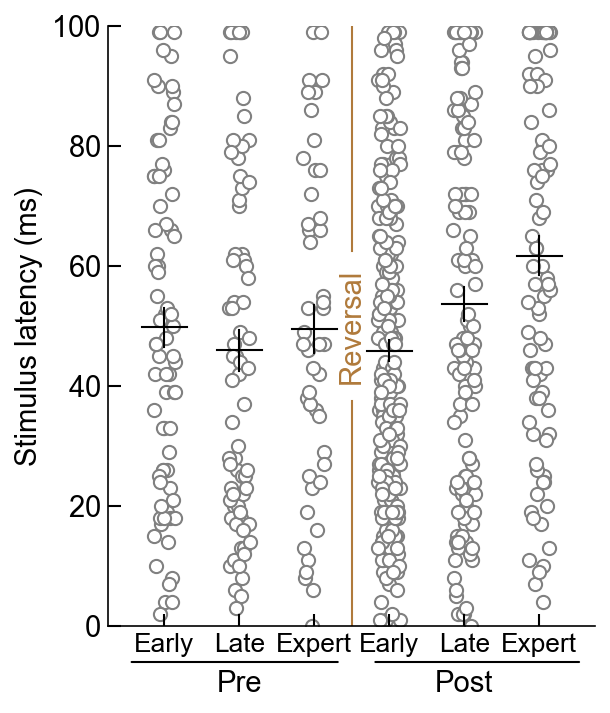

In [61]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
width = 0.3
################################################################################################################

#Plot figure
data = [AC_peaklatency_preearly,AC_peaklatency_prelate,AC_peaklatency_preexpert,AC_peaklatency_postearly,AC_peaklatency_postlate,AC_peaklatency_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Stimulus latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\AC stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

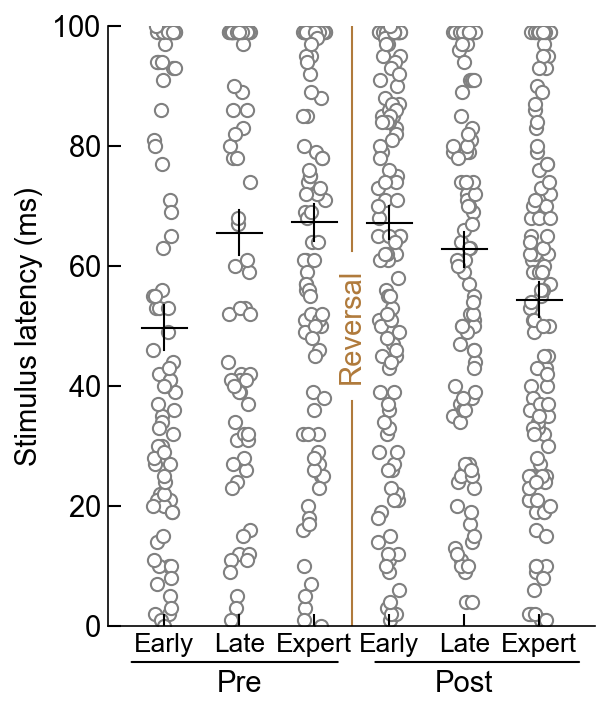

In [62]:
#M2
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
################################################################################################################

#Plot figure
data = [M2_peaklatency_preearly,M2_peaklatency_prelate,M2_peaklatency_preexpert,M2_peaklatency_postearly,M2_peaklatency_postlate,M2_peaklatency_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Stimulus latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\M2 stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

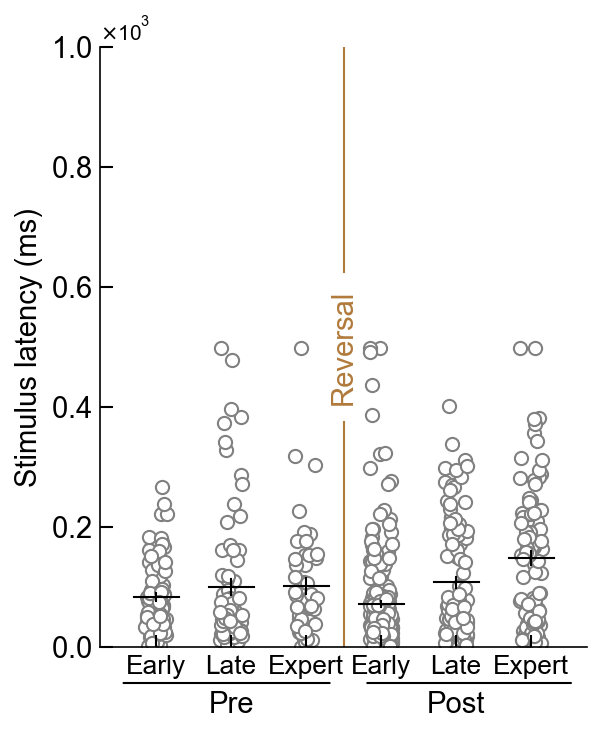

In [62]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
################################################################################################################

#Plot figure
data = [AC_peaklatency_pre_early,AC_peaklatency_pre_late,AC_peaklatency_pre_expert,AC_peaklatency_post_early,AC_peaklatency_post_late,AC_peaklatency_post_expert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,1000])
#ax.set_yticks([40,50,60.100])
#ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('Stimulus latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\AC stimulus onset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

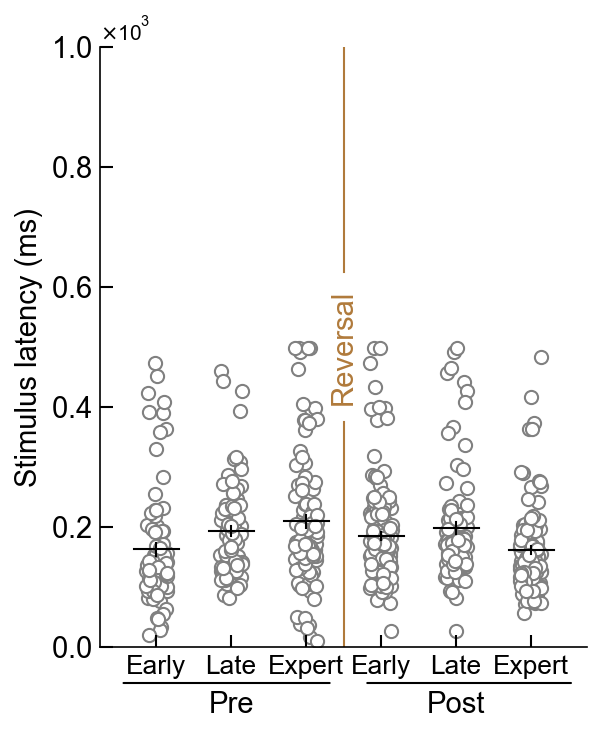

In [63]:
#M2
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
################################################################################################################

#Plot figure
data = [M2_peaklatency_pre_early,M2_peaklatency_pre_late,M2_peaklatency_pre_expert,M2_peaklatency_post_early,M2_peaklatency_post_late,M2_peaklatency_post_expert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white')
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,1000])
#ax.set_yticks([40,50,60.100])
#ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('Stimulus latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\AC stimulus onset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [63]:
M2Data = SimpleNamespace()
M2Data.preearly = M2_peaklatency_preearly
M2Data.prelate = M2_peaklatency_prelate
M2Data.preexpert = M2_peaklatency_preexpert
M2Data.postearly = M2_peaklatency_postearly
M2Data.postlate = M2_peaklatency_postlate
M2Data.postexpert = M2_peaklatency_postexpert
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data)

            Source             SS     DF           MS         F     p-unc  \
0            phase   11934.816387    3.0  3978.272129  3.965330  0.008045   
1          context       0.010890    1.0     0.010890  0.000011  0.997372   
2  phase * context   15205.359265    3.0  5068.453088  5.051965  0.001798   
3         Residual  793581.629367  791.0  1003.263754       NaN       NaN   

            np2  
0  1.481635e-02  
1  1.372199e-08  
2  1.880020e-02  
3           NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.039000  0.078000  0.274782
8     post-late  baseline  experimental  0.192761  0.257015  0.142132
9    pre-expert  baseline  experimental  0.984897  0.984897 -0.055505
10     pre-late  baseline  experimental  0.002517  0.010067 -0.467409
key preearly has 80 non-nan elements
key prelate has 81 non-nan elements
key preexpert has 100 non-nan elements
key postearly has 132 non-nan elements
key postlate has 106 n

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,22594.0,two-sided,0.013494,0.038326,fdr_bh,-0.219397
1,phase,-,post-expert,pre-expert,False,False,16567.5,two-sided,0.004396,0.026374,fdr_bh,-0.256058
2,phase,-,post-expert,pre-late,False,False,17672.0,two-sided,0.968174,0.968174,fdr_bh,0.025465
3,phase,-,post-late,pre-expert,False,False,20624.5,two-sided,0.451000,0.541200,fdr_bh,-0.039569
4,phase,-,post-late,pre-late,False,False,21276.5,two-sided,0.058815,0.088223,fdr_bh,0.233515
5,phase,-,pre-expert,pre-late,False,False,16677.5,two-sided,0.019163,0.038326,fdr_bh,0.265574
6,context,-,baseline,experimental,False,False,80203.0,two-sided,0.900968,NaN,NaN,0.002427
7,phase * context,post-expert,baseline,experimental,False,False,6954.0,two-sided,0.039000,0.078000,fdr_bh,0.274782
8,phase * context,post-late,baseline,experimental,False,False,7678.5,two-sided,0.192761,0.257015,fdr_bh,0.142132
9,phase * context,pre-expert,baseline,experimental,False,False,4043.0,two-sided,0.984897,0.984897,fdr_bh,-0.055505


In [64]:
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

In [65]:
ACData = SimpleNamespace()
ACData.preearly = AC_peaklatency_preearly
ACData.prelate = AC_peaklatency_prelate
ACData.preexpert = AC_peaklatency_preexpert
ACData.postearly = AC_peaklatency_postearly
ACData.postlate = AC_peaklatency_postlate
ACData.postexpert = AC_peaklatency_postexpert
ilep.nonparametricIndependentStatsCompareToPrevious(ACData)

            Source             SS     DF           MS         F     p-unc  \
0            phase   12389.560901    3.0  4129.853634  4.801368  0.002537   
1          context    5146.623795    1.0  5146.623795  5.983465  0.014647   
2  phase * context    4062.998724    3.0  1354.332908  1.574547  0.194054   
3         Residual  713056.978509  829.0   860.141108       NaN       NaN   

        np2  
0  0.017079  
1  0.007166  
2  0.005666  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.063162  0.126324 -0.256815
8     post-late  baseline  experimental  0.037954  0.126324 -0.272358
9    pre-expert  baseline  experimental  0.430760  0.430760 -0.123315
10     pre-late  baseline  experimental  0.378601  0.430760  0.132568
key preearly has 75 non-nan elements
key prelate has 73 non-nan elements
key preexpert has 47 non-nan elements
key postearly has 227 non-nan elements
key postlate has 127 non-nan elements
key p

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,43915.0,two-sided,0.002041,0.012244,fdr_bh,0.277964
1,phase,-,post-expert,pre-expert,False,False,15193.0,two-sided,0.006910,0.013819,fdr_bh,0.315235
2,phase,-,post-expert,pre-late,False,False,18594.5,two-sided,0.006232,0.013819,fdr_bh,0.298397
3,phase,-,post-late,pre-expert,False,False,21856.5,two-sided,0.634657,0.876798,fdr_bh,0.047617
4,phase,-,post-late,pre-late,False,False,26706.5,two-sided,0.730665,0.876798,fdr_bh,0.028495
5,phase,-,pre-expert,pre-late,False,False,8798.5,two-sided,0.897823,0.897823,fdr_bh,-0.019007
6,context,-,baseline,experimental,False,False,76238.5,two-sided,0.021974,NaN,NaN,-0.171314
7,phase * context,post-expert,baseline,experimental,False,False,4756.5,two-sided,0.063162,0.126324,fdr_bh,-0.256815
8,phase * context,post-late,baseline,experimental,False,False,12498.0,two-sided,0.037954,0.126324,fdr_bh,-0.272358
9,phase * context,pre-expert,baseline,experimental,False,False,1568.5,two-sided,0.430760,0.430760,fdr_bh,-0.123315


### Offset latency fig

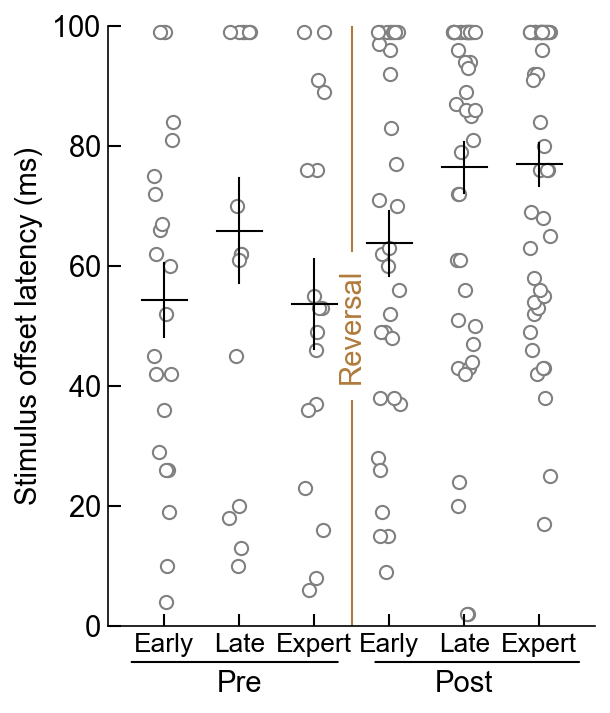

In [67]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
################################################################################################################

#Plot figure
data = [AC_peaklatency_offset_preearly-100,AC_peaklatency_offset_prelate-100,AC_peaklatency_offset_preexpert-100,AC_peaklatency_offset_postearly-100,AC_peaklatency_offset_postlate-100,AC_peaklatency_offset_postexpert-100]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white', clip_on = False)
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Stimulus offset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\AC stimulus offset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

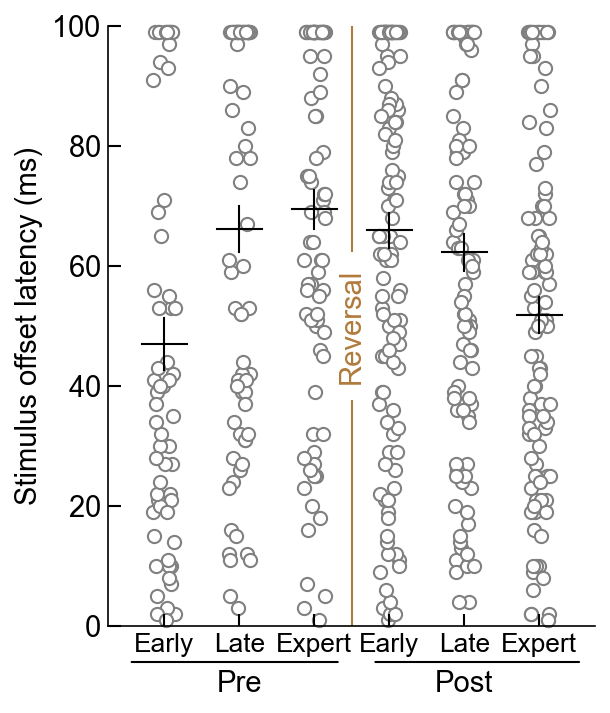

In [70]:
#M2
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0
################################################################################################################

#Plot figure
data = [M2_peaklatency_offset_preearly-100,M2_peaklatency_offset_prelate-100,M2_peaklatency_offset_preexpert-100,M2_peaklatency_offset_postearly-100,M2_peaklatency_offset_postlate-100,M2_peaklatency_offset_postexpert-100]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white', clip_on = False)
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([0,100,200,300,400,500])
#ax.set_yticklabels(['0','100','200','300','400','500'])
ylab = ax.set_ylabel('Stimulus offset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\M2 stimulus offset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [71]:
ACData = SimpleNamespace()
ACData.preearly = AC_peaklatency_offset_preearly-100
ACData.prelate = AC_peaklatency_offset_prelate-100
ACData.preexpert = AC_peaklatency_offset_preexpert-100
ACData.postearly = AC_peaklatency_offset_postearly-100
ACData.postlate = AC_peaklatency_offset_postlate-100
ACData.postexpert = AC_peaklatency_offset_postexpert-100
ilep.nonparametricIndependentStatsCompareToPrevious(ACData)

            Source             SS     DF           MS         F     p-unc  \
0            phase   11902.865409    3.0  3967.621803  4.661394  0.003493   
1          context    1094.058361    1.0  1094.058361  1.285364  0.258079   
2  phase * context    4385.659381    3.0  1461.886460  1.717510  0.164135   
3         Residual  196619.432013  231.0   851.166372       NaN       NaN   

        np2  
0  0.057082  
1  0.005534  
2  0.021819  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.967217  0.967217 -0.017498
8     post-late  baseline  experimental  0.064305  0.257220 -0.427771
9    pre-expert  baseline  experimental  0.196313  0.359208  0.362136
10     pre-late  baseline  experimental  0.269406  0.359208 -0.358128
key preearly has 22 non-nan elements
key prelate has 16 non-nan elements
key preexpert has 17 non-nan elements
key postearly has 32 non-nan elements
key postlate has 45 non-nan elements
key pos

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,3863.0,two-sided,0.240276,0.288332,fdr_bh,0.195766
1,phase,-,post-expert,pre-expert,False,False,1931.5,two-sided,0.012665,0.037994,fdr_bh,0.603278
2,phase,-,post-expert,pre-late,False,False,2252.0,two-sided,0.005649,0.033895,fdr_bh,0.622429
3,phase,-,post-late,pre-expert,False,False,1509.0,two-sided,0.114542,0.171812,fdr_bh,0.375504
4,phase,-,post-late,pre-late,False,False,1754.5,two-sided,0.078818,0.157636,fdr_bh,0.392759
5,phase,-,pre-expert,pre-late,False,False,628.0,two-sided,0.995355,0.995355,fdr_bh,0.011985
6,context,-,baseline,experimental,False,False,6485.0,two-sided,0.217930,NaN,NaN,-0.163558
7,phase * context,post-expert,baseline,experimental,False,False,1040.5,two-sided,0.967217,0.967217,fdr_bh,-0.017498
8,phase * context,post-late,baseline,experimental,False,False,544.0,two-sided,0.064305,0.257220,fdr_bh,-0.427771
9,phase * context,pre-expert,baseline,experimental,False,False,172.0,two-sided,0.196313,0.359208,fdr_bh,0.362136


In [72]:
M2Data = SimpleNamespace()
M2Data.preearly = M2_peaklatency_offset_preearly-100
M2Data.prelate = M2_peaklatency_offset_prelate-100
M2Data.preexpert = M2_peaklatency_offset_preexpert-100
M2Data.postearly = M2_peaklatency_offset_postearly-100
M2Data.postlate = M2_peaklatency_offset_postlate-100
M2Data.postexpert = M2_peaklatency_offset_postexpert-100
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data)

            Source             SS     DF           MS         F     p-unc  \
0            phase   14511.431486    3.0  4837.143829  4.840014  0.002425   
1          context      14.331835    1.0    14.331835  0.014340  0.904714   
2  phase * context   19069.597174    3.0  6356.532391  6.360305  0.000294   
3         Residual  716574.750039  717.0   999.406904       NaN       NaN   

        np2  
0  0.019849  
1  0.000020  
2  0.025922  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.015501  0.031002  0.338205
8     post-late  baseline  experimental  0.299612  0.399483  0.116535
9    pre-expert  baseline  experimental  0.669032  0.669032 -0.103616
10     pre-late  baseline  experimental  0.001013  0.004051 -0.564886
key preearly has 62 non-nan elements
key prelate has 75 non-nan elements
key preexpert has 85 non-nan elements
key postearly has 123 non-nan elements
key postlate has 101 non-nan elements
key p

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,19700.0,two-sided,0.013243,0.026486,fdr_bh,-0.232562
1,phase,-,post-expert,pre-expert,False,False,12879.0,two-sided,0.000486,0.002916,fdr_bh,-0.347261
2,phase,-,post-expert,pre-late,False,False,13789.5,two-sided,0.835602,0.835602,fdr_bh,-0.013564
3,phase,-,post-late,pre-expert,False,False,16379.5,two-sided,0.144670,0.173604,fdr_bh,-0.115336
4,phase,-,post-late,pre-late,False,False,16820.5,two-sided,0.120859,0.173604,fdr_bh,0.207457
5,phase,-,pre-expert,pre-late,False,False,12828.0,two-sided,0.009714,0.026486,fdr_bh,0.313067
6,context,-,baseline,experimental,False,False,65626.0,two-sided,0.978409,NaN,NaN,-0.003656
7,phase * context,post-expert,baseline,experimental,False,False,6219.0,two-sided,0.015501,0.031002,fdr_bh,0.338205
8,phase * context,post-late,baseline,experimental,False,False,6708.0,two-sided,0.299612,0.399483,fdr_bh,0.116535
9,phase * context,pre-expert,baseline,experimental,False,False,3065.5,two-sided,0.669032,0.669032,fdr_bh,-0.103616


In [100]:
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

### Onset latency fig

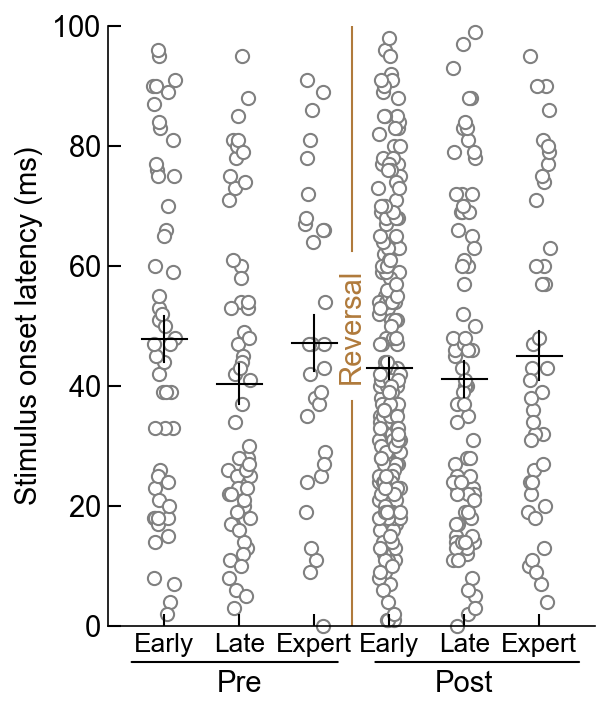

In [75]:
#AC
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
################################################################################################################

#Plot figure
data = [AC_peaklatency_onset_preearly,AC_peaklatency_onset_prelate,AC_peaklatency_onset_preexpert,AC_peaklatency_onset_postearly,AC_peaklatency_onset_postlate,AC_peaklatency_onset_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white',clip_on = False)
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([40,50,60.100])
#ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('Stimulus onset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\AC stimulus onset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

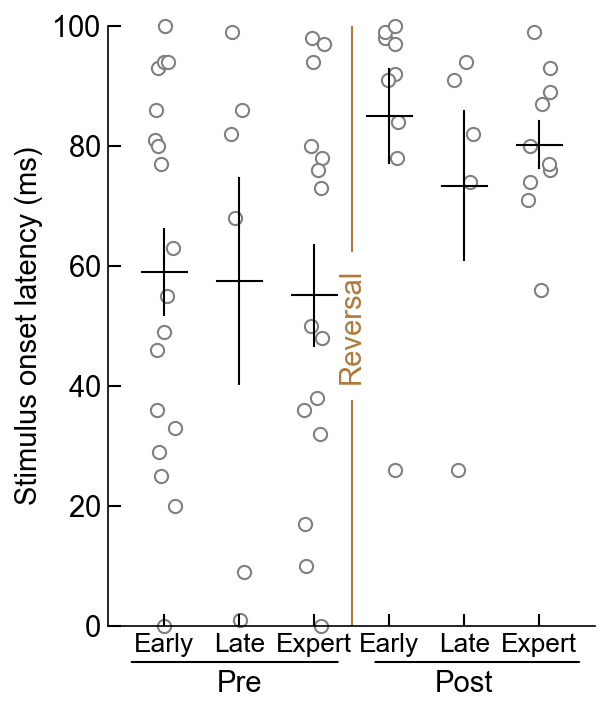

In [76]:
#M2
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)

switch_offset = 0
################################################################################################################

#Plot figure
data = [M2_peaklatency_onset_preearly,M2_peaklatency_onset_prelate,M2_peaklatency_onset_preexpert,M2_peaklatency_onset_postearly,M2_peaklatency_onset_postlate,M2_peaklatency_onset_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#Plot summary
for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    
    mean = np.mean(Y)
    SEM = sem(Y)

    ax.scatter(X-switch_offset,Y,s=40,edgecolor=CR_COLOR,color='white',clip_on = False)
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)



################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,100])
#ax.set_yticks([40,50,60.100])
#ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('Stimulus onset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\M2 stimulus onset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


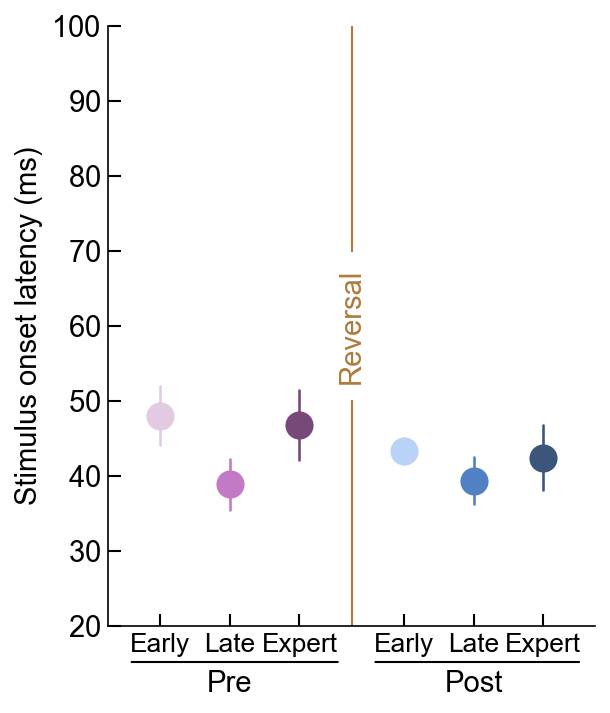

In [147]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [AC_peaklatency_onset_preearly,AC_peaklatency_onset_prelate,AC_peaklatency_onset_preexpert,AC_peaklatency_onset_postearly,AC_peaklatency_onset_postlate,AC_peaklatency_onset_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([20,100])
#ax.set_yticks([40,50,60.100])
#ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('Stimulus onset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\AC stimulus onset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


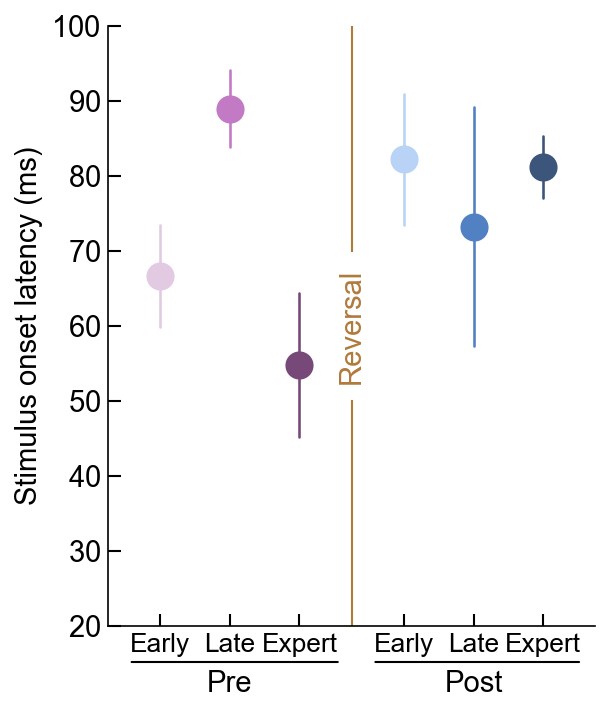

In [148]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

#data = [M2_peaklatency_pre_early,M2_peaklatency_pre_late,M2_peaklatency_pre_expert,M2_peaklatency_post_early,M2_peaklatency_post_late,M2_peaklatency_post_expert]
data = [M2_peaklatency_onset_preearly,M2_peaklatency_onset_prelate,M2_peaklatency_onset_preexpert,M2_peaklatency_onset_postearly,M2_peaklatency_onset_postlate,M2_peaklatency_onset_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([20,100])
#ax.set_yticks([0,40,80,120])
#ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('Stimulus onset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\M2 stimulus onset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [77]:
ACData = SimpleNamespace()
ACData.preearly = AC_peaklatency_onset_preearly
ACData.prelate = AC_peaklatency_onset_prelate
ACData.preexpert = AC_peaklatency_onset_preexpert
ACData.postearly = AC_peaklatency_onset_postearly
ACData.postlate = AC_peaklatency_onset_postlate
ACData.postexpert = AC_peaklatency_onset_postexpert
ilep.nonparametricIndependentStatsCompareToPrevious(ACData)

            Source             SS     DF           MS         F     p-unc  \
0            phase     224.035392    3.0    74.678464  0.112371  0.952867   
1          context      36.310674    1.0    36.310674  0.054638  0.815262   
2  phase * context    3066.408730    3.0  1022.136243  1.538036  0.203538   
3         Residual  392097.680007  590.0   664.572339       NaN       NaN   

        np2  
0  0.000571  
1  0.000093  
2  0.007760  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.413076  0.413076 -0.145633
8     post-late  baseline  experimental  0.385147  0.413076  0.072785
9    pre-expert  baseline  experimental  0.217745  0.413076 -0.264528
10     pre-late  baseline  experimental  0.161500  0.413076  0.281526
key preearly has 53 non-nan elements
key prelate has 57 non-nan elements
key preexpert has 30 non-nan elements
key postearly has 195 non-nan elements
key postlate has 82 non-nan elements
key po

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,16963.5,two-sided,0.844770,0.959008,fdr_bh,0.001912
1,phase,-,post-expert,pre-expert,False,False,5305.0,two-sided,0.839332,0.959008,fdr_bh,-0.007528
2,phase,-,post-expert,pre-late,False,False,6558.5,two-sided,0.613516,0.959008,fdr_bh,-0.055284
3,phase,-,post-late,pre-expert,False,False,12005.0,two-sided,0.959008,0.959008,fdr_bh,-0.009847
4,phase,-,post-late,pre-late,False,False,14884.0,two-sided,0.723968,0.959008,fdr_bh,-0.060113
5,phase,-,pre-expert,pre-late,False,False,4680.5,two-sided,0.793506,0.959008,fdr_bh,-0.048834
6,context,-,baseline,experimental,False,False,41360.5,two-sided,0.792329,NaN,NaN,0.011847
7,phase * context,post-expert,baseline,experimental,False,False,1566.5,two-sided,0.413076,0.413076,fdr_bh,-0.145633
8,phase * context,post-late,baseline,experimental,False,False,8524.0,two-sided,0.385147,0.413076,fdr_bh,0.072785
9,phase * context,pre-expert,baseline,experimental,False,False,716.5,two-sided,0.217745,0.413076,fdr_bh,-0.264528


In [78]:
M2Data = SimpleNamespace()
M2Data.preearly = M2_peaklatency_onset_preearly
M2Data.prelate = M2_peaklatency_onset_prelate
M2Data.preexpert = M2_peaklatency_onset_preexpert
M2Data.postearly = M2_peaklatency_onset_postearly
M2Data.postlate = M2_peaklatency_onset_postlate
M2Data.postexpert = M2_peaklatency_onset_postexpert
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data)

            Source            SS    DF           MS         F     p-unc  \
0            phase   8733.306357   3.0  2911.102119  3.199776  0.028908   
1          context     63.737393   1.0    63.737393  0.070058  0.792077   
2  phase * context    556.303877   3.0   185.434626  0.203823  0.893397   
3         Residual  60045.677778  66.0   909.782997       NaN       NaN   

        np2  
0  0.126976  
1  0.001060  
2  0.009180  
3       NaN  

          phase         A             B     p-unc   p-corr    hedges
7   post-expert  baseline  experimental  1.000000  1.00000 -0.346587
8     post-late  baseline  experimental  0.181460  0.72584  0.437155
9    pre-expert  baseline  experimental  0.790985  1.00000  0.064480
10     pre-late  baseline  experimental  0.946824  1.00000  0.041691
key preearly has 18 non-nan elements
key prelate has 6 non-nan elements
key preexpert has 15 non-nan elements
key postearly has 9 non-nan elements
key postlate has 5 non-nan elements
key postexpert has 10 non

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,74.5,two-sided,0.189610,0.227532,fdr_bh,-0.132476
1,phase,-,post-expert,pre-expert,False,False,211.5,two-sided,0.085917,0.171835,fdr_bh,0.751127
2,phase,-,post-expert,pre-late,False,False,232.5,two-sided,0.133111,0.199666,fdr_bh,0.674568
3,phase,-,post-late,pre-expert,False,False,215.0,two-sided,0.022959,0.102156,fdr_bh,0.792766
4,phase,-,post-late,pre-late,False,False,238.5,two-sided,0.034052,0.102156,fdr_bh,0.726150
5,phase,-,pre-expert,pre-late,False,False,240.0,two-sided,0.793497,0.793497,fdr_bh,-0.081361
6,context,-,baseline,experimental,False,False,742.0,two-sided,0.533823,NaN,NaN,0.056177
7,phase * context,post-expert,baseline,experimental,False,False,25.5,two-sided,1.000000,1.000000,fdr_bh,-0.346587
8,phase * context,post-late,baseline,experimental,False,False,33.0,two-sided,0.181460,0.725840,fdr_bh,0.437155
9,phase * context,pre-expert,baseline,experimental,False,False,49.0,two-sided,0.790985,1.000000,fdr_bh,0.064480


### Percentage fig

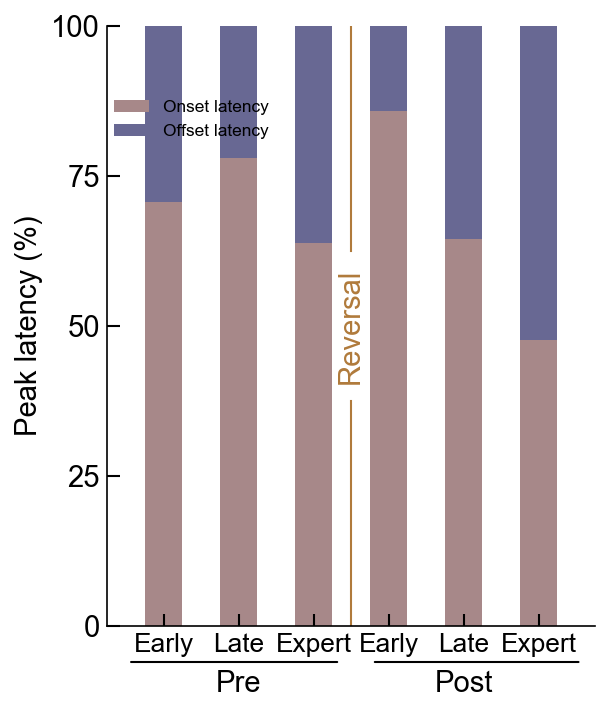

In [79]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0
################################################################################################################

#Plot figure
labels = ['Early','Late','Expert','Early','Late','Expert']

onset = [AC_preearly_per_onset,AC_prelate_per_onset,AC_preexpert_per_onset,AC_postearly_per_onset,AC_postlate_per_onset,AC_postexpert_per_onset]
offset = [100-AC_preearly_per_onset,100-AC_prelate_per_onset,100-AC_preexpert_per_onset,100-AC_postearly_per_onset,100-AC_postlate_per_onset,100-AC_postexpert_per_onset]

ax.bar(range(len(labels)),onset,label = 'Onset latency',width = 0.5, color='#A78889')
ax.bar(range(len(labels)),offset, bottom = onset, label = 'Offset latency',width = 0.5,  color='#686893')
    
################################################################################################################


ax.set_ylim([0,100])
ax.set_yticks([0,25,50,75,100])
ax.set_yticklabels(['0','25','50','75','100'])
ylab = ax.set_ylabel('Peak latency (%)')
ax.legend(frameon=False,loc=(0,0.8))

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\AC stimulus latency percentage.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

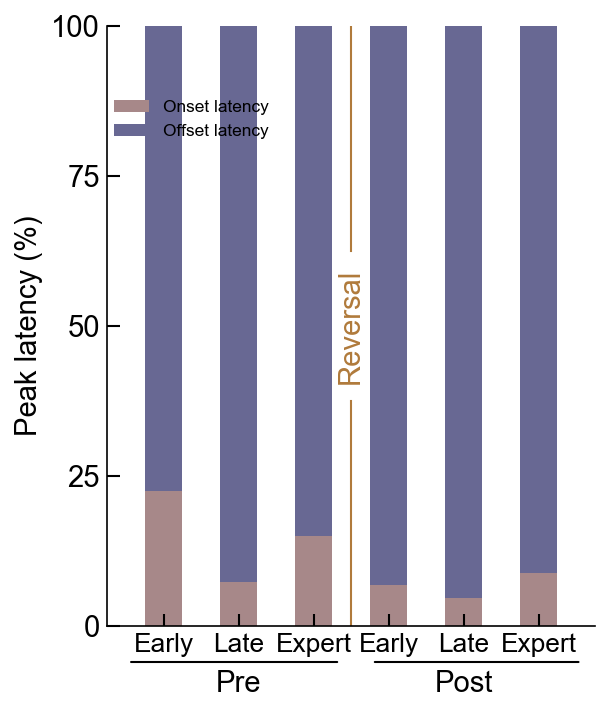

In [80]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0
################################################################################################################

#Plot figure
labels = ['Early','Late','Expert','Early','Late','Expert']

onset = [M2_preearly_per_onset,M2_prelate_per_onset,M2_preexpert_per_onset,M2_postearly_per_onset,M2_postlate_per_onset,M2_postexpert_per_onset]
offset = [100-M2_preearly_per_onset,100-M2_prelate_per_onset,100-M2_preexpert_per_onset,100-M2_postearly_per_onset,100-M2_postlate_per_onset,100-M2_postexpert_per_onset]

ax.bar(range(len(labels)),onset,label = 'Onset latency',width = 0.5, color='#A78889')
ax.bar(range(len(labels)),offset, bottom = onset, label = 'Offset latency',width = 0.5,  color='#686893')
    
################################################################################################################


ax.set_ylim([0,100])
ax.set_yticks([0,25,50,75,100])
ax.set_yticklabels(['0','25','50','75','100'])
ylab = ax.set_ylabel('Peak latency (%)')
ax.legend(frameon=False,loc=(0,0.8))

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Multi-region\\Peak_latency\\Stimulus\\M2 stimulus latency percentage.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

### old Test

In [26]:
def calculateStimulusLatency(sessionfile,clust):
    bw_scott_factor = 3
    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
 
    mn = AC_FRmod_baseline_median 
    spread = 2.5
    FRmod_color = NCR_CR_cmap( (FRmod-(mn-spread/2))/ (spread) )
    color_to_use = FRmod_color
    
    ##################
    allConditions = ilep.getAllConditions(sessionfile,clust)
    trialsToPlot = allConditions['all_trials'].trials

    tone_times = sessionfile.trials.starts
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    
    for trial in trialsToPlot:

        #Need to get spike times for each trail...
        starttime = tone_times[trial]-0.3*sessionfile.meta.fs #0.25
        endtime = tone_times[trial]+1.55*sessionfile.meta.fs #1.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes = this_trial_spikes - tone_times[trial]
        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs

        trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    
    #Plot Raster
    for idx,trial in enumerate(trialsToPlot):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    #ax1.set_xlim([-250,1500])
    ax1.fill_betweenx(range(len(trialsToPlot)), 0, 100, alpha=0.3, color=FRmod_color, lw=0,) #shading stim
    
    #Plot PSTH
    starttime = -250-50 #-350
    endtime = 1500+50 #1550
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1900)
    #numSplits=10
    numSplits = min(10,len(trialSpikes))
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)
    
    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)
    
    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color='k',lw=2,linestyle='-') #zorder = 10 line of tone

    
    ax2.set_xlim([-250,1500])
    ax2.set_xticks([0,500,1000,1500])
    ax2.set_xticklabels(['0','0.5','1','1.5'],size=12)
    ax2.set_xlabel('Time (s)',size=12)
    
    ######
    baseline_FR = sessionfile.responsiveness[clust]['all_trials'].FRbaseline

    diff_from_baseline = np.abs(avg_FR[350:1350] - baseline_FR)
    
    peak = np.max(diff_from_baseline) #len=1000
    peak_time = np.argmax(diff_from_baseline) #ms
    
    print(peak_time)
    
    FRmod = sessionfile.responsiveness[clust]['all_trials'].FRmodulation
    
    if FRmod>=AC_FRmod_baseline_median:
        ax2.axvline(x=peak_time,color='green')
    
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Peak_latency\\Stimulus\\M2\\'+Phase+str(sessionname)+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    
    return fig,[ax1,ax2],peak_time

91
0
835
0
0
678
0


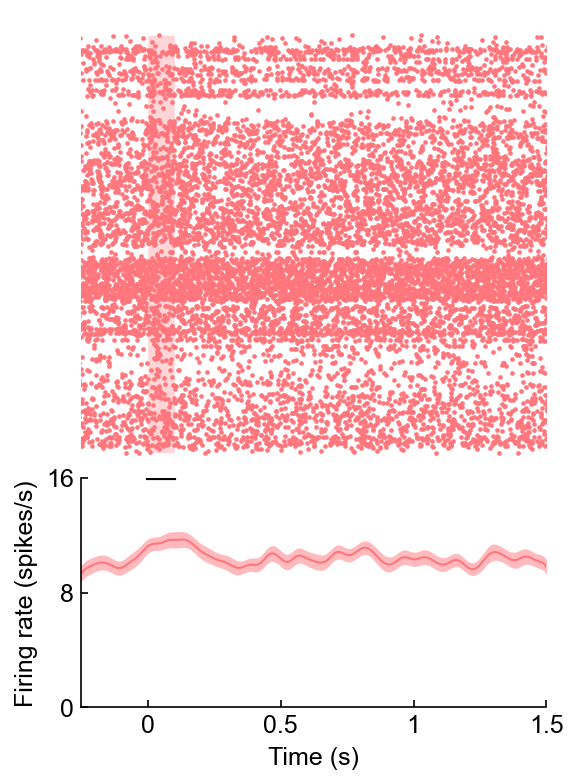

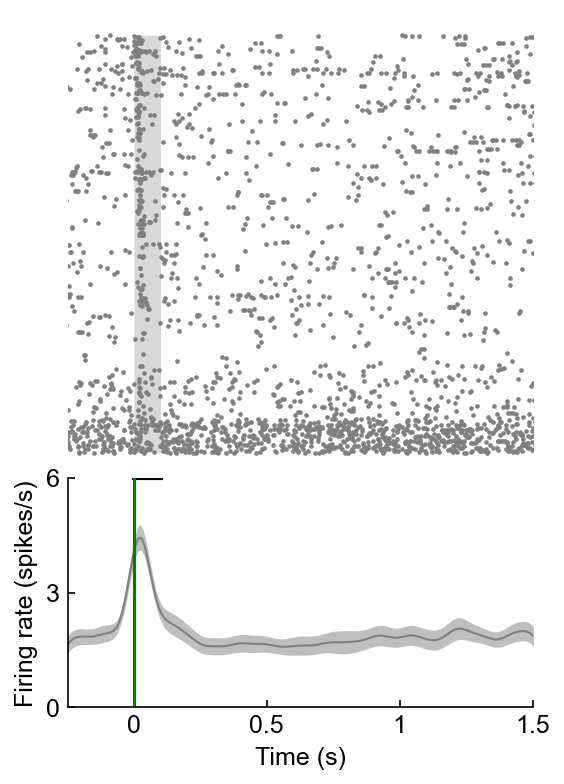

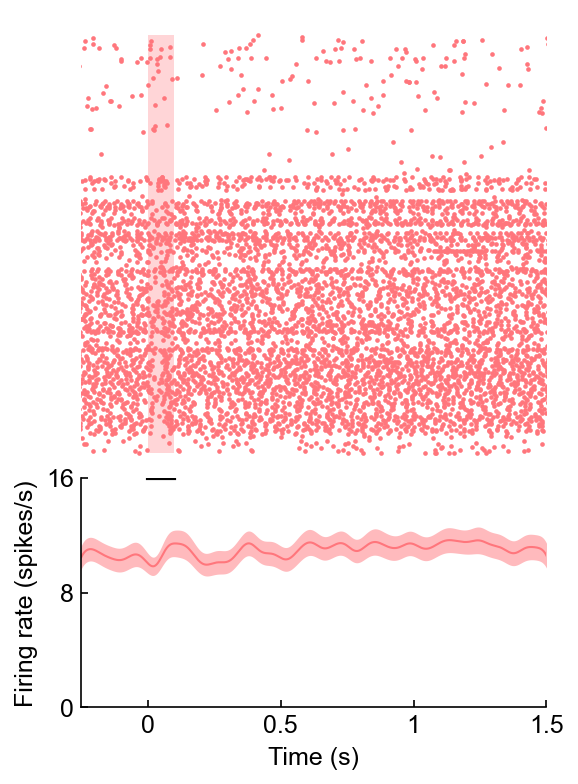

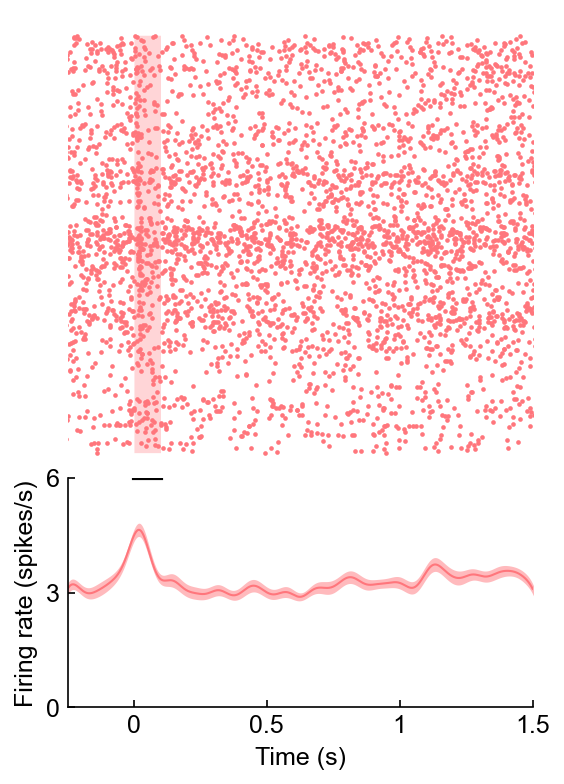

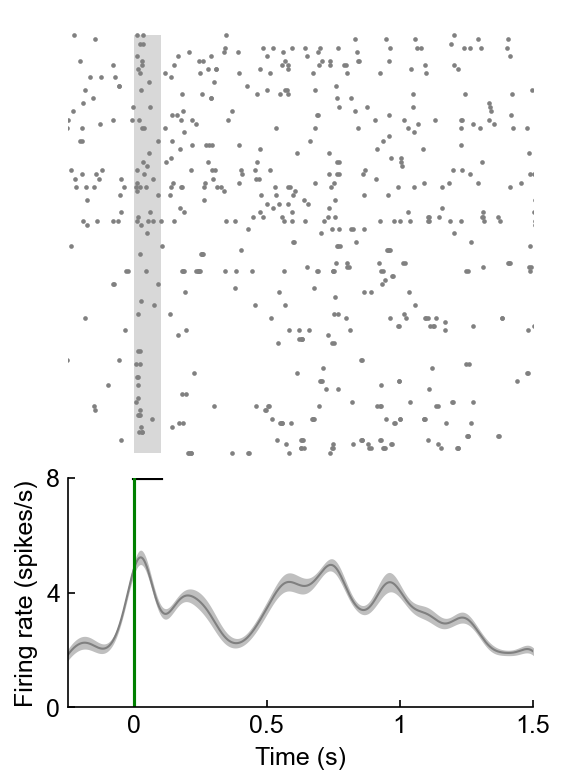

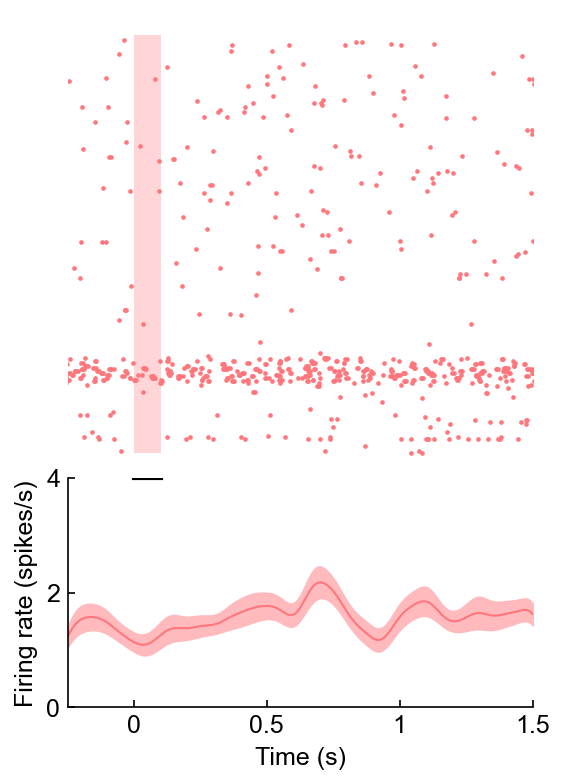

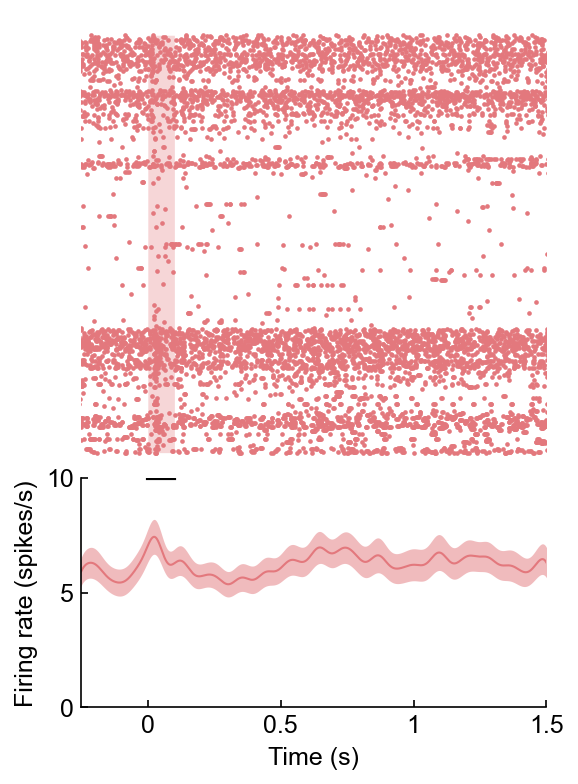

In [111]:
for clust in sessionfile.clusters.good:
    calculateStimulusLatency(sessionfile,clust)

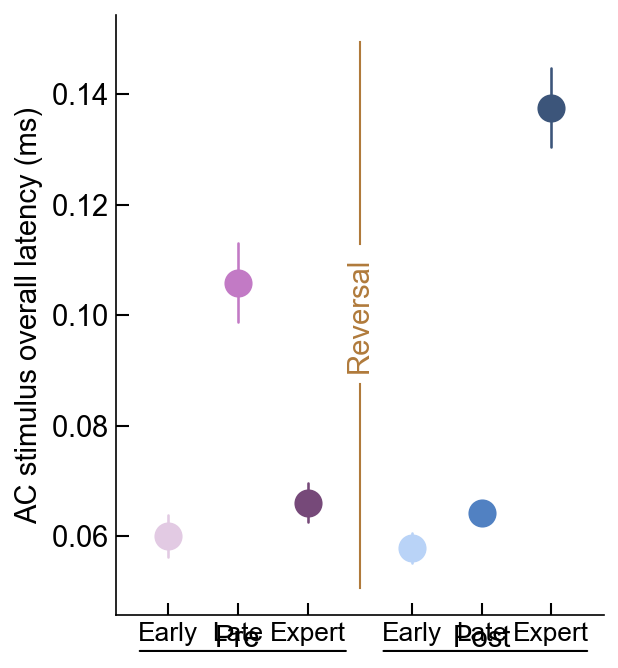

In [252]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [AC_latency_preearly_overall,AC_latency_prelate_overall,AC_latency_preexpert_overall,AC_latency_postearly_overall,AC_latency_postlate_overall,AC_latency_postexpert_overall]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

#ax.set_ylim([35,60])
#ax.set_yticks([35,40,45,50])
#ax.set_yticklabels(['35','40','45','50'])
ylab = ax.set_ylabel('AC stimulus overall latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\AC stimulus overall latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

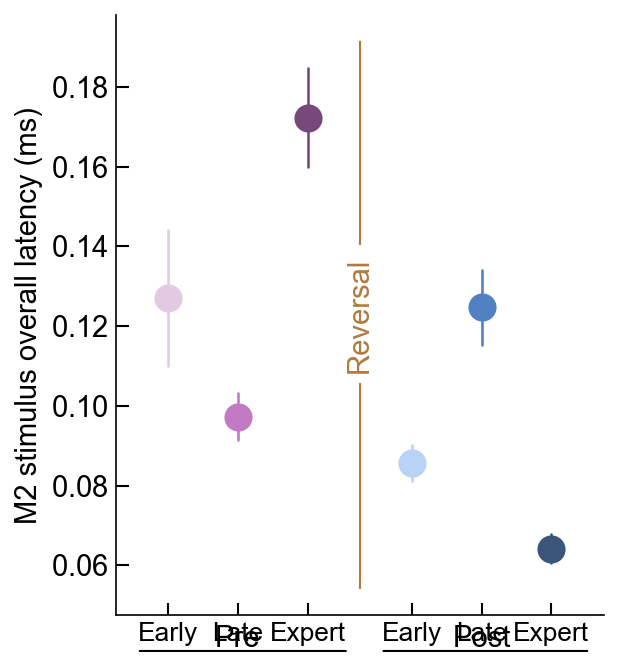

In [254]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [M2_latency_preearly_overall,M2_latency_prelate_overall,M2_latency_preexpert_overall,M2_latency_postearly_overall,M2_latency_postlate_overall,M2_latency_postexpert_overall]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

#ax.set_ylim([35,60])
#ax.set_yticks([45,50,55,60])
#ax.set_yticklabels(['45','50','55','60'])
ylab = ax.set_ylabel('M2 stimulus overall latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\M2 stimulus overall latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

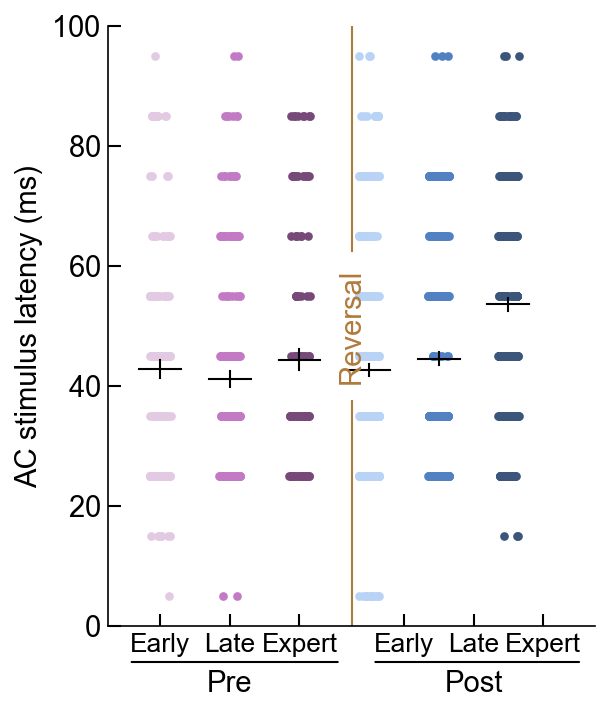

In [62]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [AC_latency_preearly_overall,AC_latency_prelate_overall,AC_latency_preexpert_overall,AC_latency_postearly_overall,AC_latency_postlate_overall,AC_latency_postexpert_overall]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']
labels = ['Early','Late','Expert','Early','Late','Expert']
numCon = len(data)

#Plot summary

sz = 35
width = 0.3

for idx,column in enumerate(data):
    Y = ilep.rmnan(column)
    X = np.random.uniform(-width/2,width/2,size=len(Y)) + idx
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color
    mean = np.mean(Y)
    SEM = sem(Y)
    
    ax.scatter(X-switch_offset,Y,s=10, ec=border_color,fc=eye_color)
        
    ax.plot([idx-switch_offset-width,idx-switch_offset+width],[mean]*2,color='k',lw=1, clip_on = False)
    ax.plot([idx-switch_offset]*2,[mean-SEM,mean+SEM],color='k',lw=1, clip_on = False)
    
################################################################################################################


ax.set_ylim([0,100])
#ax.set_yticks([35,40,45,50])
#ax.set_yticklabels(['35','40','45','50'])
ylab = ax.set_ylabel('AC stimulus latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\AC stimulus overall latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


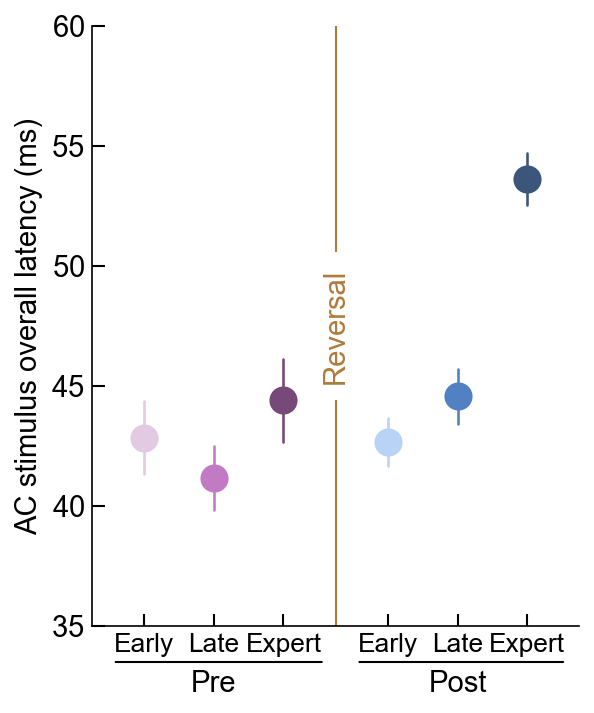

In [287]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [AC_latency_preearly_overall,AC_latency_prelate_overall,AC_latency_preexpert_overall,AC_latency_postearly_overall,AC_latency_postlate_overall,AC_latency_postexpert_overall]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([35,60])
#ax.set_yticks([35,40,45,50])
#ax.set_yticklabels(['35','40','45','50'])
ylab = ax.set_ylabel('AC stimulus overall latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\AC stimulus overall latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


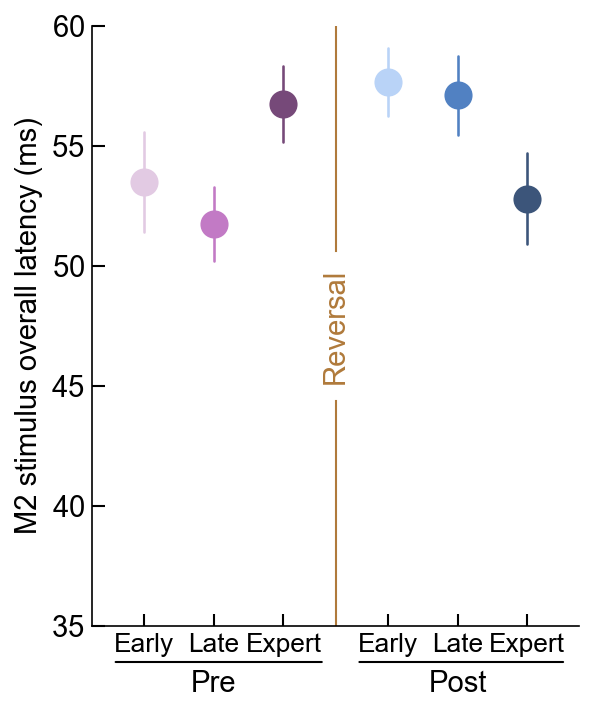

In [286]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [M2_latency_preearly_overall,M2_latency_prelate_overall,M2_latency_preexpert_overall,M2_latency_postearly_overall,M2_latency_postlate_overall,M2_latency_postexpert_overall]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([35,60])
#ax.set_yticks([45,50,55,60])
#ax.set_yticklabels(['45','50','55','60'])
ylab = ax.set_ylabel('M2 stimulus overall latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
#fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\M2 stimulus overall latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [234]:
ACData = SimpleNamespace()
ACData.preearly = AC_latency_preearly_overall
ACData.prelate = AC_latency_prelate_overall
ACData.preexpert = AC_latency_preexpert_overall
ACData.postearly = AC_latency_postearly_overall
ACData.postlate = AC_latency_postlate_overall
ACData.postexpert = AC_latency_postexpert_overall
ilep.nonparametricIndependentStatsCompareToPrevious(ACData)
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

            Source             SS      DF           MS          F  \
0            phase   15690.240625     3.0  5230.080208  14.700433   
1          context    6417.184483     1.0  6417.184483  18.037082   
2  phase * context    7133.232732     3.0  2377.744244   6.683238   
3         Residual  663524.663767  1865.0   355.777300        NaN   

          p-unc       np2  
0  1.835633e-09  0.023101  
1  2.273079e-05  0.009579  
2  1.740029e-04  0.010636  
3           NaN       NaN  

          phase         A             B         p-unc        p-corr    hedges
7   post-expert  baseline  experimental  2.187358e-09  8.749432e-09 -0.474189
8     post-late  baseline  experimental  9.024306e-01  9.024306e-01 -0.098595
9    pre-expert  baseline  experimental  1.099318e-01  2.198636e-01 -0.174750
10     pre-late  baseline  experimental  2.456873e-01  3.275831e-01  0.090721
key preearly has 148 non-nan elements
key prelate has 188 non-nan elements
key preexpert has 117 non-nan elements
key poste

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,218067.0,two-sided,2.518464e-06,5.036927e-06,fdr_bh,0.280953
1,phase,-,post-expert,pre-expert,False,False,106095.0,two-sided,1.885339e-06,5.036927e-06,fdr_bh,0.341852
2,phase,-,post-expert,pre-late,False,False,118109.0,two-sided,1.658697e-07,9.952185e-07,fdr_bh,0.369596
3,phase,-,post-late,pre-expert,False,False,102491.5,two-sided,3.433975e-01,4.120770e-01,fdr_bh,0.060194
4,phase,-,post-late,pre-late,False,False,113987.5,two-sided,2.158578e-01,3.237867e-01,fdr_bh,0.087170
5,phase,-,pre-expert,pre-late,False,False,51569.0,two-sided,8.856971e-01,8.856971e-01,fdr_bh,0.027411
6,context,-,baseline,experimental,False,False,391882.5,two-sided,7.284825e-05,NaN,NaN,-0.195426
7,phase * context,post-expert,baseline,experimental,False,False,30582.0,two-sided,2.187358e-09,8.749432e-09,fdr_bh,-0.474189
8,phase * context,post-late,baseline,experimental,False,False,51890.0,two-sided,9.024306e-01,9.024306e-01,fdr_bh,-0.098595
9,phase * context,pre-expert,baseline,experimental,False,False,9832.0,two-sided,1.099318e-01,2.198636e-01,fdr_bh,-0.174750


In [221]:
9.024306e-01<0.05

False

In [223]:
3.275831e-01<0.05

False

In [220]:
M2Data = SimpleNamespace()
M2Data.preearly = M2_latency_preearly_overall
M2Data.prelate = M2_latency_prelate_overall
M2Data.preexpert = M2_latency_preexpert_overall
M2Data.postearly = M2_latency_postearly_overall
M2Data.postlate = M2_latency_postlate_overall
M2Data.postexpert = M2_latency_postexpert_overall
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data)
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

            Source            SS      DF           MS         F     p-unc  \
0            phase  6.039821e+03     3.0  2013.273526  3.231322  0.021583   
1          context  4.955203e+01     1.0    49.552029  0.079531  0.777966   
2  phase * context  4.966846e+03     3.0  1655.615467  2.657278  0.046920   
3         Residual  1.124604e+06  1805.0   623.049478       NaN       NaN   

        np2  
0  0.005342  
1  0.000044  
2  0.004397  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.136225  0.272450  0.165281
8     post-late  baseline  experimental  0.762048  0.762048  0.021691
9    pre-expert  baseline  experimental  0.027646  0.110585 -0.216569
10     pre-late  baseline  experimental  0.582204  0.762048  0.069947
key preearly has 159 non-nan elements
key prelate has 240 non-nan elements
key preexpert has 199 non-nan elements
key postearly has 349 non-nan elements
key postlate has 204 non-nan elements
ke

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,110646.5,two-sided,0.160333,0.240499,fdr_bh,-0.099754
1,phase,-,post-expert,pre-expert,False,False,95807.5,two-sided,0.378301,0.378301,fdr_bh,0.034892
2,phase,-,post-expert,pre-late,False,False,89688.5,two-sided,0.101787,0.203575,fdr_bh,0.095595
3,phase,-,post-late,pre-expert,False,False,132202.0,two-sided,0.014517,0.043552,fdr_bh,0.139820
4,phase,-,post-late,pre-late,False,False,123382.5,two-sided,0.001596,0.009575,fdr_bh,0.198197
5,phase,-,pre-expert,pre-late,False,False,90901.0,two-sided,0.337349,0.378301,fdr_bh,0.065690
6,context,-,baseline,experimental,False,False,417871.0,two-sided,0.465316,NaN,NaN,0.036510
7,phase * context,post-expert,baseline,experimental,False,False,24080.0,two-sided,0.136225,0.272450,fdr_bh,0.165281
8,phase * context,post-late,baseline,experimental,False,False,36139.5,two-sided,0.762048,0.762048,fdr_bh,0.021691
9,phase * context,pre-expert,baseline,experimental,False,False,20999.0,two-sided,0.027646,0.110585,fdr_bh,-0.216569


In [ ]:
#AC

meta NOT subset; don't know how to subset; dropped


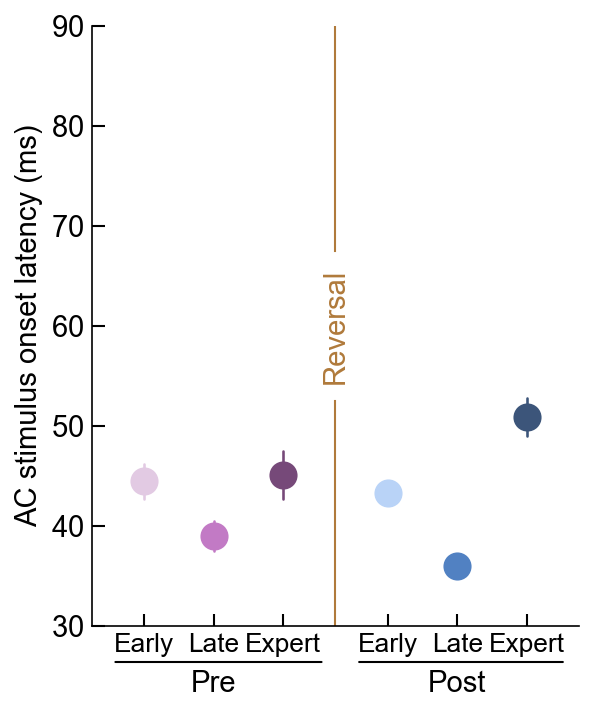

In [307]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [AC_latency_preearly_onset,AC_latency_prelate_onset,AC_latency_preexpert_onset,AC_latency_postearly_onset,AC_latency_postlate_onset,AC_latency_postexpert_onset]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([30,90])
#ax.set_yticks([35,40,45,50])
#ax.set_yticklabels(['35','40','45','50'])
ylab = ax.set_ylabel('AC stimulus onset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\AC stimulus onset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


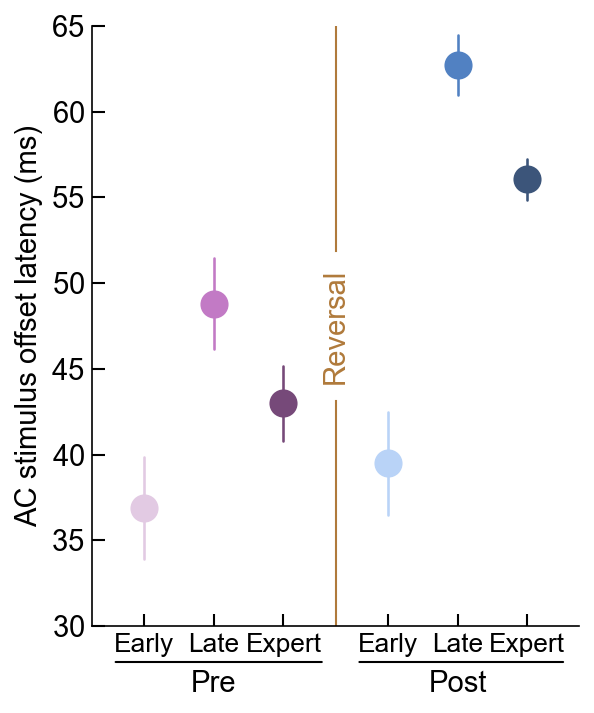

In [277]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [AC_latency_preearly_offset,AC_latency_prelate_offset,AC_latency_preexpert_offset,AC_latency_postearly_offset,AC_latency_postlate_offset,AC_latency_postexpert_offset]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([30,65])
#ax.set_yticks([0,40,80,120])
#ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('AC stimulus offset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\AC stimulus offset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [183]:
ACData_onset = SimpleNamespace()
ACData_onset.preearly = AC_latency_preearly_onset
ACData_onset.prelate = AC_latency_prelate_onset
ACData_onset.preexpert = AC_latency_preexpert_onset
ACData_onset.postearly = AC_latency_postearly_onset
ACData_onset.postlate = AC_latency_postlate_onset
ACData_onset.postexpert = AC_latency_postexpert_onset
ilep.nonparametricIndependentStatsCompareToPrevious(ACData_onset)
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

            Source             SS      DF           MS          F  \
0            phase     527.202711     3.0   175.734237   0.575211   
1          context     236.785479     1.0   236.785479   0.775044   
2  phase * context   27875.852282     3.0  9291.950761  30.414316   
3         Residual  398693.691044  1305.0   305.512407        NaN   

          p-unc       np2  
0  6.313558e-01  0.001321  
1  3.788233e-01  0.000594  
2  5.261411e-19  0.065349  
3           NaN       NaN  

          phase         A             B         p-unc        p-corr    hedges
7   post-expert  baseline  experimental  9.297731e-11  3.719093e-10 -0.843651
8     post-late  baseline  experimental  2.412868e-07  4.825735e-07  0.453583
9    pre-expert  baseline  experimental  3.904486e-02  3.904486e-02 -0.322132
10     pre-late  baseline  experimental  2.818742e-03  3.758322e-03  0.300935
key preearly has 116 non-nan elements
key prelate has 146 non-nan elements
key preexpert has 77 non-nan elements
key postea

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,83891.0,two-sided,7.052901e-01,9.198710e-01,fdr_bh,0.089094
1,phase,-,post-expert,pre-expert,False,False,38720.5,two-sided,4.861636e-01,9.198710e-01,fdr_bh,0.040579
2,phase,-,post-expert,pre-late,False,False,44220.5,two-sided,9.198710e-01,9.198710e-01,fdr_bh,0.024632
3,phase,-,post-late,pre-expert,False,False,56027.0,two-sided,6.361294e-01,9.198710e-01,fdr_bh,-0.045456
4,phase,-,post-late,pre-late,False,False,63731.0,two-sided,7.936811e-01,9.198710e-01,fdr_bh,-0.064170
5,phase,-,pre-expert,pre-late,False,False,28244.5,two-sided,5.138757e-01,9.198710e-01,fdr_bh,-0.016652
6,context,-,baseline,experimental,False,False,211441.0,two-sided,9.153879e-01,NaN,NaN,-0.048486
7,phase * context,post-expert,baseline,experimental,False,False,8054.5,two-sided,9.297731e-11,3.719093e-10,fdr_bh,-0.843651
8,phase * context,post-late,baseline,experimental,False,False,37079.0,two-sided,2.412868e-07,4.825735e-07,fdr_bh,0.453583
9,phase * context,pre-expert,baseline,experimental,False,False,4712.5,two-sided,3.904486e-02,3.904486e-02,fdr_bh,-0.322132


In [187]:
3.904486e-02<0.05

True

In [190]:
3.758322e-03 < 0.01

True

In [115]:
ACData_offset = SimpleNamespace()
ACData_offset.preearly = AC_latency_preearly_offset
ACData_offset.prelate = AC_latency_prelate_offset
ACData_offset.preexpert = AC_latency_preexpert_offset
ACData_offset.postearly = AC_latency_postearly_offset
ACData_offset.postlate = AC_latency_postlate_offset
ACData_offset.postexpert = AC_latency_postexpert_offset
ilep.nonparametricIndependentStatsCompareToPrevious(ACData_offset)

            Source             SS     DF           MS          F  \
0            phase   17379.089201    3.0  5793.029734  19.835119   
1          context    2358.550450    1.0  2358.550450   8.075589   
2  phase * context   23414.028350    3.0  7804.676117  26.722922   
3         Residual  161216.697995  552.0   292.059235        NaN   

          p-unc       np2  
0  3.187035e-12  0.097310  
1  4.652391e-03  0.014419  
2  3.764036e-16  0.126815  
3           NaN       NaN  

          phase         A             B         p-unc        p-corr    hedges
7   post-expert  baseline  experimental  1.040845e-04  2.081691e-04  0.423718
8     post-late  baseline  experimental  1.816198e-08  7.264793e-08 -1.168292
9    pre-expert  baseline  experimental  2.184400e-02  2.184400e-02  0.367381
10     pre-late  baseline  experimental  6.664987e-03  8.886649e-03 -0.690229
key preearly has 32 non-nan elements
key prelate has 42 non-nan elements
key preexpert has 40 non-nan elements
key postearly has

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,20748.5,two-sided,2.055033e-01,2.466040e-01,fdr_bh,0.256508
1,phase,-,post-expert,pre-expert,False,False,14514.0,two-sided,3.025801e-09,9.077404e-09,fdr_bh,0.792397
2,phase,-,post-expert,pre-late,False,False,13369.0,two-sided,1.135949e-09,6.815697e-09,fdr_bh,0.908494
3,phase,-,post-late,pre-expert,False,False,8068.0,two-sided,7.372404e-04,1.105861e-03,fdr_bh,0.377293
4,phase,-,post-late,pre-late,False,False,7579.0,two-sided,9.871214e-05,1.974243e-04,fdr_bh,0.473512
5,phase,-,pre-expert,pre-late,False,False,3113.5,two-sided,7.754639e-01,7.754639e-01,fdr_bh,0.137014
6,context,-,baseline,experimental,False,False,33945.0,two-sided,3.030529e-02,NaN,NaN,-0.260496
7,phase * context,post-expert,baseline,experimental,False,False,9367.0,two-sided,1.040845e-04,2.081691e-04,fdr_bh,0.423718
8,phase * context,post-late,baseline,experimental,False,False,1383.5,two-sided,1.816198e-08,7.264793e-08,fdr_bh,-1.168292
9,phase * context,pre-expert,baseline,experimental,False,False,1082.0,two-sided,2.184400e-02,2.184400e-02,fdr_bh,0.367381


In [191]:
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

In [196]:
2.081691e-04 < 0.001

True

In [198]:
2.184400e-02 < 0.05

True

In [201]:
8.886649e-03 <0.01

True

meta NOT subset; don't know how to subset; dropped


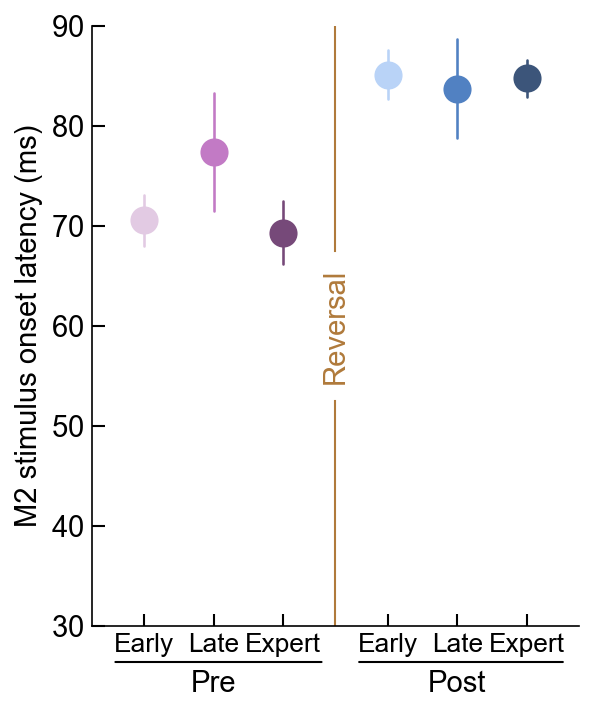

In [306]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [M2_latency_preearly_onset,M2_latency_prelate_onset,M2_latency_preexpert_onset,M2_latency_postearly_onset,M2_latency_postlate_onset,M2_latency_postexpert_onset]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([30,90])
#ax.set_yticks([0,40,80,120])
#ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('M2 stimulus onset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\M2 stimulus onset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


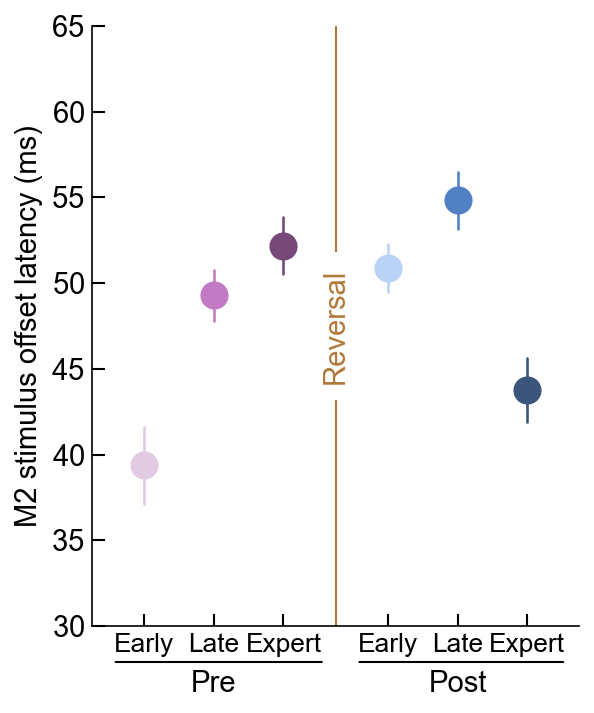

In [303]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [M2_latency_preearly_offset,M2_latency_prelate_offset,M2_latency_preexpert_offset,M2_latency_postearly_offset,M2_latency_postlate_offset,M2_latency_postexpert_offset]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([30,65])
#ax.set_yticks([35,50,65,80,95])
#ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('M2 stimulus offset latency (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\M2 stimulus offset latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

In [202]:
M2Data_onset = SimpleNamespace()
M2Data_onset.preearly = M2_latency_preearly_onset
M2Data_onset.prelate = M2_latency_prelate_onset
M2Data_onset.preexpert = M2_latency_preexpert_onset
M2Data_onset.postearly = M2_latency_postearly_onset
M2Data_onset.postlate = M2_latency_postlate_onset
M2Data_onset.postexpert = M2_latency_postexpert_onset
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data_onset)

# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

            Source             SS     DF           MS         F     p-unc  \
0            phase   12983.614468    3.0  4327.871489  9.674167  0.000004   
1          context       4.321269    1.0     4.321269  0.009659  0.921772   
2  phase * context    1763.937475    3.0   587.979158  1.314320  0.269757   
3         Residual  137788.036723  308.0   447.363756       NaN       NaN   

        np2  
0  0.086114  
1  0.000031  
2  0.012640  
3       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.719742  0.719742 -0.069805
8     post-late  baseline  experimental  0.101582  0.135443  0.068223
9    pre-expert  baseline  experimental  0.007785  0.031140  0.329923
10     pre-late  baseline  experimental  0.049592  0.099185 -0.293634
key preearly has 72 non-nan elements
key prelate has 21 non-nan elements
key preexpert has 53 non-nan elements
key postearly has 69 non-nan elements
key postlate has 16 non-nan elements
key pos

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,2234.5,two-sided,3.277122e-02,3.932546e-02,fdr_bh,-0.019415
1,phase,-,post-expert,pre-expert,False,False,3232.5,two-sided,1.293848e-04,2.587695e-04,fdr_bh,0.630759
2,phase,-,post-expert,pre-late,False,False,3939.0,two-sided,3.726162e-04,5.589242e-04,fdr_bh,0.615728
3,phase,-,post-late,pre-expert,False,False,4703.0,two-sided,1.046471e-08,6.278824e-08,fdr_bh,0.596099
4,phase,-,post-late,pre-late,False,False,5576.0,two-sided,4.058737e-07,1.217621e-06,fdr_bh,0.585489
5,phase,-,pre-expert,pre-late,False,False,3431.0,two-sided,9.750710e-01,9.750710e-01,fdr_bh,-0.020034
6,context,-,baseline,experimental,False,False,13372.5,two-sided,1.564420e-01,NaN,NaN,0.026866
7,phase * context,post-expert,baseline,experimental,False,False,406.0,two-sided,7.197421e-01,7.197421e-01,fdr_bh,-0.069805
8,phase * context,post-late,baseline,experimental,False,False,668.0,two-sided,1.015824e-01,1.354432e-01,fdr_bh,0.068223
9,phase * context,pre-expert,baseline,experimental,False,False,772.0,two-sided,7.785086e-03,3.114035e-02,fdr_bh,0.329923


In [205]:
3.114035e-02<0.05

True

In [113]:
M2Data_offset = SimpleNamespace()
M2Data_offset.preearly = M2_latency_preearly_offset
M2Data_offset.prelate = M2_latency_prelate_offset
M2Data_offset.preexpert = M2_latency_preexpert_offset
M2Data_offset.postearly = M2_latency_postearly_offset
M2Data_offset.postlate = M2_latency_postlate_offset
M2Data_offset.postexpert = M2_latency_postexpert_offset
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data_offset)

# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

            Source             SS      DF           MS          F  \
0            phase    7120.291546     3.0  2373.430515   4.685641   
1          context     304.454899     1.0   304.454899   0.601057   
2  phase * context   19268.875406     3.0  6422.958469  12.680243   
3         Residual  754227.253111  1489.0   506.532742        NaN   

          p-unc       np2  
0  2.911042e-03  0.009352  
1  4.382982e-01  0.000404  
2  3.476190e-08  0.024911  
3           NaN       NaN  

          phase         A             B     p-unc    p-corr    hedges
7   post-expert  baseline  experimental  0.000010  0.000039  0.471352
8     post-late  baseline  experimental  0.069181  0.092241 -0.169862
9    pre-expert  baseline  experimental  0.335375  0.335375 -0.135920
10     pre-late  baseline  experimental  0.000195  0.000389 -0.456289
key preearly has 87 non-nan elements
key prelate has 219 non-nan elements
key preexpert has 146 non-nan elements
key postearly has 280 non-nan elements
key postlat

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,77997.0,two-sided,0.083206,0.099848,fdr_bh,-0.122619
1,phase,-,post-expert,pre-expert,False,False,65538.5,two-sided,0.941509,0.941509,fdr_bh,-0.038311
2,phase,-,post-expert,pre-late,False,False,59781.5,two-sided,0.039440,0.069503,fdr_bh,0.133991
3,phase,-,post-late,pre-expert,False,False,92155.5,two-sided,0.046335,0.069503,fdr_bh,0.090292
4,phase,-,post-late,pre-late,False,False,83437.0,two-sided,0.000077,0.000462,fdr_bh,0.263076
5,phase,-,pre-expert,pre-late,False,False,61496.0,two-sided,0.021958,0.065875,fdr_bh,0.183428
6,context,-,baseline,experimental,False,False,281663.0,two-sided,0.821072,NaN,NaN,0.003614
7,phase * context,post-expert,baseline,experimental,False,False,20236.5,two-sided,0.000010,0.000039,fdr_bh,0.471352
8,phase * context,post-late,baseline,experimental,False,False,23769.5,two-sided,0.069181,0.092241,fdr_bh,-0.169862
9,phase * context,pre-expert,baseline,experimental,False,False,15049.0,two-sided,0.335375,0.335375,fdr_bh,-0.135920


In [208]:
0.000039 < 0.0001

True

In [209]:
0.000389 < 0.001

True

### old Latency figure

meta NOT subset; don't know how to subset; dropped


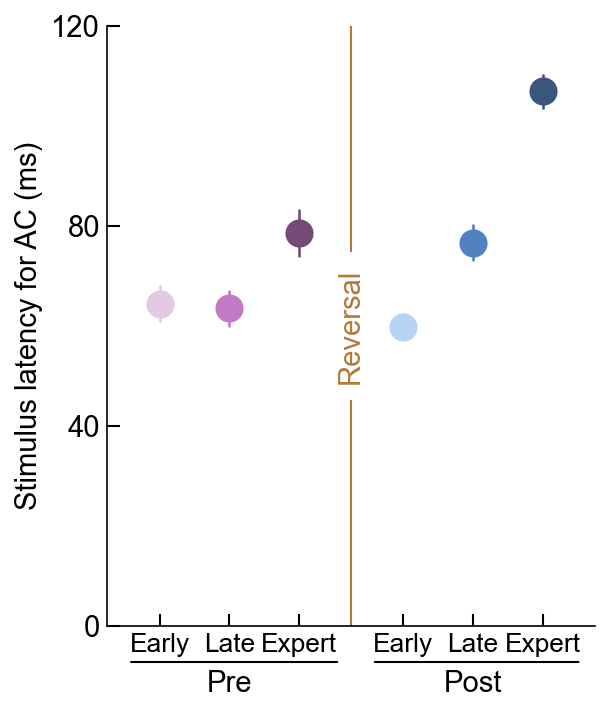

In [20]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [AC_latency_preearly,AC_latency_prelate,AC_latency_preexpert,AC_latency_postearly,AC_latency_postlate,AC_latency_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,120])
ax.set_yticks([0,40,80,120])
ax.set_yticklabels(['0','40','80','120'])
ylab = ax.set_ylabel('Stimulus latency for AC (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\AC stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

meta NOT subset; don't know how to subset; dropped


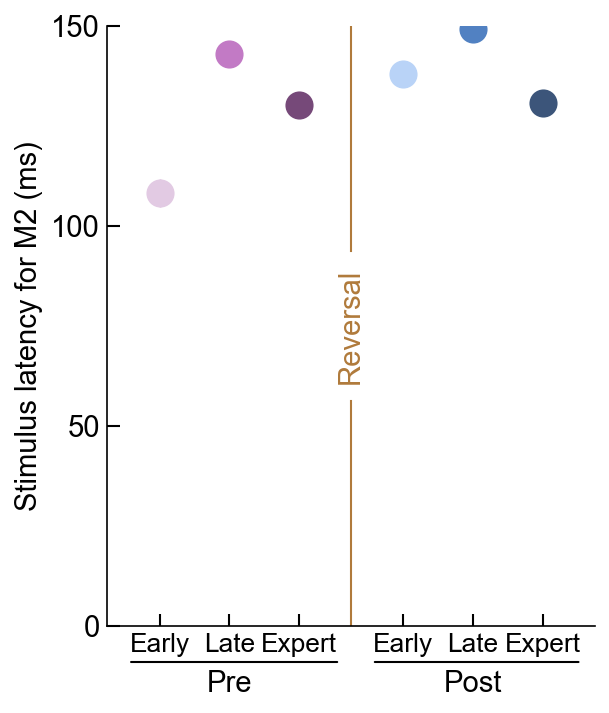

In [21]:
def add_axis_size(fig, ax_w, ax_h, left, bottom):
    fig_w, fig_h = fig.get_size_inches()
    ax = fig.add_axes([left/fig_w, bottom/fig_h, ax_w/fig_w, ax_h/fig_h])
    return ax

def make_axis_size(ax_w, ax_h, left=.3, bottom=.3, right=0, top=0):
    fig_w = (ax_w + left + right) * 1.05
    fig_h = (ax_h + bottom + top) * 1.05
    fig = plt.figure(figsize=(fig_w, fig_h))
    ax = add_axis_size(fig, ax_w, ax_h, left, bottom)
    return fig, ax

fig,ax = make_axis_size(3.25, 4, left=.3, bottom=.3, right=0, top=0)
switch_offset = 0.25
#switch_offset = 0
################################################################################################################

#Plot figure

data = [M2_latency_preearly,M2_latency_prelate,M2_latency_preexpert,M2_latency_postearly,M2_latency_postlate,M2_latency_postexpert]
PHASE_COLORS = ['#E2CAE3','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']

#numCon = len(data)
#X = [np.ones(len(l))*idx for idx,l in enumerate(data)]
#X,Y = ilep.violin(np.concatenate(X),np.concatenate(data),width=0.25)
# numunits = [len(d) for d in data]
# cumsumunits = np.cumsum(numunits)
# unitsperphase= np.concatenate([[0],cumsumunits])

#Plot summary
for idx,column in enumerate(data):
    column = ilep.rmnan(column)
    
    eye_color=PHASE_COLORS[idx]
    border_color = eye_color

    summary_size=150
    summary_width=1.25
    
    median = np.mean(column)
    Q1 = median - sem(column)
    Q3 = median + sem(column)
    
    if idx<3:
        ax.scatter([idx-switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx-switch_offset, idx-switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    else:
        ax.scatter([idx+switch_offset], [median], ec=border_color,fc=eye_color, s=summary_size,lw=summary_width, zorder=10)
        ax.plot([idx+switch_offset, idx+switch_offset], [Q1, Q3], c=border_color, lw=summary_width, zorder=9, solid_capstyle='round')
    
################################################################################################################

labels = ['Early','Late','Expert','Early','Late','Expert']

ax.set_ylim([0,150])
ax.set_yticks([0,50,100,150])
ax.set_yticklabels(['0','50','100','150'])
ylab = ax.set_ylabel('Stimulus latency for M2 (ms)')

ax.set_xlim([-0.75-switch_offset,5.75+switch_offset])
ax.set_xticks([0-switch_offset,1-switch_offset,2-switch_offset,3+switch_offset,4+switch_offset,5+switch_offset])
ax.set_xticklabels(labels)
# xlab = ax.set_xlabel('Example X label')

xtick_pos_pre = ax.get_xticks()[1]
xtick_pos_post = ax.get_xticks()[4]
Yval = ilep.getPrePostLabelYval(ax.get_ylim(),Yfrac=-2*stdyfrac)
t1 = ax.text(xtick_pos_pre, Yval, 'Pre', ha='center', va='bottom', fontsize=stdfont,color='k')
t2 = ax.text(xtick_pos_post, Yval, 'Post', ha='center', va='bottom',  fontsize=stdfont,color='k')
ax.annotate('', xy=(0.04, -stdyfrac), xycoords='axes fraction', xytext=(0.48, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))
ax.annotate('', xy=(0.54, -stdyfrac), xycoords='axes fraction', xytext=(0.975, -stdyfrac),arrowprops=dict(arrowstyle='-', color='black'))

ax.tick_params(direction='in', length=6, width=1)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
    ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(stdfont)
for item in (ax.get_xticklabels()):
    item.set_fontsize(stdfont*0.9)
    pass

### Log
# Y = 10**np.mean(np.log10(ax.get_ylim()))
# t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
# ax.plot([2.5]*2,[ax.get_ylim()[0],Y*0.45],lw=1,color=SWITCH_COLOR)
# ax.plot([2.5]*2,[ax.get_ylim()[1],Y/0.45],lw=1,color=SWITCH_COLOR)

### Linear
Y = np.mean(ax.get_ylim())
t = ax.text(2.5,Y,'Reversal',rotation=90,fontsize=stdfont,color=SWITCH_COLOR,horizontalalignment='center',verticalalignment='center')
ax.plot([2.5]*2,[ax.get_ylim()[0],Y-np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)
ax.plot([2.5]*2,[ax.get_ylim()[1],Y+np.ptp(ax.get_ylim())*0.125],lw=1,color=SWITCH_COLOR)

artists = [ylab,t1,t2]

fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\PHRC_Dual\\Latency\\M2 stimulus latency.pdf'),transparent=False,facecolor="white",dpi=400, bbox_extra_artists=(artists), bbox_inches='tight')

### old Stats

In [20]:
M2Data = SimpleNamespace()
M2Data.preearly = M2_latency_preearly
M2Data.prelate = M2_latency_prelate
M2Data.preexpert = M2_latency_preexpert
M2Data.postearly = M2_latency_postearly
M2Data.postlate = M2_latency_postlate
M2Data.postexpert = M2_latency_postexpert
ilep.nonparametricIndependentStatsCompareToPrevious(M2Data)

# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

            Source            SS      DF            MS          F  \
0            phase  4.503586e+04     3.0  15011.952761  13.139709   
1          context  4.746570e+03     1.0   4746.569659   4.154592   
2  phase * context  1.817129e+05     3.0  60570.972620  53.016749   
3         Residual  2.062190e+06  1805.0   1142.487496        NaN   

          p-unc       np2  
0  1.730899e-08  0.021372  
1  4.166726e-02  0.002296  
2  7.721730e-33  0.080981  
3           NaN       NaN  

          phase         A             B         p-unc        p-corr    hedges
7   post-expert  baseline  experimental  2.038268e-09  4.076536e-09  0.587778
8     post-late  baseline  experimental  1.869596e-04  2.492794e-04 -0.344464
9    pre-expert  baseline  experimental  6.858077e-03  6.858077e-03  0.355113
10     pre-late  baseline  experimental  3.374987e-18  1.349995e-17 -1.001733
key preearly has 159 non-nan elements
key prelate has 240 non-nan elements
key preexpert has 199 non-nan elements
key poste

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,110661.5,two-sided,1.618799e-01,1.942559e-01,fdr_bh,-0.071659
1,phase,-,post-expert,pre-expert,False,False,95263.0,two-sided,4.664221e-01,4.664221e-01,fdr_bh,0.073256
2,phase,-,post-expert,pre-late,False,False,97014.5,two-sided,1.424216e-04,4.272648e-04,fdr_bh,0.296240
3,phase,-,post-late,pre-expert,False,False,131490.5,two-sided,2.267463e-02,3.401194e-02,fdr_bh,0.140997
4,phase,-,post-late,pre-late,False,False,132537.0,two-sided,8.587754e-08,5.152652e-07,fdr_bh,0.362921
5,phase,-,pre-expert,pre-late,False,False,98872.0,two-sided,1.154084e-03,2.308169e-03,fdr_bh,0.213209
6,context,-,baseline,experimental,False,False,401847.5,two-sided,4.690817e-01,NaN,NaN,-0.049344
7,phase * context,post-expert,baseline,experimental,False,False,29666.5,two-sided,2.038268e-09,4.076536e-09,fdr_bh,0.587778
8,phase * context,post-late,baseline,experimental,False,False,28917.5,two-sided,1.869596e-04,2.492794e-04,fdr_bh,-0.344464
9,phase * context,pre-expert,baseline,experimental,False,False,27428.0,two-sided,6.858077e-03,6.858077e-03,fdr_bh,0.355113


In [21]:
ilep.nonparametricIndependentStatsCompareToOwnEarly(M2Data)

            Source            SS      DF            MS          F  \
0            phase  1.408989e+05     3.0  46966.286370  37.423233   
1          context  7.459284e+04     1.0  74592.844810  59.436366   
2  phase * context  1.070760e+05     3.0  35692.005948  28.439767   
3         Residual  2.345601e+06  1869.0   1255.003453        NaN   

          p-unc       np2  
0  1.751833e-23  0.056666  
1  2.037820e-14  0.030821  
2  5.578542e-18  0.043657  
3           NaN       NaN  

          phase         A             B         p-unc        p-corr    hedges
7   post-expert  baseline  experimental  5.101347e-03  5.101347e-03  0.207953
8     post-late  baseline  experimental  1.869596e-04  2.492794e-04 -0.344464
9    pre-expert  baseline  experimental  1.450040e-07  2.900080e-07 -0.528277
10     pre-late  baseline  experimental  3.374987e-18  1.349995e-17 -1.001733
key preearly has 159 non-nan elements
key prelate has 240 non-nan elements
key preexpert has 199 non-nan elements
key poste

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,137393.0,two-sided,2.955638e-04,4.433457e-04,fdr_bh,-0.204532
1,phase,-,post-expert,pre-expert,False,False,121644.0,two-sided,3.047786e-07,6.095572e-07,fdr_bh,0.390338
2,phase,-,post-expert,pre-late,False,False,121758.5,two-sided,4.161766e-02,4.161766e-02,fdr_bh,0.166533
3,phase,-,post-late,pre-expert,False,False,129684.5,two-sided,1.503905e-15,9.023431e-15,fdr_bh,0.580438
4,phase,-,post-late,pre-late,False,False,132537.0,two-sided,8.587754e-08,2.576326e-07,fdr_bh,0.362921
5,phase,-,pre-expert,pre-late,False,False,63223.5,two-sided,6.092834e-03,7.311400e-03,fdr_bh,-0.215071
6,context,-,baseline,experimental,False,False,376325.0,two-sided,1.473897e-07,NaN,NaN,-0.263722
7,phase * context,post-expert,baseline,experimental,False,False,43312.5,two-sided,5.101347e-03,5.101347e-03,fdr_bh,0.207953
8,phase * context,post-late,baseline,experimental,False,False,28917.5,two-sided,1.869596e-04,2.492794e-04,fdr_bh,-0.344464
9,phase * context,pre-expert,baseline,experimental,False,False,10725.5,two-sided,1.450040e-07,2.900080e-07,fdr_bh,-0.528277


In [23]:
ACData = SimpleNamespace()
ACData.preearly = AC_latency_preearly
ACData.prelate = AC_latency_prelate
ACData.preexpert = AC_latency_preexpert
ACData.postearly = AC_latency_postearly
ACData.postlate = AC_latency_postlate
ACData.postexpert = AC_latency_postexpert
ilep.nonparametricIndependentStatsCompareToPrevious(ACData)

            Source            SS      DF             MS          F  \
0            phase  2.446833e+05     3.0   81561.093736  29.531834   
1          context  1.432691e+05     1.0  143269.075927  51.875207   
2  phase * context  5.255999e+04     3.0   17519.996803   6.343682   
3         Residual  5.150762e+06  1865.0    2761.802481        NaN   

          p-unc       np2  
0  1.189229e-18  0.045350  
1  8.543259e-13  0.027062  
2  2.813645e-04  0.010101  
3           NaN       NaN  

          phase         A             B         p-unc        p-corr    hedges
7   post-expert  baseline  experimental  7.907742e-10  3.163097e-09 -0.516700
8     post-late  baseline  experimental  5.124456e-01  5.124456e-01 -0.327648
9    pre-expert  baseline  experimental  7.561485e-03  1.512297e-02 -0.303252
10     pre-late  baseline  experimental  1.042338e-01  1.389784e-01  0.020456
key preearly has 148 non-nan elements
key prelate has 188 non-nan elements
key preexpert has 117 non-nan elements
key 

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,226655.5,two-sided,1.260654e-09,3.781963e-09,fdr_bh,0.424651
1,phase,-,post-expert,pre-expert,False,False,108538.5,two-sided,6.228041e-08,1.245608e-07,fdr_bh,0.387833
2,phase,-,post-expert,pre-late,False,False,122565.5,two-sided,1.979241e-10,1.187544e-09,fdr_bh,0.494100
3,phase,-,post-late,pre-expert,False,False,98883.0,two-sided,9.872310e-01,9.872310e-01,fdr_bh,-0.032564
4,phase,-,post-late,pre-late,False,False,112182.0,two-sided,4.257467e-01,5.845646e-01,fdr_bh,0.073833
5,phase,-,pre-expert,pre-late,False,False,52842.0,two-sided,4.871372e-01,5.845646e-01,fdr_bh,0.111481
6,context,-,baseline,experimental,False,False,373956.0,two-sided,3.957970e-08,NaN,NaN,-0.324007
7,phase * context,post-expert,baseline,experimental,False,False,30189.5,two-sided,7.907742e-10,3.163097e-09,fdr_bh,-0.516700
8,phase * context,post-late,baseline,experimental,False,False,50642.5,two-sided,5.124456e-01,5.124456e-01,fdr_bh,-0.327648
9,phase * context,pre-expert,baseline,experimental,False,False,9028.5,two-sided,7.561485e-03,1.512297e-02,fdr_bh,-0.303252


In [24]:
ilep.nonparametricIndependentStatsCompareToOwnEarly(ACData)

            Source            SS      DF             MS           F  \
0            phase  1.032724e+05     3.0   34424.130325   14.582901   
1          context  2.567279e+05     1.0  256727.918862  108.756209   
2  phase * context  1.497945e+05     3.0   49931.516351   21.152208   
3         Residual  4.426091e+06  1875.0    2360.581720         NaN   

          p-unc       np2  
0  2.169749e-09  0.022801  
1  8.618057e-25  0.054823  
2  1.784092e-13  0.032736  
3           NaN       NaN  

          phase         A             B         p-unc        p-corr    hedges
7   post-expert  baseline  experimental  6.815382e-25  2.726153e-24 -0.978785
8     post-late  baseline  experimental  5.124456e-01  5.124456e-01 -0.327648
9    pre-expert  baseline  experimental  8.845166e-02  1.389784e-01 -0.306319
10     pre-late  baseline  experimental  1.042338e-01  1.389784e-01  0.020456
key preearly has 148 non-nan elements
key prelate has 188 non-nan elements
key preexpert has 117 non-nan elements

,Contrast,phase,A,B,Paired,Parametric,U-val,alternative,p-unc,p-corr,p-adjust,hedges
0,phase,-,post-expert,post-late,False,False,239789.5,two-sided,1.630333e-07,4.890999e-07,fdr_bh,0.254712
1,phase,-,post-expert,pre-expert,False,False,93861.0,two-sided,5.186584e-03,1.037317e-02,fdr_bh,0.200750
2,phase,-,post-expert,pre-late,False,False,128427.5,two-sided,1.021375e-07,4.890999e-07,fdr_bh,0.334932
3,phase,-,post-late,pre-expert,False,False,79873.0,two-sided,9.364909e-02,1.123789e-01,fdr_bh,-0.061014
4,phase,-,post-late,pre-late,False,False,112182.0,two-sided,4.257467e-01,4.257467e-01,fdr_bh,0.073833
5,phase,-,pre-expert,pre-late,False,False,48949.0,two-sided,3.382817e-02,5.074225e-02,fdr_bh,0.145980
6,context,-,baseline,experimental,False,False,370473.0,two-sided,9.348837e-10,NaN,NaN,-0.453250
7,phase * context,post-expert,baseline,experimental,False,False,26244.0,two-sided,6.815382e-25,2.726153e-24,fdr_bh,-0.978785
8,phase * context,post-late,baseline,experimental,False,False,50642.5,two-sided,5.124456e-01,5.124456e-01,fdr_bh,-0.327648
9,phase * context,pre-expert,baseline,experimental,False,False,7612.0,two-sided,8.845166e-02,1.389784e-01,fdr_bh,-0.306319


In [24]:
len(M2_latency_preearly)

159

In [25]:
# 0.05 = *
# 0.01 = **
# 0.001 = ***
# 0.0001 = ****

In [2]:
5.124456e-01

0.5124456

In [3]:
1.512297e-02 

0.01512297

In [4]:
 	1.389784e-01

0.1389784

In [5]:
4.076536e-09 	

4.076536e-09

In [6]:
2.492794e-04

0.0002492794

In [7]:
6.858077e-03

0.006858077